In [1]:
!pip install Shapely
!pip install geojson
!pip install -qq zarr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 85.3 MB/s eta 0:00:00


In [2]:
import numpy as np # linear algebra
import pandas as pd 
import cv2, zarr, gc
import matplotlib.pyplot as plt, numpy as np, pandas as pd
from pathlib import Path
gc.enable()
from geojson import Point, Feature, FeatureCollection, dump
import shapely.wkt
import shapely.geometry
from shapely.geometry import MultiPolygon, Polygon
from skimage.draw import disk
import json

In [3]:
def rle2mask(mask_rle, shape):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [
        np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])
    ]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo : hi] = 1
    return img.reshape(shape).T

In [4]:
scale = None
resize=512 # For pdf

# Input 
path = Path('external_labels') #json files

df = pd.read_csv("external.csv") # csv file with id name, width, and height


# Output
root = zarr.group(f'working/masks_scale{scale}')
# g_msk, g_pdf = root.create_groups('labels', 'pdfs', overwrite=True)
# g_msk = root.create_group('labels', overwrite=True)
g_msk = zarr.group(f'working/masks_scale{scale}/labels')
g_pdf = zarr.group(f'working/masks_scale{scale}/pdfs')

In [5]:
def polygons_to_mask(polygons):
    img_mask = np.zeros(im_size, np.uint8)
    if not polygons:
        return img_mask
    int_coords = lambda x: np.array(x).round().astype(np.int64)#int32
    exteriors = [int_coords(poly.exterior.coords) for poly in polygons]
    interiors = [int_coords(pi.coords) for poly in polygons
                 for pi in poly.interiors]
    cv2.fillPoly(img_mask, exteriors, 1)
    cv2.fillPoly(img_mask, interiors, 0)
    return img_mask

In [38]:
b = df.height.tolist()
a = df.width.tolist()
list_name = df.id.tolist()
# list_name = []
# for name in names:
#     name = name[:9]
#     list_name.append(name)
shapes = []
for x,y in zip(b,a):
    c = (x,y)
    shapes.append(c)

dic_shape2 = dict(zip(list_name,shapes))

In [39]:
dic_shape2

{'spleen2': (33292, 31871),
 'spleen3': (34909, 51791),
 'GTEX-11P82-1126': (34874, 25000),
 'CL_HandE_1234_B004_bottomright': (4536, 4704),
 'CL_HandE_1234_B004_topright': (4536, 4704),
 'HandE_B005_CL_b_RGB_bottomright': (4536, 4704),
 'HandE_B005_CL_b_RGB_topleft': (4536, 4704),
 'CL_HandE_1234_B004_bottomleft': (4536, 4704),
 'HandE_B005_CL_b_RGB_bottomleft': (4536, 4704),
 'CL_HandE_1234_B004_topleft': (4536, 4704)}

In [46]:
idxs = ['spleen2', 'spleen3']

/tmp/ipykernel_1289/3651554055.py:6: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  exteriors = [int_coords(poly.exterior.coords) for poly in polygons]
/tmp/ipykernel_1289/3651554055.py:7: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  interiors = [int_coords(pi.coords) for poly in polygons


spleen2
Resizing PDF


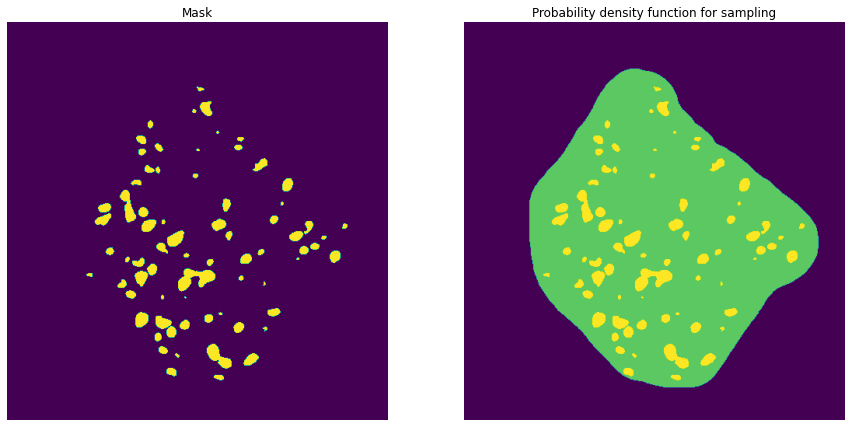

spleen3
Resizing PDF


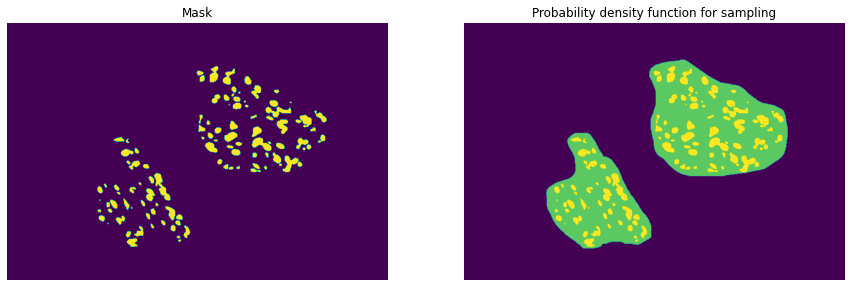

In [47]:
for idx in idxs:
    with open(path/f'{idx}_stroma.json') as f:
        shapes = json.load(f)
    all_pol = []
    all_pol2 = []
    for shape1 in shapes:
        shape = shape1['geometry']['coordinates']
        if len(shape)>1:
            shape =shape[0]
        shape_numpy = np.array(shape,dtype=object)
        shape_numpy = shape_numpy.squeeze()

        pol = Polygon(shape_numpy)
        if 'classification' in shape1['properties']:
            all_pol2.append(pol)
        else:
            all_pol.append(pol)

    all_polygons = MultiPolygon(all_pol)
    all_polygons2 = MultiPolygon(all_pol2)

    if not all_polygons.is_valid:
        all_polygons = all_polygons.buffer(0)
    # Sometimes buffer() converts a simple Multipolygon to just a Polygon,
    # need to keep it a Multi throughout
    if all_polygons.type == 'Polygon':
        all_polygons = MultiPolygon([all_polygons])
    if all_polygons2.type == 'Polygon':
        all_polygons2 = MultiPolygon([all_polygons2])

    im_size = dic_shape2[idx]
    msk = polygons_to_mask(all_polygons)
    msk_anatomy = polygons_to_mask(all_polygons2)
    
        # Plot
    fig, ax = plt.subplots(ncols=2, figsize=(15,15))
    resize_w = int((msk.shape[1]/msk.shape[0])*resize)
    ax[0].imshow(cv2.resize(msk, dsize=(resize_w, resize)))
    ax[0].set_title('Mask')
    ax[0].set_axis_off()

    anatomy=msk*1.0
    anatomy[msk_anatomy>0]=0.75
    anatomy[msk_anatomy==0]=0.01
    anatomy[msk>0]=1

    del msk_anatomy, all_polygons, all_polygons2
    gc.collect()


    # plt.imshow(cv2.resize(anatomy, dsize=(msk.shape[1]//10, msk.shape[0]//10)))


    gc.collect()
    
    print(idx)
    g_msk[idx] = msk
    del msk
    gc.collect()
    
    if resize:
        print('Resizing PDF')
    if anatomy.shape[0]>resize:
        resize_w = int((anatomy.shape[1]/anatomy.shape[0])*resize)
        anatomy = cv2.resize(anatomy[:].astype('float32'), dsize=(resize_w, resize))
        
    ax[1].imshow(anatomy)
    ax[1].set_title('Probability density function for sampling')
    ax[1].set_axis_off() 
    
    g_pdf[idx] = np.cumsum(anatomy/np.sum(anatomy))
    plt.show()

id                                                              10044
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1459676 77 1462675 82 1465674 87 1468673 92 14...
age                                                              37.0
sex                                                              Male
Name: 0, dtype: object
10044


/tmp/ipykernel_75/3651554055.py:6: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  exteriors = [int_coords(poly.exterior.coords) for poly in polygons]
/tmp/ipykernel_75/3651554055.py:7: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  interiors = [int_coords(pi.coords) for poly in polygons


Saving msk
Resizing PDF
Saving pdf cumsum


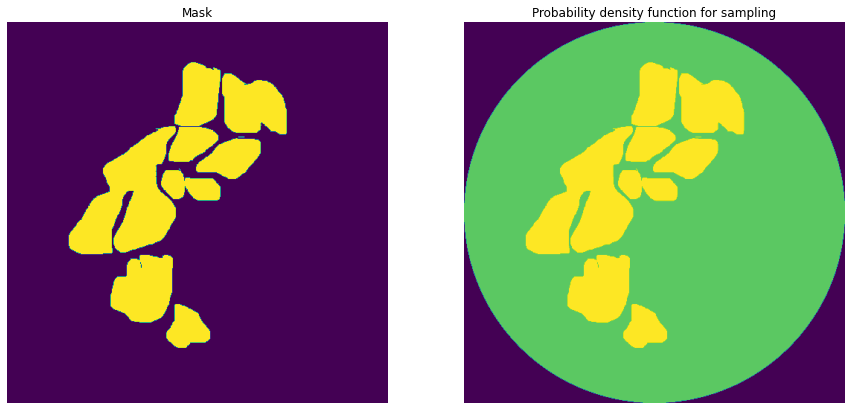

id                                                              10274
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 715707 2 718705 8 721703 11 724701 18 727692 3...
age                                                              76.0
sex                                                              Male
Name: 1, dtype: object
10274
Saving msk
Resizing PDF
Saving pdf cumsum


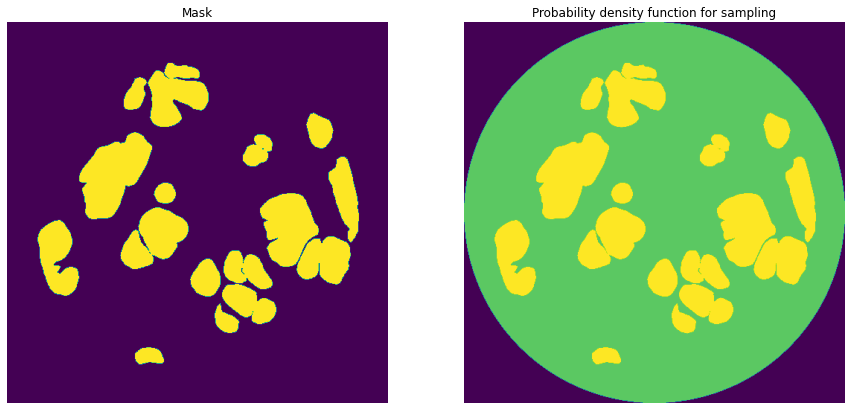

id                                                              10392
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1228631 20 1231629 24 1234624 40 1237623 47 12...
age                                                              82.0
sex                                                              Male
Name: 2, dtype: object
10392
Saving msk
Resizing PDF
Saving pdf cumsum


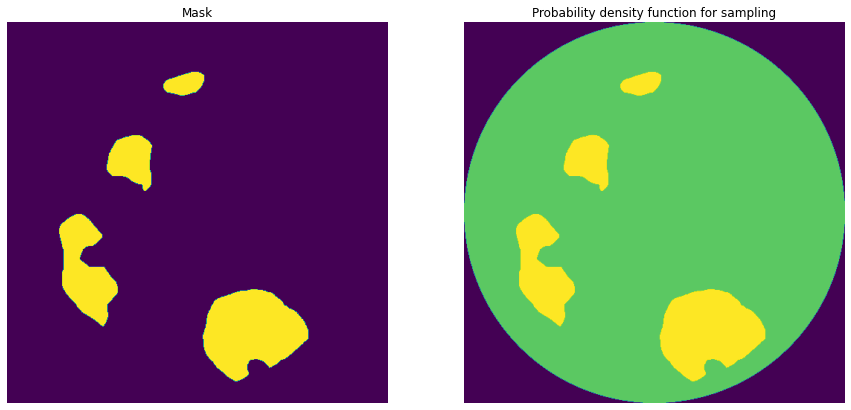

id                                                              10488
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3446519 15 3449517 17 3452514 20 3455510 24 34...
age                                                              78.0
sex                                                              Male
Name: 3, dtype: object
10488
Saving msk
Resizing PDF
Saving pdf cumsum


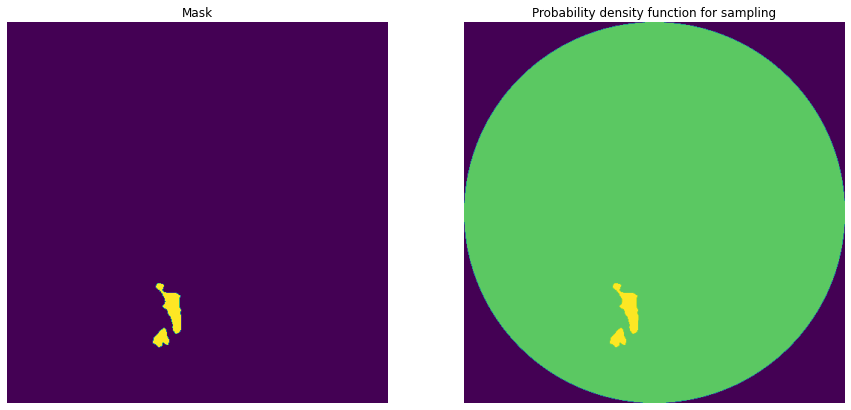

id                                                              10610
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 478925 68 481909 87 484893 105 487863 154 4908...
age                                                              21.0
sex                                                            Female
Name: 4, dtype: object
10610
Saving msk
Resizing PDF
Saving pdf cumsum


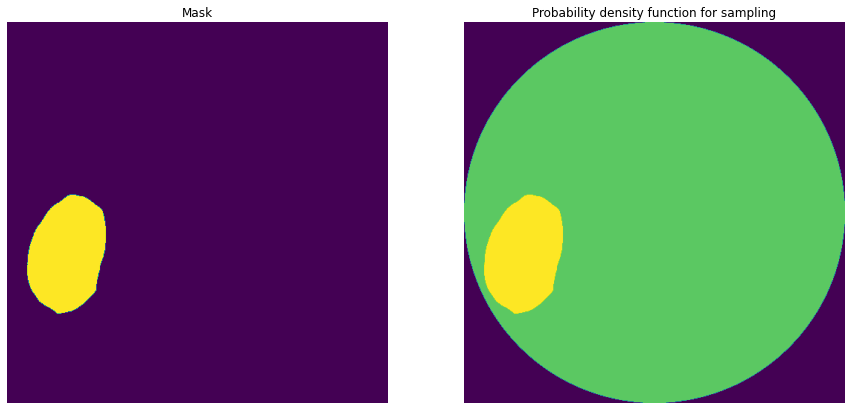

id                                                              10611
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 730193 18 733191 25 736191 25 739152 65 742149...
age                                                              68.0
sex                                                            Female
Name: 5, dtype: object
10611
Saving msk
Resizing PDF
Saving pdf cumsum


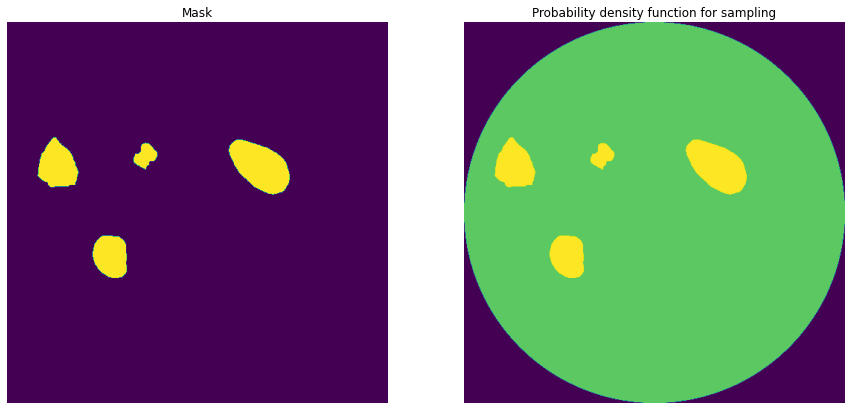

id                                                              10651
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1240229 12 1243227 15 1246223 26 1249221 29 12...
age                                                              83.0
sex                                                              Male
Name: 6, dtype: object
10651
Saving msk
Resizing PDF
Saving pdf cumsum


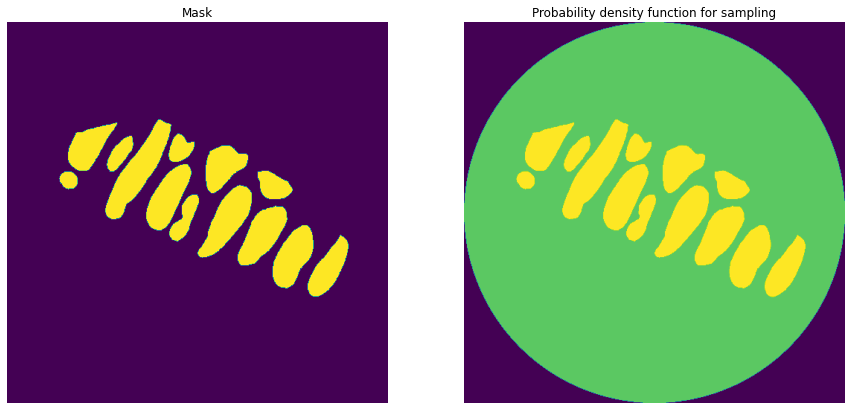

id                                                              10666
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2698231 7 2701231 7 2704226 16 2707221 25 2710...
age                                                              57.0
sex                                                              Male
Name: 7, dtype: object
10666
Saving msk
Resizing PDF
Saving pdf cumsum


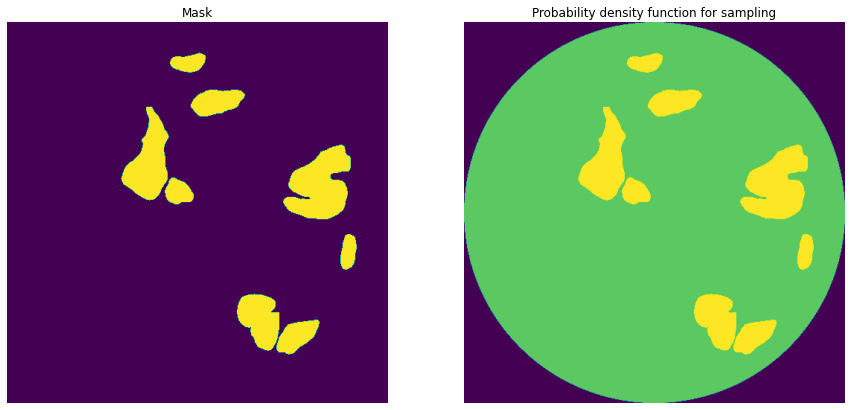

id                                                              10703
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 811259 262 814258 264 817257 266 820256 267 82...
age                                                              50.0
sex                                                            Female
Name: 8, dtype: object
10703
Saving msk
Resizing PDF
Saving pdf cumsum


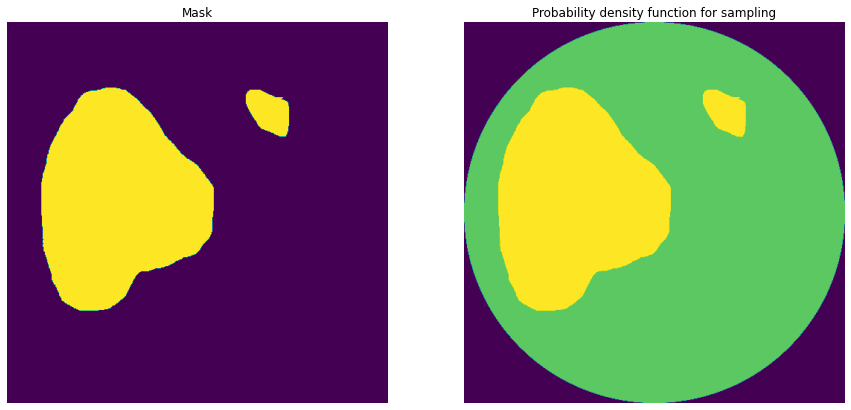

id                                                              10892
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 523786 3 526784 8 529782 8 532778 9 535642 25 ...
age                                                              79.0
sex                                                            Female
Name: 9, dtype: object
10892
Saving msk
Resizing PDF
Saving pdf cumsum


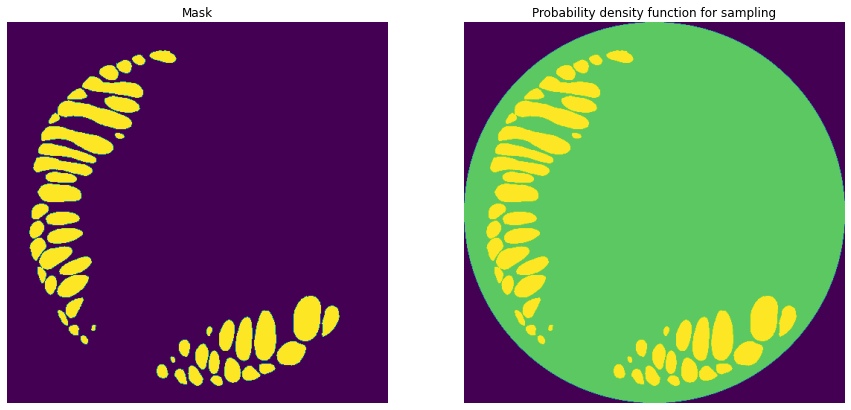

id                                                              10912
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1147323 50 1150316 59 1153309 68 1156303 76 11...
age                                                              60.0
sex                                                              Male
Name: 10, dtype: object
10912
Saving msk
Resizing PDF
Saving pdf cumsum


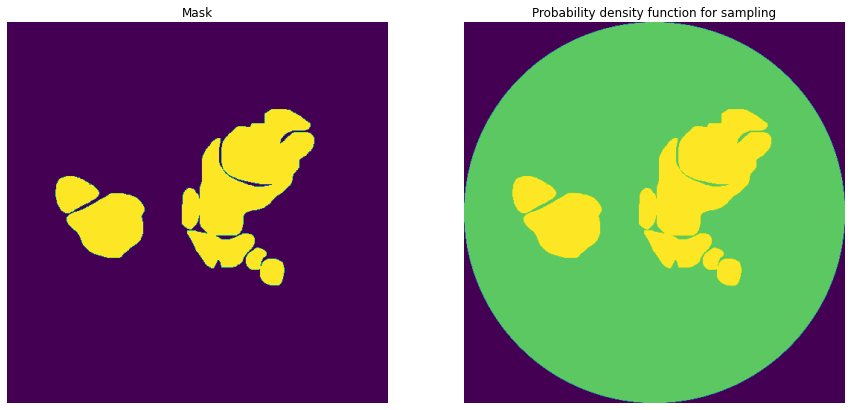

id                                                              10971
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1507862 60 1510857 69 1513853 77 1516848 86 15...
age                                                              60.0
sex                                                              Male
Name: 11, dtype: object
10971
Saving msk
Resizing PDF
Saving pdf cumsum


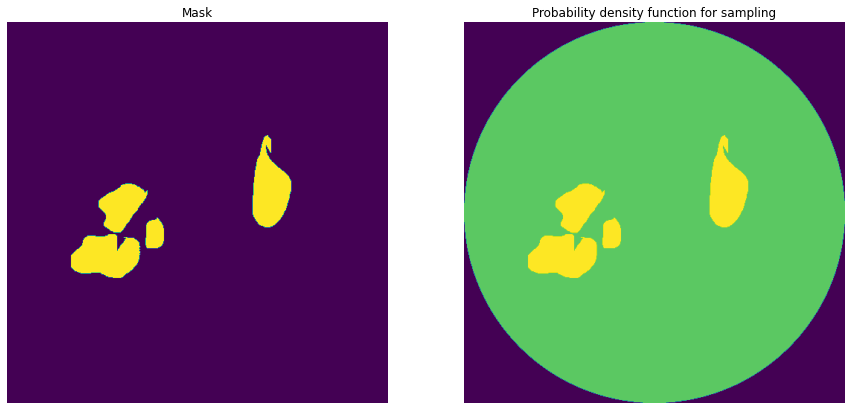

id                                                              10992
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2245542 37 2248540 41 2251534 53 2254533 55 22...
age                                                              74.0
sex                                                            Female
Name: 12, dtype: object
10992
Saving msk
Resizing PDF
Saving pdf cumsum


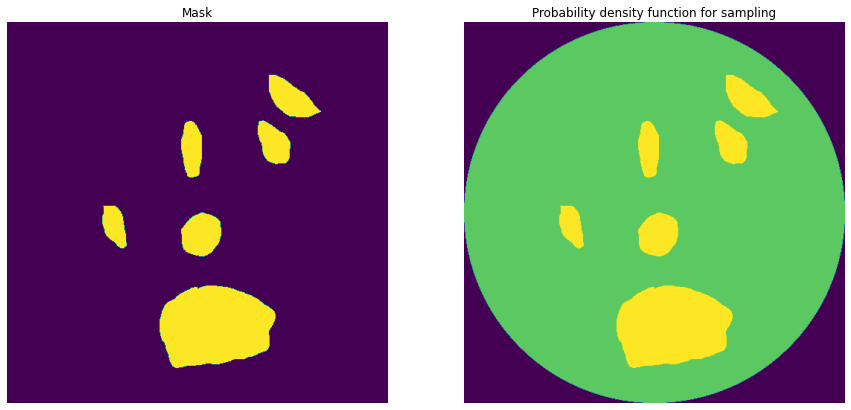

id                                                              11064
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2210040 68 2213039 70 2216036 74 2219032 79 22...
age                                                              65.0
sex                                                              Male
Name: 13, dtype: object
11064
Saving msk
Resizing PDF
Saving pdf cumsum


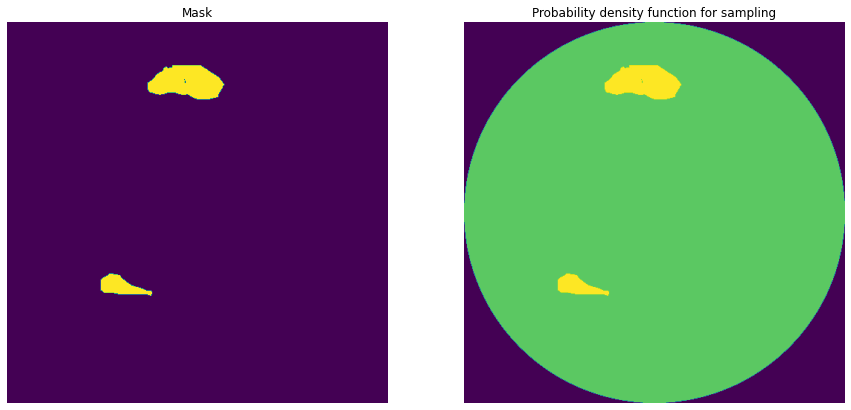

id                                                               1123
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2852439 100 2855436 106 2858434 110 2861421 13...
age                                                              21.0
sex                                                            Female
Name: 14, dtype: object
1123
Saving msk
Resizing PDF
Saving pdf cumsum


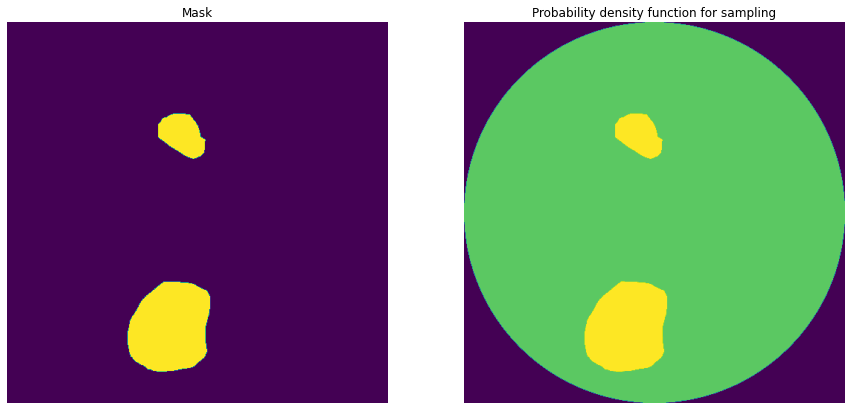

id                                                              11448
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3450282 28 3453278 33 3456272 53 3459271 56 34...
age                                                              21.0
sex                                                            Female
Name: 15, dtype: object
11448
Saving msk
Resizing PDF
Saving pdf cumsum


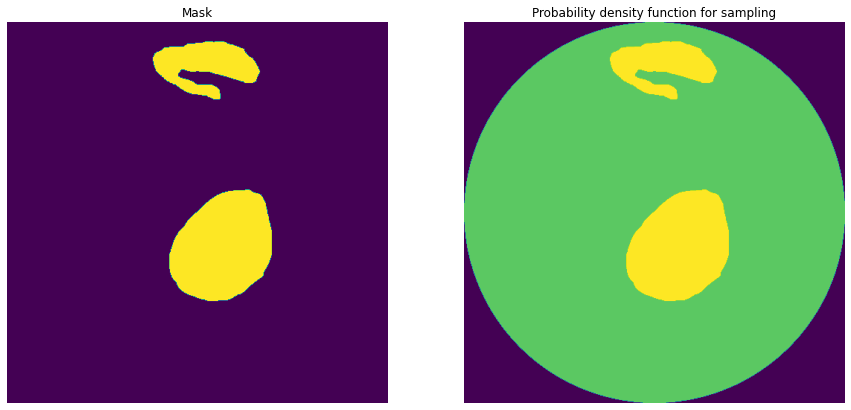

id                                                              11497
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 940436 51 943430 65 946427 76 949423 89 952417...
age                                                              41.0
sex                                                            Female
Name: 16, dtype: object
11497
Saving msk
Resizing PDF
Saving pdf cumsum


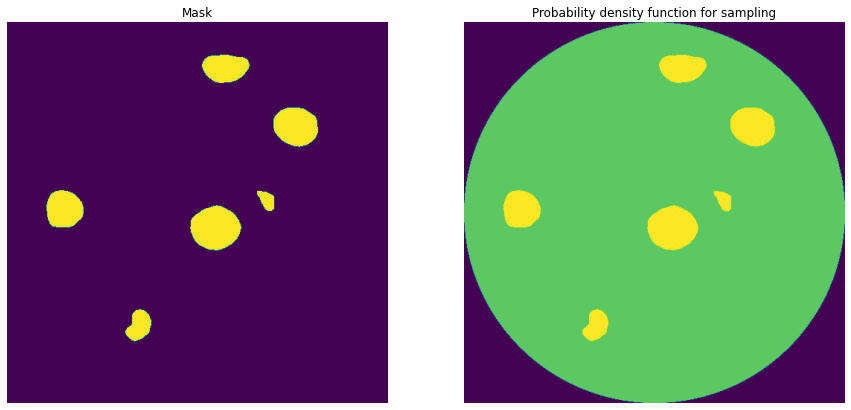

id                                                               1157
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4883571 15 4886565 32 4889561 41 4892559 49 48...
age                                                              73.0
sex                                                              Male
Name: 17, dtype: object
1157
Saving msk
Resizing PDF
Saving pdf cumsum


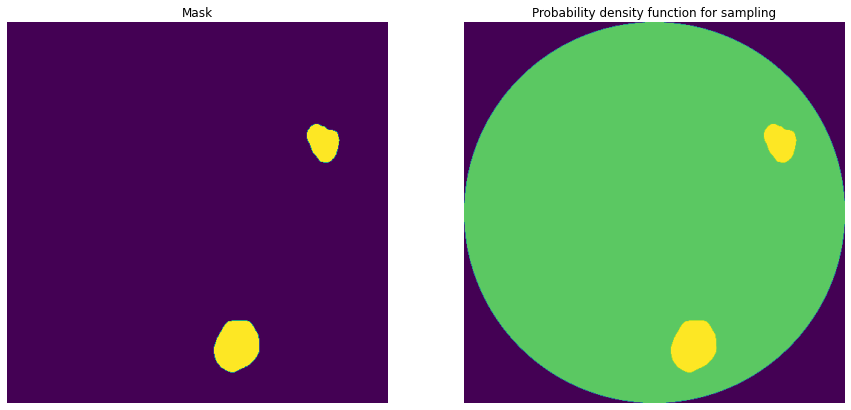

id                                                              11629
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4143554 1 4146554 2 4149554 3 4152555 3 415555...
age                                                              43.0
sex                                                            Female
Name: 18, dtype: object
11629
Saving msk
Resizing PDF
Saving pdf cumsum


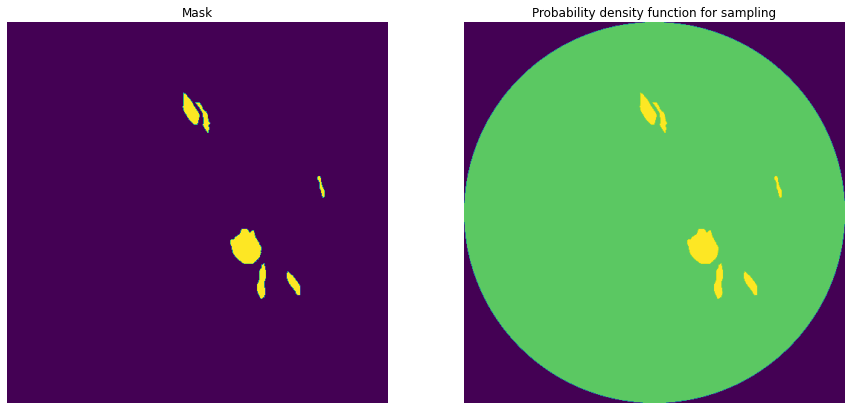

id                                                              11645
organ                                                          spleen
data_source                                                       HPA
img_height                                                       2867
img_width                                                        2867
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1971766 32 1974633 34 1977499 36 1980366 37 19...
age                                                              74.0
sex                                                            Female
Name: 19, dtype: object
11645
Saving msk
Resizing PDF
Saving pdf cumsum


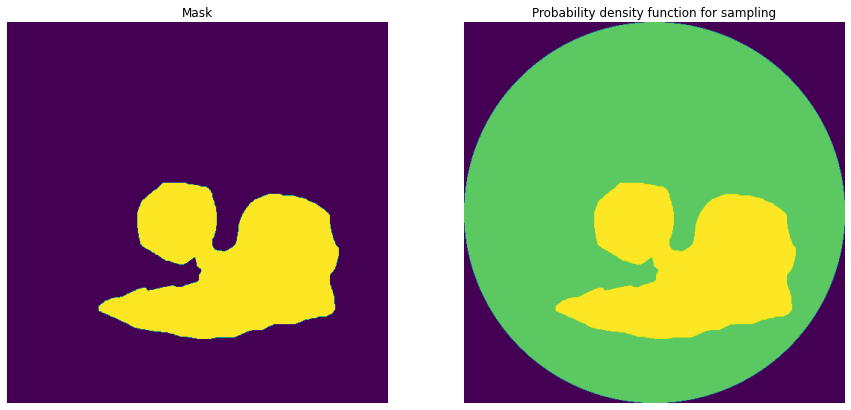

id                                                              11662
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 673655 29 676649 41 679645 47 682638 59 685636...
age                                                              84.0
sex                                                            Female
Name: 20, dtype: object
11662
Saving msk
Resizing PDF
Saving pdf cumsum


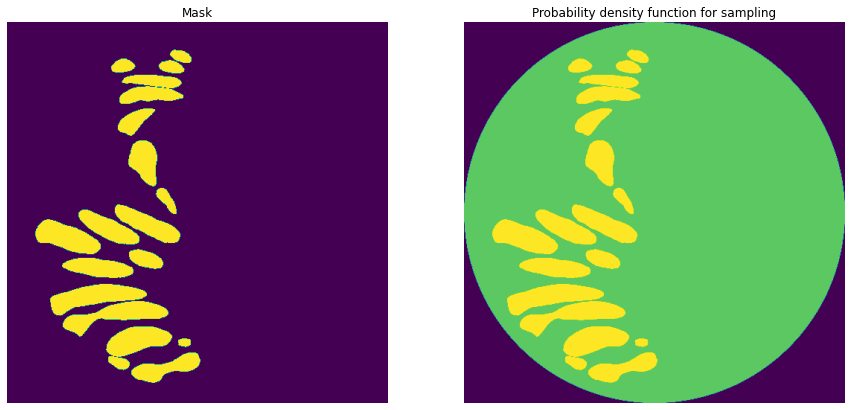

id                                                               1168
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 652348 27 655344 35 658310 79 661305 93 664303...
age                                                              84.0
sex                                                              Male
Name: 21, dtype: object
1168
Saving msk
Resizing PDF
Saving pdf cumsum


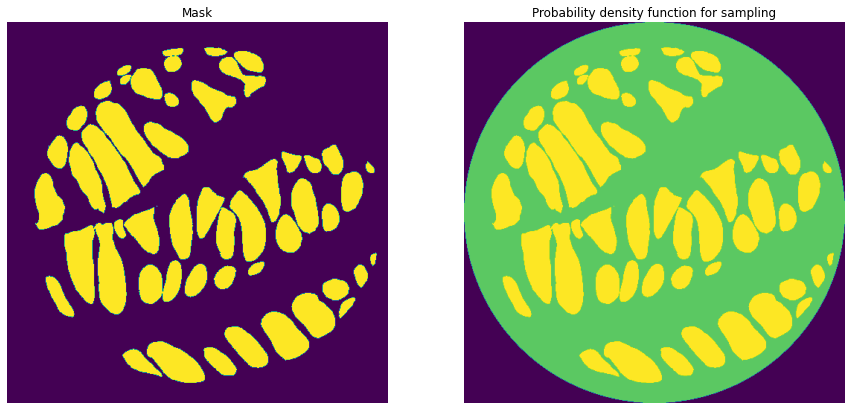

id                                                               1184
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1916384 12 1919383 15 1922378 26 1925376 29 19...
age                                                              60.0
sex                                                              Male
Name: 22, dtype: object
1184
Saving msk
Resizing PDF
Saving pdf cumsum


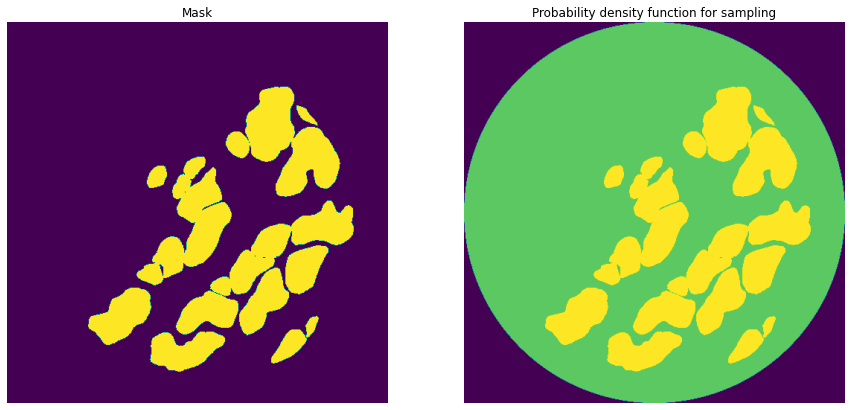

id                                                              11890
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1297230 32 1300222 46 1303215 60 1306213 63 13...
age                                                              79.0
sex                                                            Female
Name: 23, dtype: object
11890
Saving msk
Resizing PDF
Saving pdf cumsum


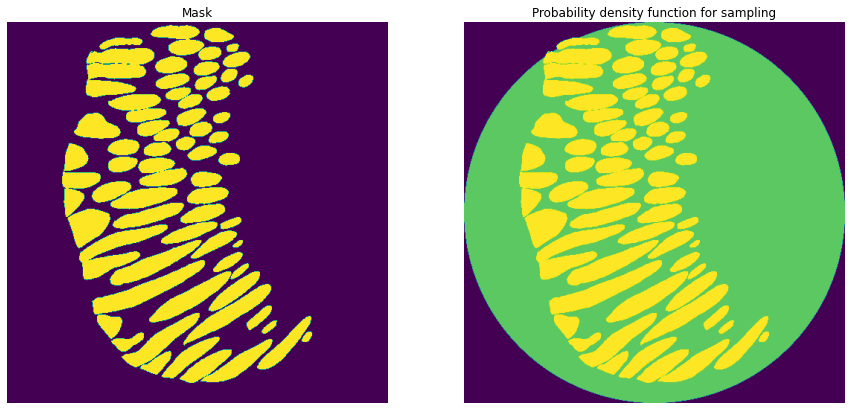

id                                                              12026
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 568261 32 571258 36 574256 38 577245 61 580243...
age                                                              57.0
sex                                                              Male
Name: 24, dtype: object
12026
Saving msk
Resizing PDF
Saving pdf cumsum


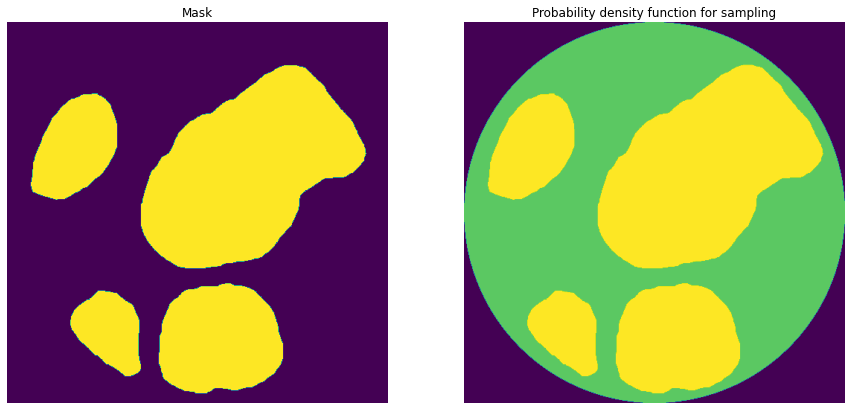

id                                                              12174
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 592530 6 595511 36 598506 43 601493 63 604487 ...
age                                                              83.0
sex                                                              Male
Name: 25, dtype: object
12174
Saving msk
Resizing PDF
Saving pdf cumsum


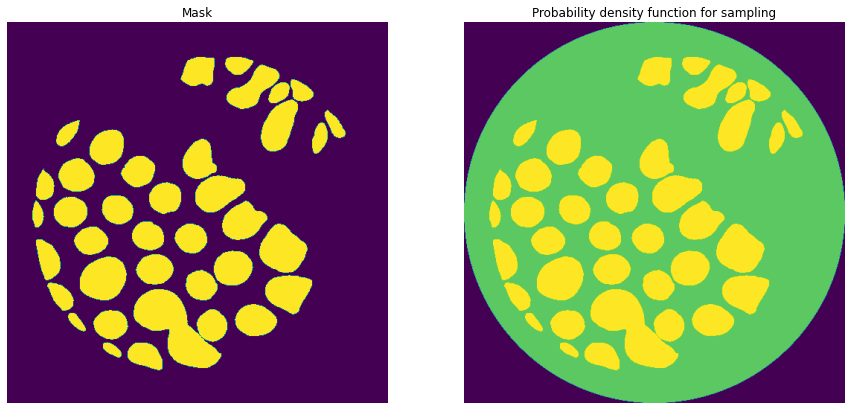

id                                                               1220
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1429797 16 1432793 21 1435791 23 1438789 27 14...
age                                                              59.0
sex                                                              Male
Name: 26, dtype: object
1220
Saving msk
Resizing PDF
Saving pdf cumsum


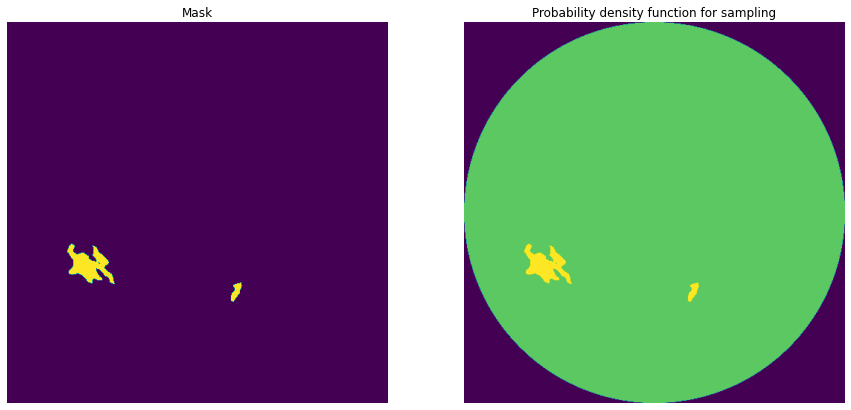

id                                                              12233
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 733853 11 736851 15 739841 44 742839 47 745790...
age                                                              55.0
sex                                                              Male
Name: 27, dtype: object
12233
Saving msk
Resizing PDF
Saving pdf cumsum


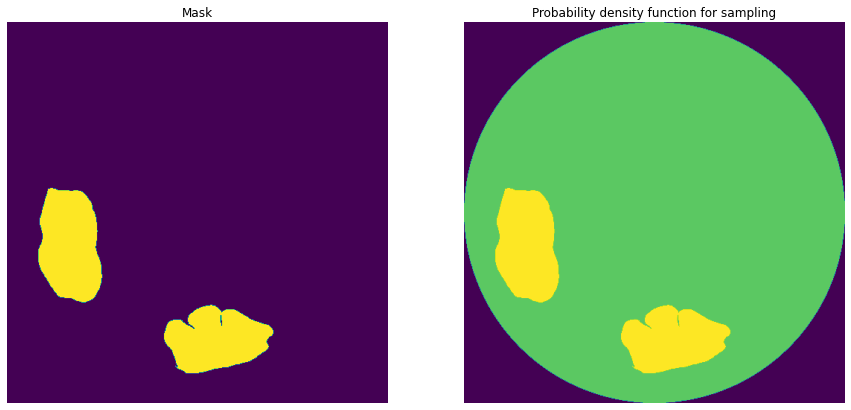

id                                                              12244
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1195159 3 1195187 56 1198157 7 1198185 59 1201...
age                                                              61.0
sex                                                              Male
Name: 28, dtype: object
12244
Saving msk
Resizing PDF
Saving pdf cumsum


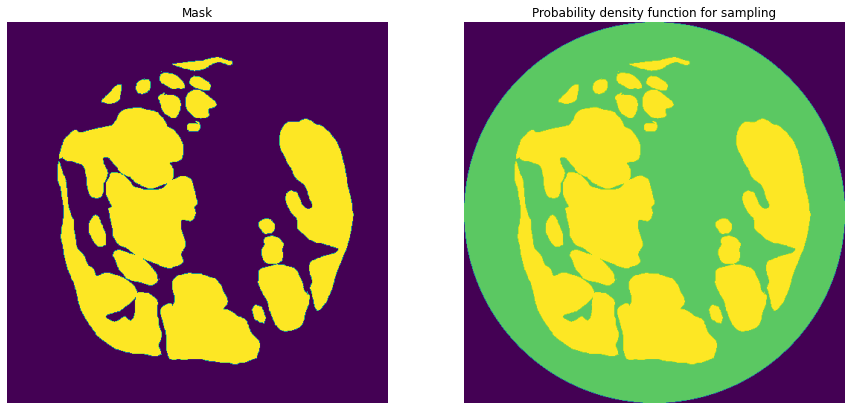

id                                                               1229
organ                                                        prostate
data_source                                                       HPA
img_height                                                       2654
img_width                                                        2654
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 229957 31 232610 33 235217 84 237869 87 240521...
age                                                              37.0
sex                                                              Male
Name: 29, dtype: object
1229
Saving msk
Resizing PDF
Saving pdf cumsum


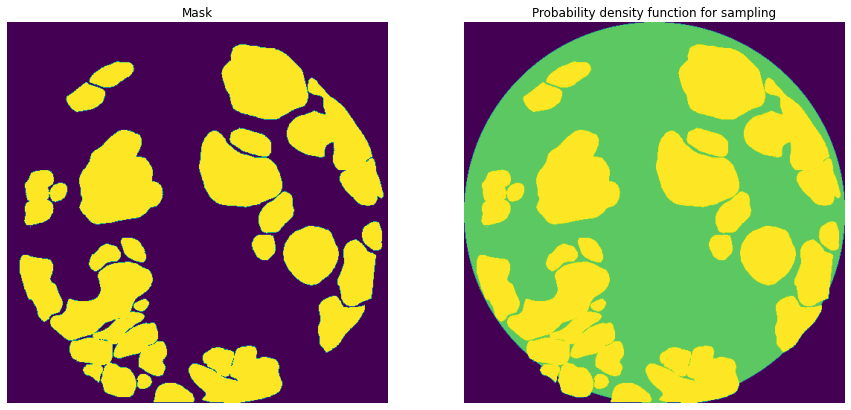

id                                                              12452
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4648688 22 4651675 37 4654675 39 4657670 48 46...
age                                                              78.0
sex                                                              Male
Name: 30, dtype: object
12452
Saving msk
Resizing PDF
Saving pdf cumsum


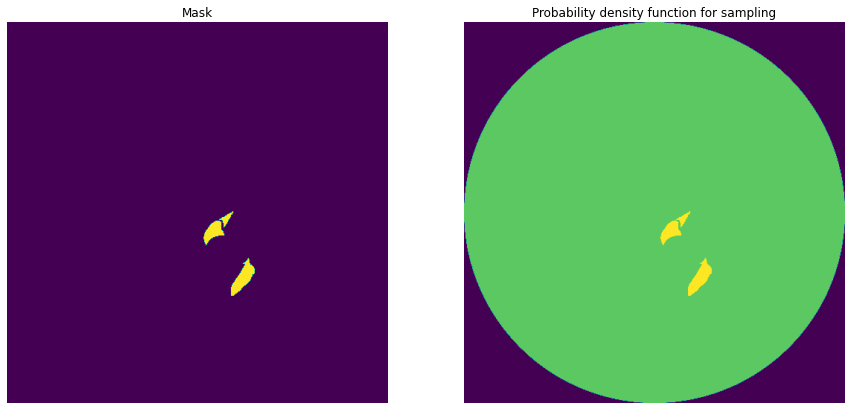

id                                                              12466
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 920222 4 923221 6 926221 6 929220 10 932218 14...
age                                                              74.0
sex                                                            Female
Name: 31, dtype: object
12466
Saving msk
Resizing PDF
Saving pdf cumsum


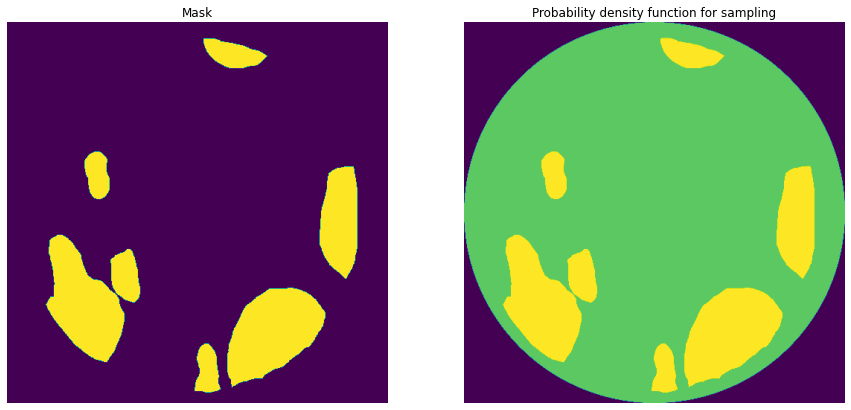

id                                                              12471
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 472548 109 475547 111 478539 2 478546 118 4815...
age                                                              84.0
sex                                                            Female
Name: 32, dtype: object
12471
Saving msk
Resizing PDF
Saving pdf cumsum


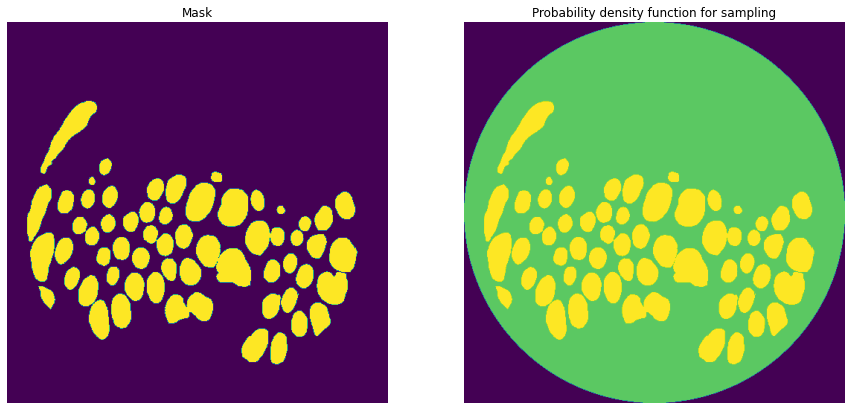

id                                                              12476
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2783561 23 2786559 26 2789558 28 2792556 31 27...
age                                                              21.0
sex                                                              Male
Name: 33, dtype: object
12476
Saving msk
Resizing PDF
Saving pdf cumsum


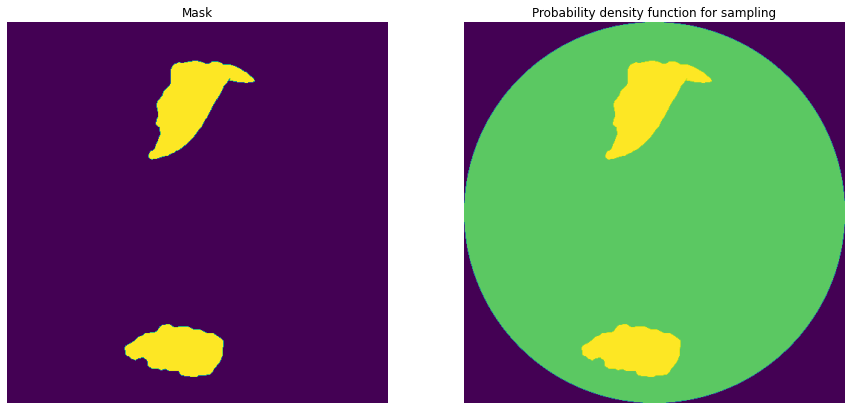

id                                                              12483
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3358269 61 3361268 64 3364267 67 3367247 89 33...
age                                                              72.0
sex                                                              Male
Name: 34, dtype: object
12483
Saving msk
Resizing PDF
Saving pdf cumsum


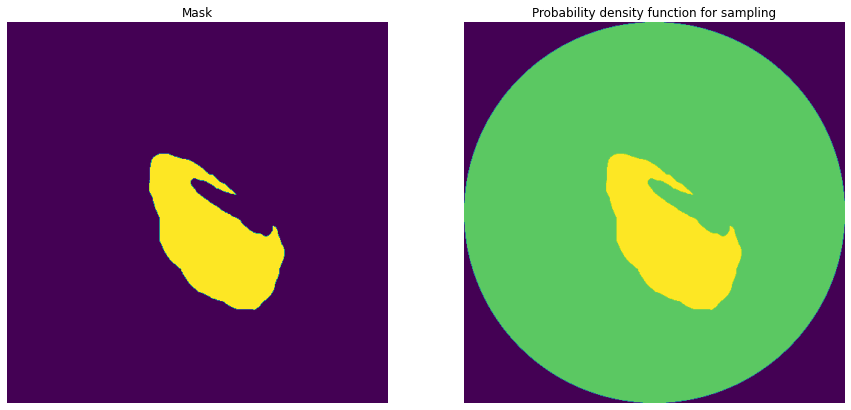

id                                                                127
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4237495 6 4240494 9 4243491 14 4246490 17 4249...
age                                                              21.0
sex                                                              Male
Name: 35, dtype: object
127
Saving msk
Resizing PDF
Saving pdf cumsum


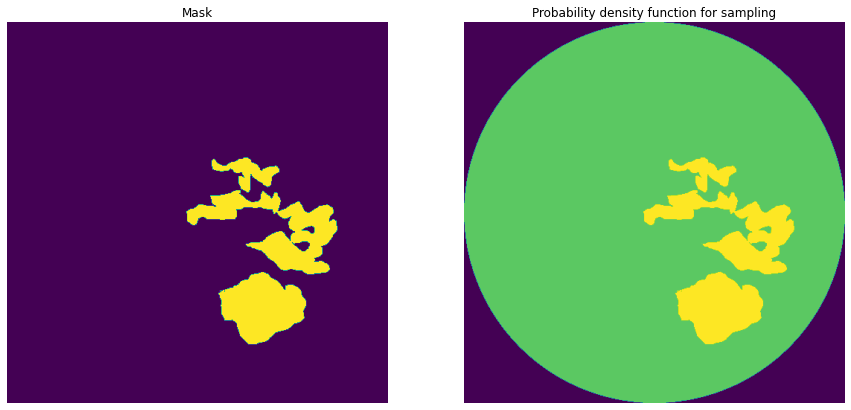

id                                                              12784
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2727
img_width                                                        2727
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2286990 33 2289716 37 2292442 39 2295167 41 22...
age                                                              61.0
sex                                                              Male
Name: 36, dtype: object
12784
Saving msk
Resizing PDF
Saving pdf cumsum


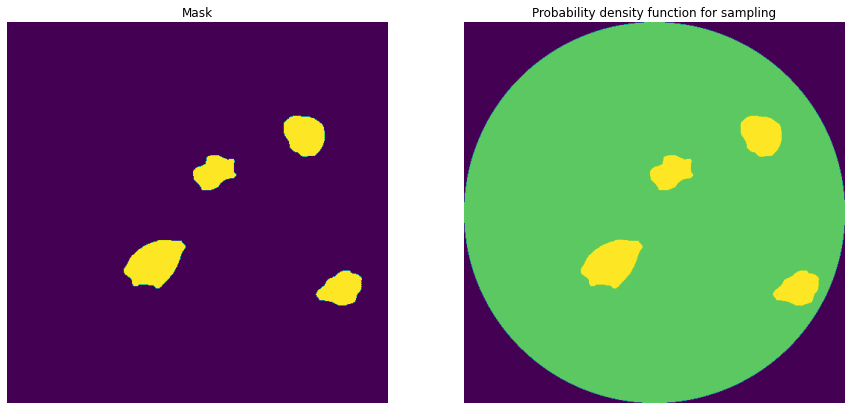

id                                                              12827
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3210652 9 3213650 16 3216647 21 3219645 24 322...
age                                                              57.0
sex                                                            Female
Name: 37, dtype: object
12827
Saving msk
Resizing PDF
Saving pdf cumsum


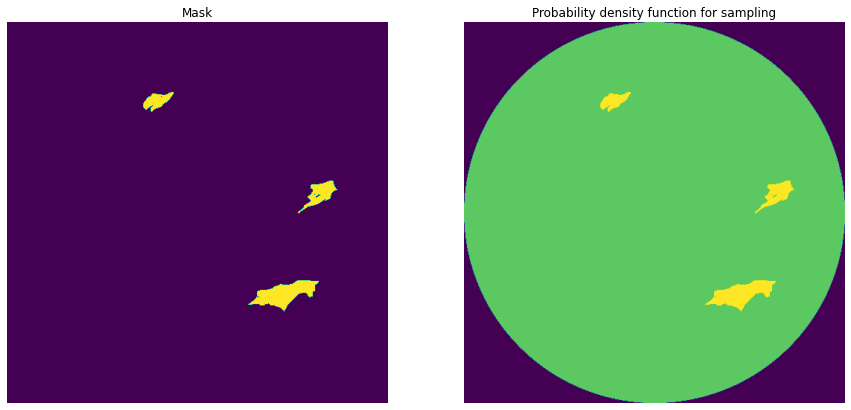

id                                                              13034
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 850253 18 853250 24 856245 32 859237 46 862233...
age                                                              73.0
sex                                                              Male
Name: 38, dtype: object
13034
Saving msk
Resizing PDF
Saving pdf cumsum


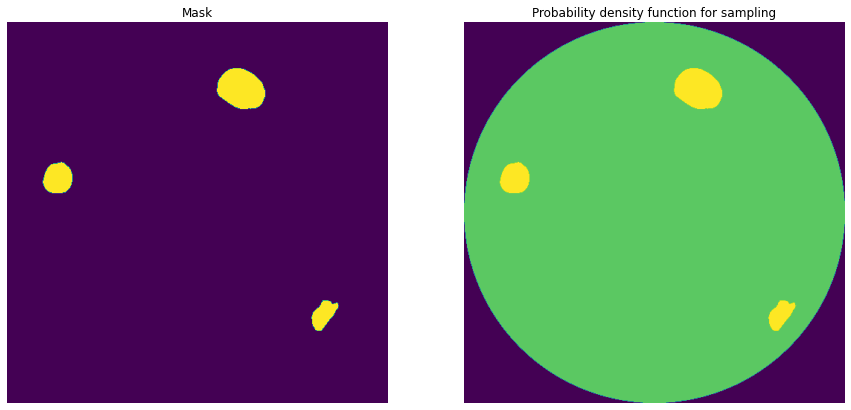

id                                                              13189
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1844328 7 1847327 10 1850270 27 1850326 13 185...
age                                                              21.0
sex                                                              Male
Name: 39, dtype: object
13189
Saving msk
Resizing PDF
Saving pdf cumsum


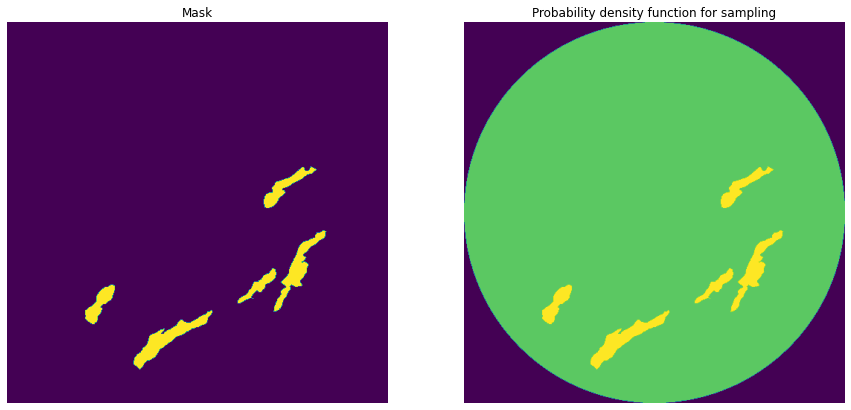

id                                                              13260
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 739668 19 742661 30 745657 37 748653 45 751649...
age                                                              68.0
sex                                                            Female
Name: 40, dtype: object
13260
Saving msk
Resizing PDF
Saving pdf cumsum


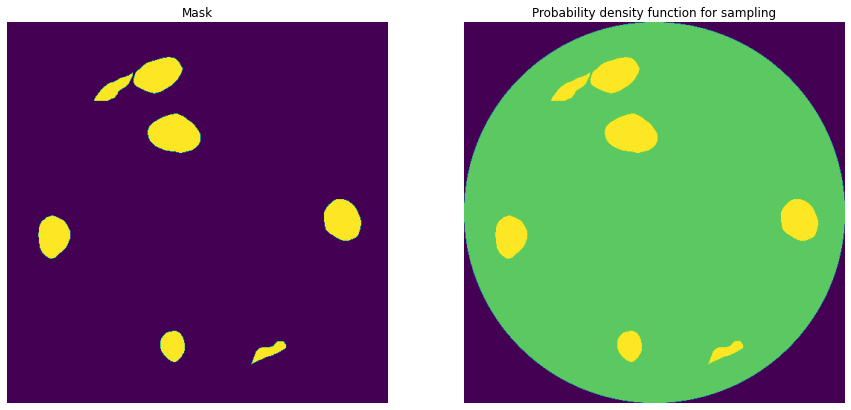

id                                                              13396
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1306024 34 1309000 2 1309015 50 1311998 6 1312...
age                                                              83.0
sex                                                              Male
Name: 41, dtype: object
13396
Saving msk
Resizing PDF
Saving pdf cumsum


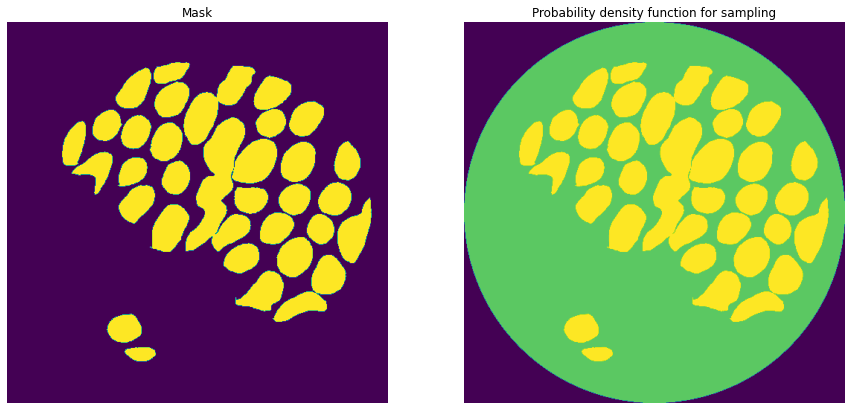

id                                                              13483
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1291312 12 1294311 14 1297252 79 1300251 81 13...
age                                                              76.0
sex                                                              Male
Name: 42, dtype: object
13483
Saving msk
Resizing PDF
Saving pdf cumsum


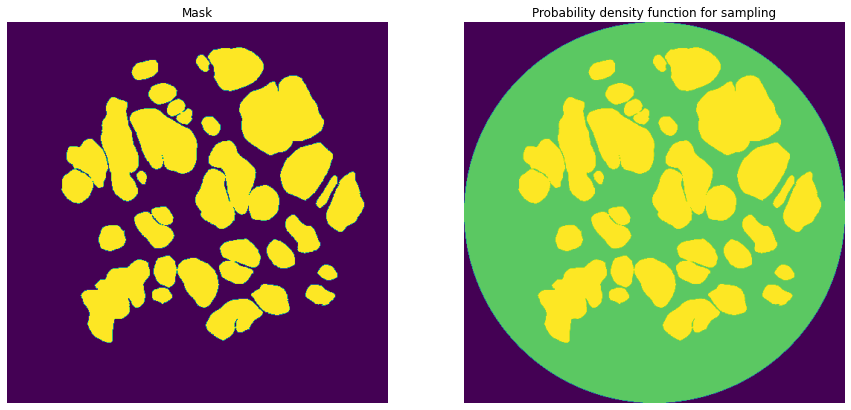

id                                                              13507
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 781338 33 784331 46 787329 56 790327 60 793324...
age                                                              83.0
sex                                                              Male
Name: 43, dtype: object
13507
Saving msk
Resizing PDF
Saving pdf cumsum


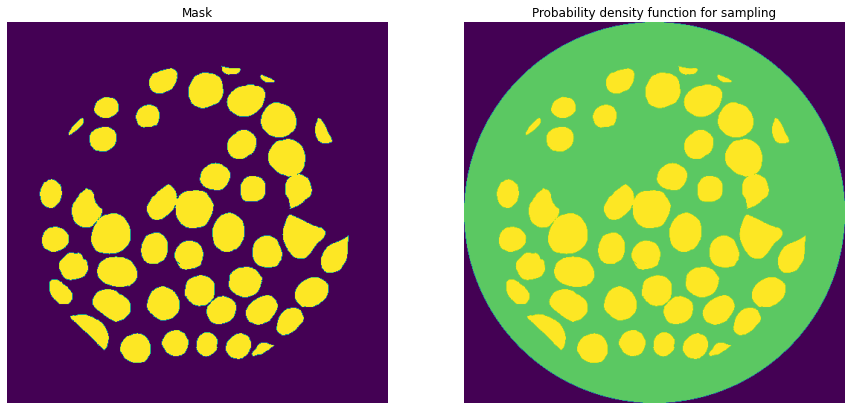

id                                                              13942
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 6428566 31 6431565 34 6434565 36 6437554 52 64...
age                                                              57.0
sex                                                              Male
Name: 44, dtype: object
13942
Saving msk
Resizing PDF
Saving pdf cumsum


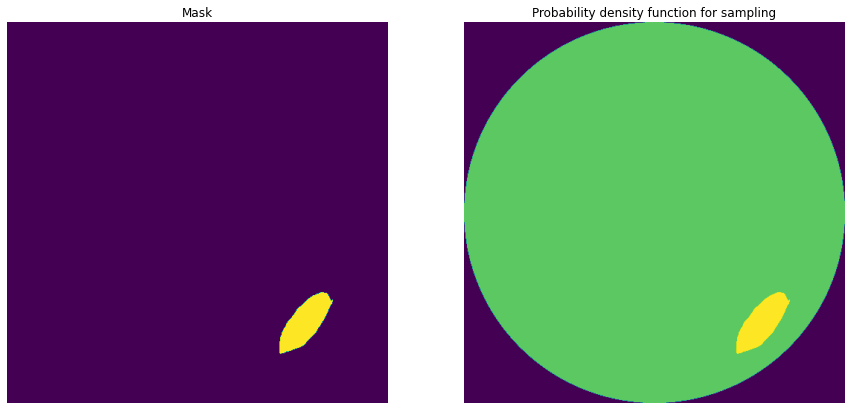

id                                                              14183
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 214358 9 214393 17 217355 14 217383 39 220354 ...
age                                                              65.0
sex                                                            Female
Name: 45, dtype: object
14183
Saving msk
Resizing PDF
Saving pdf cumsum


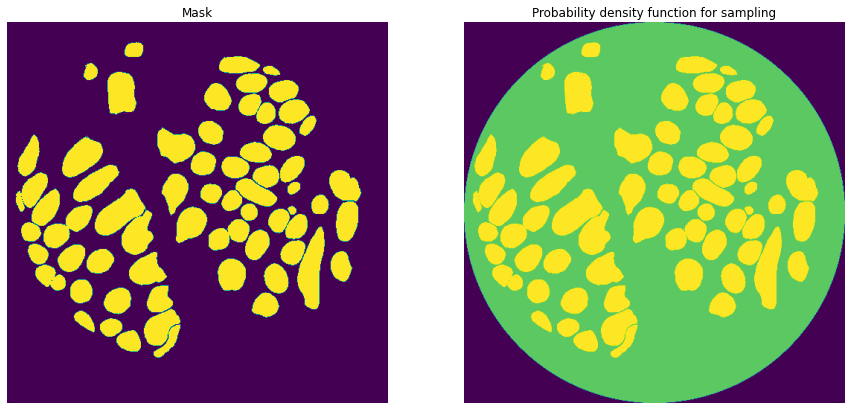

id                                                              14388
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2059356 15 2062356 16 2065352 25 2068350 29 20...
age                                                              78.0
sex                                                              Male
Name: 46, dtype: object
14388
Saving msk
Resizing PDF
Saving pdf cumsum


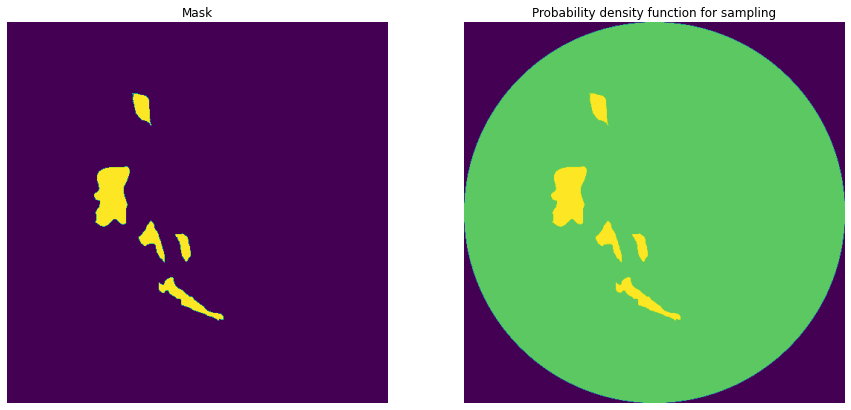

id                                                              14396
organ                                                        prostate
data_source                                                       HPA
img_height                                                       2680
img_width                                                        2680
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 566690 17 569361 28 572034 37 574713 48 577390...
age                                                              76.0
sex                                                              Male
Name: 47, dtype: object
14396
Saving msk
Resizing PDF
Saving pdf cumsum


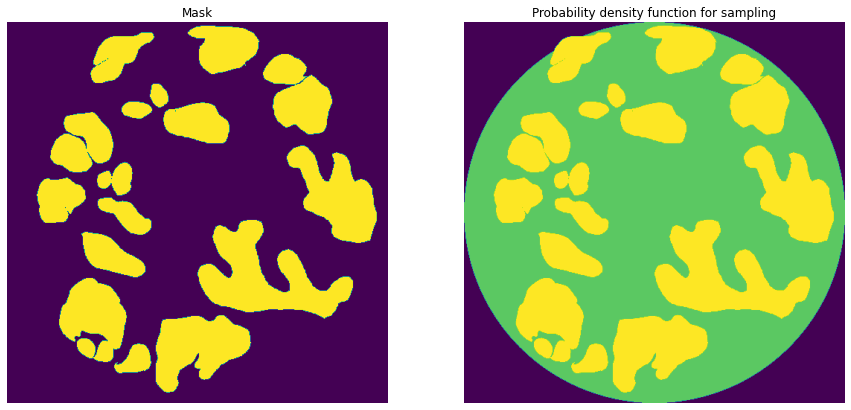

id                                                                144
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1273039 14 1276037 18 1279035 23 1282034 26 12...
age                                                              50.0
sex                                                            Female
Name: 48, dtype: object
144
Saving msk
Resizing PDF
Saving pdf cumsum


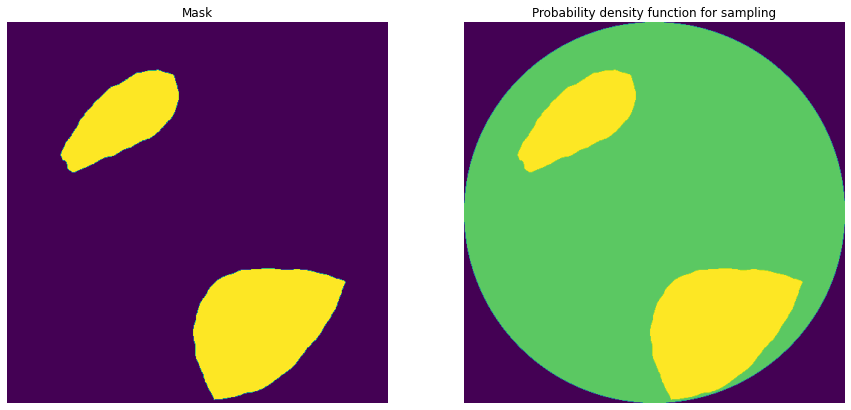

id                                                              14407
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 793507 32 796499 46 799498 49 802486 69 805485...
age                                                              37.0
sex                                                              Male
Name: 49, dtype: object
14407
Saving msk
Resizing PDF
Saving pdf cumsum


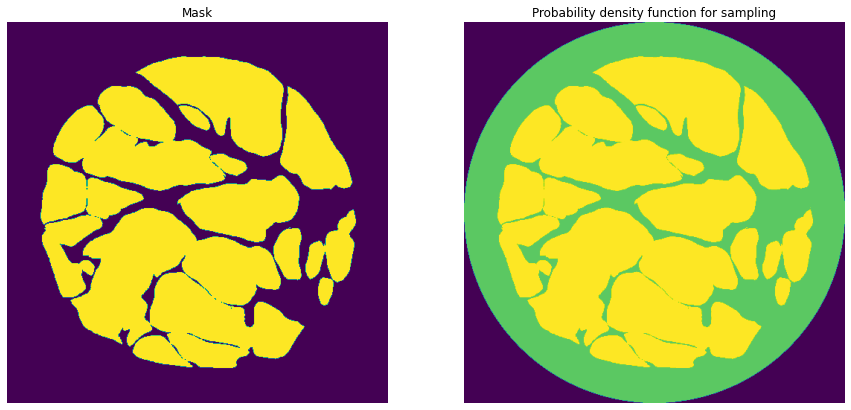

id                                                              14674
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1428727 8 1431725 12 1434723 31 1437721 35 144...
age                                                              83.0
sex                                                              Male
Name: 50, dtype: object
14674
Saving msk
Resizing PDF
Saving pdf cumsum


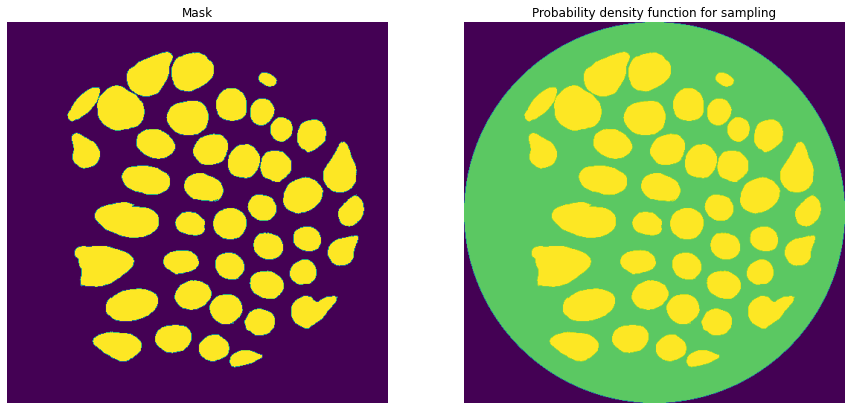

id                                                              14756
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2539
img_width                                                        2539
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1922351 13 1924886 54 1927424 56 1929963 57 19...
age                                                              41.0
sex                                                            Female
Name: 51, dtype: object
14756
Saving msk
Resizing PDF
Saving pdf cumsum


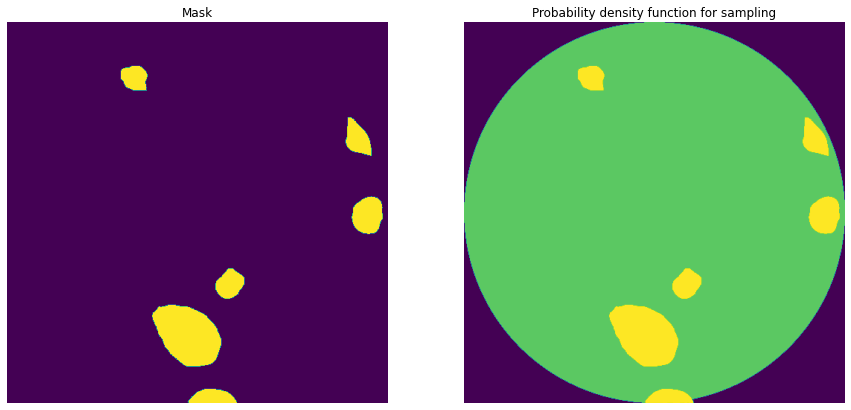

id                                                               1500
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 835516 11 838514 15 841509 94 844506 105 84750...
age                                                              60.0
sex                                                              Male
Name: 52, dtype: object
1500
Saving msk
Resizing PDF
Saving pdf cumsum


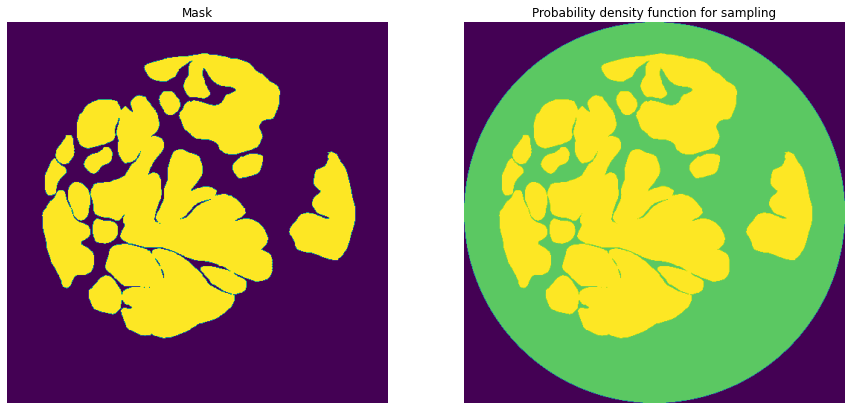

id                                                              15005
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4369486 20 4372484 28 4375480 36 4378476 43 43...
age                                                              59.0
sex                                                              Male
Name: 53, dtype: object
15005
Saving msk
Resizing PDF
Saving pdf cumsum


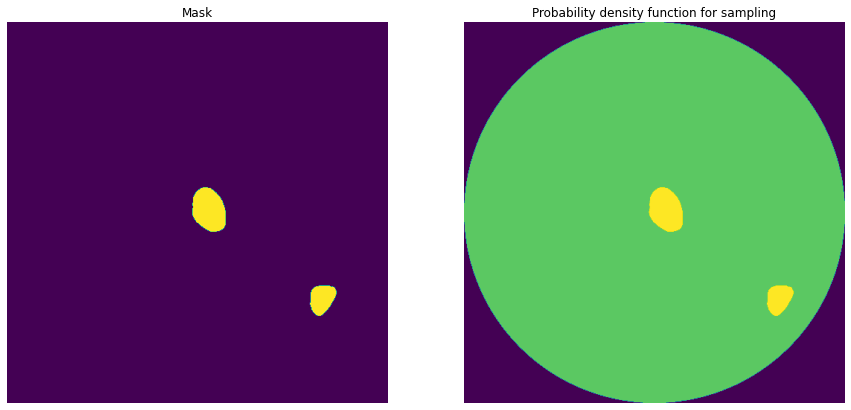

id                                                              15067
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2154895 37 2157897 38 2160900 38 2163901 39 21...
age                                                              67.0
sex                                                            Female
Name: 54, dtype: object
15067
Saving msk
Resizing PDF
Saving pdf cumsum


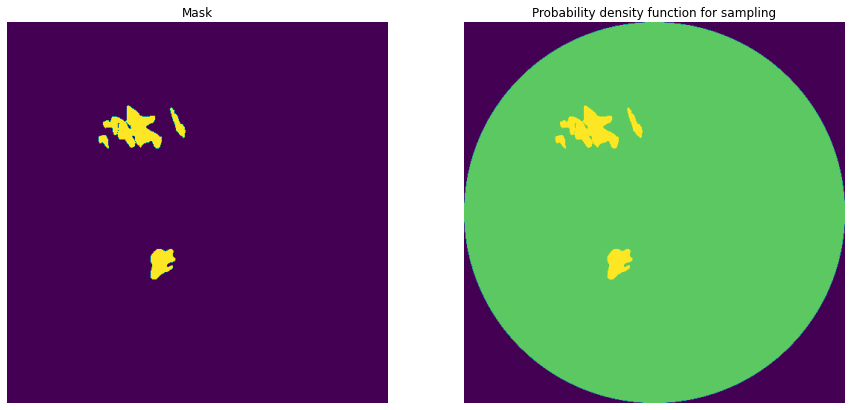

id                                                              15124
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4953985 7 4956981 13 4959977 18 4962975 21 496...
age                                                              57.0
sex                                                            Female
Name: 55, dtype: object
15124
Saving msk
Resizing PDF
Saving pdf cumsum


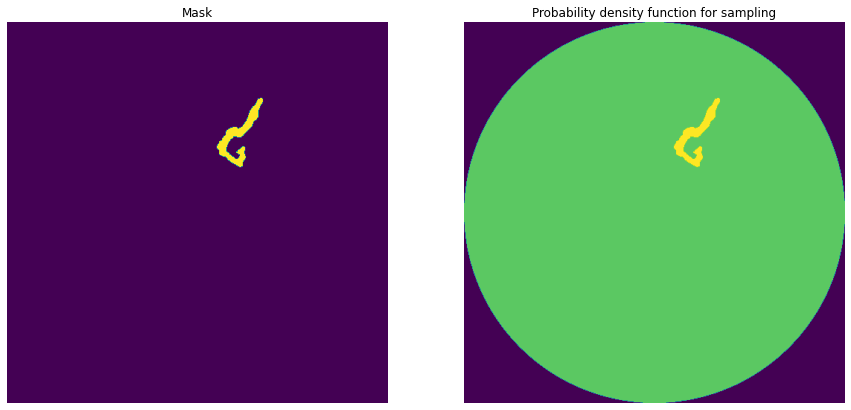

id                                                              15192
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2756460 13 2756510 19 2759454 26 2759502 31 27...
age                                                              28.0
sex                                                              Male
Name: 56, dtype: object
15192
Saving msk
Resizing PDF
Saving pdf cumsum


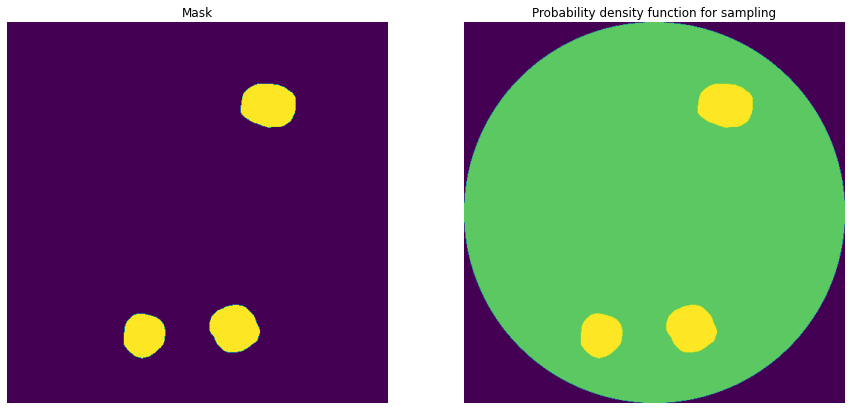

id                                                              15329
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2585550 2 2588549 4 2591547 7 2594546 10 25975...
age                                                              43.0
sex                                                            Female
Name: 57, dtype: object
15329
Saving msk
Resizing PDF
Saving pdf cumsum


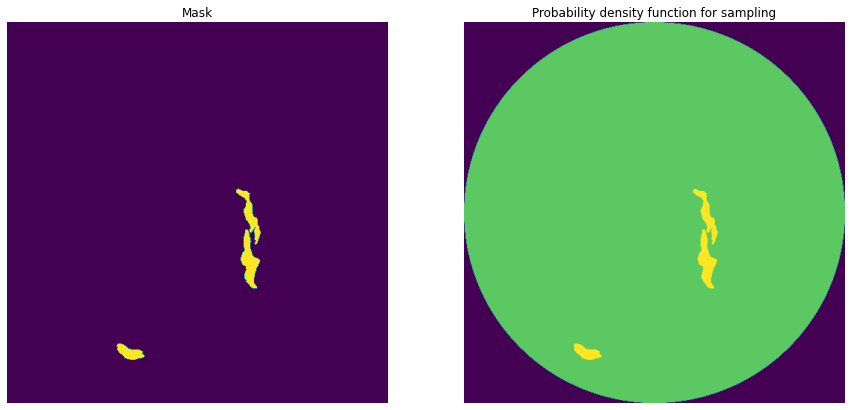

id                                                              15499
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 904598 3 907598 7 910599 10 913599 14 916599 1...
age                                                              84.0
sex                                                              Male
Name: 58, dtype: object
15499
Saving msk
Resizing PDF
Saving pdf cumsum


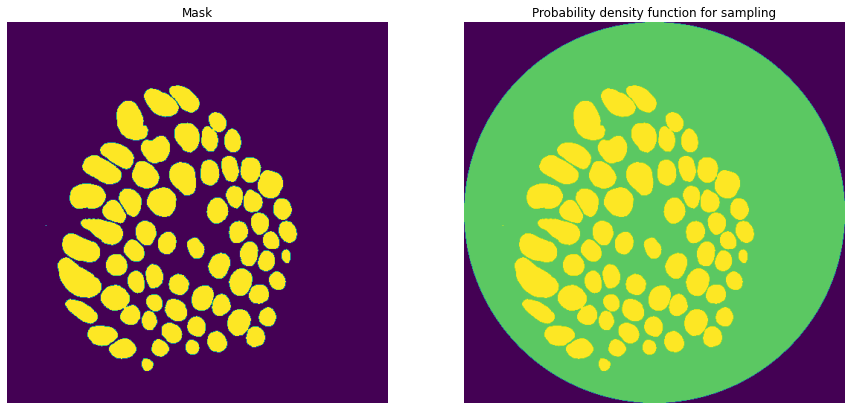

id                                                              15551
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2235560 16 2238559 18 2241558 20 2244544 35 22...
age                                                              74.0
sex                                                            Female
Name: 59, dtype: object
15551
Saving msk
Resizing PDF
Saving pdf cumsum


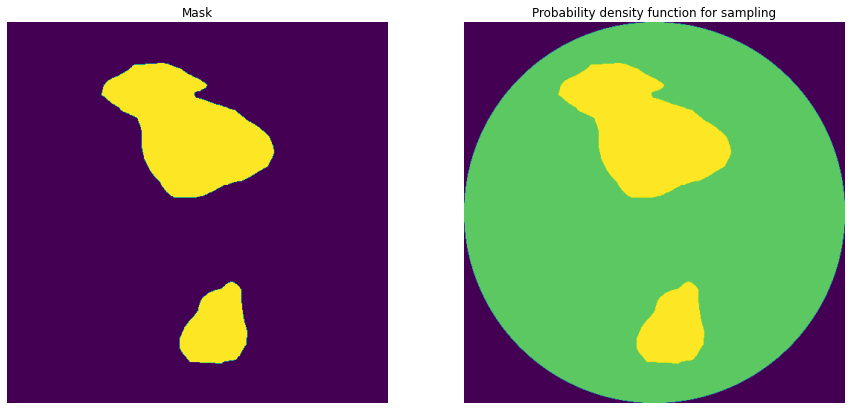

id                                                              15706
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 910412 30 913410 34 916282 38 916397 49 919280...
age                                                              61.0
sex                                                              Male
Name: 60, dtype: object
15706
Saving msk
Resizing PDF
Saving pdf cumsum


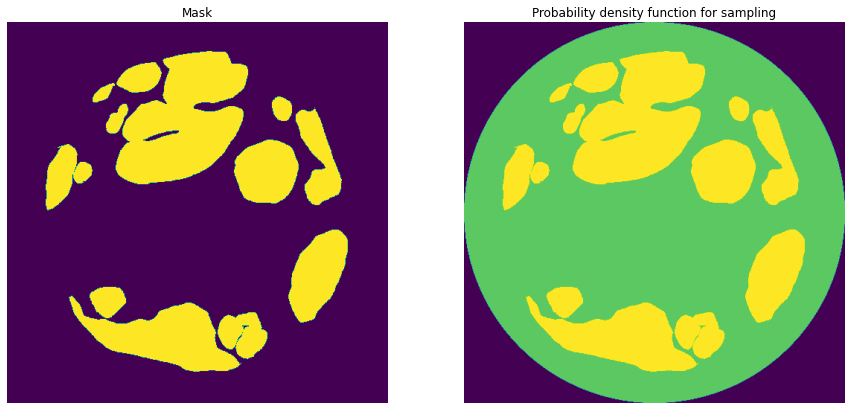

id                                                              15732
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3056427 36 3059426 39 3062425 42 3065400 68 30...
age                                                              48.0
sex                                                              Male
Name: 61, dtype: object
15732
Saving msk
Resizing PDF
Saving pdf cumsum


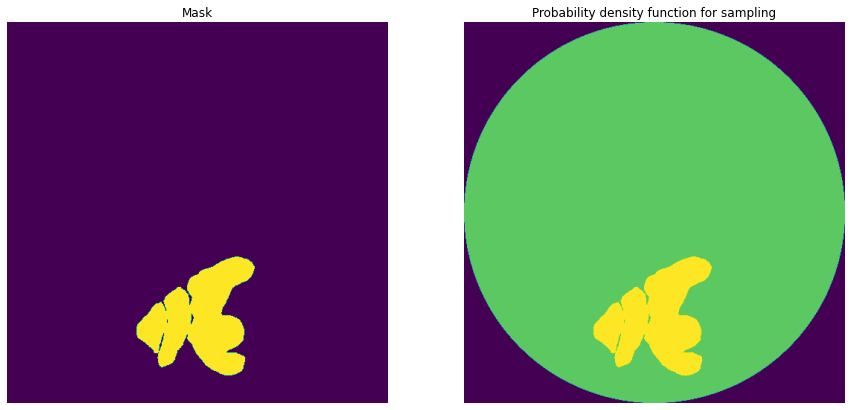

id                                                              15787
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1776723 16 1779722 17 1782722 17 1785717 23 17...
age                                                              68.0
sex                                                            Female
Name: 62, dtype: object
15787
Saving msk
Resizing PDF
Saving pdf cumsum


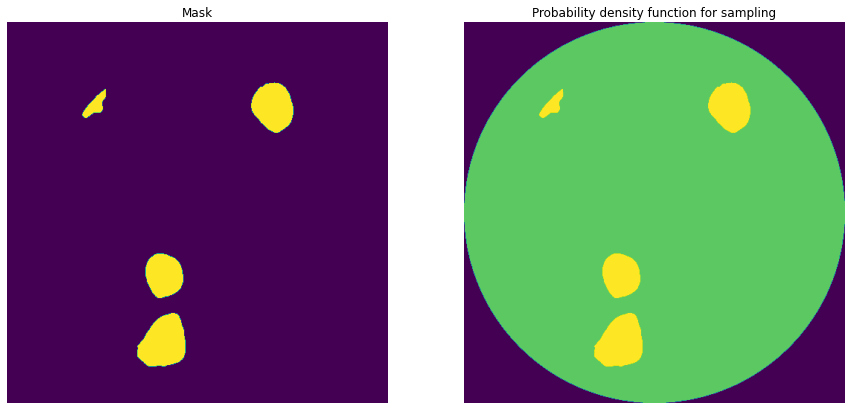

id                                                              15842
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2277796 26 2280794 32 2283791 39 2286786 47 22...
age                                                              83.0
sex                                                              Male
Name: 63, dtype: object
15842
Saving msk
Resizing PDF
Saving pdf cumsum


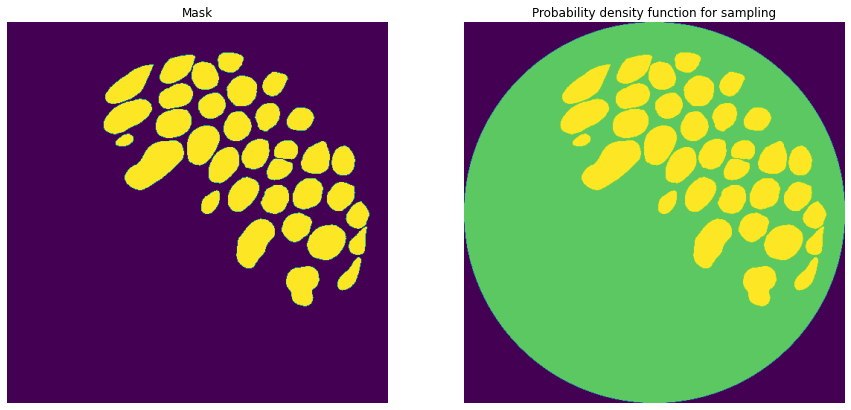

id                                                              15860
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2631
img_width                                                        2631
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 272540 19 275164 32 277789 2 277793 44 280414 ...
age                                                              70.0
sex                                                              Male
Name: 64, dtype: object
15860
Saving msk
Resizing PDF
Saving pdf cumsum


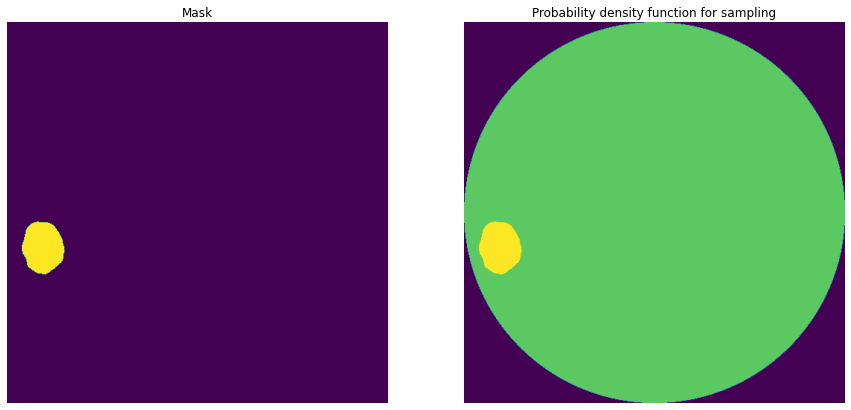

id                                                              16149
organ                                                        prostate
data_source                                                       HPA
img_height                                                       2790
img_width                                                        2790
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2936787 51 2939575 55 2942336 112 2945125 114 ...
age                                                              60.0
sex                                                              Male
Name: 65, dtype: object
16149
Saving msk
Resizing PDF
Saving pdf cumsum


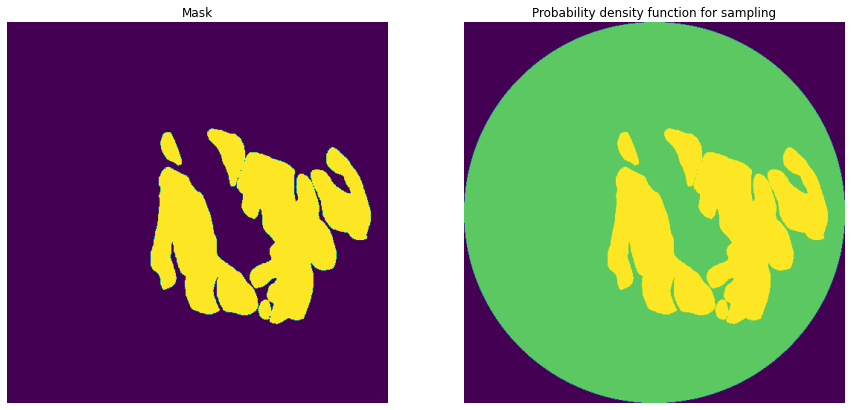

id                                                              16163
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 913140 8 916132 22 919128 32 922124 43 925120 ...
age                                                              61.0
sex                                                              Male
Name: 66, dtype: object
16163
Saving msk
Resizing PDF
Saving pdf cumsum


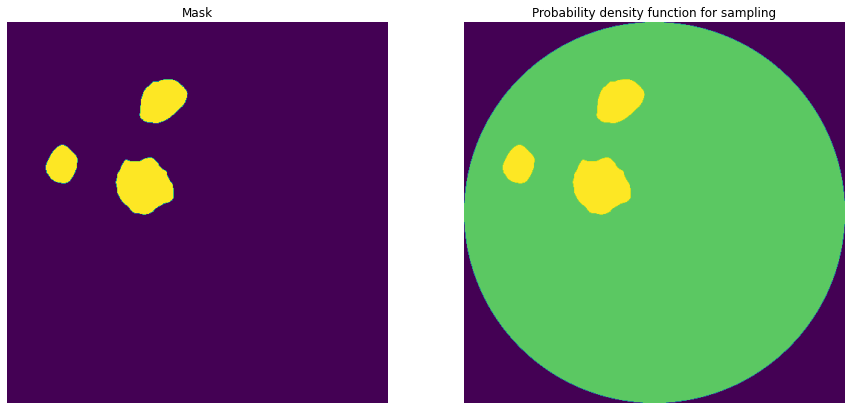

id                                                              16214
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1096058 41 1099051 51 1102049 53 1105047 55 11...
age                                                              68.0
sex                                                            Female
Name: 67, dtype: object
16214
Saving msk
Resizing PDF
Saving pdf cumsum


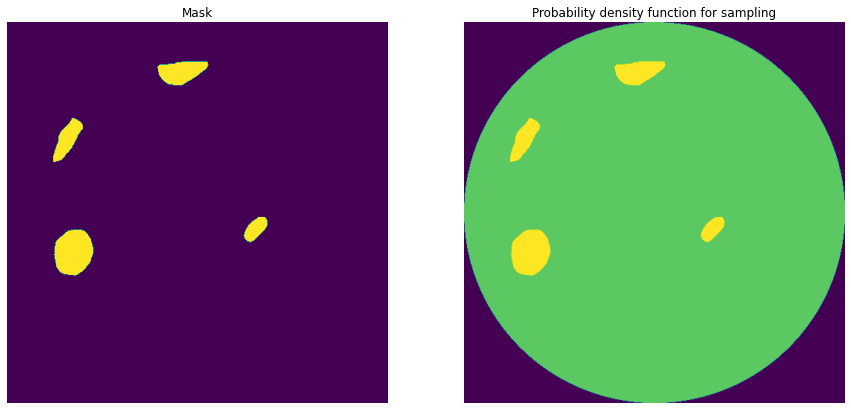

id                                                              16216
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4427215 28 4430212 37 4433210 42 4436206 48 44...
age                                                              73.0
sex                                                              Male
Name: 68, dtype: object
16216
Saving msk
Resizing PDF
Saving pdf cumsum


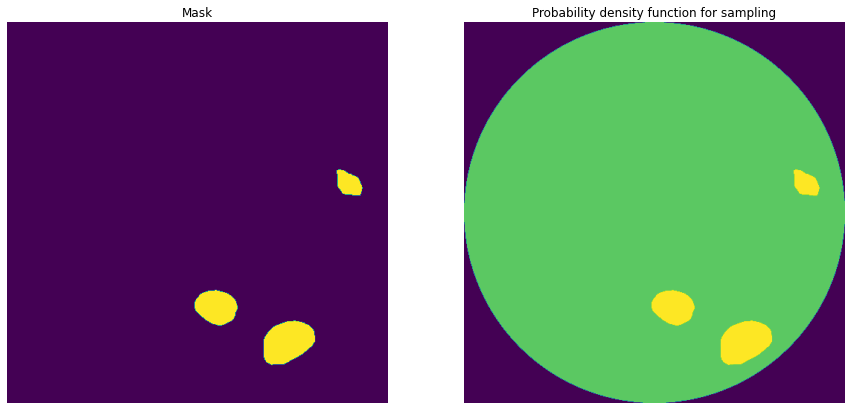

id                                                              16362
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 904600 24 907596 31 910591 40 913588 49 916585...
age                                                              73.0
sex                                                              Male
Name: 69, dtype: object
16362
Saving msk
Resizing PDF
Saving pdf cumsum


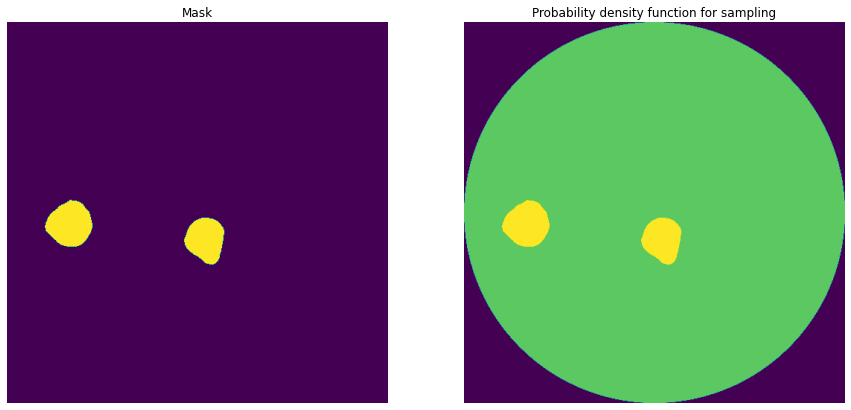

id                                                                164
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1539720 16 1542718 22 1545717 25 1548716 33 15...
age                                                              61.0
sex                                                              Male
Name: 70, dtype: object
164
Saving msk
Resizing PDF
Saving pdf cumsum


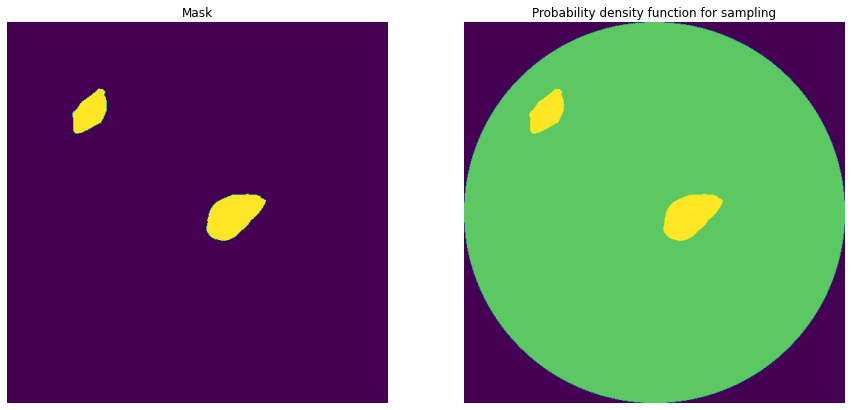

id                                                              16564
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3491396 12 3494392 18 3497390 22 3500389 25 35...
age                                                              43.0
sex                                                            Female
Name: 71, dtype: object
16564
Saving msk
Resizing PDF
Saving pdf cumsum


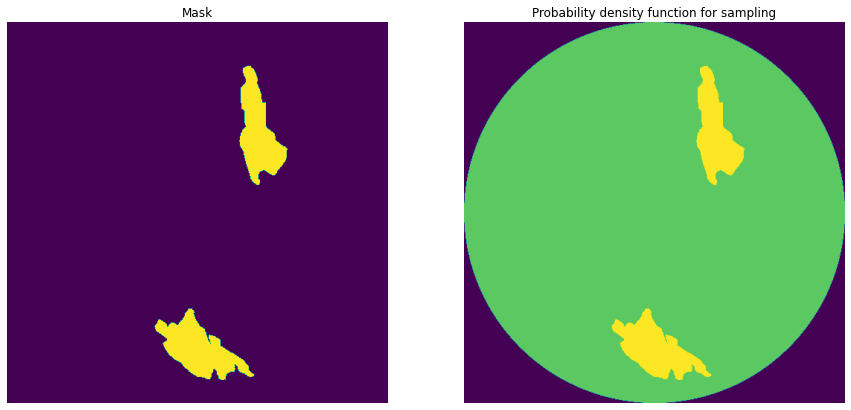

id                                                              16609
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1834422 80 1834807 58 1837420 86 1837801 67 18...
age                                                              48.0
sex                                                              Male
Name: 72, dtype: object
16609
Saving msk
Resizing PDF
Saving pdf cumsum


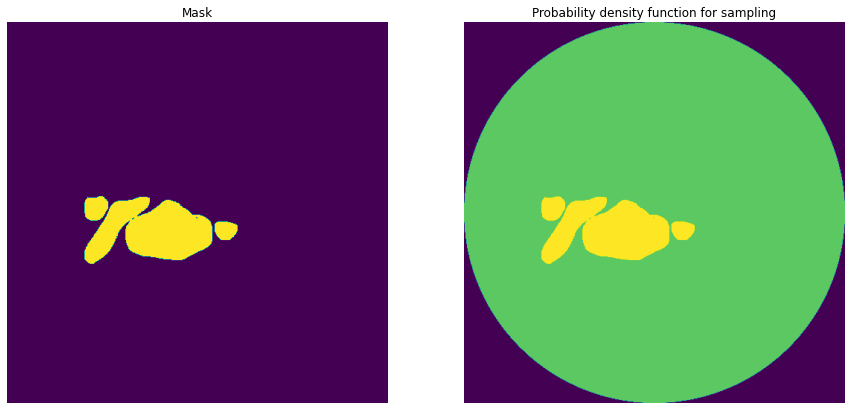

id                                                              16659
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2689220 82 2692218 88 2695217 93 2698209 103 2...
age                                                              57.0
sex                                                              Male
Name: 73, dtype: object
16659
Saving msk
Resizing PDF
Saving pdf cumsum


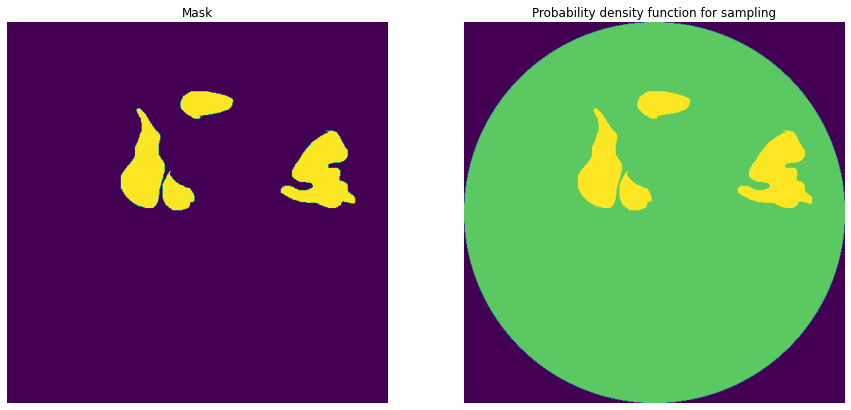

id                                                              16711
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2102108 56 2105103 65 2108098 72 2111094 78 21...
age                                                              70.0
sex                                                              Male
Name: 74, dtype: object
16711
Saving msk
Resizing PDF
Saving pdf cumsum


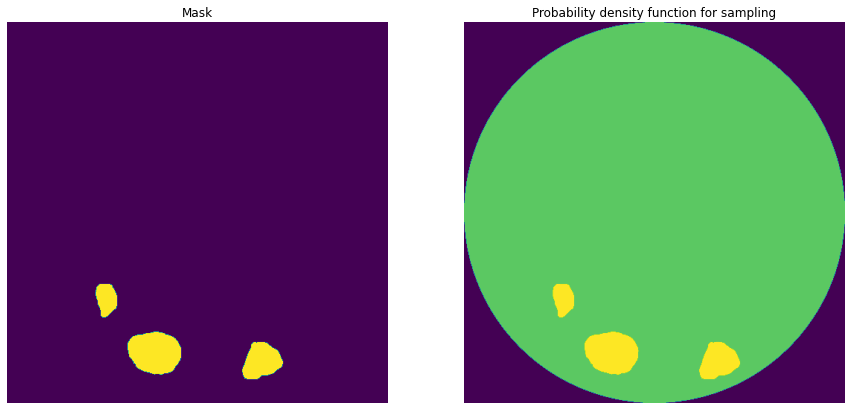

id                                                              16728
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 856875 11 859864 38 862861 46 865859 53 868855...
age                                                              84.0
sex                                                              Male
Name: 75, dtype: object
16728
Saving msk
Resizing PDF
Saving pdf cumsum


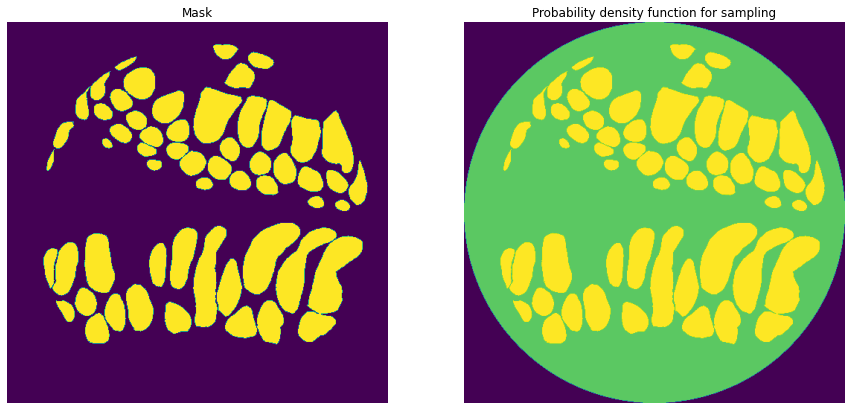

id                                                              16890
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1027917 19 1030915 23 1033911 29 1036910 38 10...
age                                                              65.0
sex                                                            Female
Name: 76, dtype: object
16890
Saving msk
Resizing PDF
Saving pdf cumsum


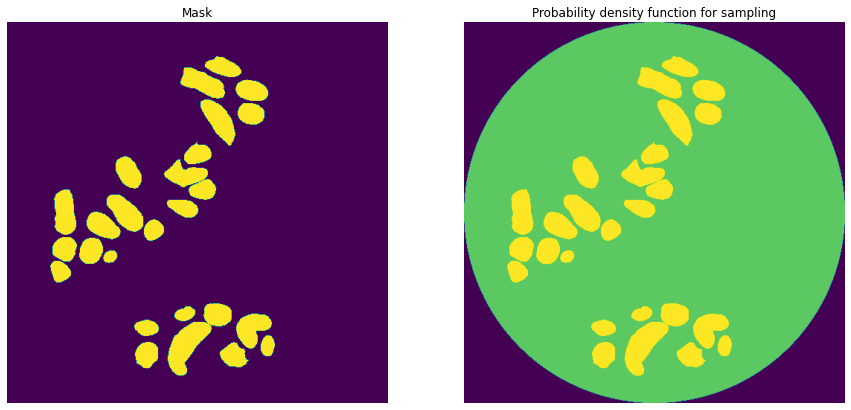

id                                                               1690
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 946573 55 949572 58 952571 60 955566 74 955653...
age                                                              61.0
sex                                                              Male
Name: 77, dtype: object
1690
Saving msk
Resizing PDF
Saving pdf cumsum


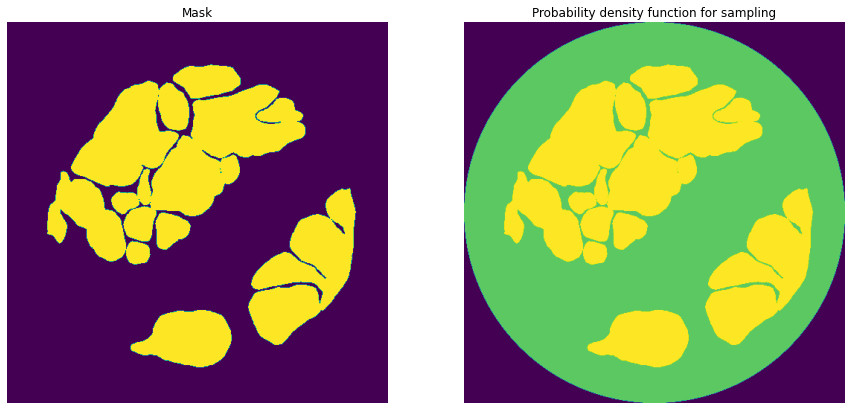

id                                                              17126
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1631331 15 1634329 20 1637327 25 1640325 31 16...
age                                                              83.0
sex                                                              Male
Name: 78, dtype: object
17126
Saving msk
Resizing PDF
Saving pdf cumsum


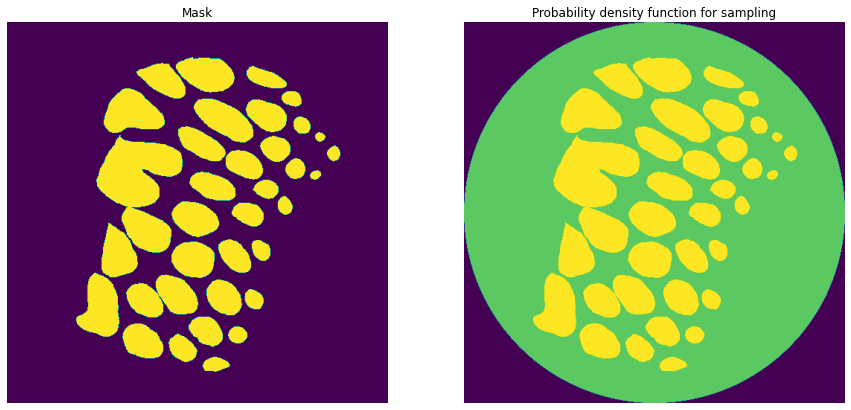

id                                                              17143
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 679481 110 682479 113 685472 136 685795 71 688...
age                                                              48.0
sex                                                              Male
Name: 79, dtype: object
17143
Saving msk
Resizing PDF
Saving pdf cumsum


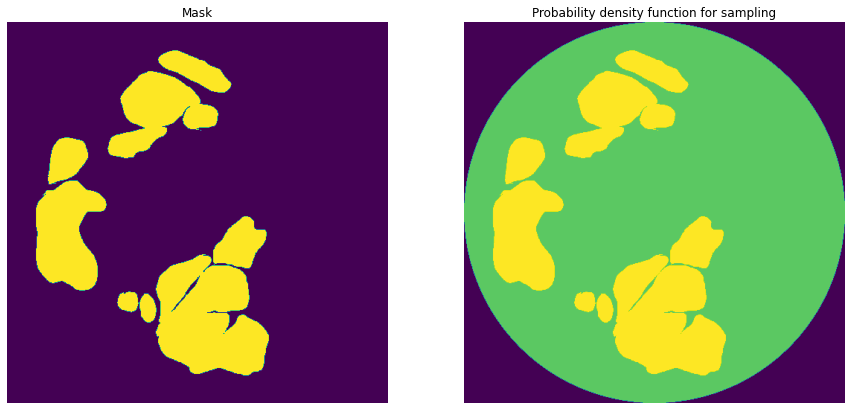

id                                                              17187
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1033408 37 1036402 56 1039402 56 1042184 34 10...
age                                                              55.0
sex                                                              Male
Name: 80, dtype: object
17187
Saving msk
Resizing PDF
Saving pdf cumsum


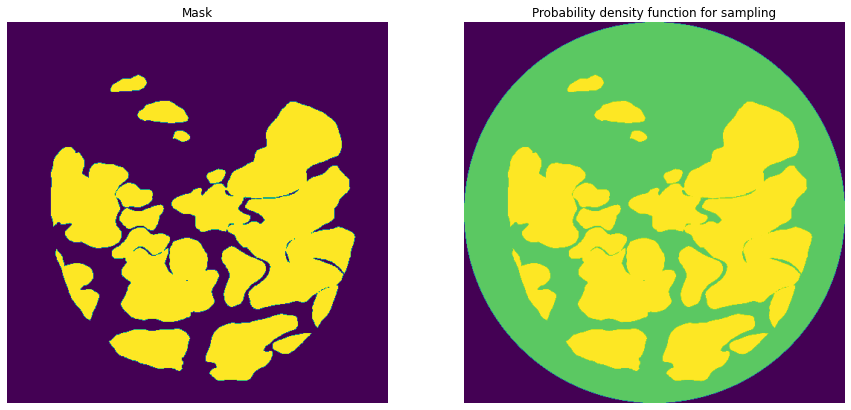

id                                                               1731
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4089979 27 4092978 30 4095977 33 4098976 36 41...
age                                                              57.0
sex                                                            Female
Name: 81, dtype: object
1731
Saving msk
Resizing PDF
Saving pdf cumsum


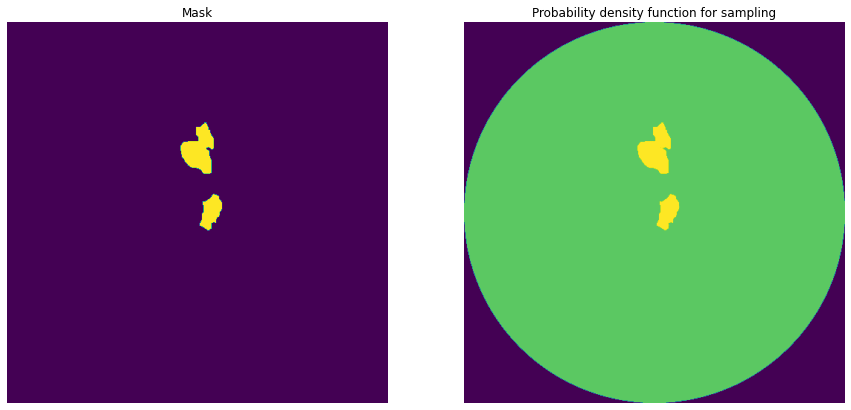

id                                                              17422
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4571065 19 4574057 33 4577055 37 4580050 47 45...
age                                                              59.0
sex                                                              Male
Name: 82, dtype: object
17422
Saving msk
Resizing PDF
Saving pdf cumsum


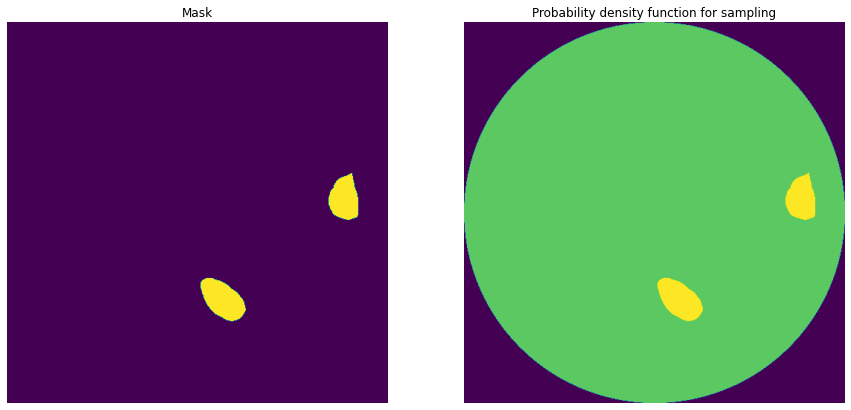

id                                                              17455
organ                                                        prostate
data_source                                                       HPA
img_height                                                       2942
img_width                                                        2942
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 881016 33 883956 37 886897 40 889828 57 890247...
age                                                              55.0
sex                                                              Male
Name: 83, dtype: object
17455
Saving msk
Resizing PDF
Saving pdf cumsum


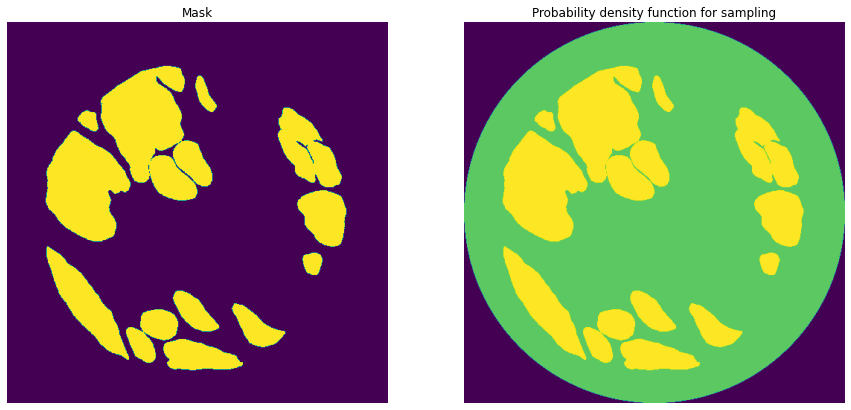

id                                                              17828
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 532450 36 535449 38 538448 40 541447 42 544446...
age                                                              37.0
sex                                                              Male
Name: 84, dtype: object
17828
Saving msk
Resizing PDF
Saving pdf cumsum


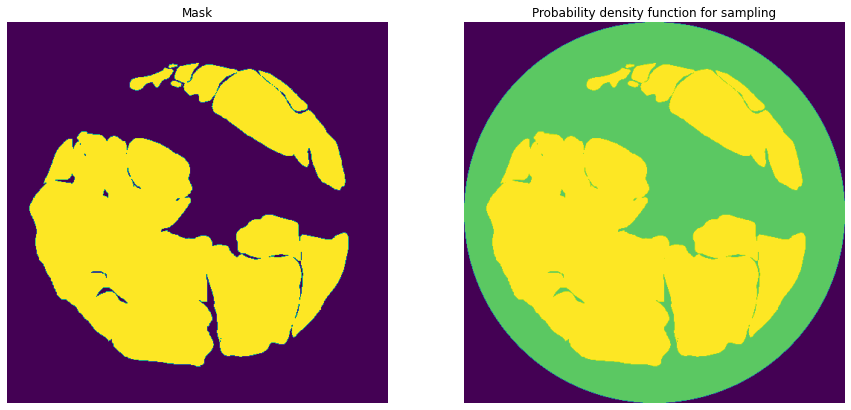

id                                                              18121
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2308
img_width                                                        2308
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1070782 12 1073089 14 1075375 37 1077681 39 10...
age                                                              41.0
sex                                                            Female
Name: 85, dtype: object
18121
Saving msk
Resizing PDF
Saving pdf cumsum


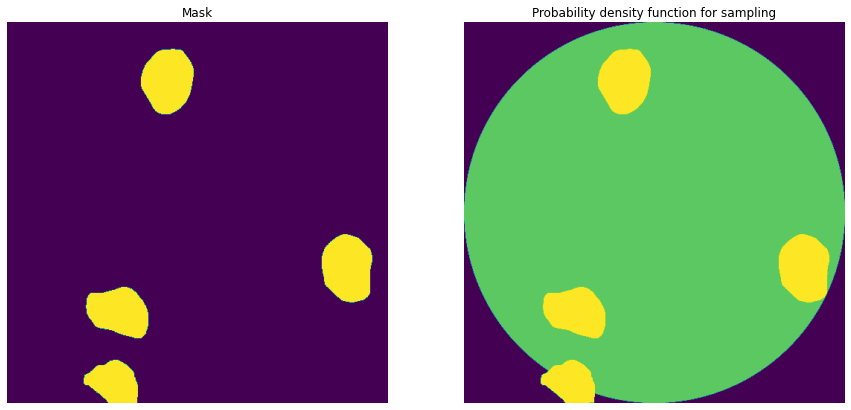

id                                                              18401
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3604710 41 3607705 50 3610693 68 3613688 83 36...
age                                                              70.0
sex                                                              Male
Name: 86, dtype: object
18401
Saving msk
Resizing PDF
Saving pdf cumsum


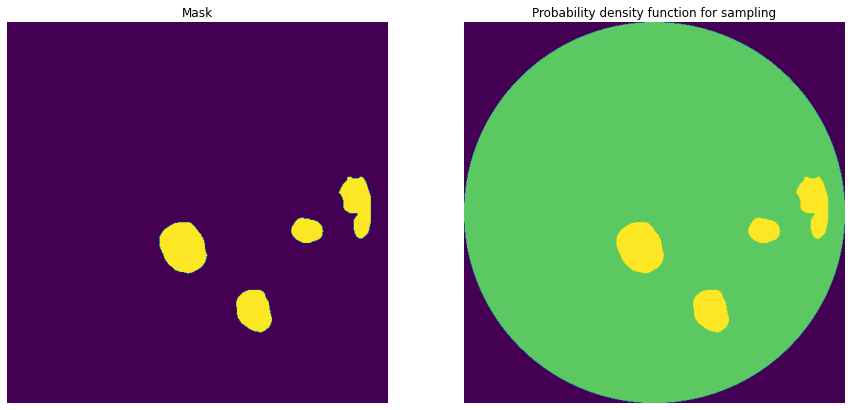

id                                                              18422
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4214452 16 4217451 19 4220450 22 4223449 25 42...
age                                                              48.0
sex                                                              Male
Name: 87, dtype: object
18422
Saving msk
Resizing PDF
Saving pdf cumsum


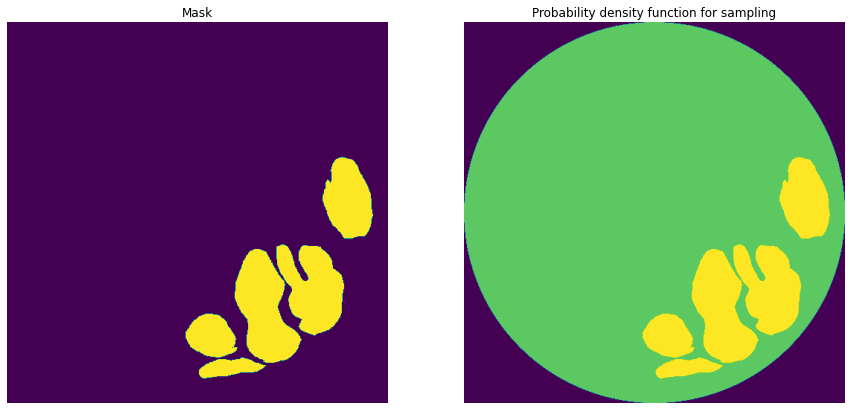

id                                                              18426
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1316220 7 1319220 11 1322219 14 1325219 17 132...
age                                                              56.0
sex                                                            Female
Name: 88, dtype: object
18426
Saving msk
Resizing PDF
Saving pdf cumsum


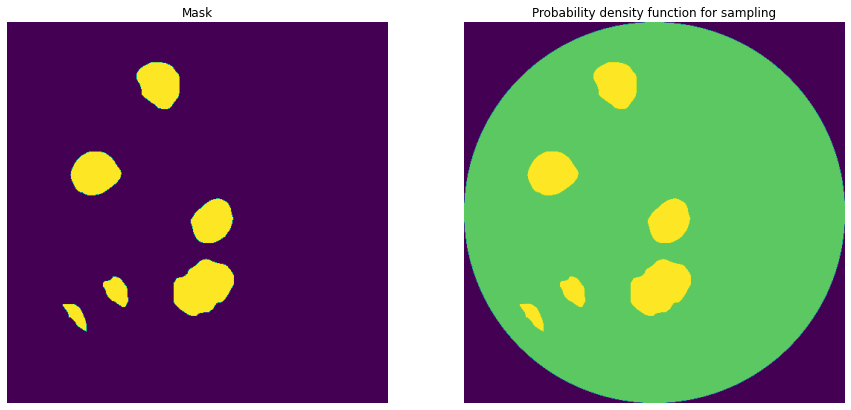

id                                                              18445
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1223 206 1978 1 2145 115 2279 164 2489 75 4223...
age                                                              84.0
sex                                                              Male
Name: 89, dtype: object
18445
Saving msk
Resizing PDF
Saving pdf cumsum


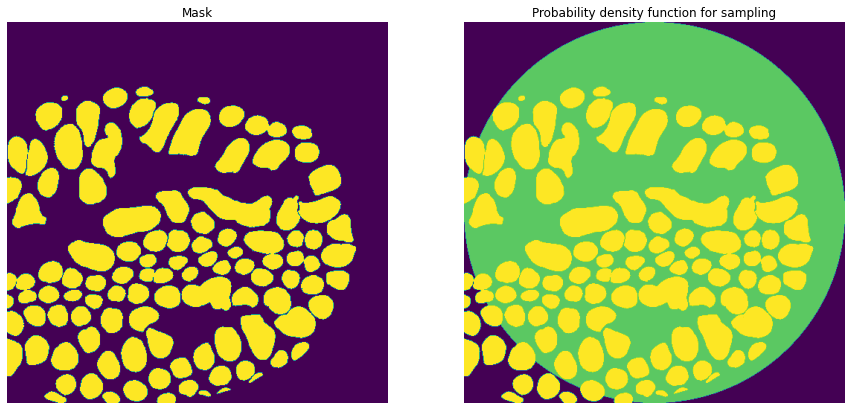

id                                                              18449
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2463622 29 2466602 58 2469597 66 2472595 69 24...
age                                                              59.0
sex                                                              Male
Name: 90, dtype: object
18449
Saving msk
Resizing PDF
Saving pdf cumsum


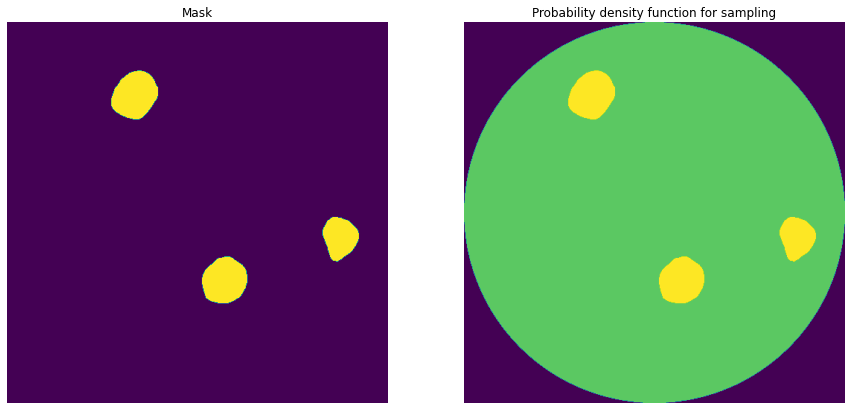

id                                                               1850
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 832616 11 835608 23 838603 35 841599 41 844597...
age                                                              84.0
sex                                                            Female
Name: 91, dtype: object
1850
Saving msk
Resizing PDF
Saving pdf cumsum


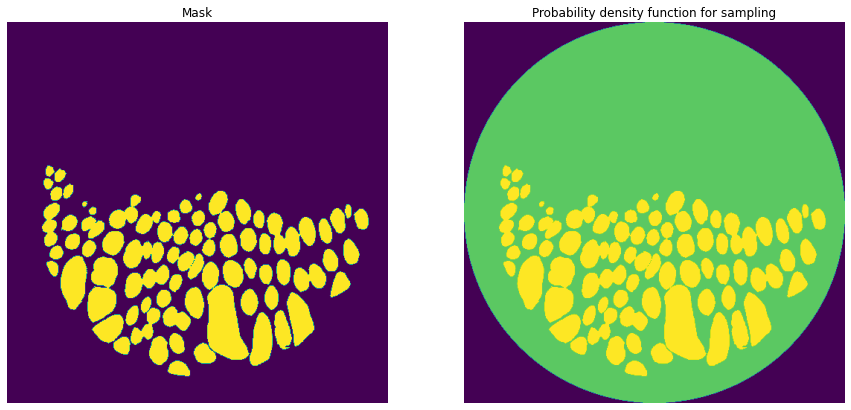

id                                                              18777
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2790
img_width                                                        2790
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 598698 28 601480 49 604263 59 607045 70 609827...
age                                                              70.0
sex                                                              Male
Name: 92, dtype: object
18777
Saving msk
Resizing PDF
Saving pdf cumsum


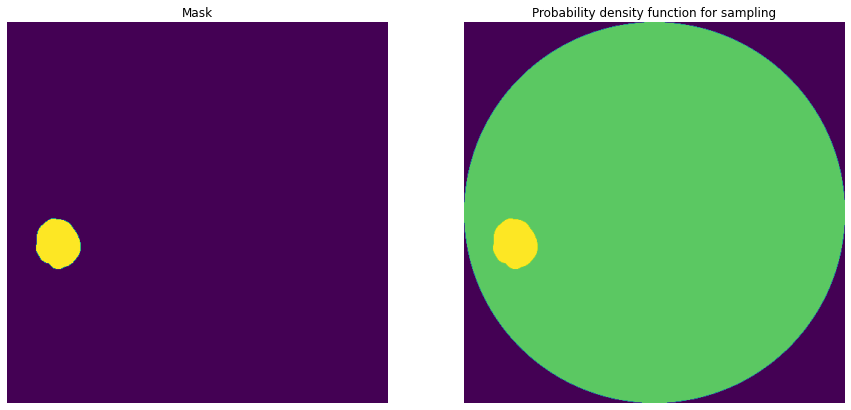

id                                                               1878
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1879450 1 1882448 4 1885447 6 1888445 8 189144...
age                                                              43.0
sex                                                            Female
Name: 93, dtype: object
1878
Saving msk
Resizing PDF
Saving pdf cumsum


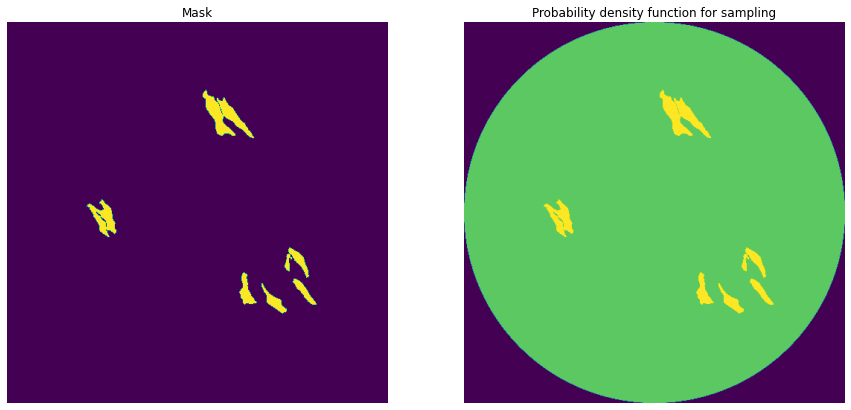

id                                                              18792
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 772563 19 775562 22 778561 25 781561 27 784560...
age                                                              74.0
sex                                                            Female
Name: 94, dtype: object
18792
Saving msk
Resizing PDF
Saving pdf cumsum


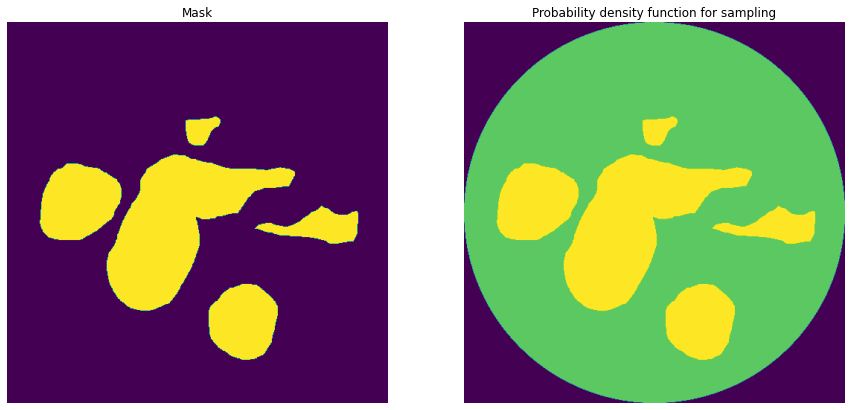

id                                                              18900
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 736427 22 736452 5 736711 17 739425 35 739699 ...
age                                                              79.0
sex                                                            Female
Name: 95, dtype: object
18900
Saving msk
Resizing PDF
Saving pdf cumsum


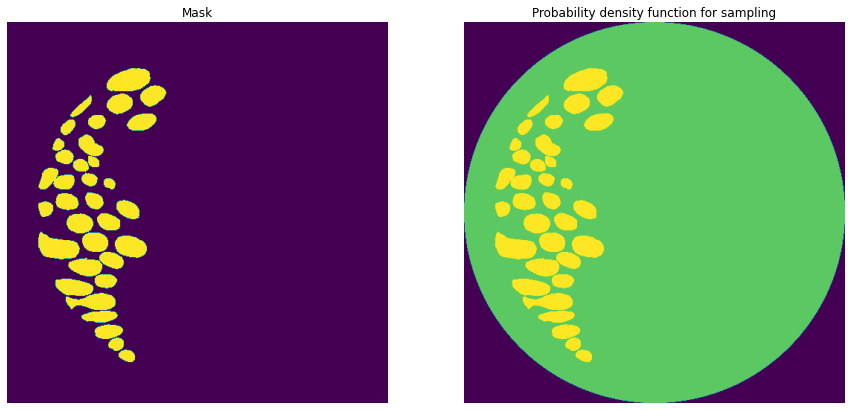

id                                                              19048
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2411309 11 2414299 29 2417289 44 2420270 89 24...
age                                                              59.0
sex                                                              Male
Name: 96, dtype: object
19048
Saving msk
Resizing PDF
Saving pdf cumsum


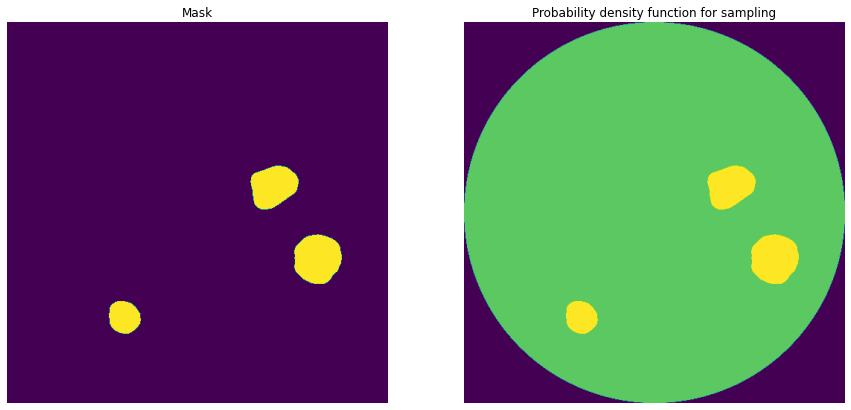

id                                                              19084
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 952518 47 955517 50 958516 52 961505 70 964504...
age                                                              55.0
sex                                                              Male
Name: 97, dtype: object
19084
Saving msk
Resizing PDF
Saving pdf cumsum


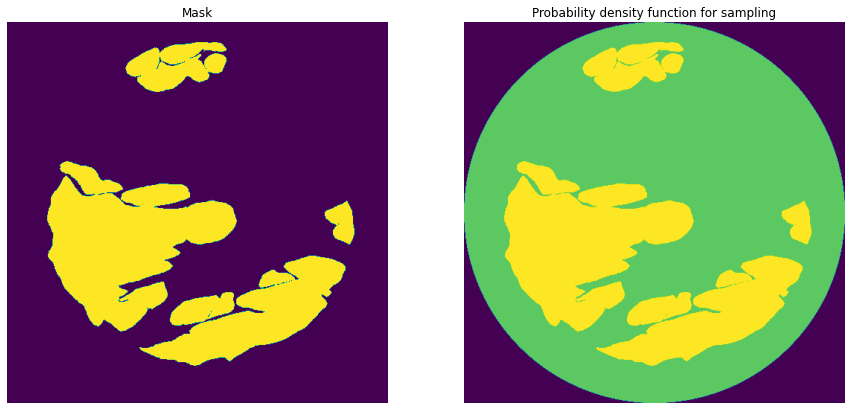

id                                                              19179
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1372819 37 1375817 69 1378815 109 1381813 112 ...
age                                                              50.0
sex                                                            Female
Name: 98, dtype: object
19179
Saving msk
Resizing PDF
Saving pdf cumsum


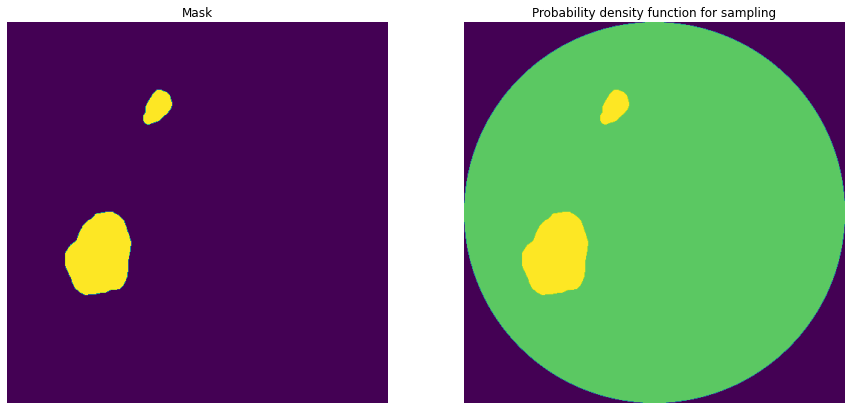

id                                                              19360
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 532496 89 535488 103 538481 125 541476 138 544...
age                                                              57.0
sex                                                              Male
Name: 99, dtype: object
19360
Saving msk
Resizing PDF
Saving pdf cumsum


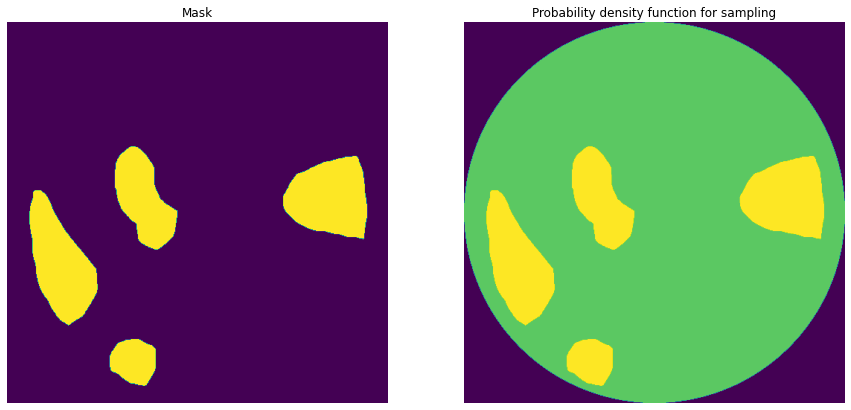

id                                                              19377
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1444167 52 1447164 59 1450161 71 1453160 75 14...
age                                                              21.0
sex                                                            Female
Name: 100, dtype: object
19377
Saving msk
Resizing PDF
Saving pdf cumsum


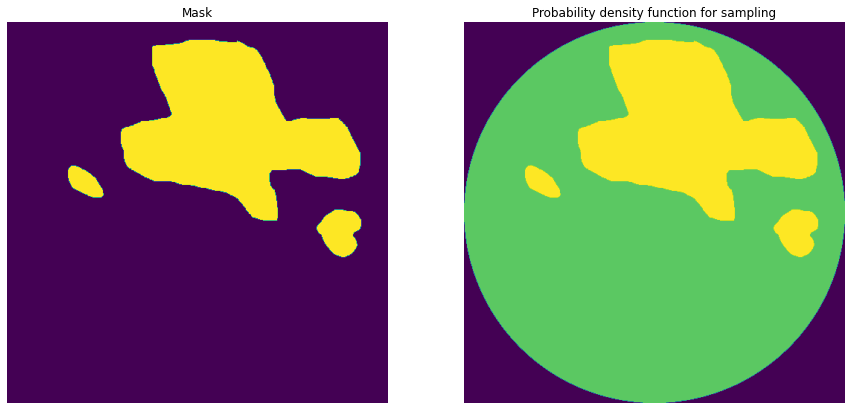

id                                                              19507
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2724517 22 2727515 28 2730514 33 2733513 36 27...
age                                                              72.0
sex                                                              Male
Name: 101, dtype: object
19507
Saving msk
Resizing PDF
Saving pdf cumsum


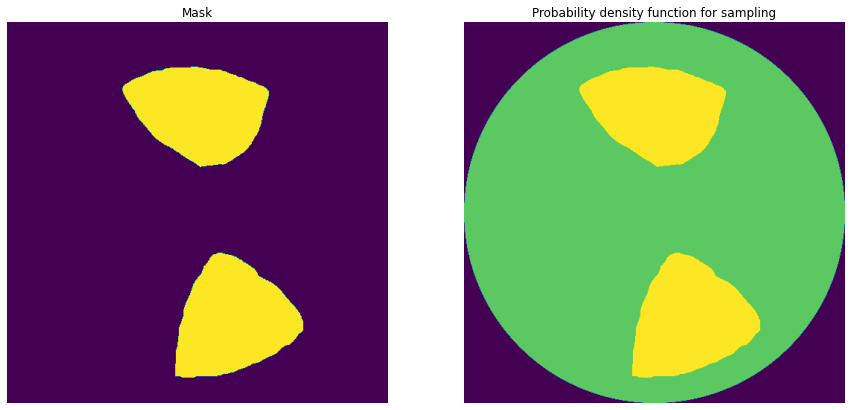

id                                                              19533
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4525024 1 4525089 9 4528024 6 4528087 40 45310...
age                                                              56.0
sex                                                            Female
Name: 102, dtype: object
19533
Saving msk
Resizing PDF
Saving pdf cumsum


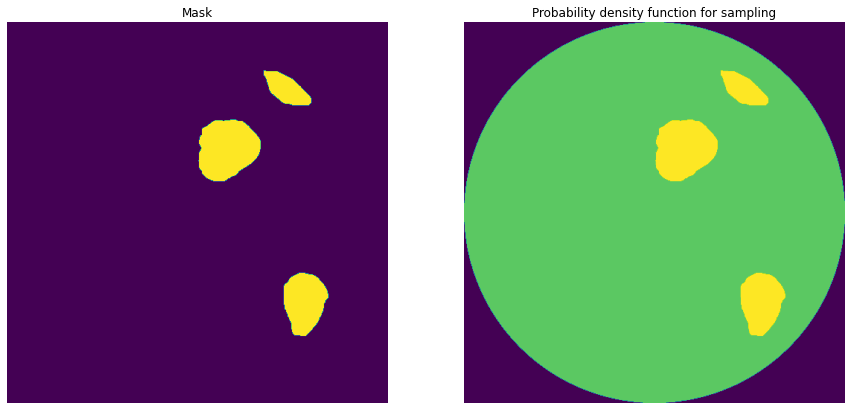

id                                                               1955
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1069460 33 1069561 39 1072458 35 1072559 44 10...
age                                                              60.0
sex                                                              Male
Name: 103, dtype: object
1955
Saving msk
Resizing PDF
Saving pdf cumsum


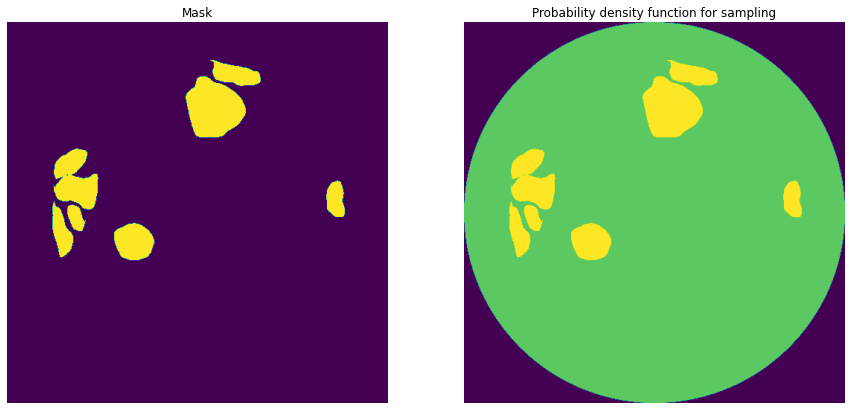

id                                                              19569
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1111654 13 1114653 15 1117440 22 1117643 30 11...
age                                                              57.0
sex                                                              Male
Name: 104, dtype: object
19569
Saving msk
Resizing PDF
Saving pdf cumsum


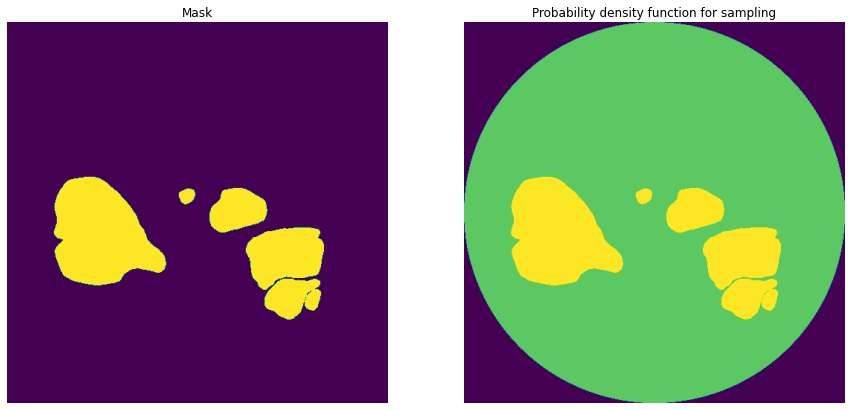

id                                                              19997
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1880398 47 1883397 49 1886396 51 1889395 53 18...
age                                                              82.0
sex                                                              Male
Name: 105, dtype: object
19997
Saving msk
Resizing PDF
Saving pdf cumsum


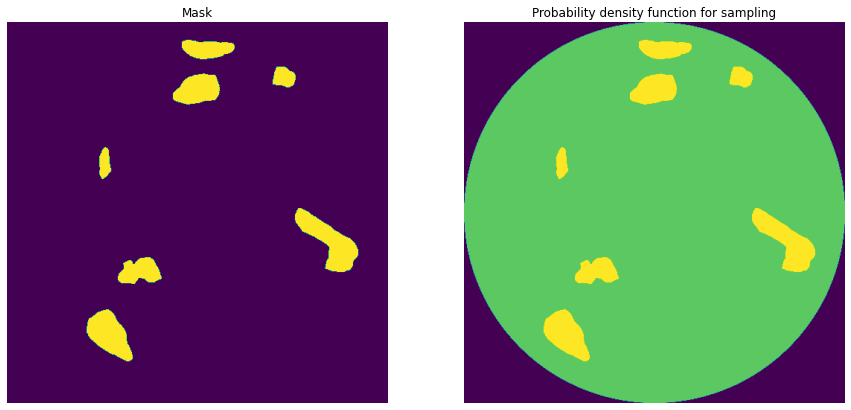

id                                                              20247
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1303013 28 1306012 30 1309011 32 1312011 33 13...
age                                                              55.0
sex                                                              Male
Name: 106, dtype: object
20247
Saving msk
Resizing PDF
Saving pdf cumsum


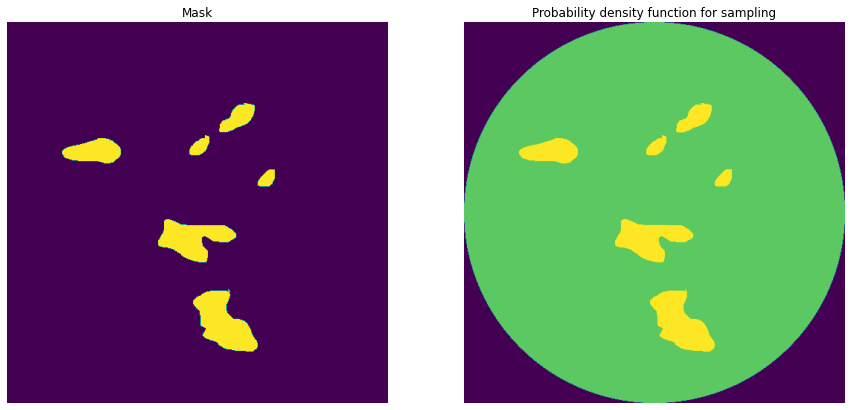

id                                                                203
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 610617 10 613607 28 616602 38 619600 43 622597...
age                                                              84.0
sex                                                            Female
Name: 107, dtype: object
203
Saving msk
Resizing PDF
Saving pdf cumsum


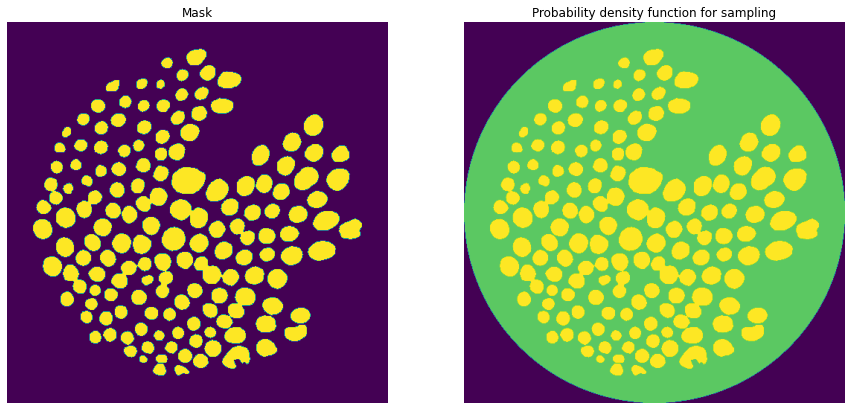

id                                                              20302
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 733494 80 736492 86 739489 93 742482 139 74547...
age                                                              70.0
sex                                                              Male
Name: 108, dtype: object
20302
Saving msk
Resizing PDF
Saving pdf cumsum


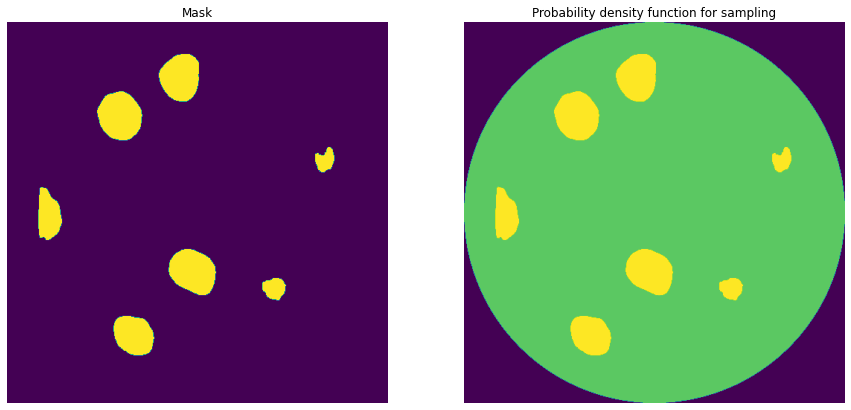

id                                                              20428
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1246291 24 1249285 34 1252284 36 1255274 50 12...
age                                                              76.0
sex                                                              Male
Name: 109, dtype: object
20428
Saving msk
Resizing PDF
Saving pdf cumsum


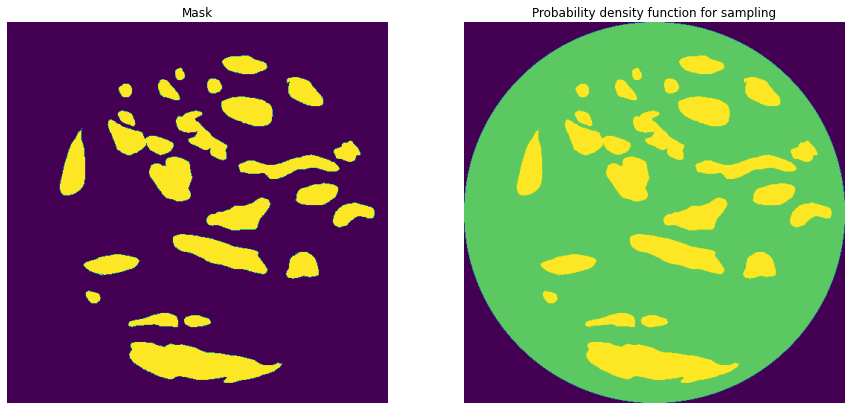

id                                                              20440
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1930740 11 1933732 26 1936730 31 1939722 44 19...
age                                                              70.0
sex                                                              Male
Name: 110, dtype: object
20440
Saving msk
Resizing PDF
Saving pdf cumsum


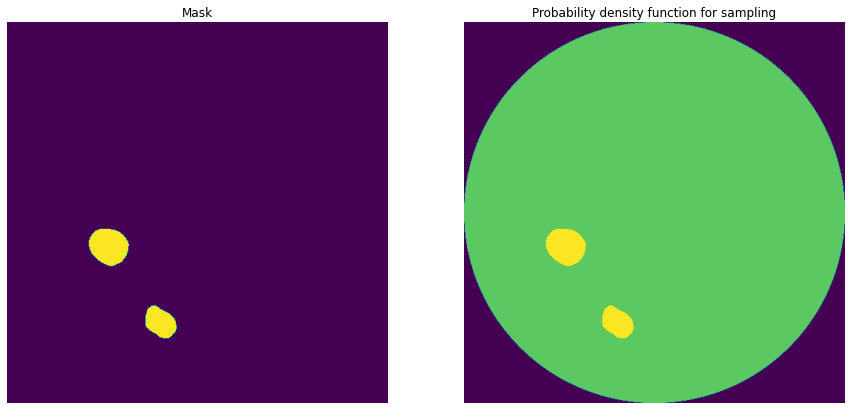

id                                                              20478
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 556427 27 559425 55 562423 63 565416 72 568410...
age                                                              28.0
sex                                                              Male
Name: 111, dtype: object
20478
Saving msk
Resizing PDF
Saving pdf cumsum


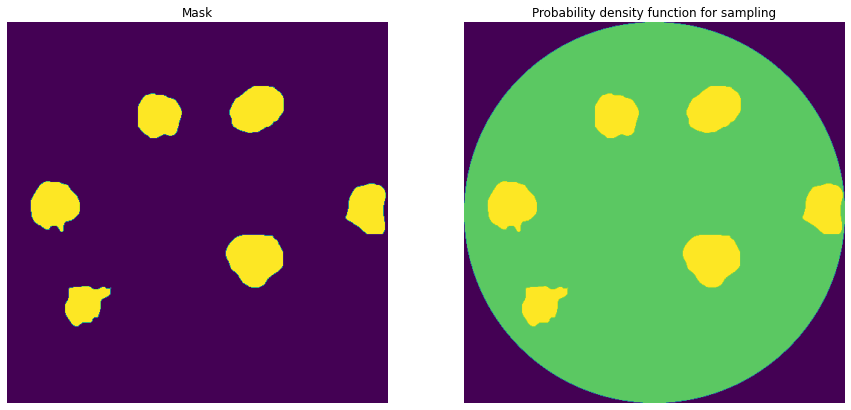

id                                                              20520
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 7270511 19 7273506 30 7276503 34 7279501 39 72...
age                                                              73.0
sex                                                              Male
Name: 112, dtype: object
20520
Saving msk
Resizing PDF
Saving pdf cumsum


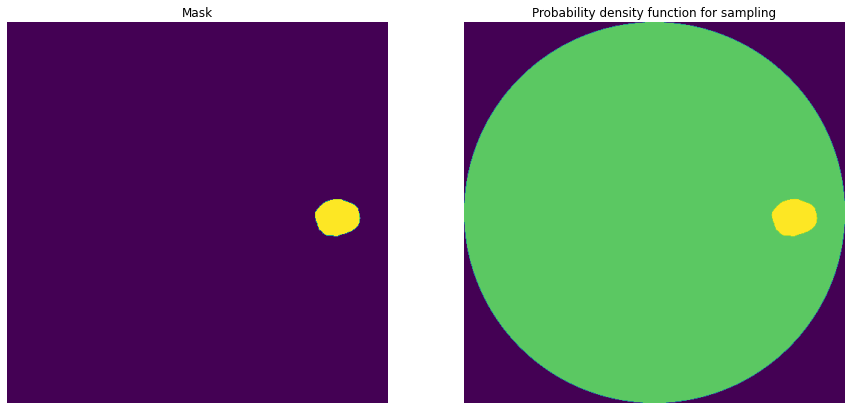

id                                                              20563
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3106494 3 3109492 8 3112491 7 3115490 16 31184...
age                                                              78.0
sex                                                              Male
Name: 113, dtype: object
20563
Saving msk
Resizing PDF
Saving pdf cumsum


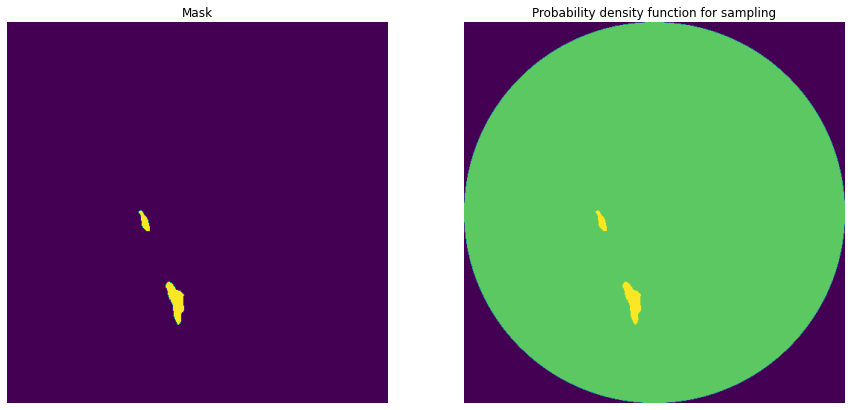

id                                                               2079
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3558433 11 3561431 16 3564429 20 3567427 23 35...
age                                                              82.0
sex                                                              Male
Name: 114, dtype: object
2079
Saving msk
Resizing PDF
Saving pdf cumsum


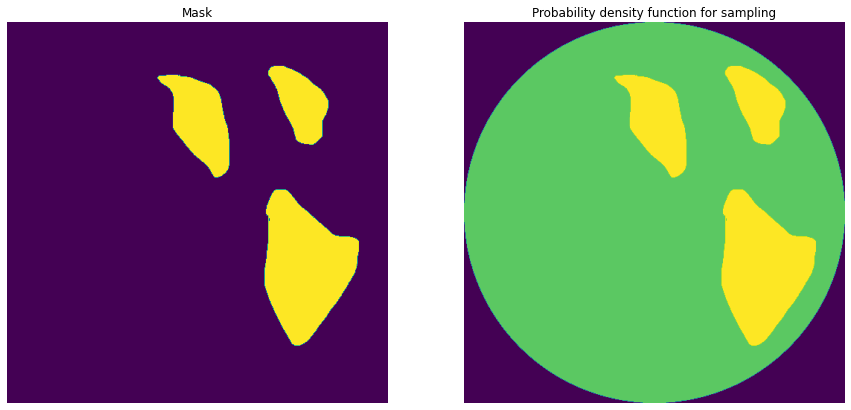

id                                                              20794
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 7151186 53 7154182 59 7157181 61 7160178 70 71...
age                                                              59.0
sex                                                              Male
Name: 115, dtype: object
20794
Saving msk
Resizing PDF
Saving pdf cumsum


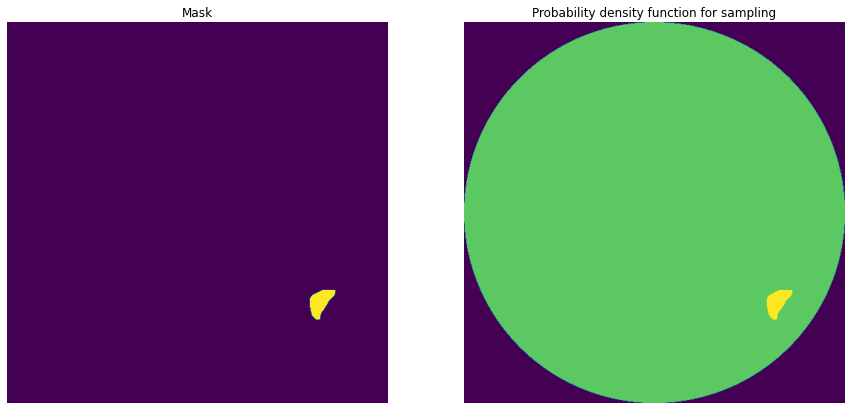

id                                                              20831
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 802107 4 805101 10 808094 17 811088 23 814081 ...
age                                                              82.0
sex                                                              Male
Name: 116, dtype: object
20831
Saving msk
Resizing PDF
Saving pdf cumsum


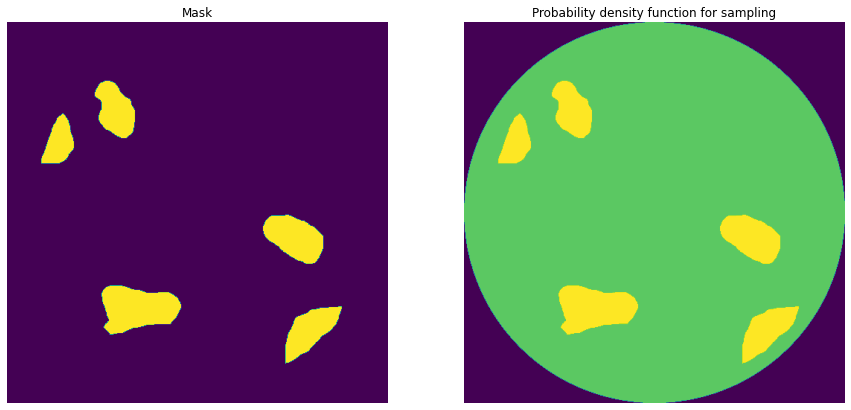

id                                                              20955
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1057650 17 1060648 21 1063646 24 1066645 35 10...
age                                                              55.0
sex                                                              Male
Name: 117, dtype: object
20955
Saving msk
Resizing PDF
Saving pdf cumsum


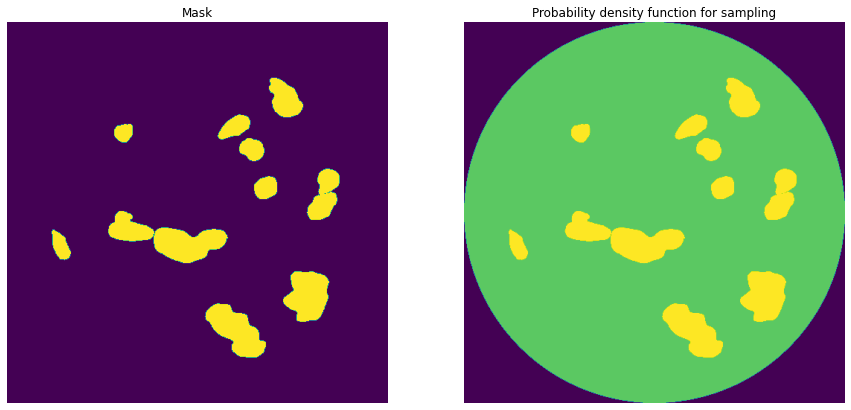

id                                                              21021
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1964444 3 1967441 6 1970440 9 1973439 12 19764...
age                                                              73.0
sex                                                              Male
Name: 118, dtype: object
21021
Saving msk
Resizing PDF
Saving pdf cumsum


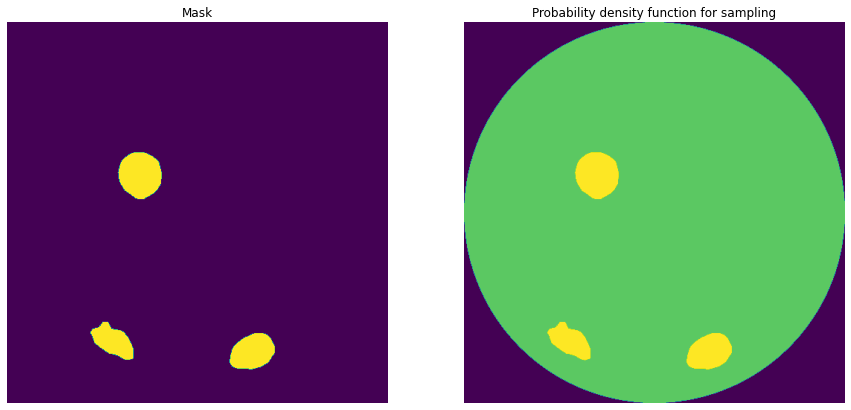

id                                                              21039
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 601497 17 604495 23 607489 31 610295 24 610477...
age                                                              83.0
sex                                                              Male
Name: 119, dtype: object
21039
Saving msk
Resizing PDF
Saving pdf cumsum


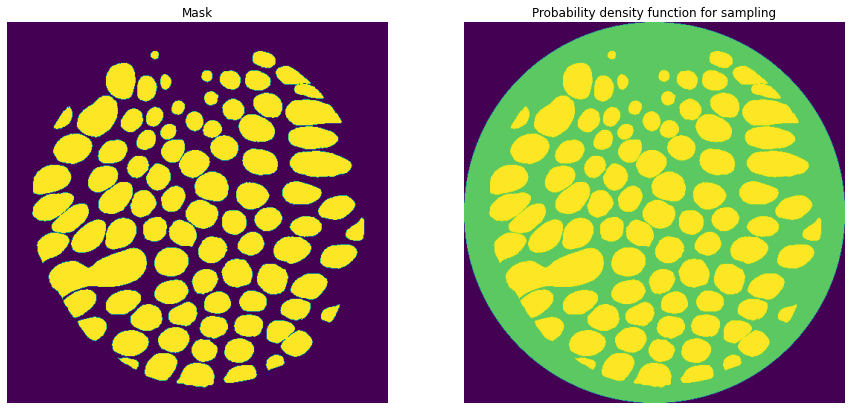

id                                                              21086
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 760443 32 763442 34 766442 34 769419 121 77241...
age                                                              55.0
sex                                                              Male
Name: 120, dtype: object
21086
Saving msk
Resizing PDF
Saving pdf cumsum


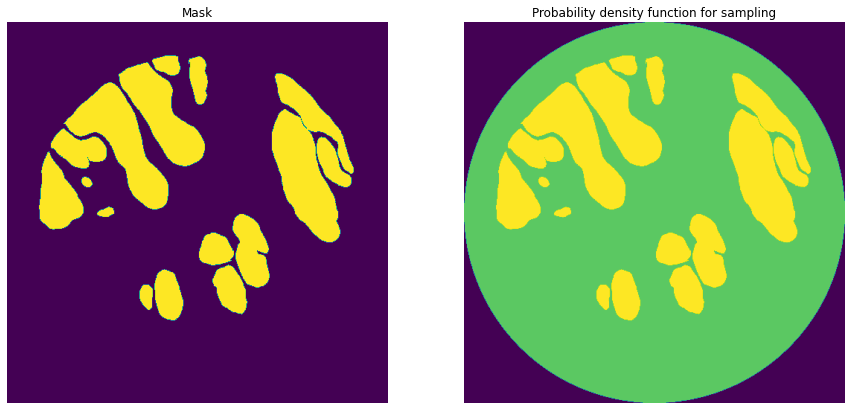

id                                                              21112
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2942
img_width                                                        2942
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1178105 16 1181039 28 1183974 37 1186908 47 11...
age                                                              41.0
sex                                                            Female
Name: 121, dtype: object
21112
Saving msk
Resizing PDF
Saving pdf cumsum


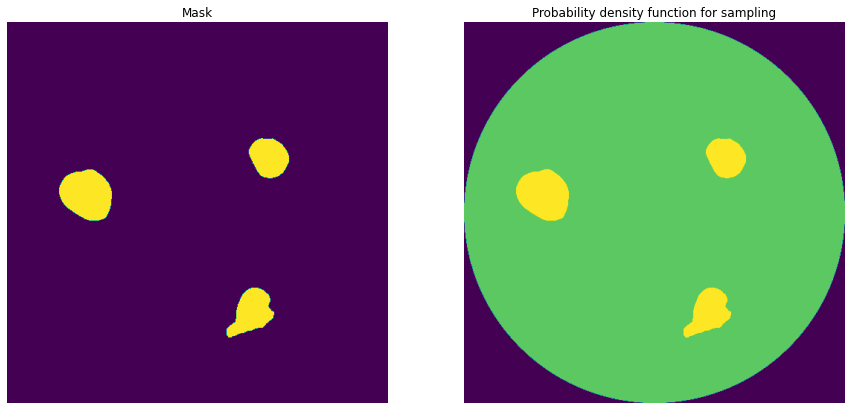

id                                                              21129
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1890665 9 1893659 19 1896655 25 1899653 29 190...
age                                                              41.0
sex                                                            Female
Name: 122, dtype: object
21129
Saving msk
Resizing PDF
Saving pdf cumsum


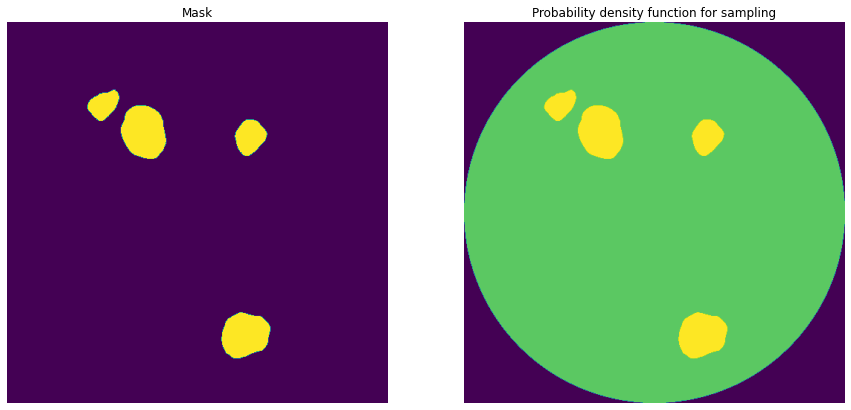

id                                                              21155
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2386250 20 2389248 23 2392246 26 2395233 46 23...
age                                                              76.0
sex                                                              Male
Name: 123, dtype: object
21155
Saving msk
Resizing PDF
Saving pdf cumsum


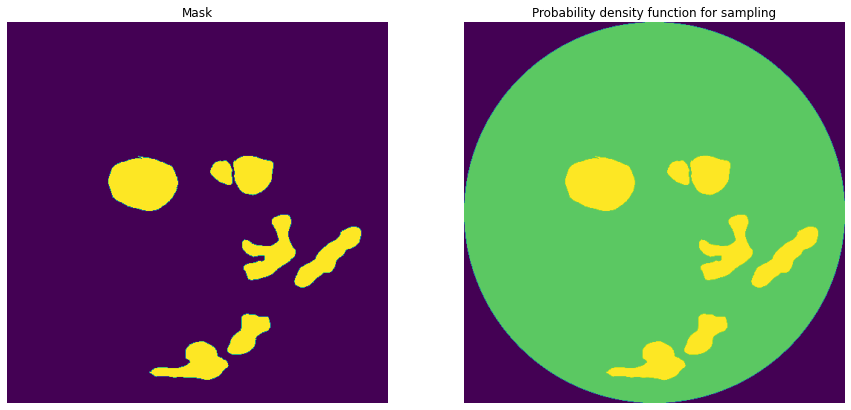

id                                                              21195
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 5361630 23 5364625 33 5367619 44 5370616 49 53...
age                                                              73.0
sex                                                              Male
Name: 124, dtype: object
21195
Saving msk
Resizing PDF
Saving pdf cumsum


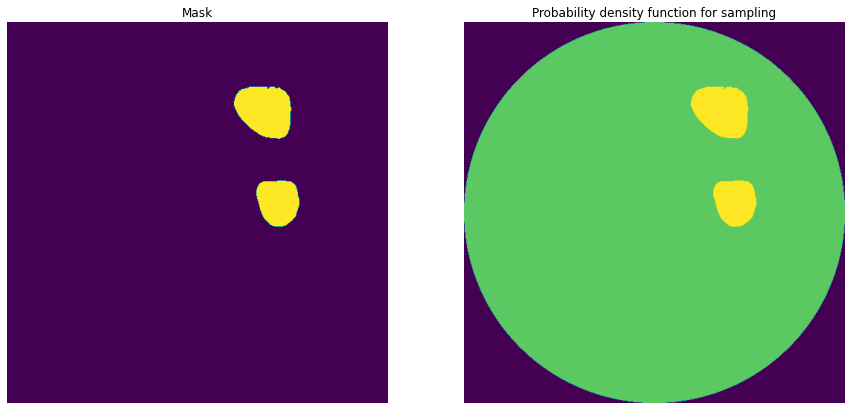

id                                                              21321
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1493257 7 1496256 11 1499255 15 1502255 17 150...
age                                                              61.0
sex                                                              Male
Name: 125, dtype: object
21321
Saving msk
Resizing PDF
Saving pdf cumsum


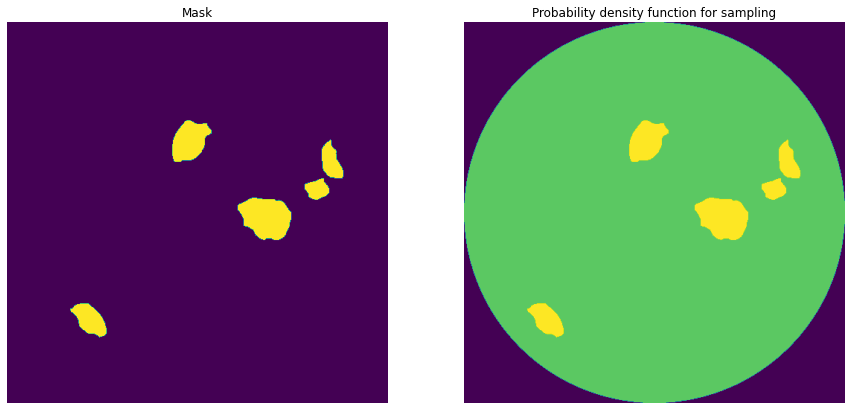

id                                                              21358
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2473392 62 2476390 65 2479383 83 2482382 86 24...
age                                                              50.0
sex                                                            Female
Name: 126, dtype: object
21358
Saving msk
Resizing PDF
Saving pdf cumsum


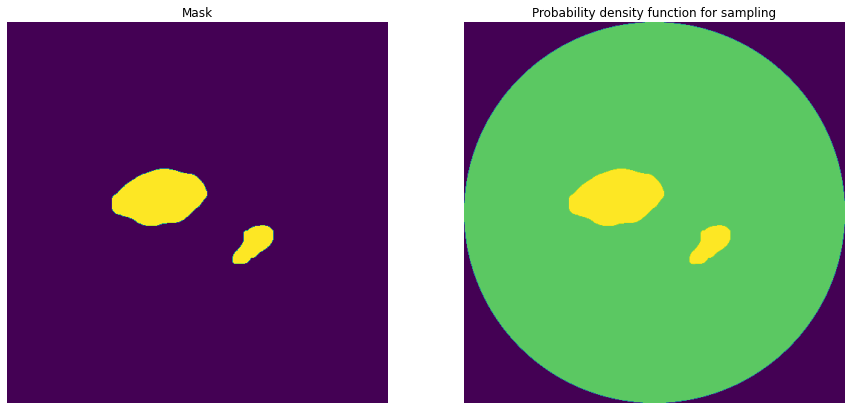

id                                                              21501
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 661314 12 661519 36 664309 21 664515 44 667307...
age                                                              79.0
sex                                                            Female
Name: 127, dtype: object
21501
Saving msk
Resizing PDF
Saving pdf cumsum


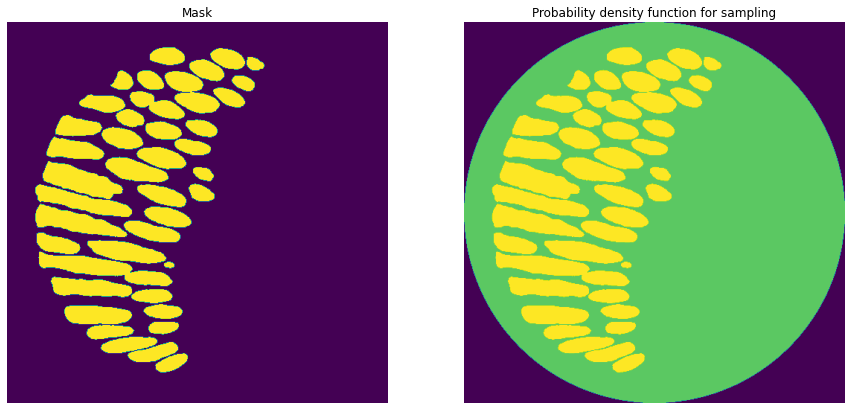

id                                                               2174
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3131713 7 3134708 14 3137706 18 3140705 19 314...
age                                                              48.0
sex                                                              Male
Name: 128, dtype: object
2174
Saving msk
Resizing PDF
Saving pdf cumsum


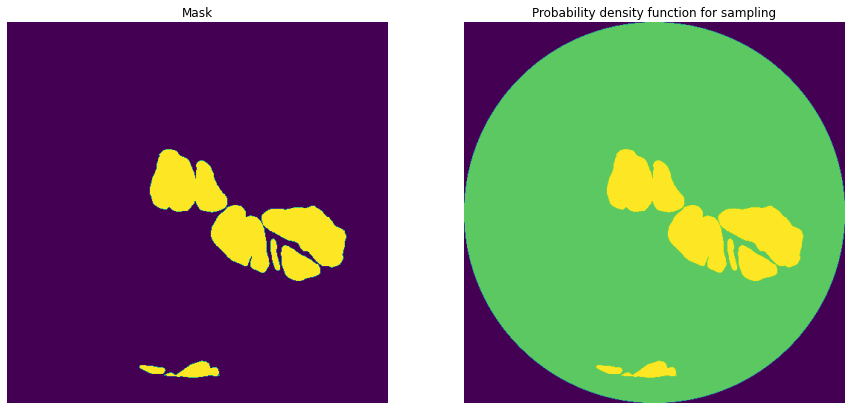

id                                                              21812
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 490364 38 493362 44 496328 97 499306 137 50230...
age                                                              84.0
sex                                                              Male
Name: 129, dtype: object
21812
Saving msk
Resizing PDF
Saving pdf cumsum


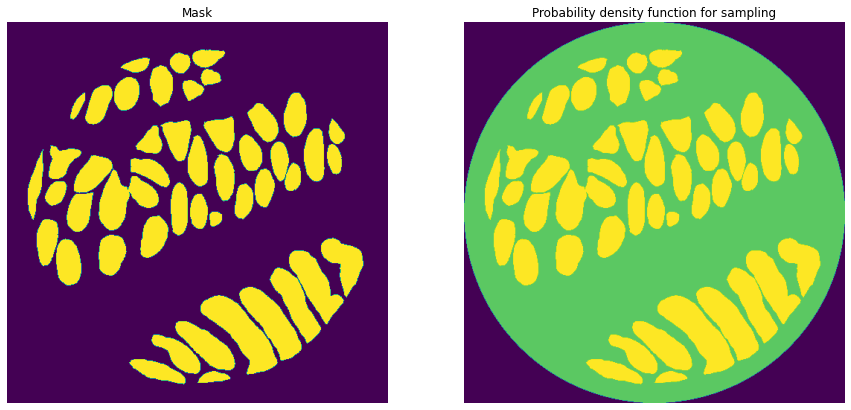

id                                                              22016
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1153723 34 1156721 38 1159719 46 1162718 48 11...
age                                                              76.0
sex                                                              Male
Name: 130, dtype: object
22016
Saving msk
Resizing PDF
Saving pdf cumsum


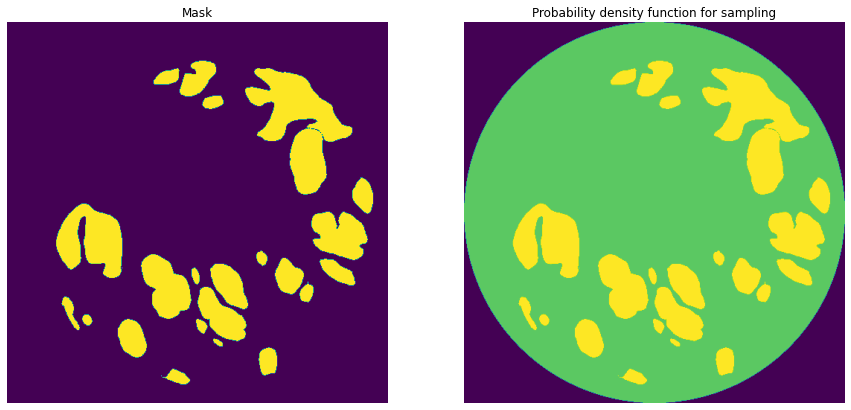

id                                                              22035
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4100496 10 4103483 31 4106476 41 4109468 58 41...
age                                                              56.0
sex                                                            Female
Name: 131, dtype: object
22035
Saving msk
Resizing PDF
Saving pdf cumsum


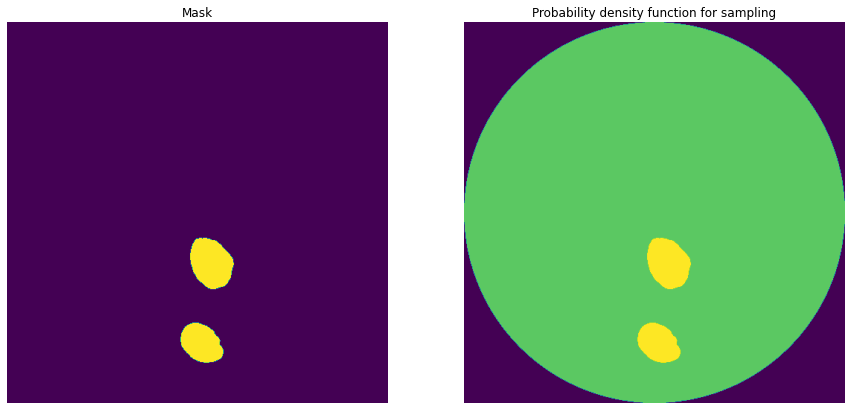

id                                                              22059
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1624388 39 1627387 41 1630385 44 1633384 46 16...
age                                                              61.0
sex                                                              Male
Name: 132, dtype: object
22059
Saving msk
Resizing PDF
Saving pdf cumsum


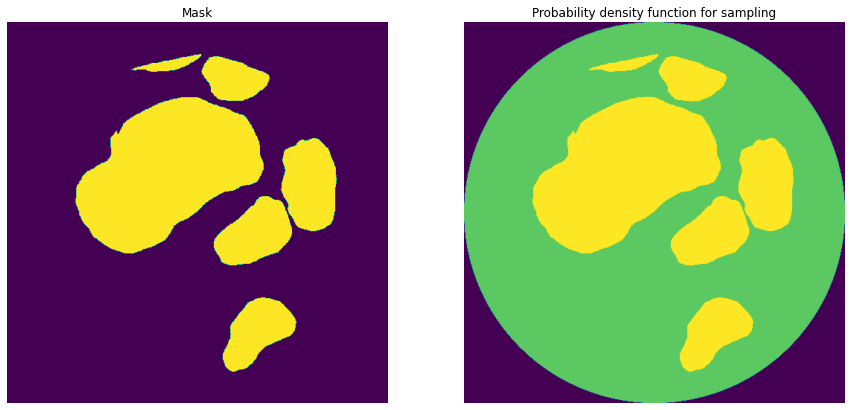

id                                                              22133
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2892431 19 2892461 22 2895415 70 2898411 76 29...
age                                                              59.0
sex                                                              Male
Name: 133, dtype: object
22133
Saving msk
Resizing PDF
Saving pdf cumsum


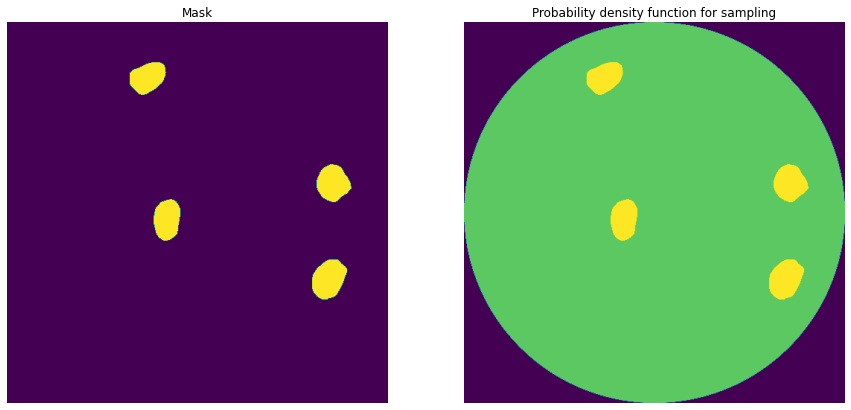

id                                                              22236
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1873727 96 1876725 100 1879717 112 1882712 122...
age                                                              57.0
sex                                                              Male
Name: 134, dtype: object
22236
Saving msk
Resizing PDF
Saving pdf cumsum


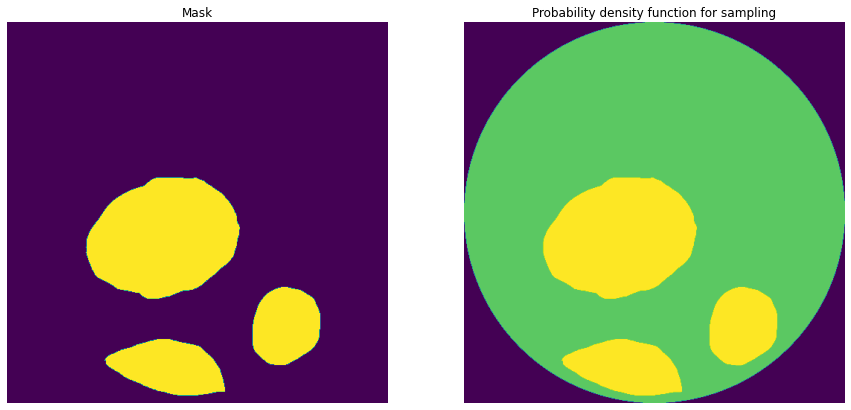

id                                                              22310
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 664557 23 667553 32 670550 72 673547 80 676544...
age                                                              84.0
sex                                                              Male
Name: 135, dtype: object
22310
Saving msk
Resizing PDF
Saving pdf cumsum


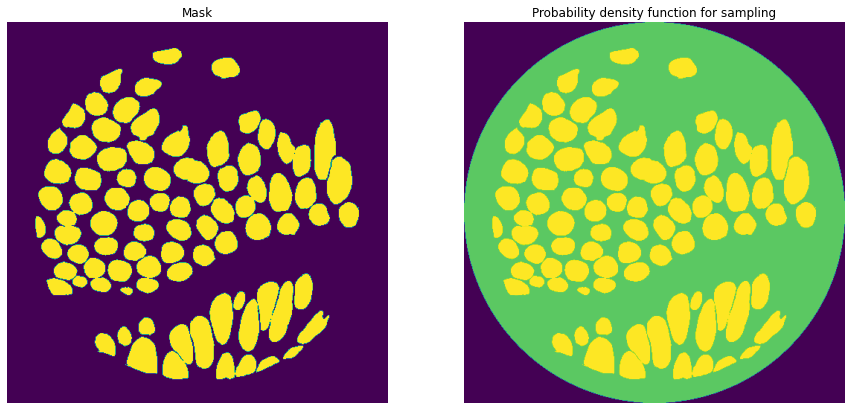

id                                                              22544
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 727369 7 730364 14 733363 15 736362 17 739358 ...
age                                                              61.0
sex                                                              Male
Name: 136, dtype: object
22544
Saving msk
Resizing PDF
Saving pdf cumsum


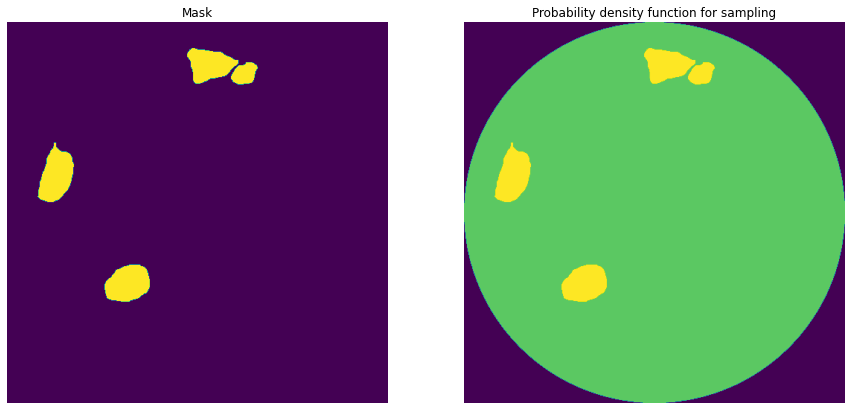

id                                                              22718
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2113208 16 2116200 33 2119196 43 2122178 72 21...
age                                                              41.0
sex                                                            Female
Name: 137, dtype: object
22718
Saving msk
Resizing PDF
Saving pdf cumsum


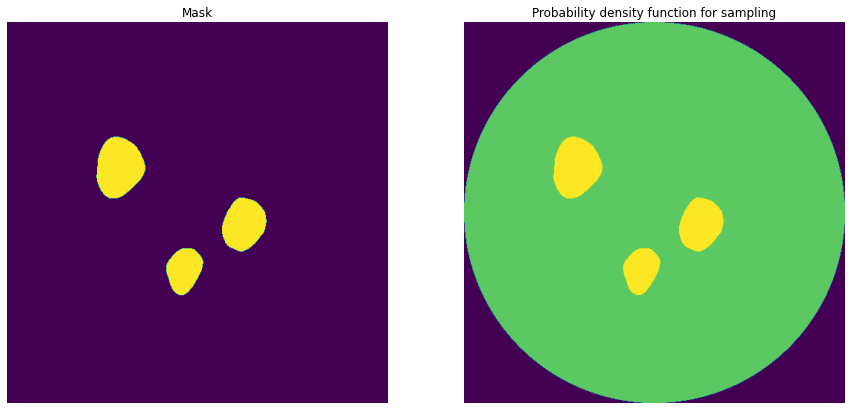

id                                                              22741
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2738154 24 2741150 35 2744148 39 2747143 51 27...
age                                                              68.0
sex                                                            Female
Name: 138, dtype: object
22741
Saving msk
Resizing PDF
Saving pdf cumsum


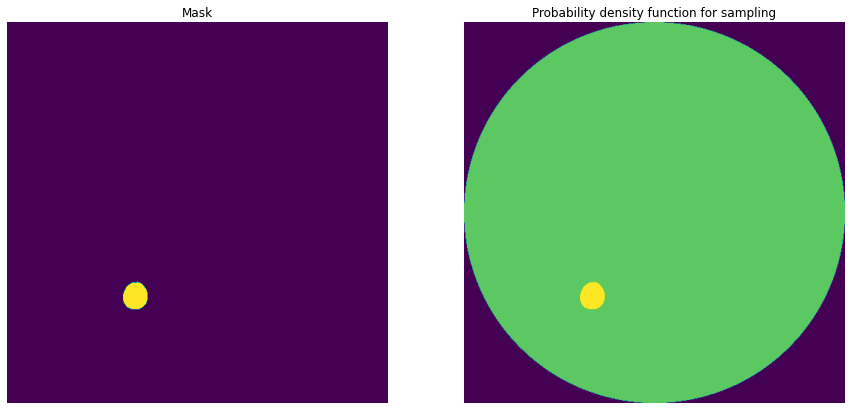

id                                                               2279
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1072531 27 1075527 33 1078524 38 1081501 91 10...
age                                                              82.0
sex                                                              Male
Name: 139, dtype: object
2279
Saving msk
Resizing PDF
Saving pdf cumsum


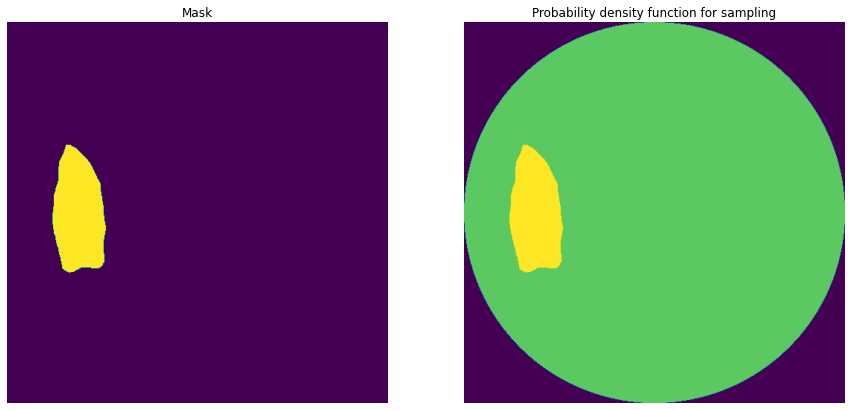

id                                                              22953
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1886435 32 1889433 37 1892432 41 1895430 46 18...
age                                                              50.0
sex                                                            Female
Name: 140, dtype: object
22953
Saving msk
Resizing PDF
Saving pdf cumsum


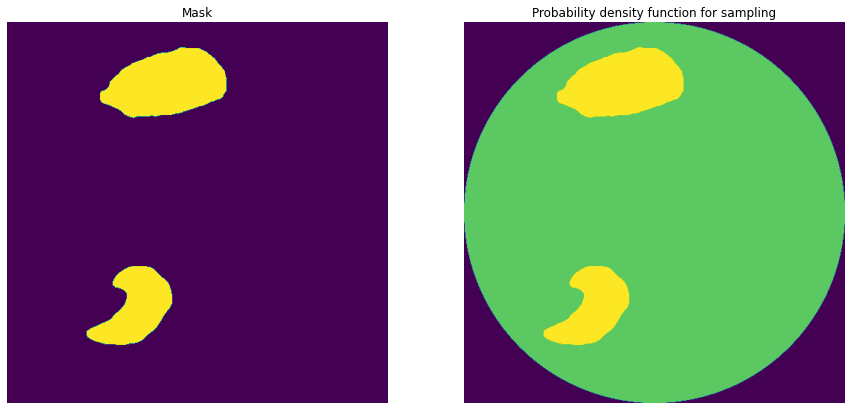

id                                                              22995
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2440527 25 2443526 27 2446525 29 2449516 41 24...
age                                                              60.0
sex                                                              Male
Name: 141, dtype: object
22995
Saving msk
Resizing PDF
Saving pdf cumsum


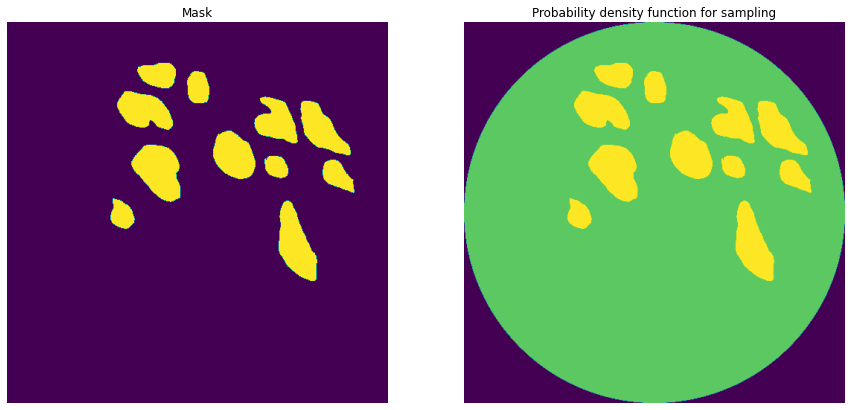

id                                                              23009
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 895442 8 898441 11 901440 14 904439 16 907438 ...
age                                                              61.0
sex                                                              Male
Name: 142, dtype: object
23009
Saving msk
Resizing PDF
Saving pdf cumsum


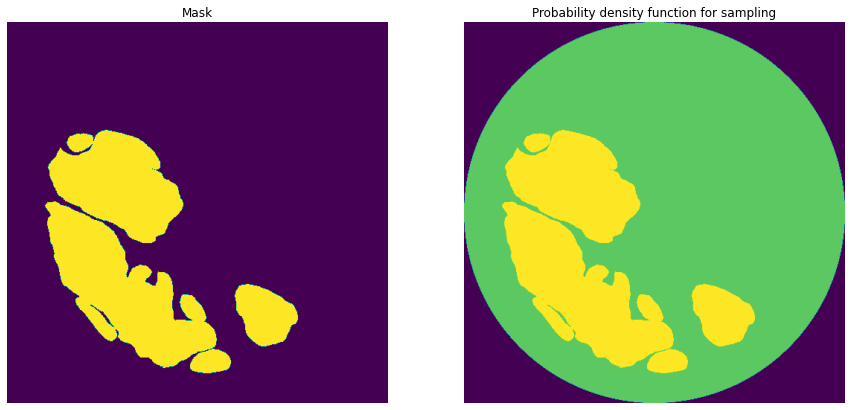

id                                                              23051
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 775424 5 778414 30 781401 52 784395 60 787387 ...
age                                                              41.0
sex                                                            Female
Name: 143, dtype: object
23051
Saving msk
Resizing PDF
Saving pdf cumsum


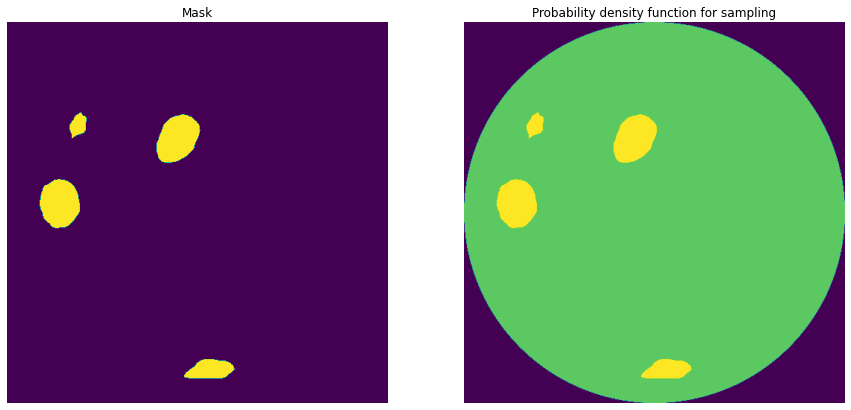

id                                                              23094
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 5252280 9 5252296 17 5255263 55 5258261 59 526...
age                                                              55.0
sex                                                            Female
Name: 144, dtype: object
23094
Saving msk
Resizing PDF
Saving pdf cumsum


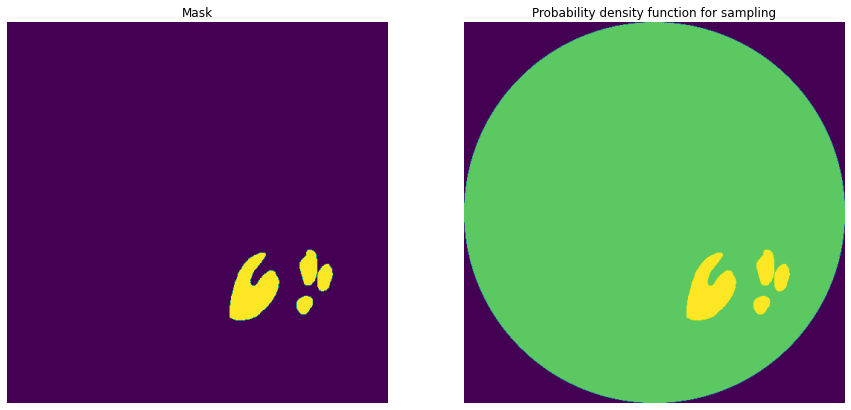

id                                                              23243
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2705629 5 2708627 7 2711625 8 2714623 10 27176...
age                                                              56.0
sex                                                            Female
Name: 145, dtype: object
23243
Saving msk
Resizing PDF
Saving pdf cumsum


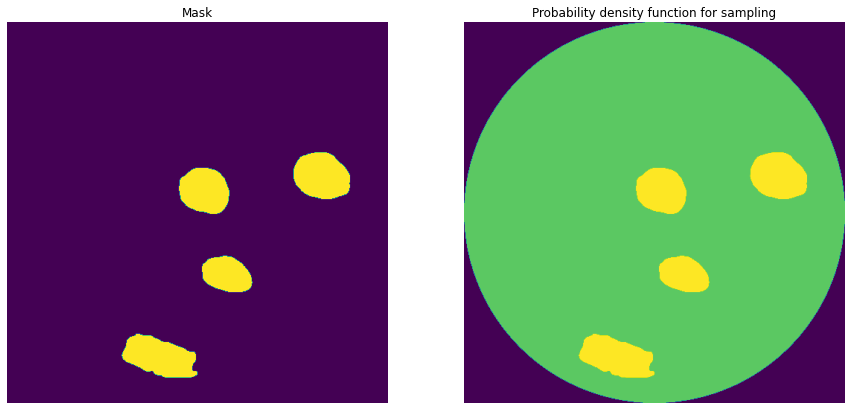

id                                                              23252
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1027419 12 1030417 16 1033415 20 1036414 23 10...
age                                                              43.0
sex                                                            Female
Name: 146, dtype: object
23252
Saving msk
Resizing PDF
Saving pdf cumsum


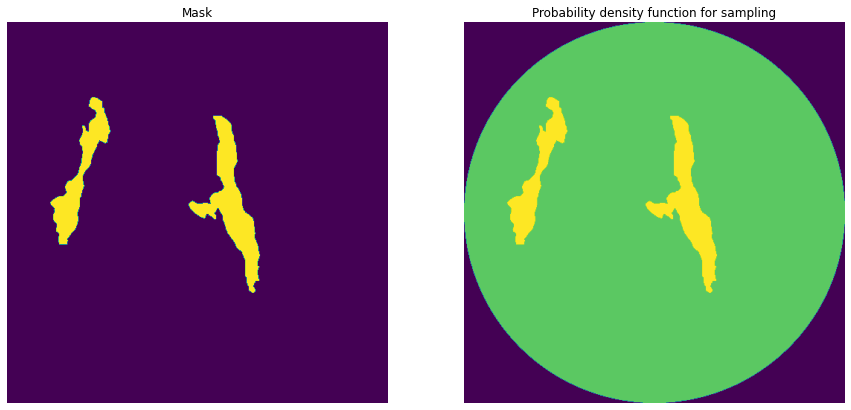

id                                                               2344
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2764
img_width                                                        2764
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1063180 23 1065932 51 1068693 63 1071453 74 10...
age                                                              56.0
sex                                                            Female
Name: 147, dtype: object
2344
Saving msk
Resizing PDF
Saving pdf cumsum


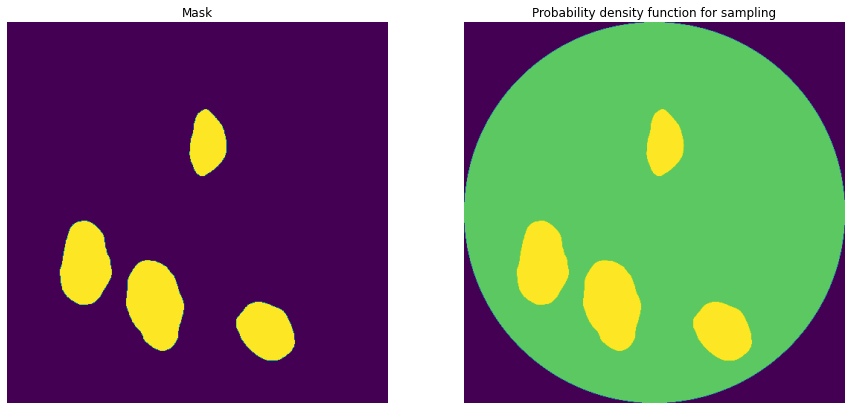

id                                                              23640
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2461089 26 2464087 32 2467085 38 2470083 44 24...
age                                                              55.0
sex                                                              Male
Name: 148, dtype: object
23640
Saving msk
Resizing PDF
Saving pdf cumsum


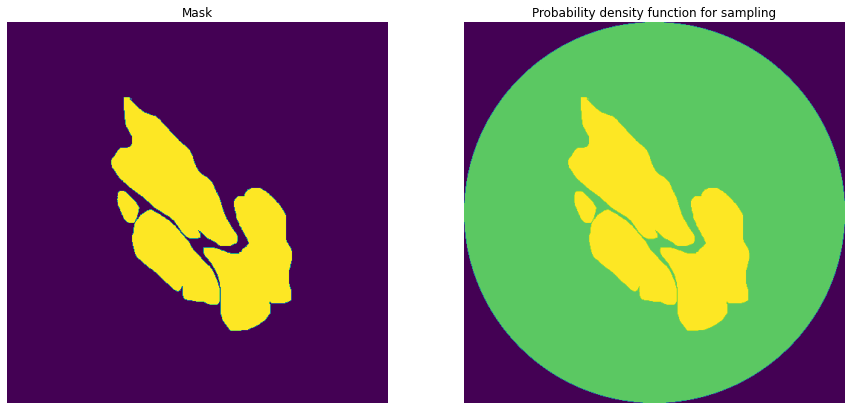

id                                                              23665
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 778273 30 781264 41 784261 45 787260 48 790258...
age                                                              61.0
sex                                                              Male
Name: 149, dtype: object
23665
Saving msk
Resizing PDF
Saving pdf cumsum


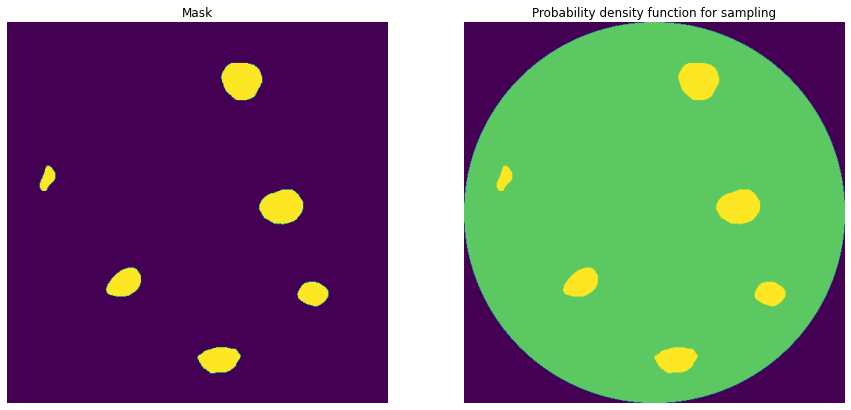

id                                                              23760
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2764
img_width                                                        2764
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1381505 18 1384265 34 1387026 39 1389785 47 13...
age                                                              68.0
sex                                                            Female
Name: 150, dtype: object
23760
Saving msk
Resizing PDF
Saving pdf cumsum


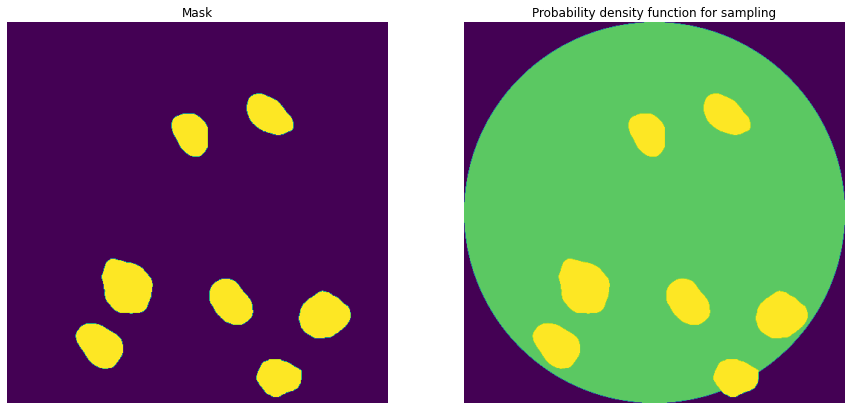

id                                                              23828
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4465824 6 4468823 9 4471816 23 4474814 27 4477...
age                                                              48.0
sex                                                              Male
Name: 151, dtype: object
23828
Saving msk
Resizing PDF
Saving pdf cumsum


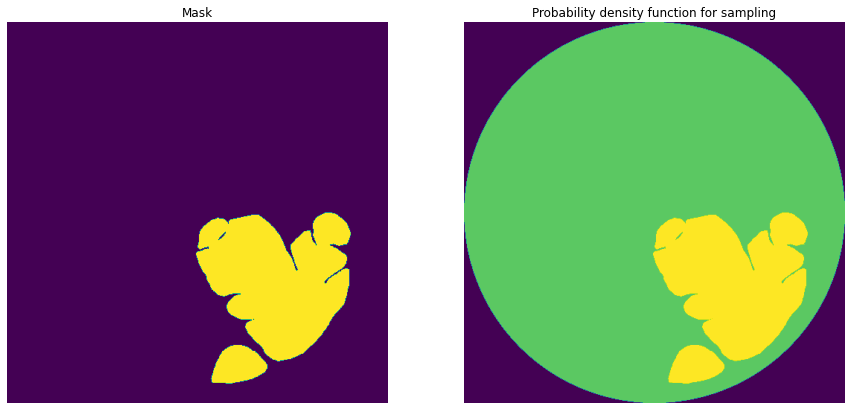

id                                                              23880
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 862386 53 865383 60 868382 63 871379 68 874301...
age                                                              59.0
sex                                                              Male
Name: 152, dtype: object
23880
Saving msk
Resizing PDF
Saving pdf cumsum


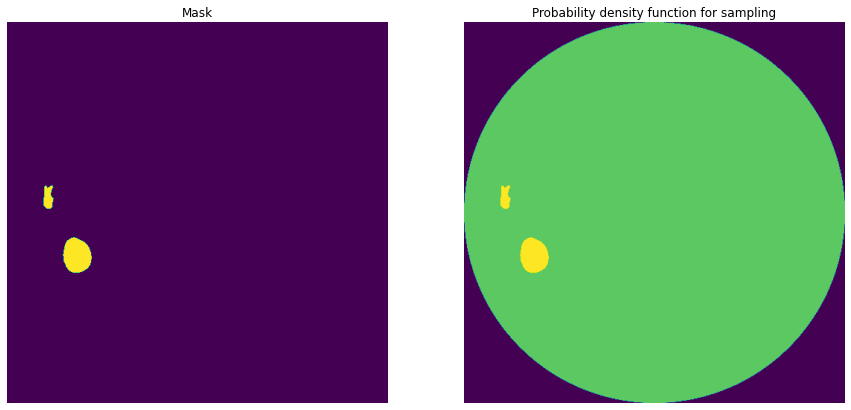

id                                                              23959
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2188937 12 2191929 26 2194927 29 2197924 37 22...
age                                                              55.0
sex                                                              Male
Name: 153, dtype: object
23959
Saving msk
Resizing PDF
Saving pdf cumsum


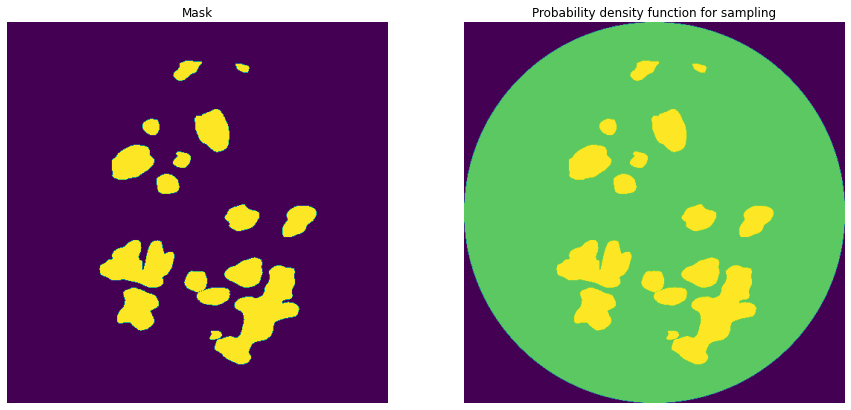

id                                                              23961
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1024472 18 1027471 20 1030466 35 1030562 20 10...
age                                                              48.0
sex                                                              Male
Name: 154, dtype: object
23961
Saving msk
Resizing PDF
Saving pdf cumsum


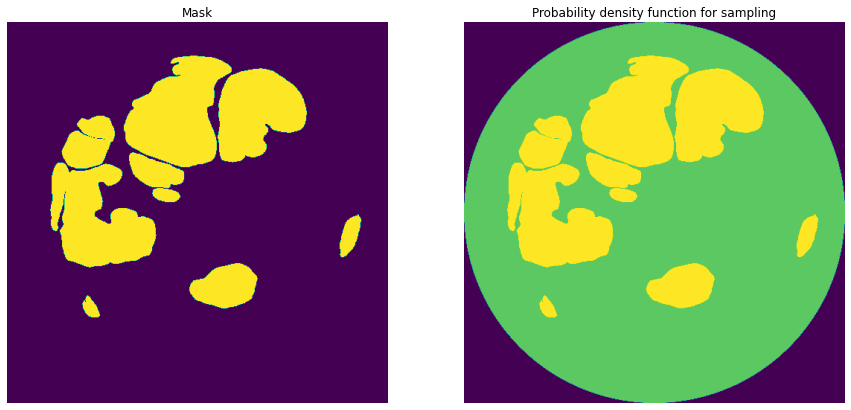

id                                                              24097
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1514218 28 1517214 32 1520213 36 1523211 40 15...
age                                                              61.0
sex                                                              Male
Name: 155, dtype: object
24097
Saving msk
Resizing PDF
Saving pdf cumsum


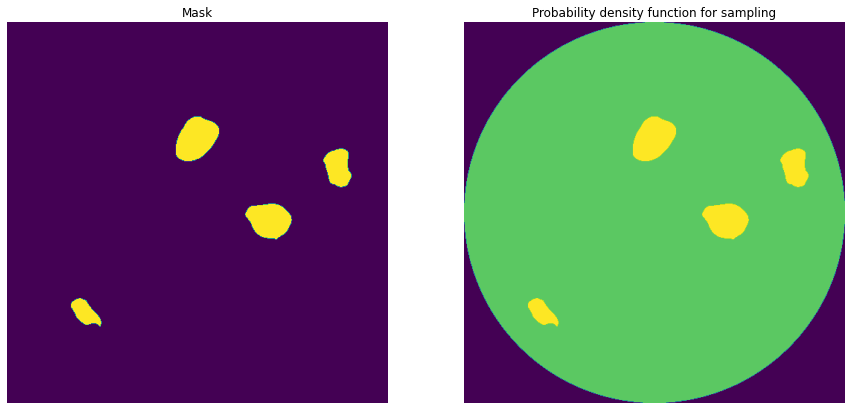

id                                                              24100
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1392950 5 1395945 19 1398942 26 1401938 31 140...
age                                                              68.0
sex                                                            Female
Name: 156, dtype: object
24100
Saving msk
Resizing PDF
Saving pdf cumsum


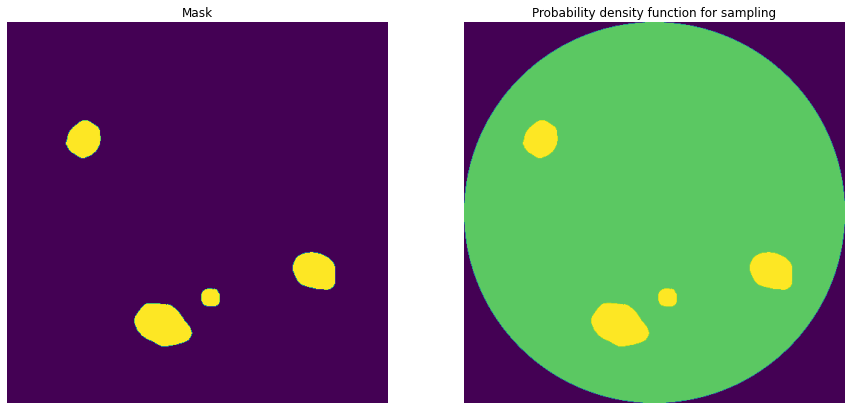

id                                                              24194
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 829696 7 832685 28 835684 30 838674 52 841666 ...
age                                                              60.0
sex                                                              Male
Name: 157, dtype: object
24194
Saving msk
Resizing PDF
Saving pdf cumsum


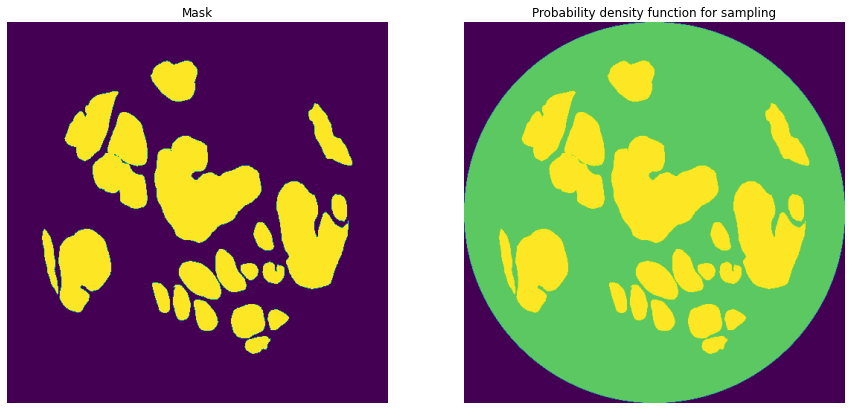

id                                                              24222
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1536567 143 1539565 147 1542564 149 1545562 15...
age                                                              28.0
sex                                                              Male
Name: 158, dtype: object
24222
Saving msk
Resizing PDF
Saving pdf cumsum


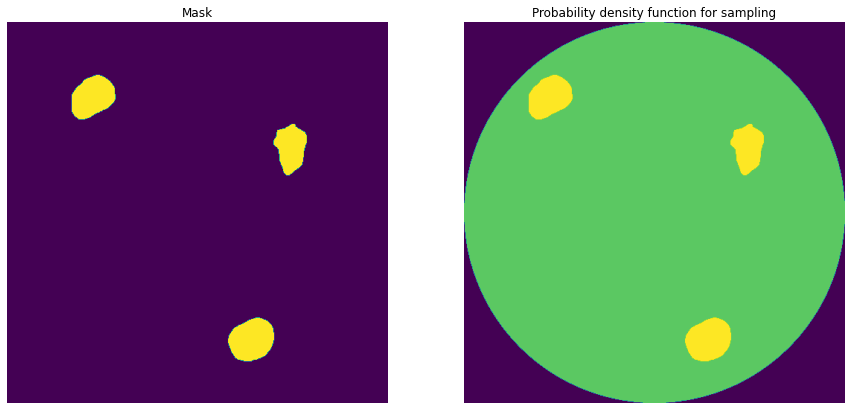

id                                                               2424
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1690292 25 1693289 31 1696286 37 1699281 46 17...
age                                                              41.0
sex                                                            Female
Name: 159, dtype: object
2424
Saving msk
Resizing PDF
Saving pdf cumsum


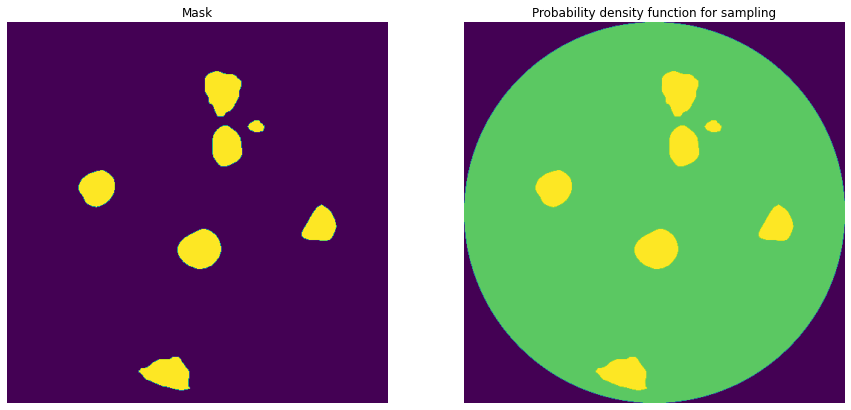

id                                                              24241
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3983495 17 3986480 48 3989477 62 3992474 70 39...
age                                                              73.0
sex                                                              Male
Name: 160, dtype: object
24241
Saving msk
Resizing PDF
Saving pdf cumsum


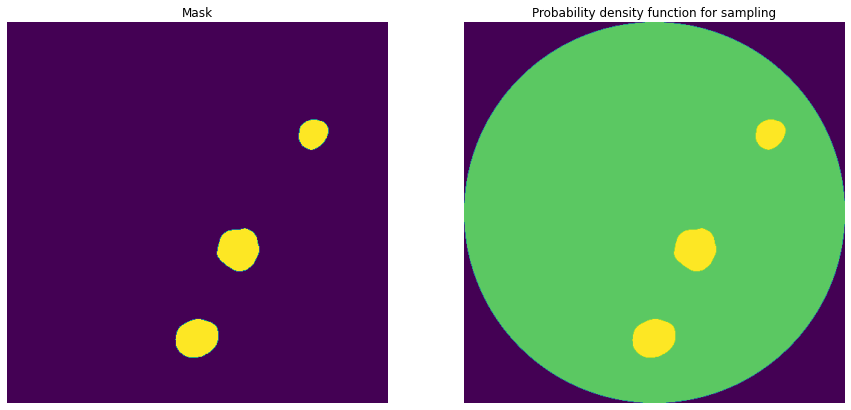

id                                                              24269
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1188968 1 1191968 2 1194967 3 1197967 4 120092...
age                                                              48.0
sex                                                              Male
Name: 161, dtype: object
24269
Saving msk
Resizing PDF
Saving pdf cumsum


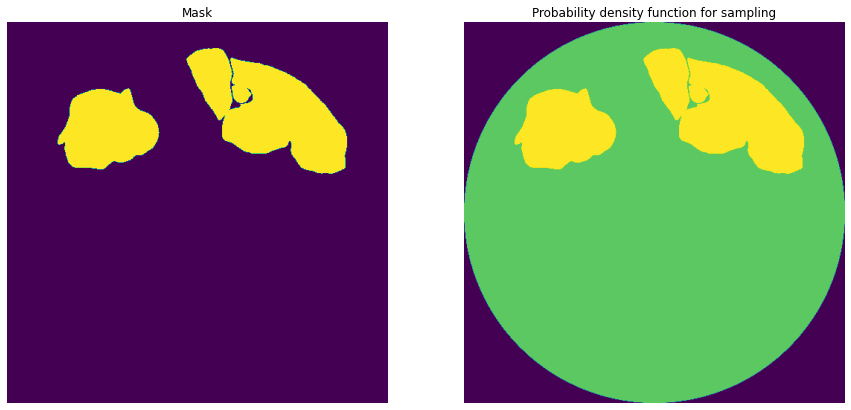

id                                                               2447
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 990994 32 993994 33 996991 44 999989 50 100298...
age                                                              28.0
sex                                                              Male
Name: 162, dtype: object
2447
Saving msk
Resizing PDF
Saving pdf cumsum


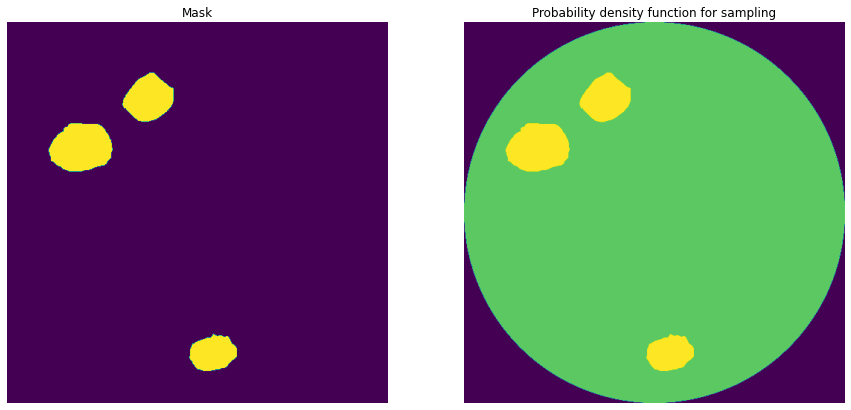

id                                                              24522
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4743888 16 4746880 28 4749875 37 4752869 49 47...
age                                                              41.0
sex                                                            Female
Name: 163, dtype: object
24522
Saving msk
Resizing PDF
Saving pdf cumsum


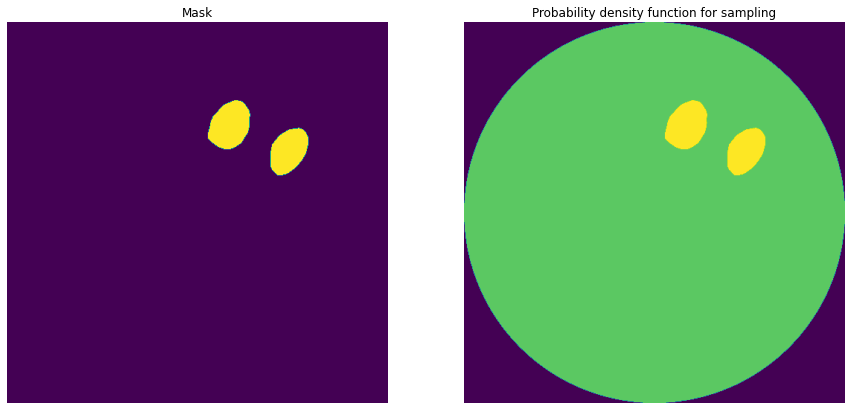

id                                                              24782
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4734932 2 4737931 4 4740931 5 4743917 1 474393...
age                                                              78.0
sex                                                              Male
Name: 164, dtype: object
24782
Saving msk
Resizing PDF
Saving pdf cumsum


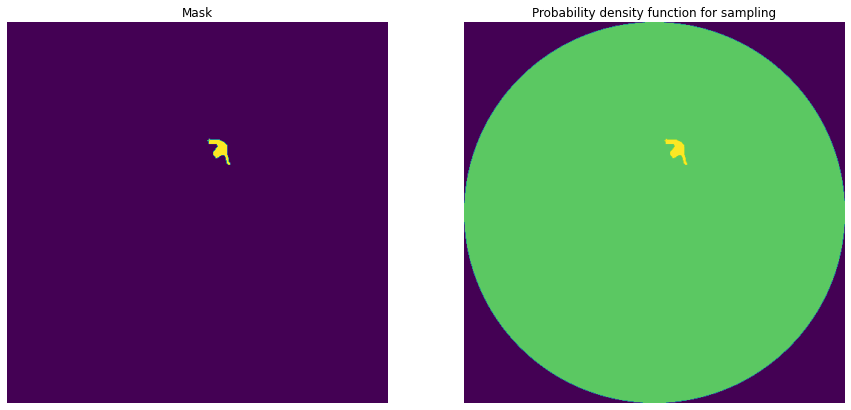

id                                                              24833
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1956905 6 1959904 7 1962903 8 1965902 9 196890...
age                                                              50.0
sex                                                            Female
Name: 165, dtype: object
24833
Saving msk
Resizing PDF
Saving pdf cumsum


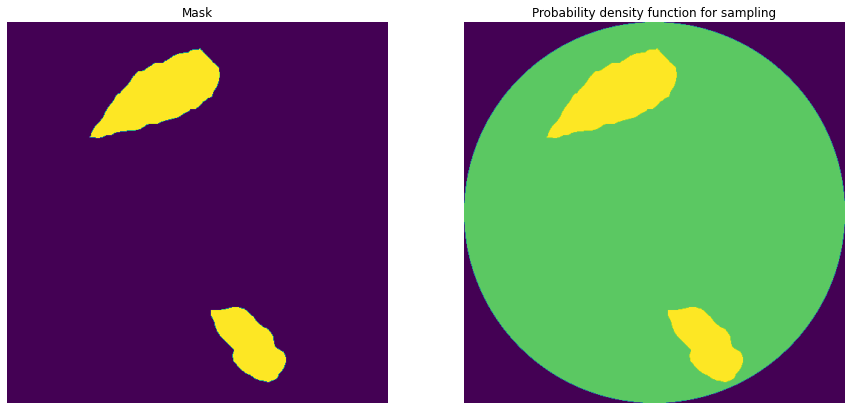

id                                                              24961
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1006518 8 1009518 8 1012515 26 1012562 34 1015...
age                                                              48.0
sex                                                              Male
Name: 166, dtype: object
24961
Saving msk
Resizing PDF
Saving pdf cumsum


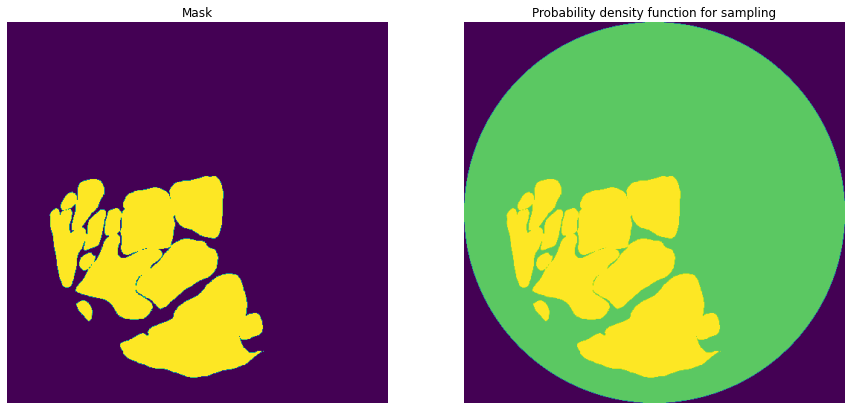

id                                                               2500
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 856294 21 859290 30 862286 38 865280 48 868278...
age                                                              59.0
sex                                                              Male
Name: 167, dtype: object
2500
Saving msk
Resizing PDF
Saving pdf cumsum


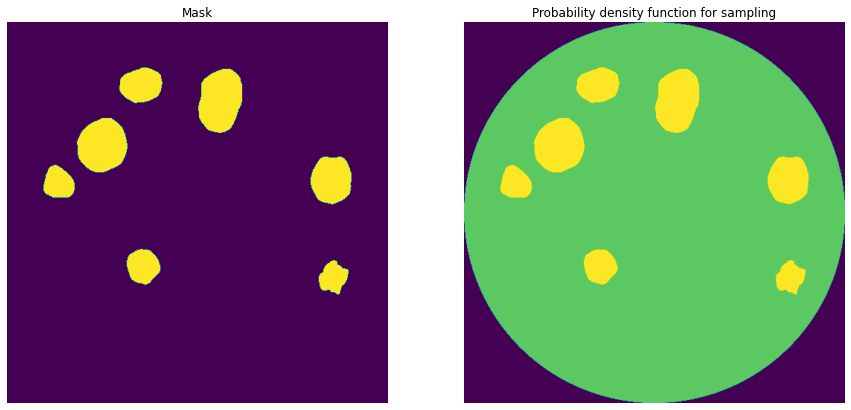

id                                                              25298
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 787420 29 790417 35 793406 54 796404 58 799402...
age                                                              84.0
sex                                                            Female
Name: 168, dtype: object
25298
Saving msk
Resizing PDF
Saving pdf cumsum


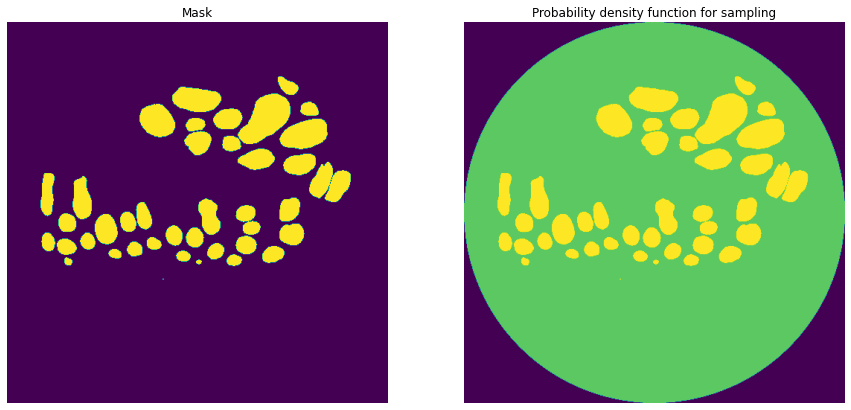

id                                                              25430
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1937513 7 1940511 10 1943510 12 1946509 17 194...
age                                                              61.0
sex                                                              Male
Name: 169, dtype: object
25430
Saving msk
Resizing PDF
Saving pdf cumsum


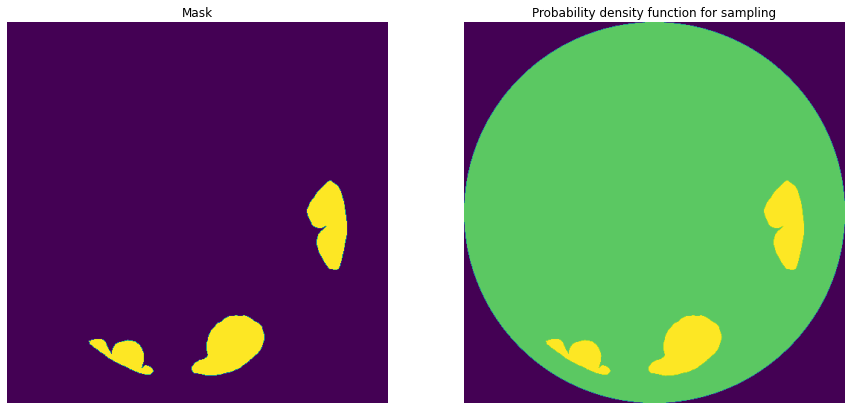

id                                                              25472
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 751904 15 754888 32 757880 45 760878 53 763876...
age                                                              74.0
sex                                                            Female
Name: 170, dtype: object
25472
Saving msk
Resizing PDF
Saving pdf cumsum


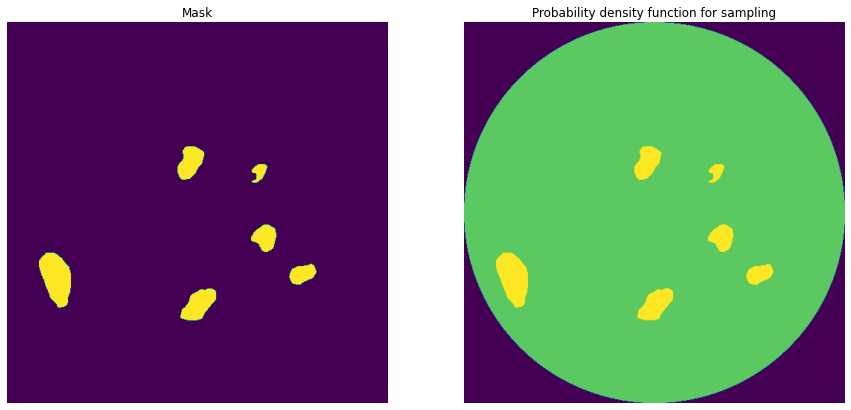

id                                                              25516
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4278843 10 4281842 13 4284842 15 4287841 20 42...
age                                                              67.0
sex                                                            Female
Name: 171, dtype: object
25516
Saving msk
Resizing PDF
Saving pdf cumsum


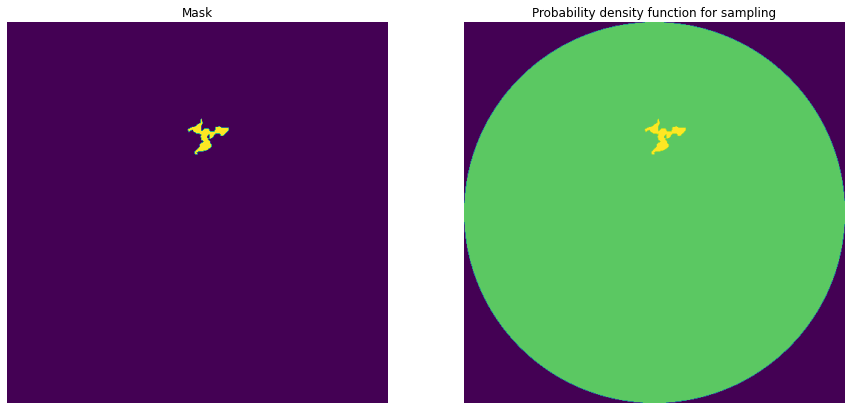

id                                                              25620
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2062029 24 2065028 27 2068024 36 2071022 41 20...
age                                                              28.0
sex                                                              Male
Name: 172, dtype: object
25620
Saving msk
Resizing PDF
Saving pdf cumsum


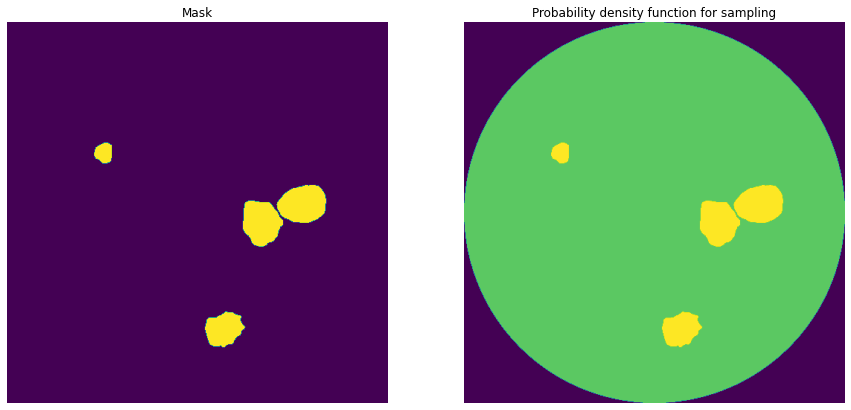

id                                                              25641
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2441589 4 2444586 9 2447585 12 2450584 15 2453...
age                                                              84.0
sex                                                            Female
Name: 173, dtype: object
25641
Saving msk
Resizing PDF
Saving pdf cumsum


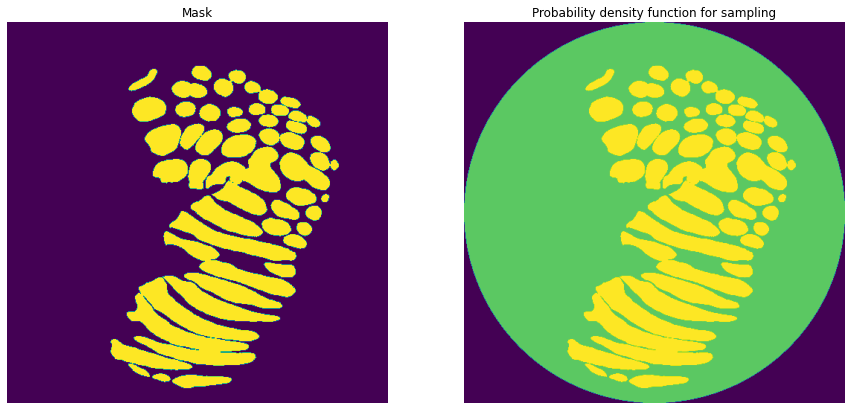

id                                                              25689
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 502170 55 505147 92 508137 106 511126 130 5141...
age                                                              65.0
sex                                                            Female
Name: 174, dtype: object
25689
Saving msk
Resizing PDF
Saving pdf cumsum


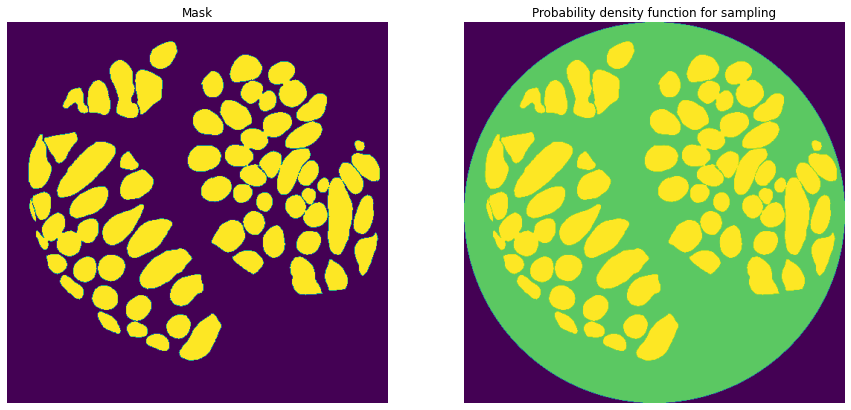

id                                                              25945
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 697159 8 700159 13 703158 18 706158 22 709158 ...
age                                                              59.0
sex                                                              Male
Name: 175, dtype: object
25945
Saving msk
Resizing PDF
Saving pdf cumsum


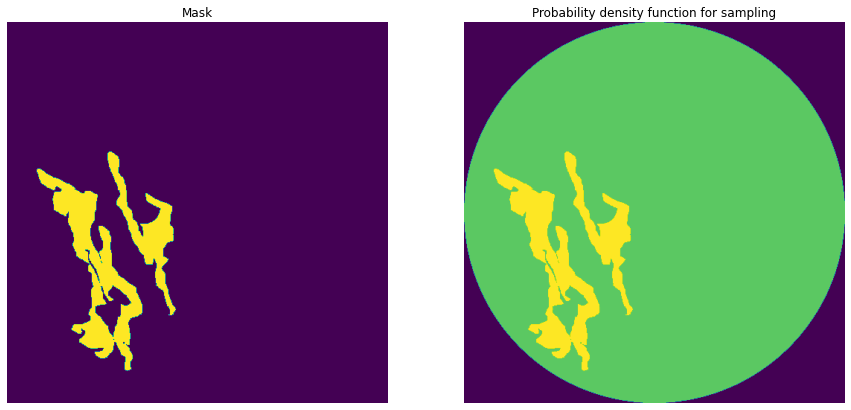

id                                                              26101
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 790673 20 793670 27 793735 18 796669 30 796731...
age                                                              70.0
sex                                                              Male
Name: 176, dtype: object
26101
Saving msk
Resizing PDF
Saving pdf cumsum


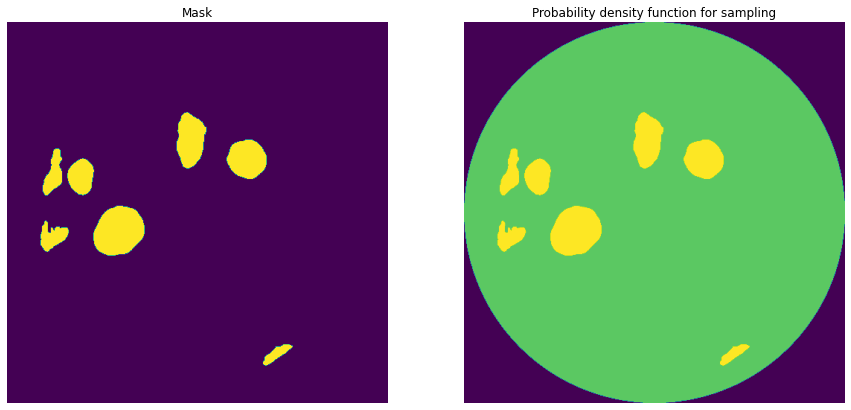

id                                                              26174
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4862669 12 4865656 34 4868649 45 4871647 48 48...
age                                                              59.0
sex                                                              Male
Name: 177, dtype: object
26174
Saving msk
Resizing PDF
Saving pdf cumsum


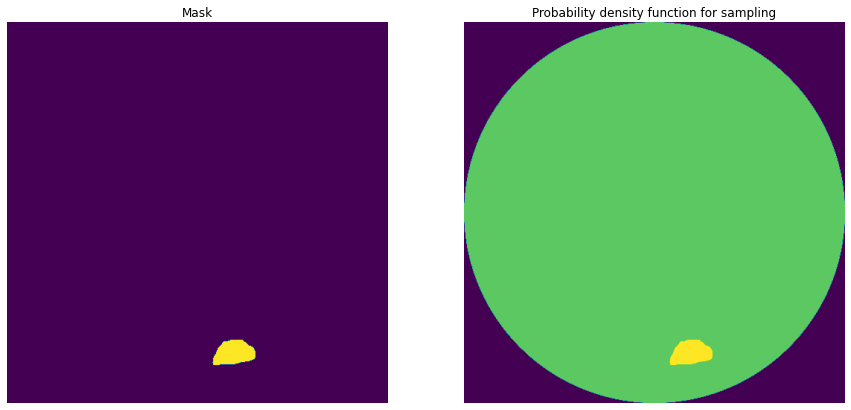

id                                                              26319
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 688497 34 688545 19 691492 89 694490 93 697319...
age                                                              84.0
sex                                                              Male
Name: 178, dtype: object
26319
Saving msk
Resizing PDF
Saving pdf cumsum


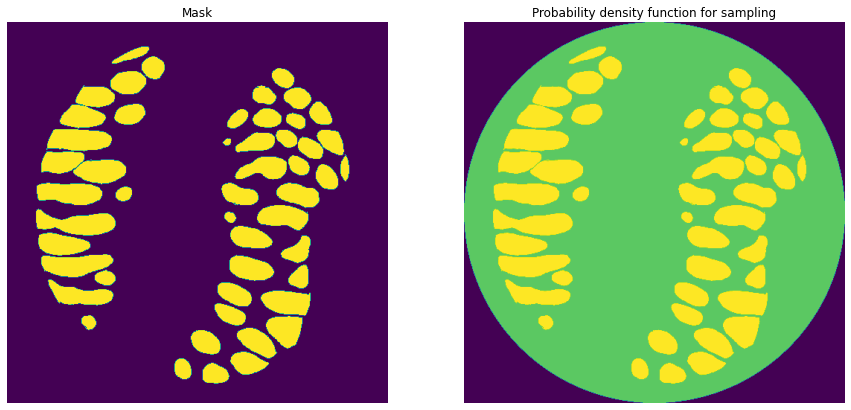

id                                                              26480
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2750028 6 2753027 9 2756027 10 2759026 11 2762...
age                                                              49.0
sex                                                            Female
Name: 179, dtype: object
26480
Saving msk
Resizing PDF
Saving pdf cumsum


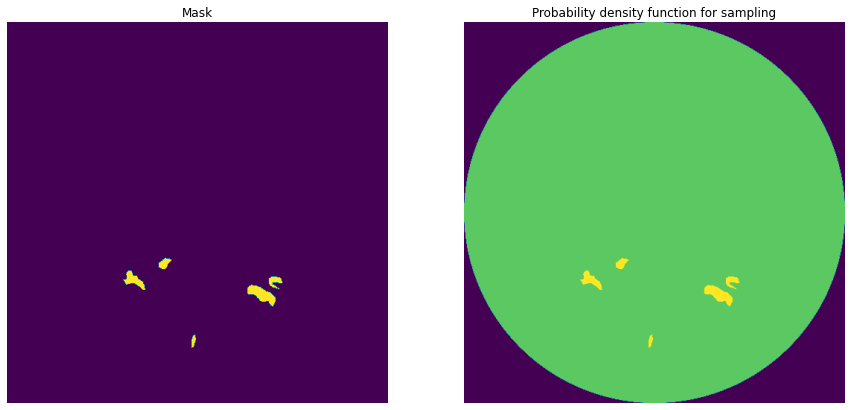

id                                                              26664
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 973291 50 976287 58 979283 64 982278 71 985272...
age                                                              50.0
sex                                                            Female
Name: 180, dtype: object
26664
Saving msk
Resizing PDF
Saving pdf cumsum


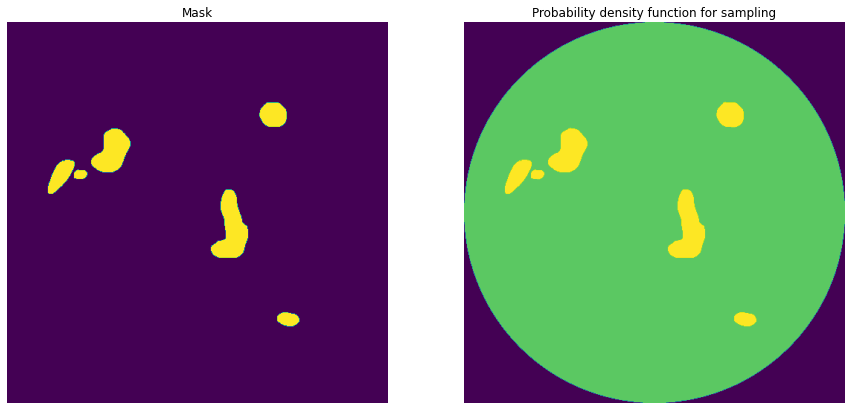

id                                                               2668
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2783
img_width                                                        2783
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4232720 15 4235501 22 4238277 32 4241057 44 42...
age                                                              68.0
sex                                                            Female
Name: 181, dtype: object
2668
Saving msk
Resizing PDF
Saving pdf cumsum


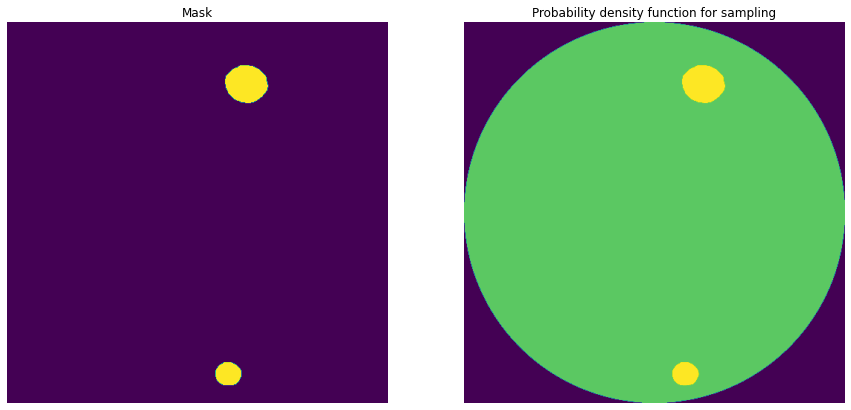

id                                                              26780
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 868532 2 868571 1 871488 9 871531 10 871571 2 ...
age                                                              65.0
sex                                                            Female
Name: 182, dtype: object
26780
Saving msk
Resizing PDF
Saving pdf cumsum


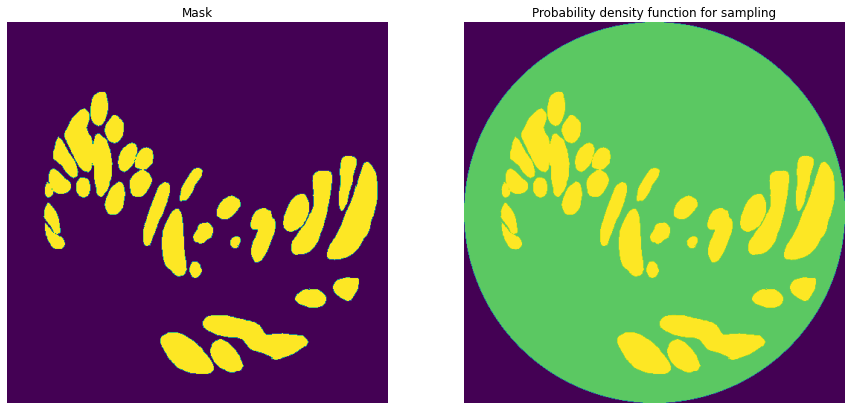

id                                                              26886
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 799407 11 802404 4 802410 22 805404 3 805411 2...
age                                                              79.0
sex                                                            Female
Name: 183, dtype: object
26886
Saving msk
Resizing PDF
Saving pdf cumsum


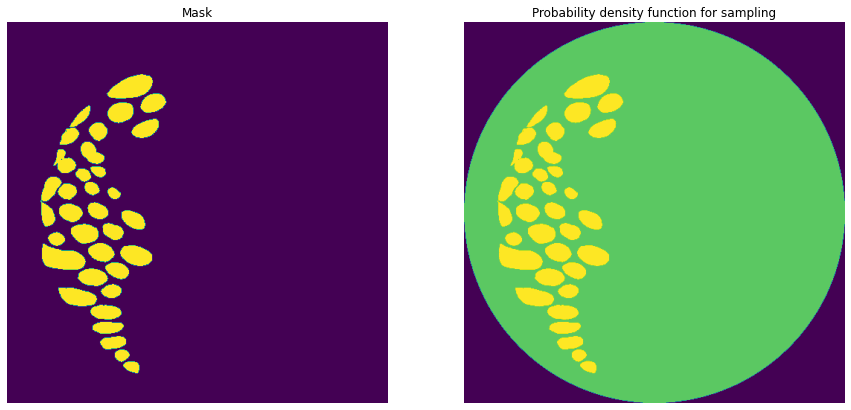

id                                                               2696
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 745559 4 748555 30 751554 34 754552 38 757547 ...
age                                                              84.0
sex                                                            Female
Name: 184, dtype: object
2696
Saving msk
Resizing PDF
Saving pdf cumsum


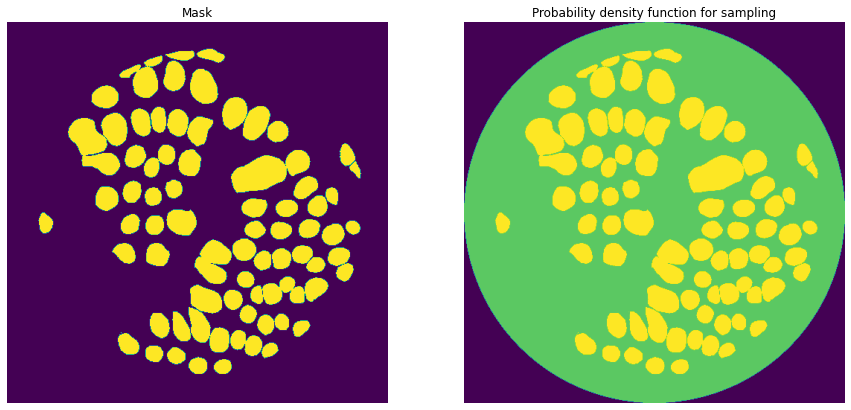

id                                                              26982
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1638919 12 1641918 14 1644910 24 1647909 27 16...
age                                                              55.0
sex                                                              Male
Name: 185, dtype: object
26982
Saving msk
Resizing PDF
Saving pdf cumsum


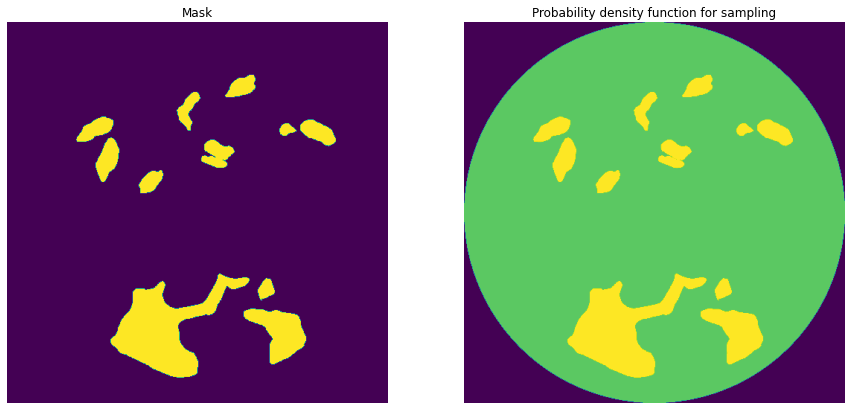

id                                                              27128
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 115382 69 118376 79 121348 115 124344 120 1273...
age                                                              84.0
sex                                                            Female
Name: 186, dtype: object
27128
Saving msk
Resizing PDF
Saving pdf cumsum


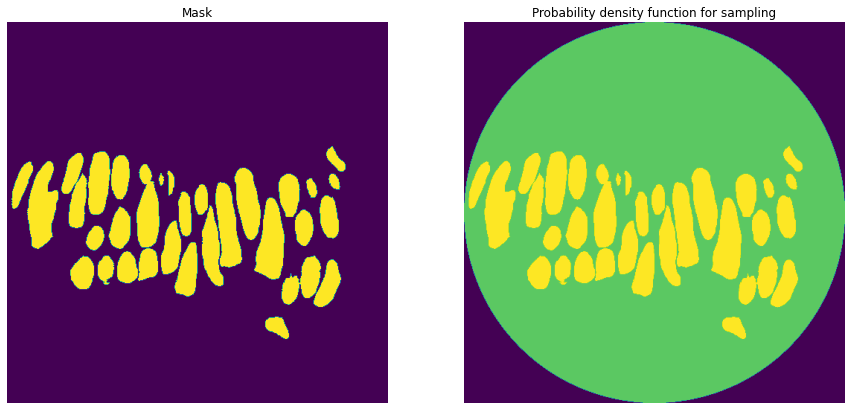

id                                                              27232
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1754231 15 1757231 16 1760229 18 1763227 21 17...
age                                                              43.0
sex                                                            Female
Name: 187, dtype: object
27232
Saving msk
Resizing PDF
Saving pdf cumsum


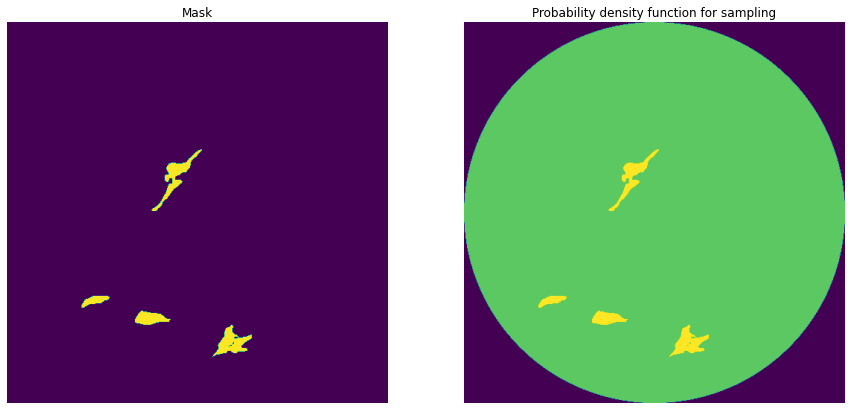

id                                                              27298
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 865475 19 868434 64 871427 86 874422 98 877418...
age                                                              70.0
sex                                                              Male
Name: 188, dtype: object
27298
Saving msk
Resizing PDF
Saving pdf cumsum


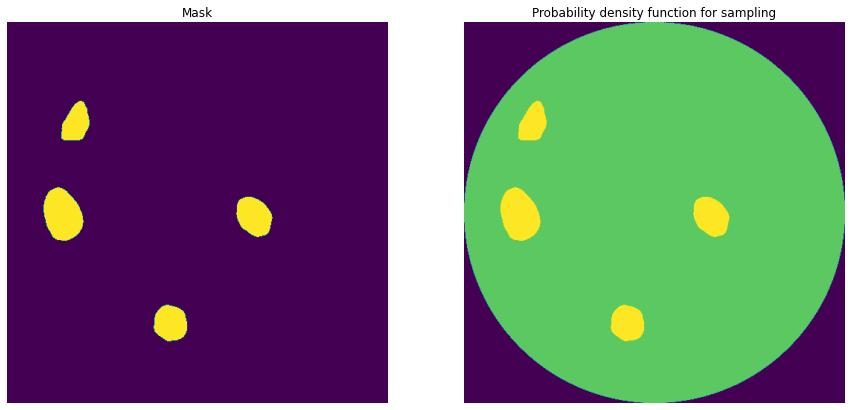

id                                                              27340
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 571719 7 574716 15 577714 19 580709 30 583707 ...
age                                                              84.0
sex                                                            Female
Name: 189, dtype: object
27340
Saving msk
Resizing PDF
Saving pdf cumsum


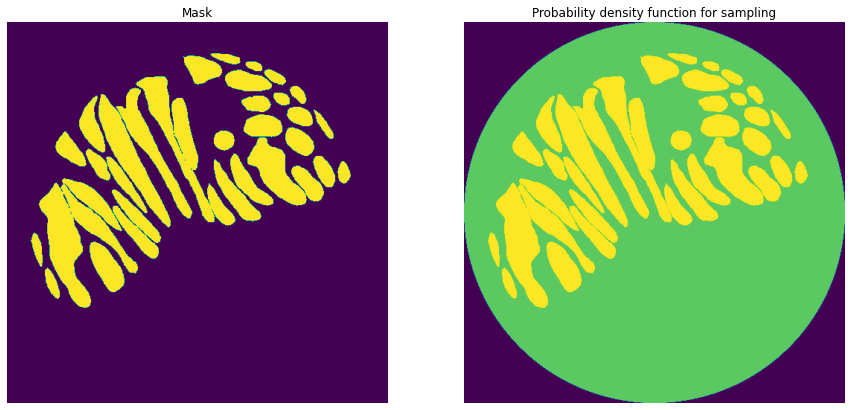

id                                                              27350
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 643429 157 646427 161 649422 192 652320 300 65...
age                                                              70.0
sex                                                              Male
Name: 190, dtype: object
27350
Saving msk
Resizing PDF
Saving pdf cumsum


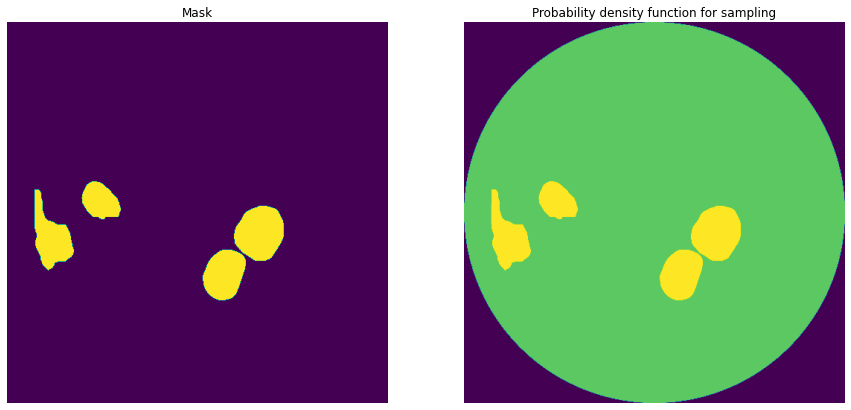

id                                                              27468
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3621977 28 3624970 128 3627968 130 3630966 139...
age                                                              73.0
sex                                                              Male
Name: 191, dtype: object
27468
Saving msk
Resizing PDF
Saving pdf cumsum


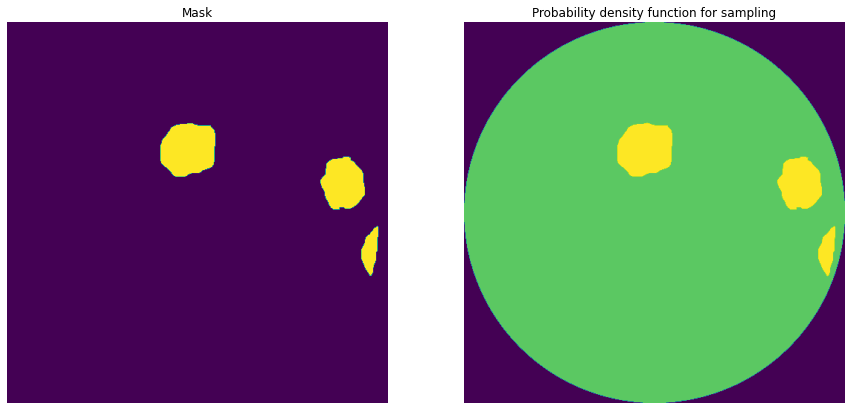

id                                                              27471
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1105636 28 1105755 13 1108635 30 1108754 16 11...
age                                                              76.0
sex                                                              Male
Name: 192, dtype: object
27471
Saving msk
Resizing PDF
Saving pdf cumsum


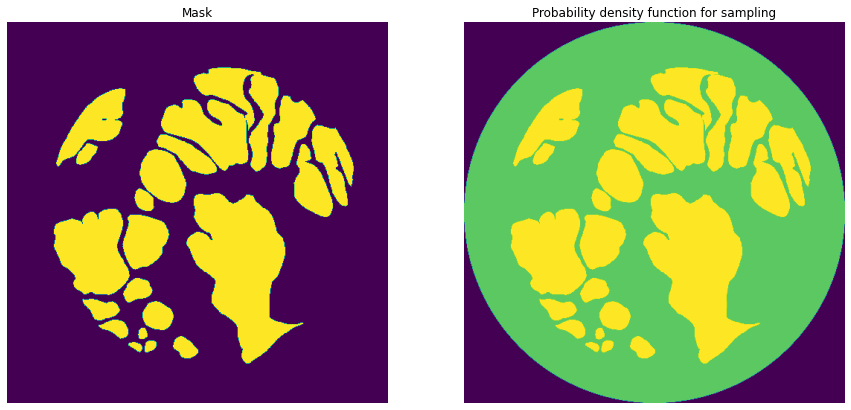

id                                                              27587
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1003265 14 1006262 20 1009254 31 1012252 35 10...
age                                                              83.0
sex                                                              Male
Name: 193, dtype: object
27587
Saving msk
Resizing PDF
Saving pdf cumsum


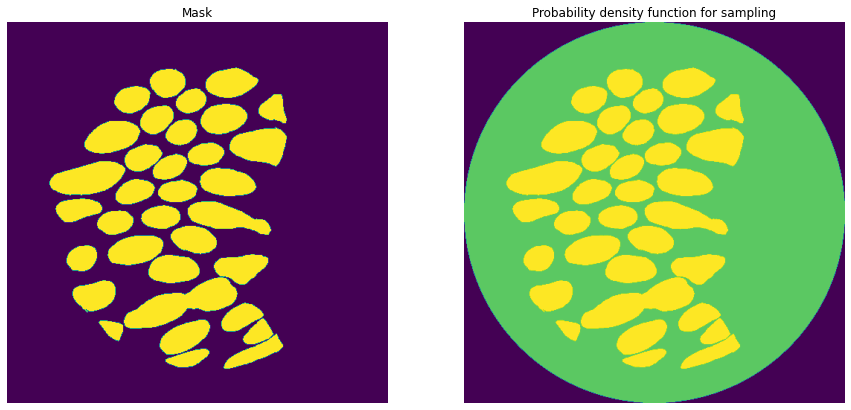

id                                                              27616
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1109181 15 1112179 24 1115177 36 1118176 43 11...
age                                                              73.0
sex                                                              Male
Name: 194, dtype: object
27616
Saving msk
Resizing PDF
Saving pdf cumsum


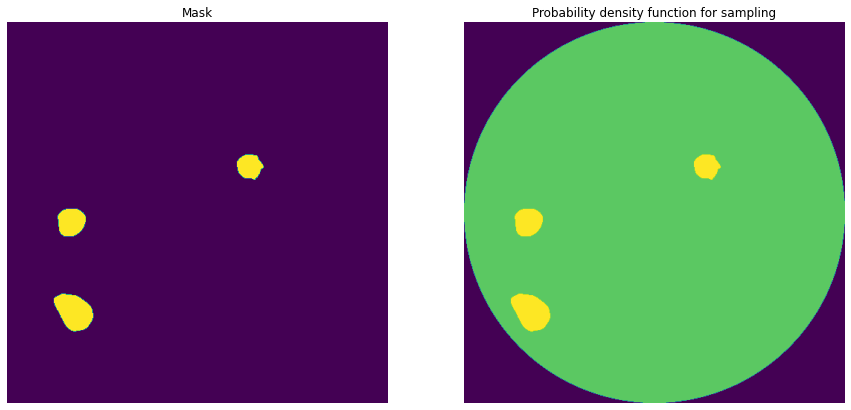

id                                                              27781
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 5085237 22 5088236 24 5091223 39 5094222 42 50...
age                                                              74.0
sex                                                            Female
Name: 195, dtype: object
27781
Saving msk
Resizing PDF
Saving pdf cumsum


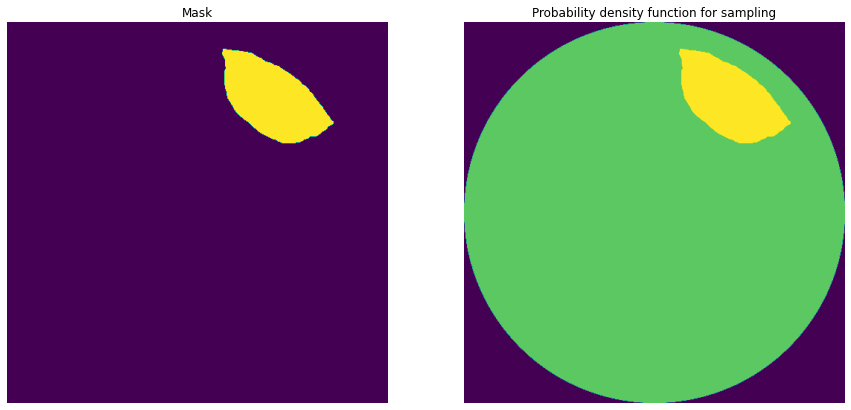

id                                                              27803
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4477218 66 4480214 74 4483210 82 4486206 89 44...
age                                                              21.0
sex                                                            Female
Name: 196, dtype: object
27803
Saving msk
Resizing PDF
Saving pdf cumsum


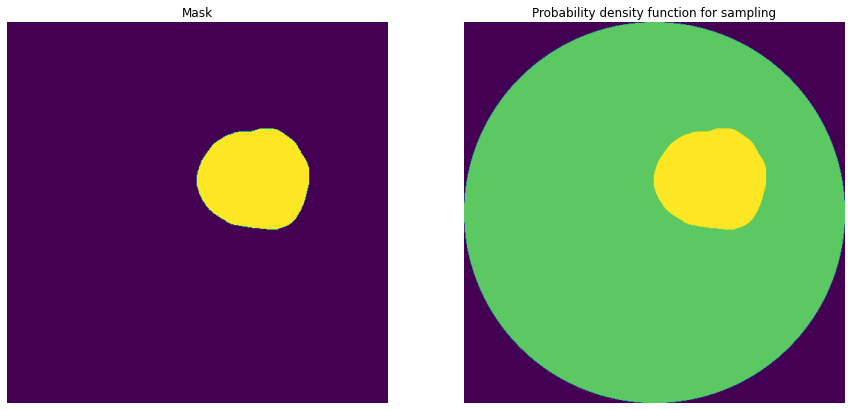

id                                                              27861
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 954 133 2043 81 2526 200 3954 133 5043 81 5348...
age                                                              84.0
sex                                                              Male
Name: 197, dtype: object
27861
Saving msk
Resizing PDF
Saving pdf cumsum


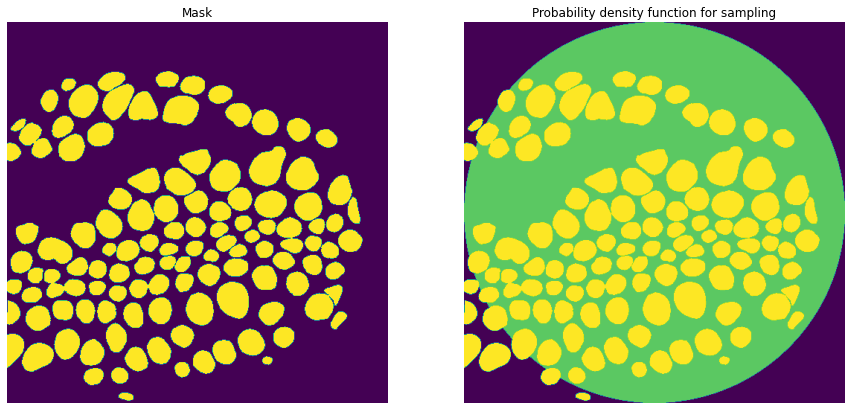

id                                                              27879
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1429275 9 1432266 26 1435260 36 1438240 59 144...
age                                                              70.0
sex                                                              Male
Name: 198, dtype: object
27879
Saving msk
Resizing PDF
Saving pdf cumsum


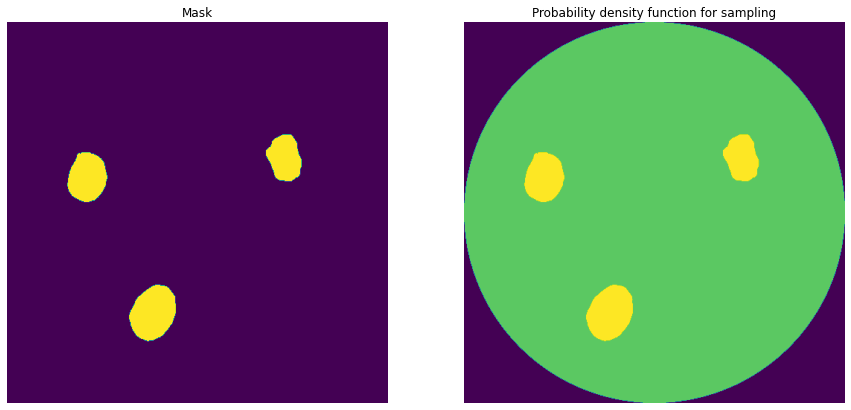

id                                                               2793
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2838513 13 2841512 16 2844511 19 2847511 21 28...
age                                                              21.0
sex                                                              Male
Name: 199, dtype: object
2793
Saving msk
Resizing PDF
Saving pdf cumsum


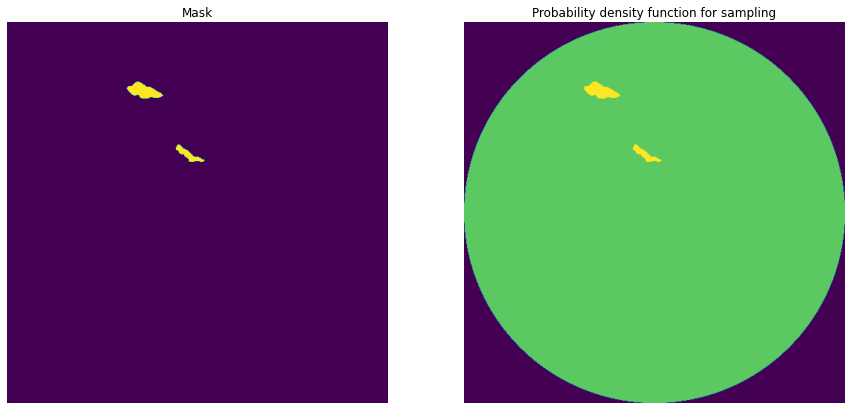

id                                                              28045
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 385585 33 388582 39 391569 58 394554 85 397541...
age                                                              83.0
sex                                                              Male
Name: 200, dtype: object
28045
Saving msk
Resizing PDF
Saving pdf cumsum


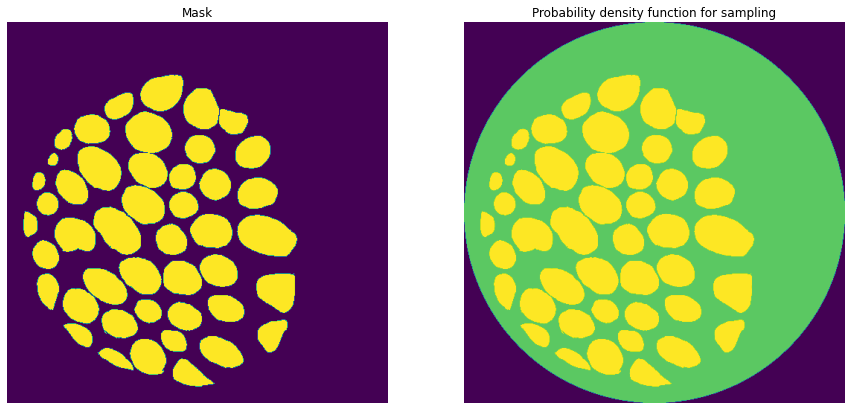

id                                                              28052
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3174798 14 3177796 18 3180794 21 3183792 24 31...
age                                                              67.0
sex                                                            Female
Name: 201, dtype: object
28052
Saving msk
Resizing PDF
Saving pdf cumsum


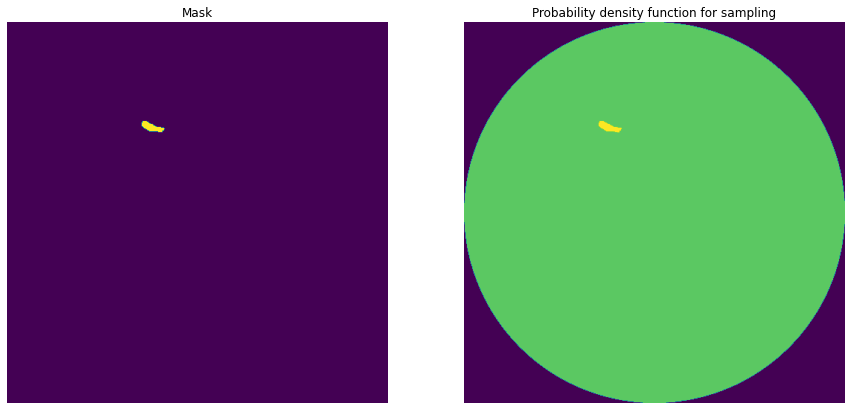

id                                                              28126
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3187369 48 3190367 53 3193364 67 3196363 70 31...
age                                                              70.0
sex                                                            Female
Name: 202, dtype: object
28126
Saving msk
Resizing PDF
Saving pdf cumsum


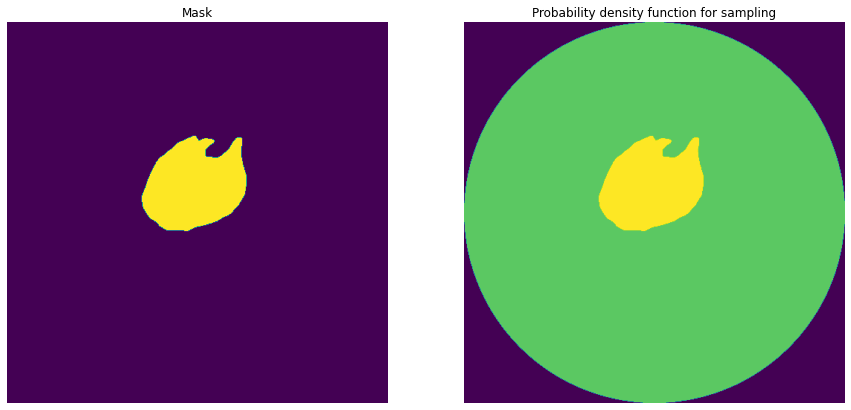

id                                                              28189
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2496818 25 2499816 29 2502807 39 2505805 41 25...
age                                                              49.0
sex                                                            Female
Name: 203, dtype: object
28189
Saving msk
Resizing PDF
Saving pdf cumsum


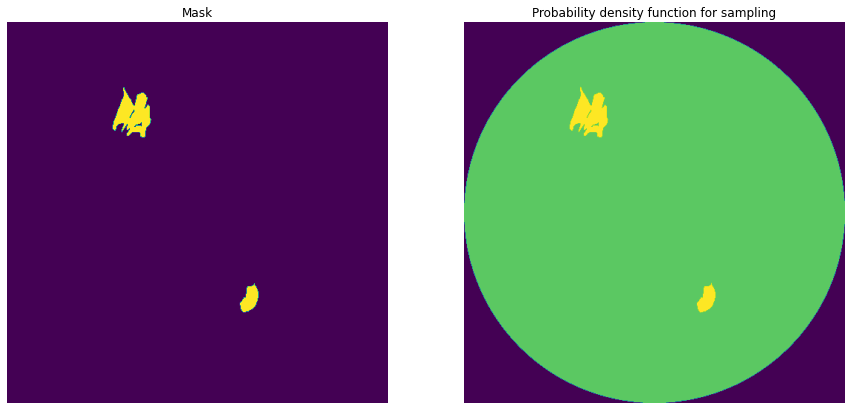

id                                                              28262
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1726325 20 1729319 40 1732316 61 1735313 78 17...
age                                                              59.0
sex                                                              Male
Name: 204, dtype: object
28262
Saving msk
Resizing PDF
Saving pdf cumsum


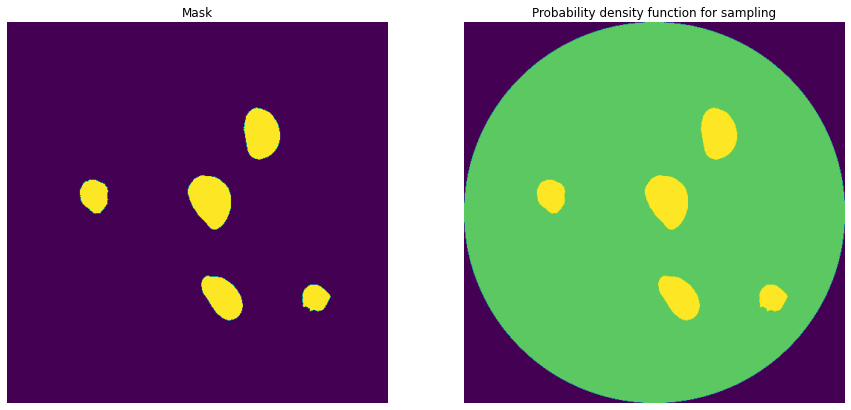

id                                                              28318
organ                                                        prostate
data_source                                                       HPA
img_height                                                       2869
img_width                                                        2869
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 322857 13 325718 38 328587 40 331447 57 334314...
age                                                              55.0
sex                                                              Male
Name: 205, dtype: object
28318
Saving msk
Resizing PDF
Saving pdf cumsum


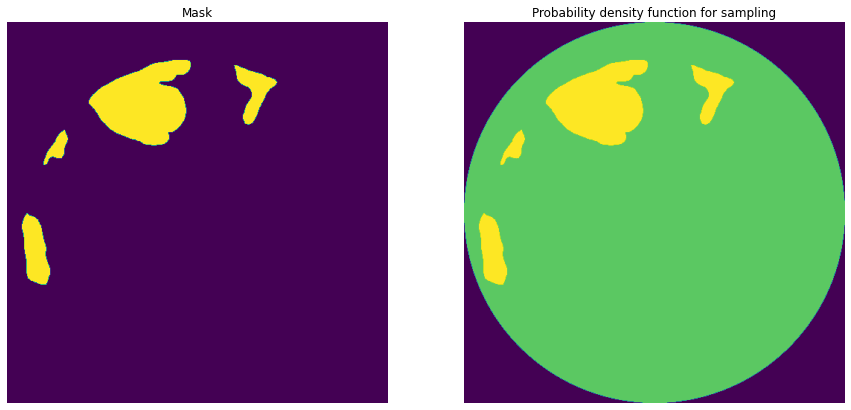

id                                                              28429
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2017859 2 2020858 5 2023857 8 2026856 11 20298...
age                                                              57.0
sex                                                            Female
Name: 206, dtype: object
28429
Saving msk
Resizing PDF
Saving pdf cumsum


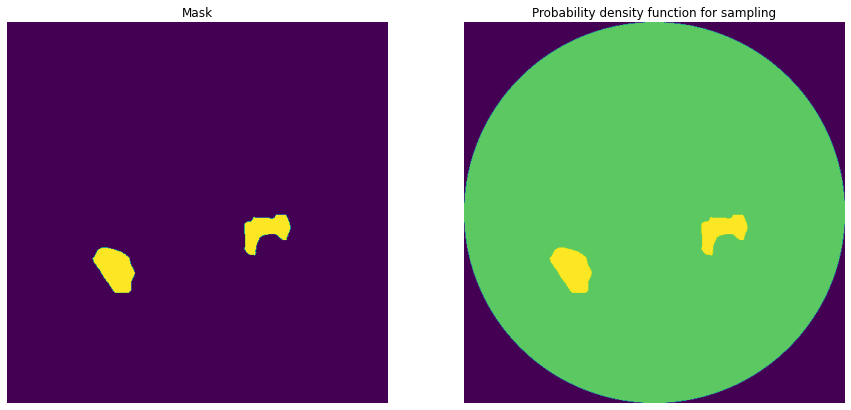

id                                                              28436
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 850381 7 853373 22 856362 37 859357 47 862354 ...
age                                                              70.0
sex                                                              Male
Name: 207, dtype: object
28436
Saving msk
Resizing PDF
Saving pdf cumsum


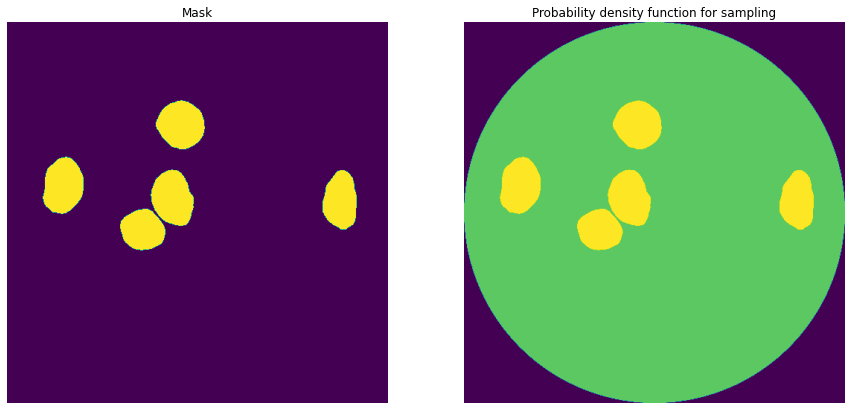

id                                                              28622
organ                                                        prostate
data_source                                                       HPA
img_height                                                       2654
img_width                                                        2654
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 125942 1 128595 2 131249 2 133897 7 136549 9 1...
age                                                              55.0
sex                                                              Male
Name: 208, dtype: object
28622
Saving msk
Resizing PDF
Saving pdf cumsum


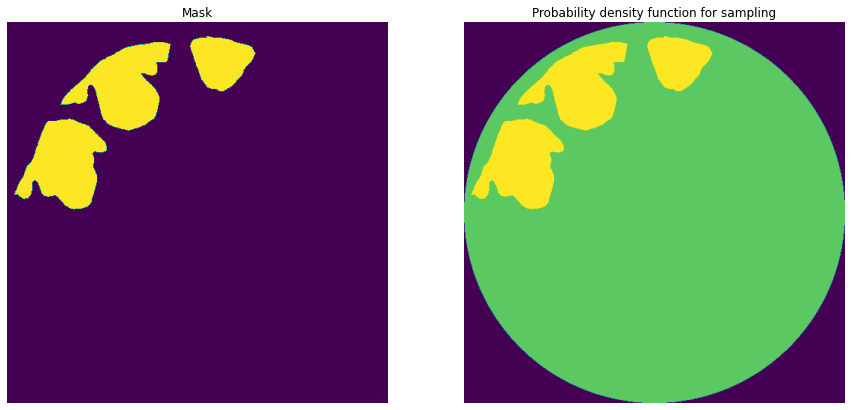

id                                                              28657
organ                                                          spleen
data_source                                                       HPA
img_height                                                       2760
img_width                                                        2760
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1077928 16 1080686 22 1083445 27 1086197 37 10...
age                                                              21.0
sex                                                            Female
Name: 209, dtype: object
28657
Saving msk
Resizing PDF
Saving pdf cumsum


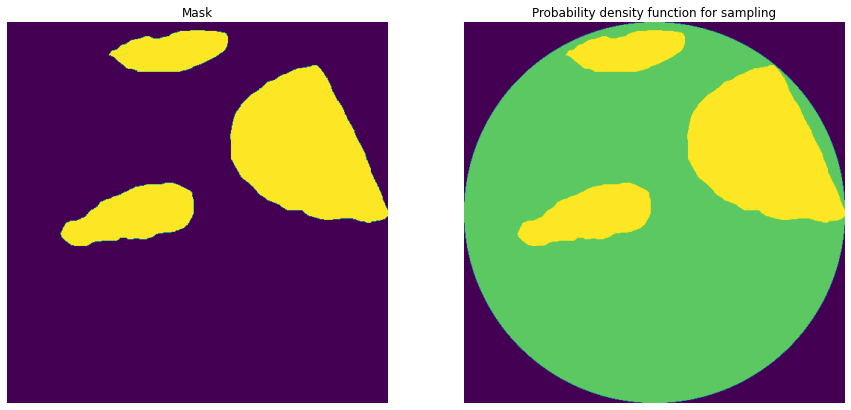

id                                                               2874
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2695444 33 2698434 50 2701429 58 2704425 64 27...
age                                                              68.0
sex                                                            Female
Name: 210, dtype: object
2874
Saving msk
Resizing PDF
Saving pdf cumsum


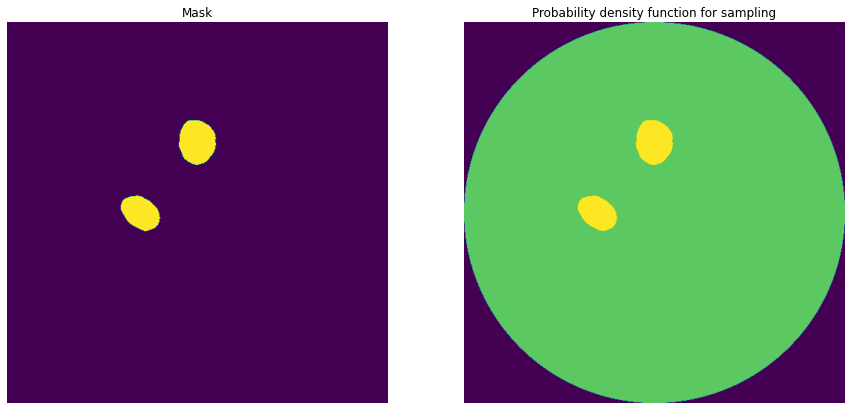

id                                                              28748
organ                                                          spleen
data_source                                                       HPA
img_height                                                       2630
img_width                                                        2630
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 340594 114 343221 120 345849 125 348476 131 35...
age                                                              72.0
sex                                                              Male
Name: 211, dtype: object
28748
Saving msk
Resizing PDF
Saving pdf cumsum


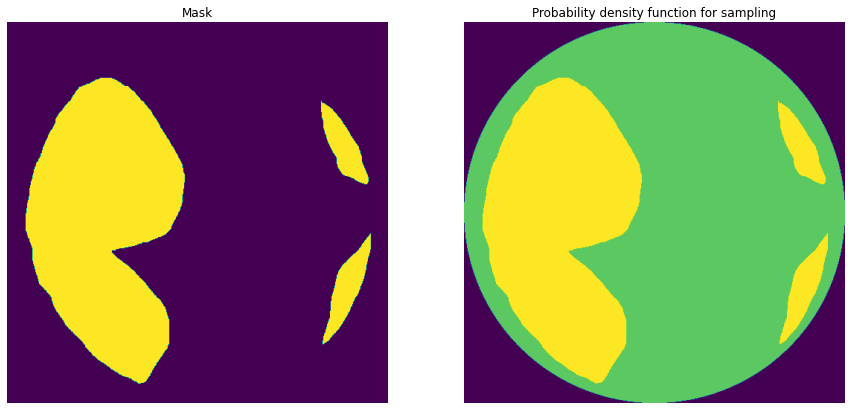

id                                                              28791
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 640348 24 643340 36 646332 49 649253 32 649317...
age                                                              84.0
sex                                                            Female
Name: 212, dtype: object
28791
Saving msk
Resizing PDF
Saving pdf cumsum


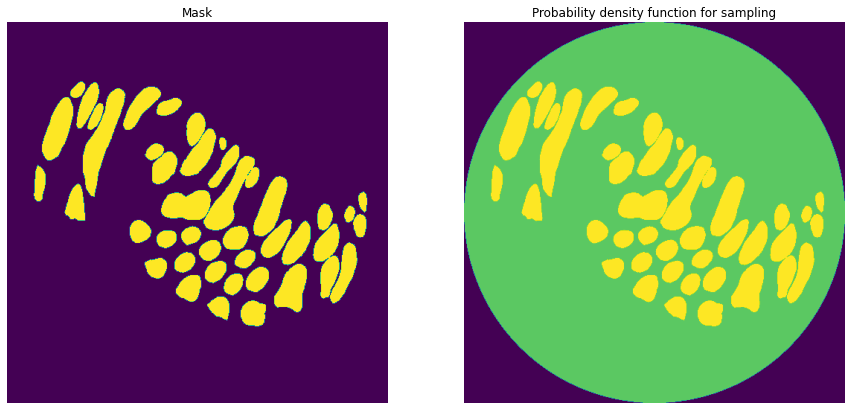

id                                                              28823
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1506929 14 1509925 24 1512924 28 1515920 36 15...
age                                                              70.0
sex                                                              Male
Name: 213, dtype: object
28823
Saving msk
Resizing PDF
Saving pdf cumsum


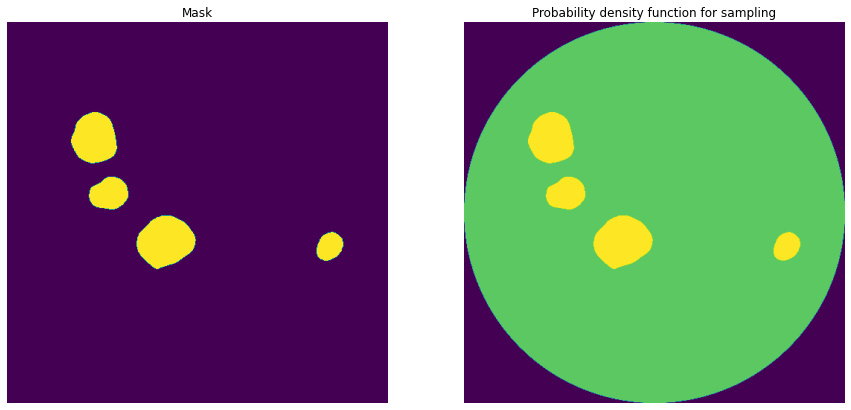

id                                                              28940
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1136037 3 1139019 29 1142004 44 1144998 50 114...
age                                                              56.0
sex                                                            Female
Name: 214, dtype: object
28940
Saving msk
Resizing PDF
Saving pdf cumsum


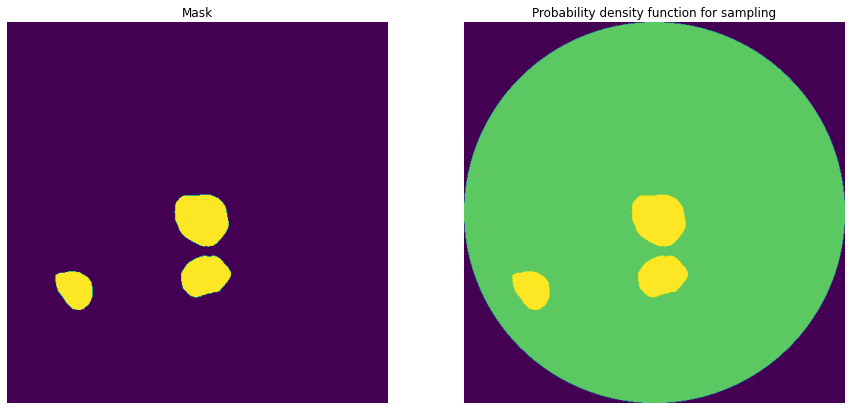

id                                                              28963
organ                                                          spleen
data_source                                                       HPA
img_height                                                       2511
img_width                                                        2511
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3651527 60 3654034 66 3656445 171 3658955 174 ...
age                                                              70.0
sex                                                            Female
Name: 215, dtype: object
28963
Saving msk
Resizing PDF
Saving pdf cumsum


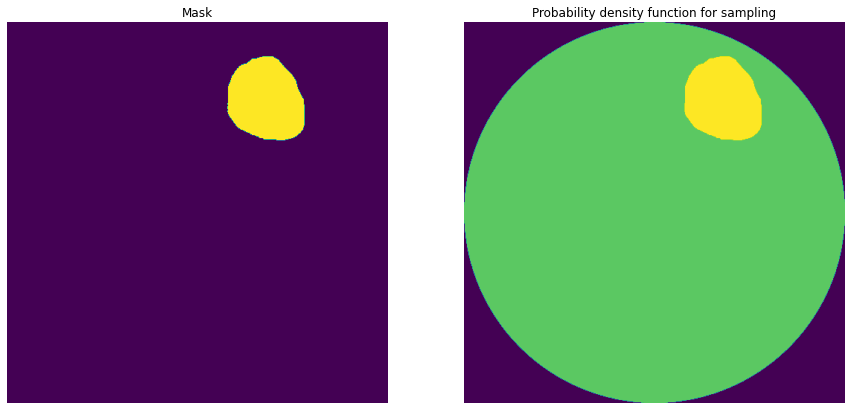

id                                                              29143
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 6074225 68 6077223 71 6080221 74 6083214 98 60...
age                                                              50.0
sex                                                            Female
Name: 216, dtype: object
29143
Saving msk
Resizing PDF
Saving pdf cumsum


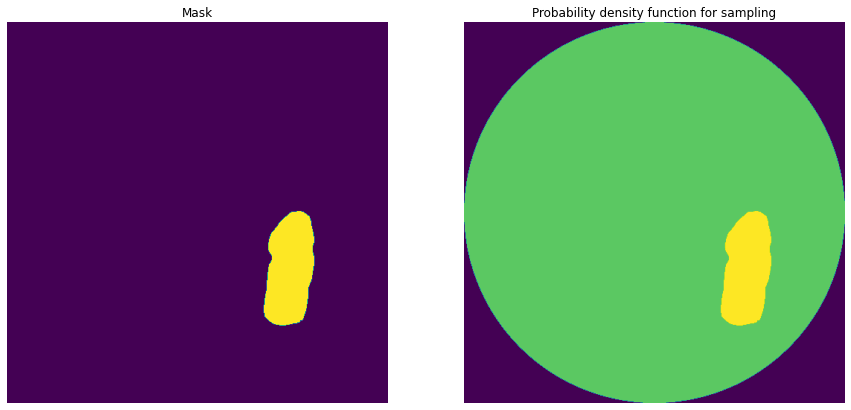

id                                                              29180
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 664310 20 667304 31 670302 35 673300 40 676298...
age                                                              84.0
sex                                                            Female
Name: 217, dtype: object
29180
Saving msk
Resizing PDF
Saving pdf cumsum


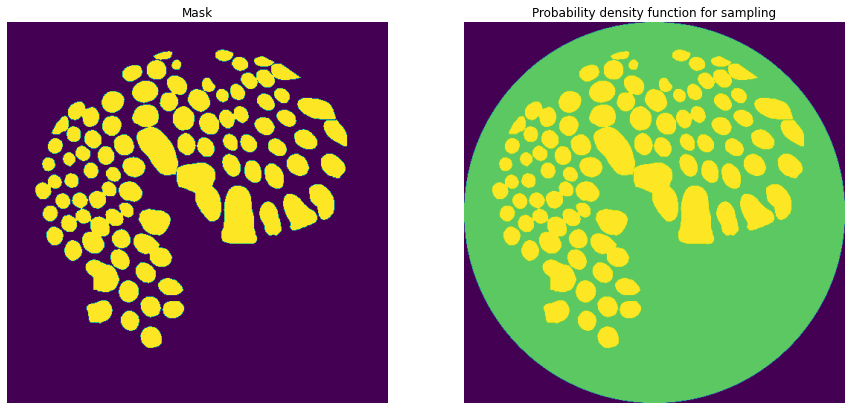

id                                                              29213
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2908769 81 2911764 96 2914760 110 2917744 156 ...
age                                                              60.0
sex                                                              Male
Name: 218, dtype: object
29213
Saving msk
Resizing PDF
Saving pdf cumsum


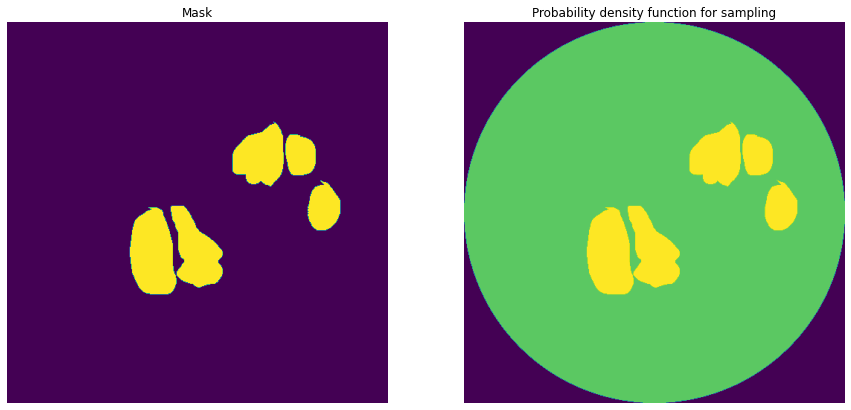

id                                                              29223
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2281942 27 2284940 29 2287929 48 2290928 50 22...
age                                                              57.0
sex                                                              Male
Name: 219, dtype: object
29223
Saving msk
Resizing PDF
Saving pdf cumsum


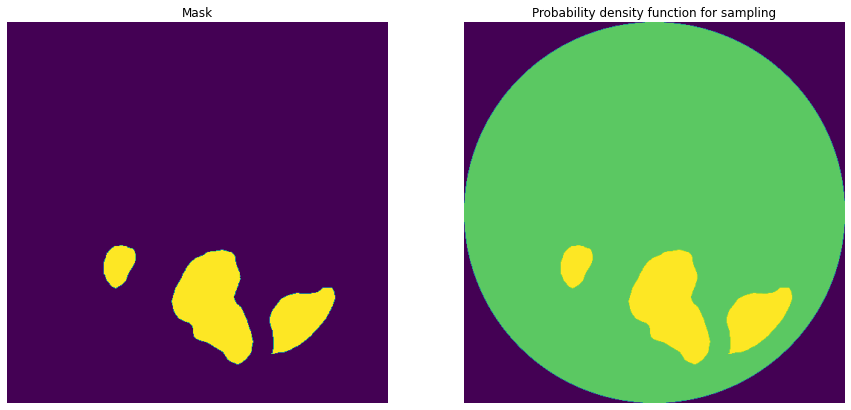

id                                                              29238
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1814204 13 1817197 27 1820195 31 1823193 35 18...
age                                                              41.0
sex                                                            Female
Name: 220, dtype: object
29238
Saving msk
Resizing PDF
Saving pdf cumsum


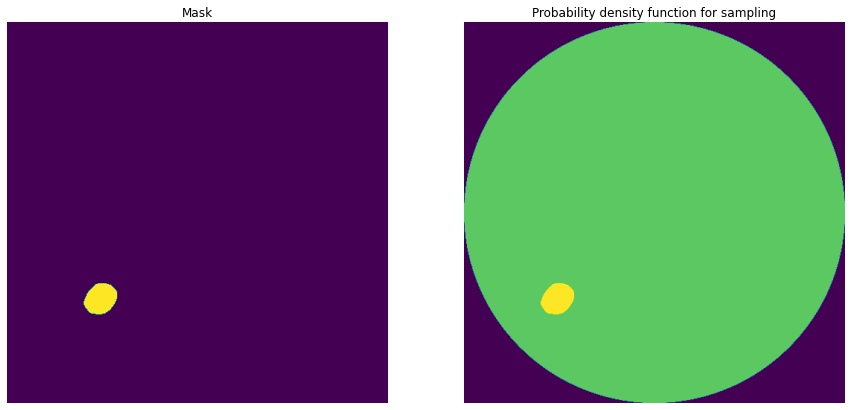

id                                                              29296
organ                                                        prostate
data_source                                                       HPA
img_height                                                       2416
img_width                                                        2416
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 54751 20 57166 22 59581 24 61996 25 64411 27 6...
age                                                              60.0
sex                                                              Male
Name: 221, dtype: object
29296
Saving msk
Resizing PDF
Saving pdf cumsum


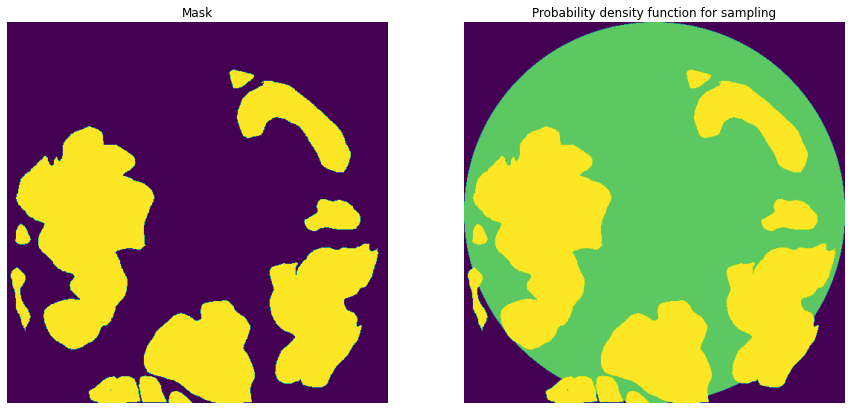

id                                                              29307
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 328365 14 331363 18 334341 88 337339 92 340317...
age                                                              76.0
sex                                                              Male
Name: 222, dtype: object
29307
Saving msk
Resizing PDF
Saving pdf cumsum


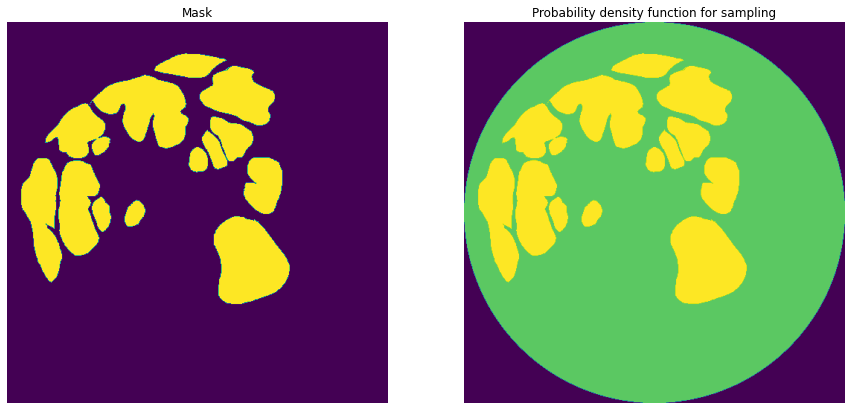

id                                                              29424
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 598399 4 601397 20 604396 24 607394 31 610392 ...
age                                                              83.0
sex                                                              Male
Name: 223, dtype: object
29424
Saving msk
Resizing PDF
Saving pdf cumsum


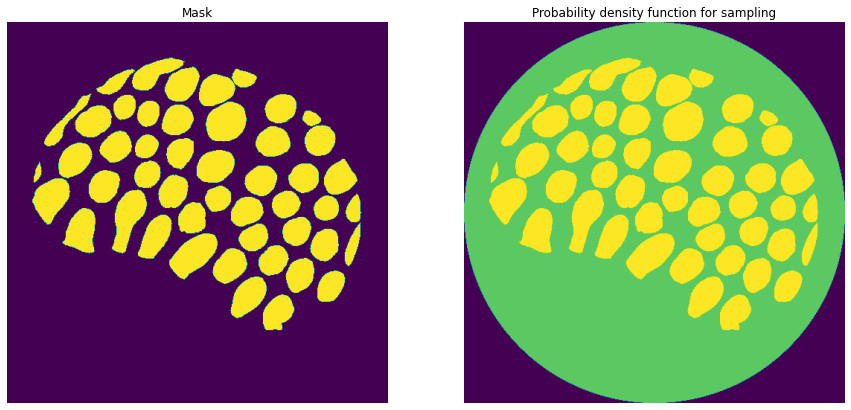

id                                                               2943
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1073129 12 1076127 16 1079127 20 1082126 26 10...
age                                                              56.0
sex                                                            Female
Name: 224, dtype: object
2943
Saving msk
Resizing PDF
Saving pdf cumsum


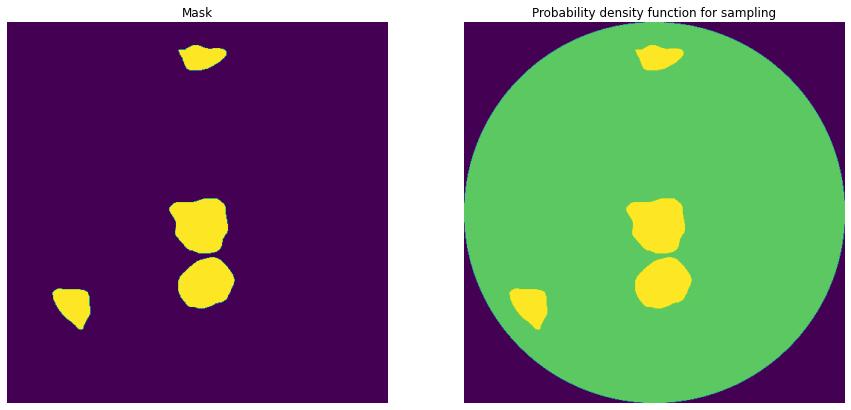

id                                                              29610
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2686906 28 2687296 7 2689904 30 2690295 9 2692...
age                                                              65.0
sex                                                              Male
Name: 225, dtype: object
29610
Saving msk
Resizing PDF
Saving pdf cumsum


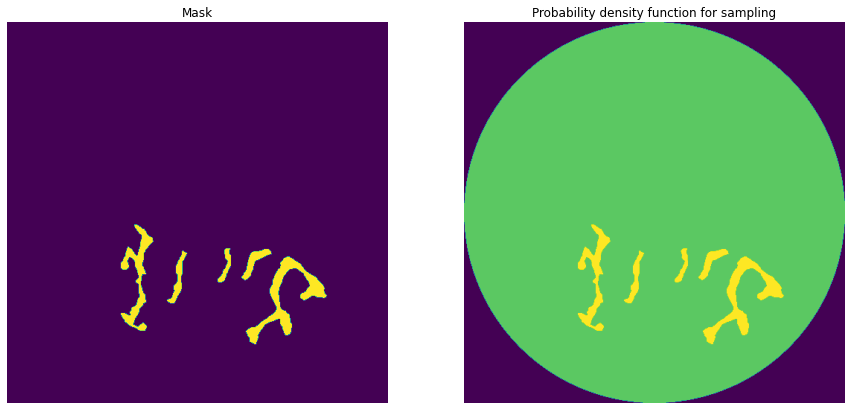

id                                                              29690
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1432467 118 1435466 121 1438465 123 1441458 13...
age                                                              57.0
sex                                                              Male
Name: 226, dtype: object
29690
Saving msk
Resizing PDF
Saving pdf cumsum


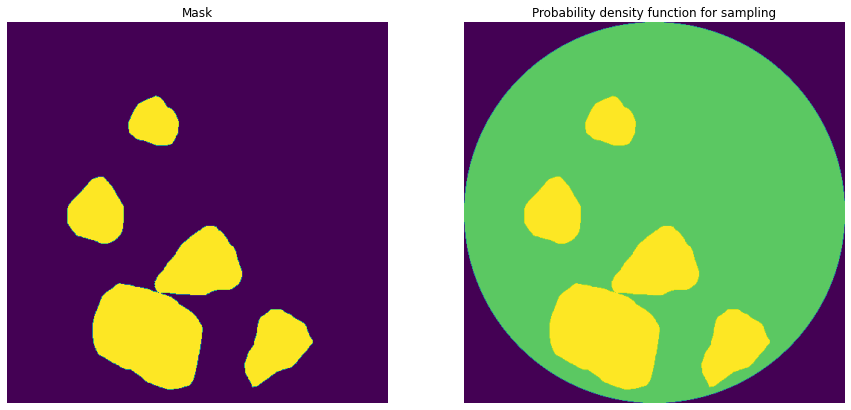

id                                                              29809
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1012376 38 1015375 40 1018374 42 1021359 63 10...
age                                                              61.0
sex                                                              Male
Name: 227, dtype: object
29809
Saving msk
Resizing PDF
Saving pdf cumsum


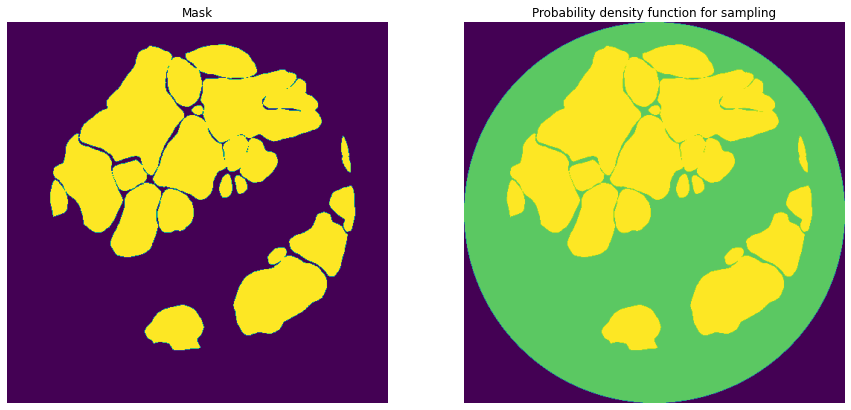

id                                                              29820
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1152961 55 1155958 64 1157244 14 1158955 72 11...
age                                                              84.0
sex                                                              Male
Name: 228, dtype: object
29820
Saving msk
Resizing PDF
Saving pdf cumsum


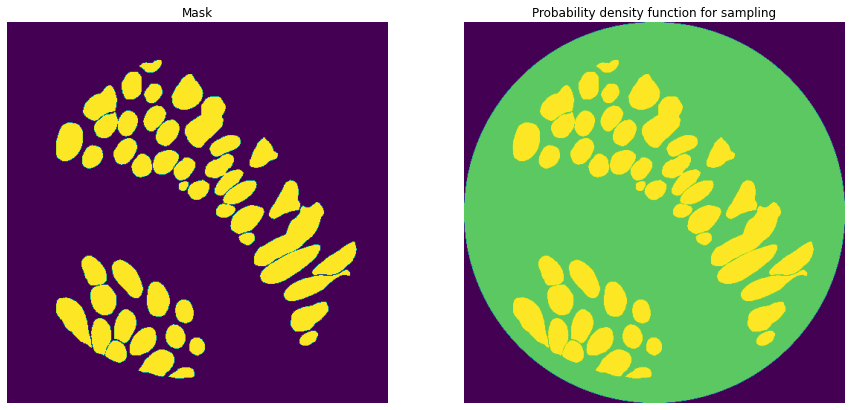

id                                                              30080
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2833204 17 2836202 20 2839197 37 2842196 41 28...
age                                                              55.0
sex                                                              Male
Name: 229, dtype: object
30080
Saving msk
Resizing PDF
Saving pdf cumsum


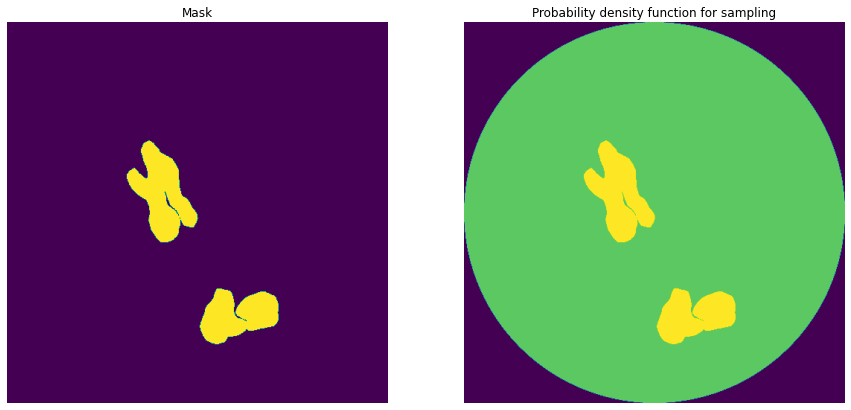

id                                                              30084
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3778374 8 3781368 17 3784366 22 3787363 28 379...
age                                                              43.0
sex                                                            Female
Name: 230, dtype: object
30084
Saving msk
Resizing PDF
Saving pdf cumsum


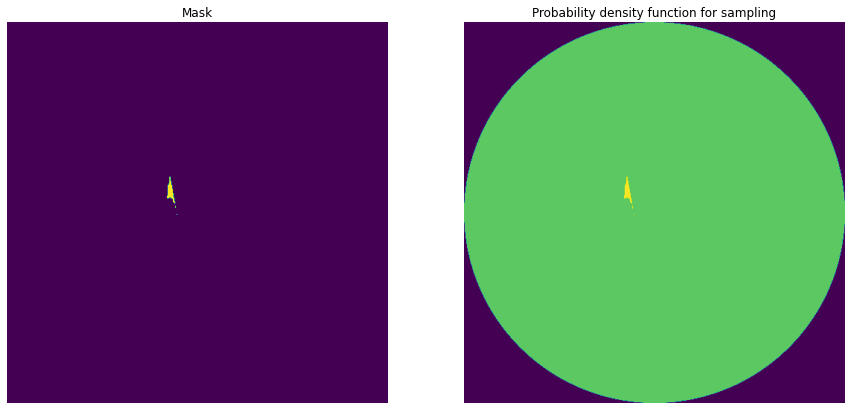

id                                                              30194
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 860063 29 863061 33 866059 37 869058 39 872058...
age                                                              56.0
sex                                                            Female
Name: 231, dtype: object
30194
Saving msk
Resizing PDF
Saving pdf cumsum


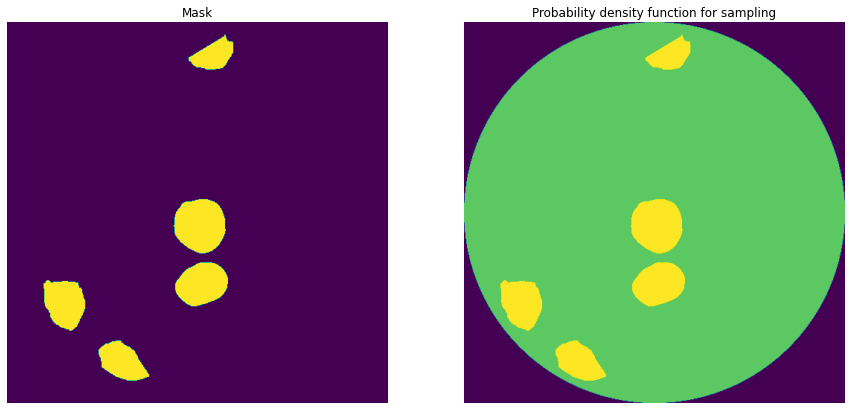

id                                                              30201
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1489891 53 1492889 56 1495887 59 1498885 62 15...
age                                                              57.0
sex                                                              Male
Name: 232, dtype: object
30201
Saving msk
Resizing PDF
Saving pdf cumsum


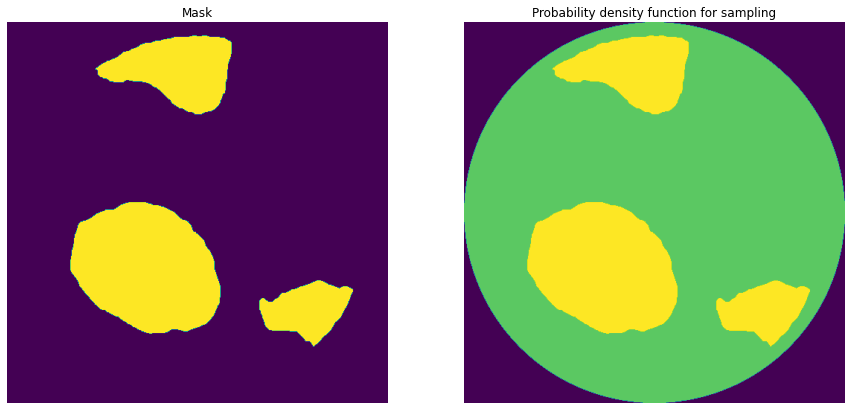

id                                                              30224
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1075175 24 1075202 25 1078166 69 1081163 76 10...
age                                                              28.0
sex                                                              Male
Name: 233, dtype: object
30224
Saving msk
Resizing PDF
Saving pdf cumsum


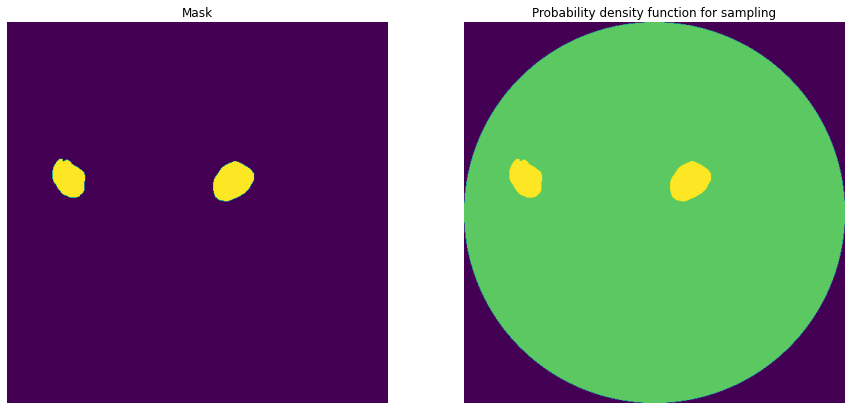

id                                                              30250
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 5837626 15 5840623 17 5843621 19 5846619 20 58...
age                                                              59.0
sex                                                              Male
Name: 234, dtype: object
30250
Saving msk
Resizing PDF
Saving pdf cumsum


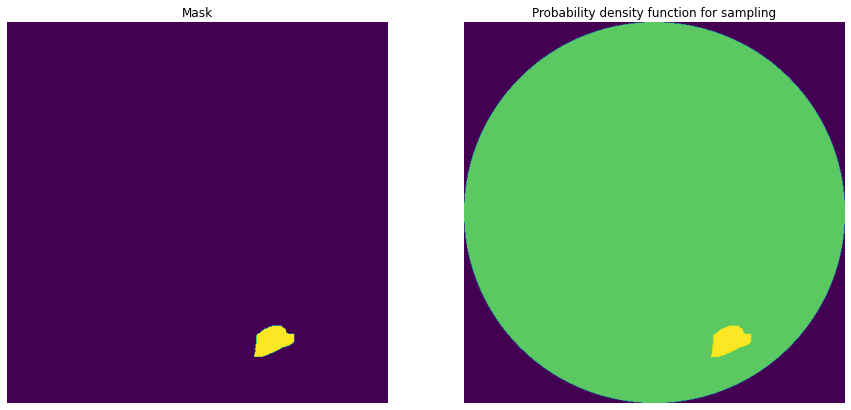

id                                                              30294
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 748733 18 751733 18 754727 31 757721 42 760715...
age                                                              37.0
sex                                                              Male
Name: 235, dtype: object
30294
Saving msk
Resizing PDF
Saving pdf cumsum


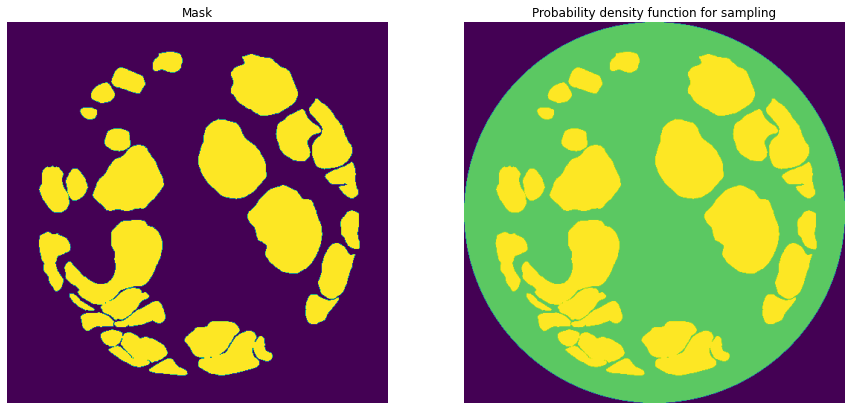

id                                                              30355
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 163463 28 166462 30 169454 41 172452 45 175446...
age                                                              76.0
sex                                                              Male
Name: 236, dtype: object
30355
Saving msk
Resizing PDF
Saving pdf cumsum


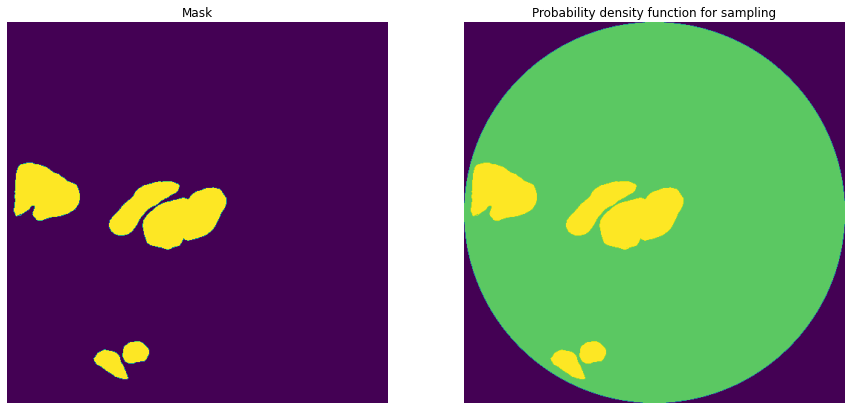

id                                                              30394
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2484471 8 2487469 12 2490465 18 2493465 20 249...
age                                                              49.0
sex                                                            Female
Name: 237, dtype: object
30394
Saving msk
Resizing PDF
Saving pdf cumsum


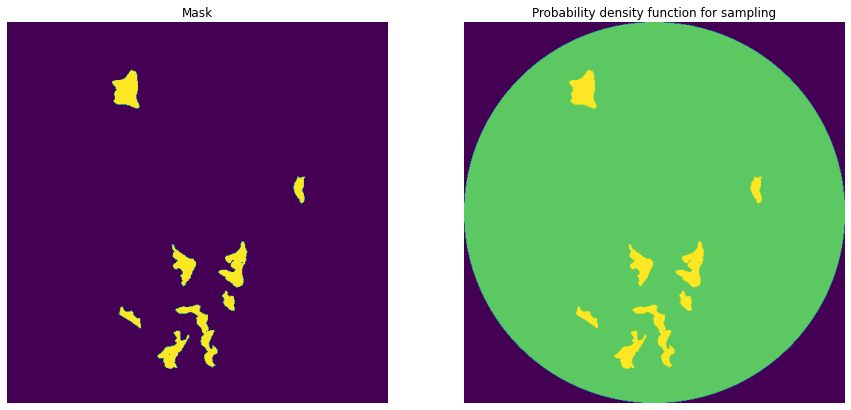

id                                                              30414
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1740909 27 1743907 31 1746899 40 1749897 42 17...
age                                                              55.0
sex                                                              Male
Name: 238, dtype: object
30414
Saving msk
Resizing PDF
Saving pdf cumsum


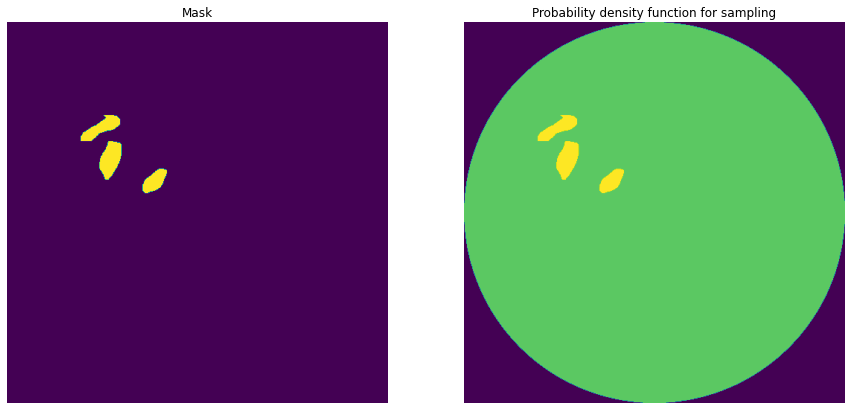

id                                                              30424
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1476674 2 1479674 4 1482675 9 1485675 10 14886...
age                                                              37.0
sex                                                              Male
Name: 239, dtype: object
30424
Saving msk
Resizing PDF
Saving pdf cumsum


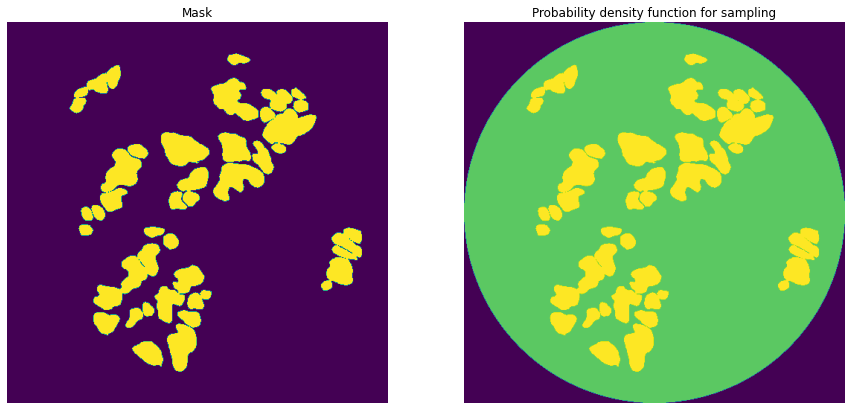

id                                                              30474
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 640510 27 643508 30 646506 33 649501 38 652499...
age                                                              28.0
sex                                                              Male
Name: 240, dtype: object
30474
Saving msk
Resizing PDF
Saving pdf cumsum


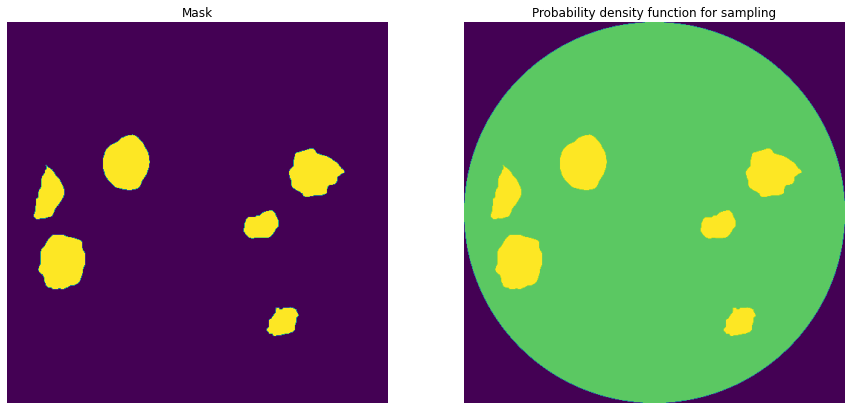

id                                                              30500
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1441538 10 1444536 13 1447535 54 1450533 58 14...
age                                                              59.0
sex                                                              Male
Name: 241, dtype: object
30500
Saving msk
Resizing PDF
Saving pdf cumsum


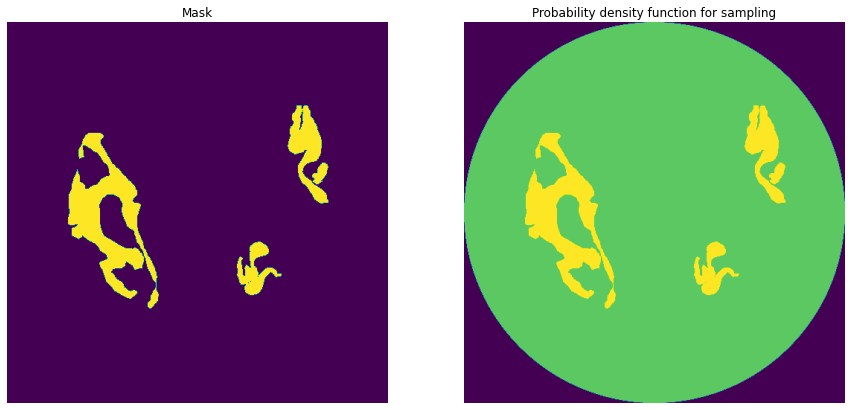

id                                                               3054
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1683825 35 1686824 38 1689824 40 1692822 48 16...
age                                                              74.0
sex                                                            Female
Name: 242, dtype: object
3054
Saving msk
Resizing PDF
Saving pdf cumsum


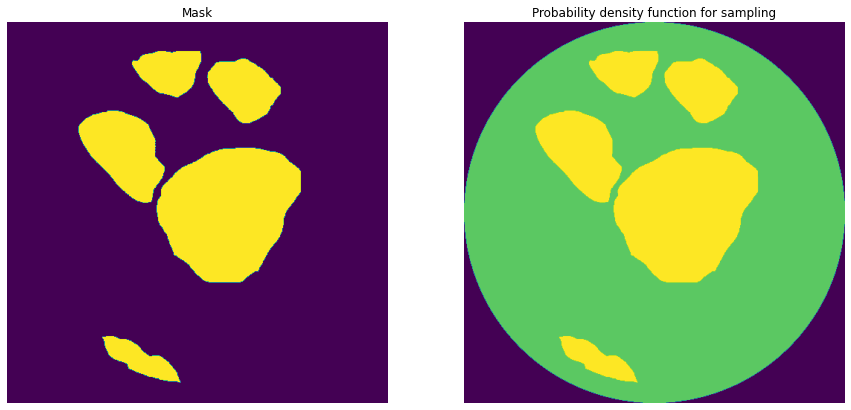

id                                                               3057
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1126787 39 1129782 48 1132776 58 1135775 63 11...
age                                                              57.0
sex                                                              Male
Name: 243, dtype: object
3057
Saving msk
Resizing PDF
Saving pdf cumsum


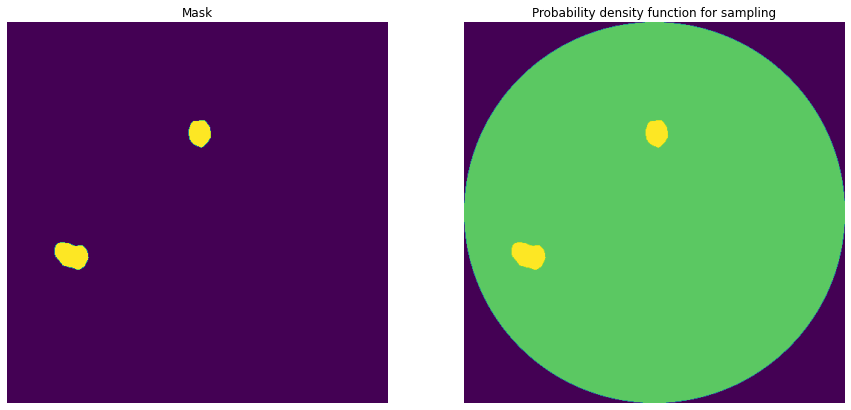

id                                                              30581
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 697377 65 700375 69 703373 73 706224 84 706365...
age                                                              74.0
sex                                                            Female
Name: 244, dtype: object
30581
Saving msk
Resizing PDF
Saving pdf cumsum


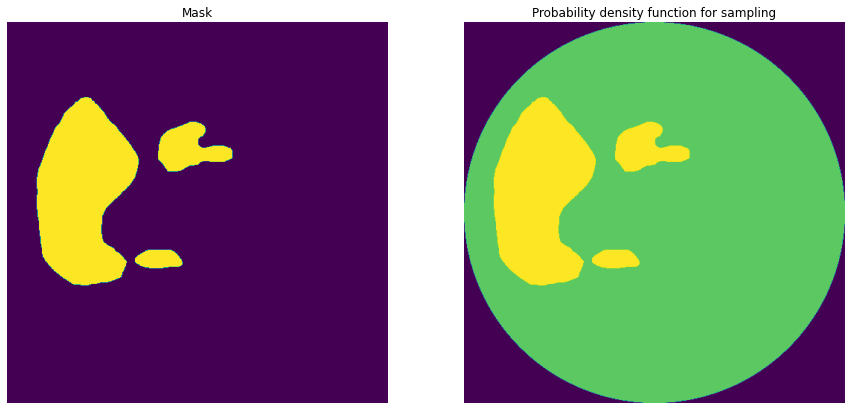

id                                                              30765
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 979107 12 982106 13 985101 23 988101 24 991096...
age                                                              57.0
sex                                                              Male
Name: 245, dtype: object
30765
Saving msk
Resizing PDF
Saving pdf cumsum


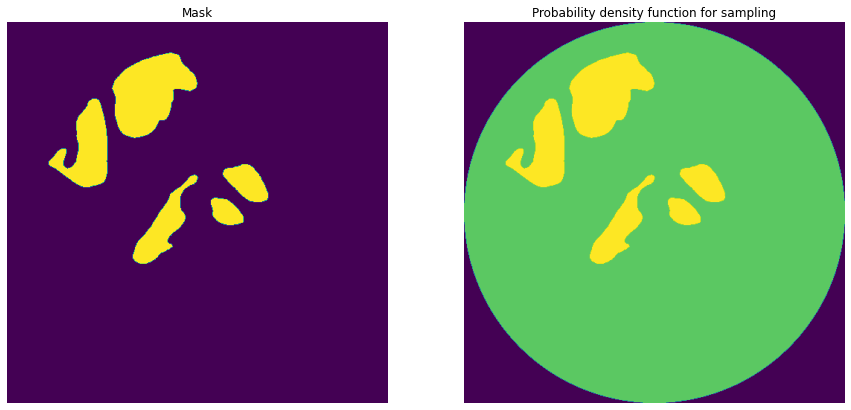

id                                                               3083
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4915949 72 4918938 90 4921933 101 4924910 128 ...
age                                                              68.0
sex                                                            Female
Name: 246, dtype: object
3083
Saving msk
Resizing PDF
Saving pdf cumsum


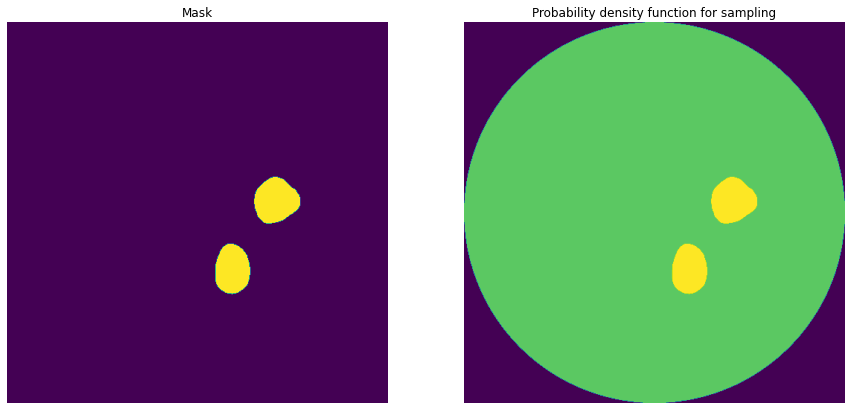

id                                                              30876
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2527873 31 2530868 42 2533859 54 2536844 76 25...
age                                                              61.0
sex                                                              Male
Name: 247, dtype: object
30876
Saving msk
Resizing PDF
Saving pdf cumsum


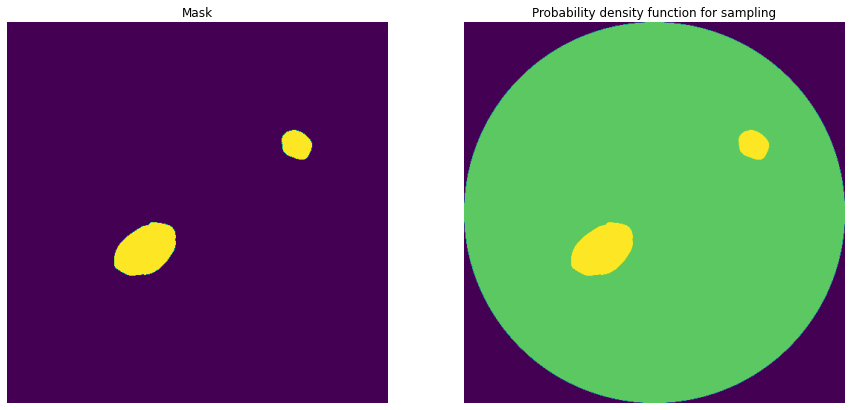

id                                                              31139
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1441444 2 1444442 4 1447440 7 1450438 9 145343...
age                                                              21.0
sex                                                              Male
Name: 248, dtype: object
31139
Saving msk
Resizing PDF
Saving pdf cumsum


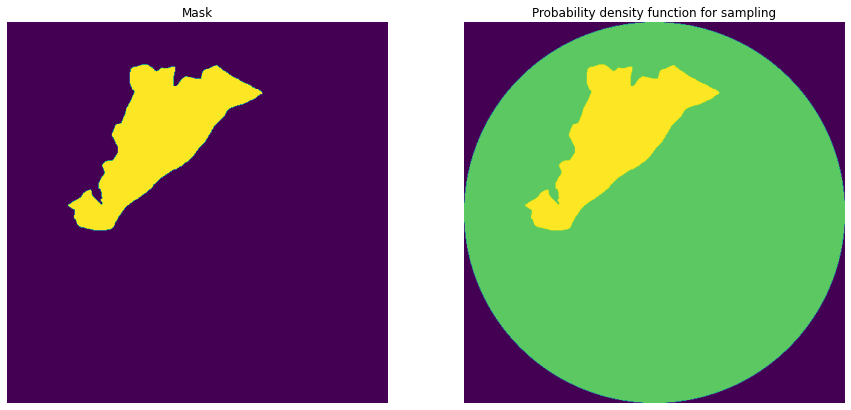

id                                                              31290
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2278099 47 2281097 51 2284091 64 2287089 68 22...
age                                                              57.0
sex                                                              Male
Name: 249, dtype: object
31290
Saving msk
Resizing PDF
Saving pdf cumsum


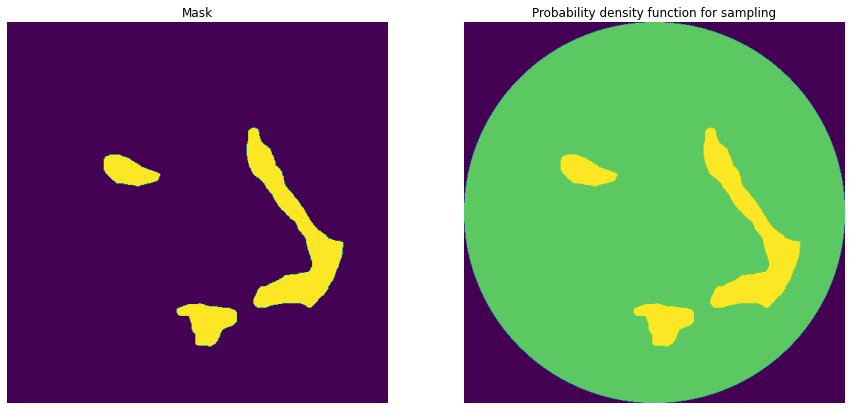

id                                                              31406
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 496381 28 499374 41 502365 63 505361 69 508358...
age                                                              65.0
sex                                                            Female
Name: 250, dtype: object
31406
Saving msk
Resizing PDF
Saving pdf cumsum


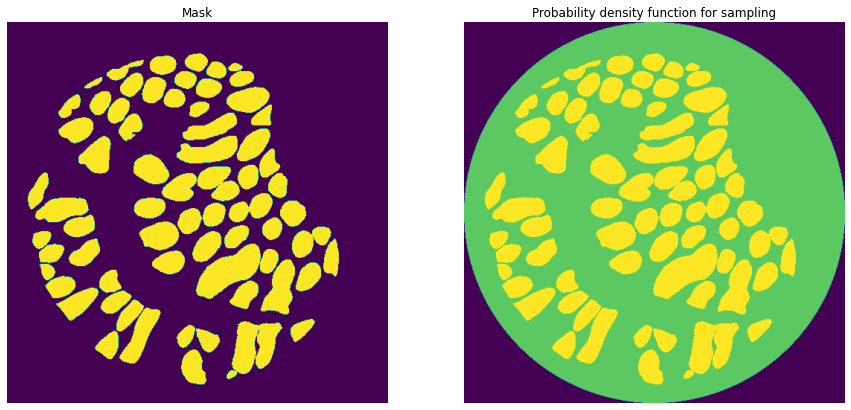

id                                                              31571
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1045738 17 1048736 20 1051729 28 1054728 32 10...
age                                                              65.0
sex                                                              Male
Name: 251, dtype: object
31571
Saving msk
Resizing PDF
Saving pdf cumsum


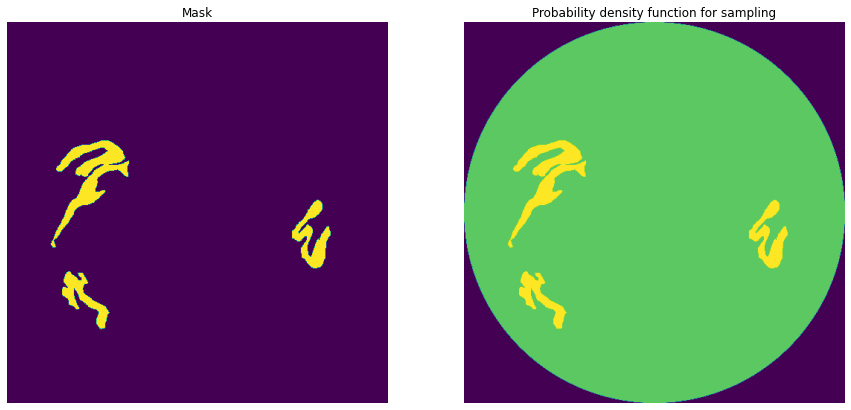

id                                                              31675
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3121897 24 3124895 27 3127893 30 3130883 63 31...
age                                                              74.0
sex                                                            Female
Name: 252, dtype: object
31675
Saving msk
Resizing PDF
Saving pdf cumsum


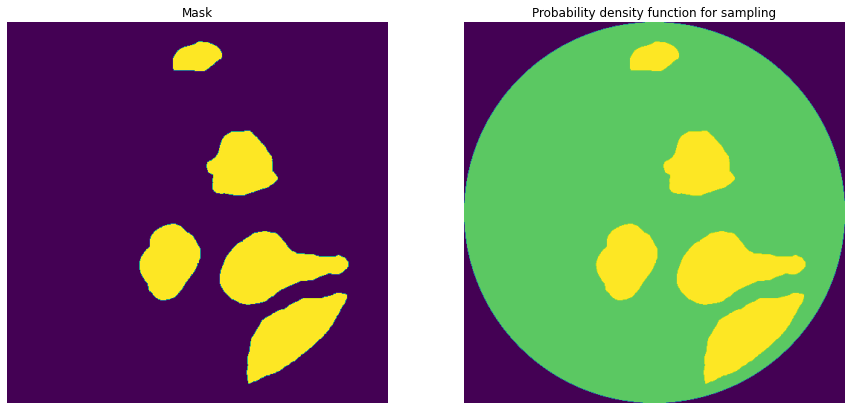

id                                                              31698
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 6457566 20 6460559 31 6463555 40 6466553 45 64...
age                                                              61.0
sex                                                              Male
Name: 253, dtype: object
31698
Saving msk
Resizing PDF
Saving pdf cumsum


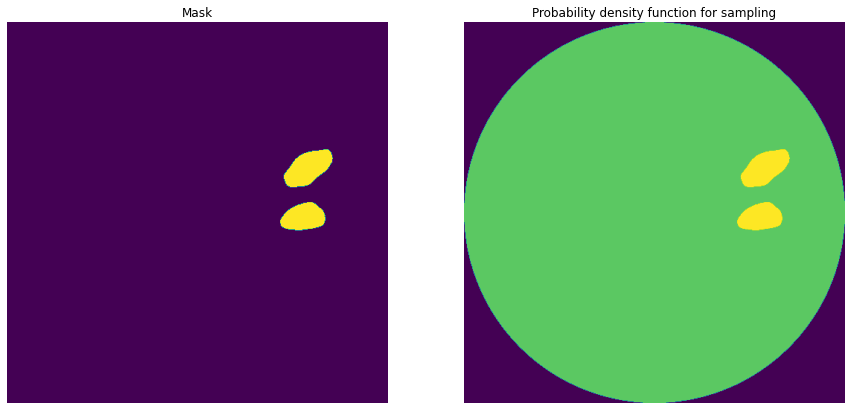

id                                                              31709
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 899230 13 902228 17 905225 24 908222 28 911221...
age                                                              28.0
sex                                                              Male
Name: 254, dtype: object
31709
Saving msk
Resizing PDF
Saving pdf cumsum


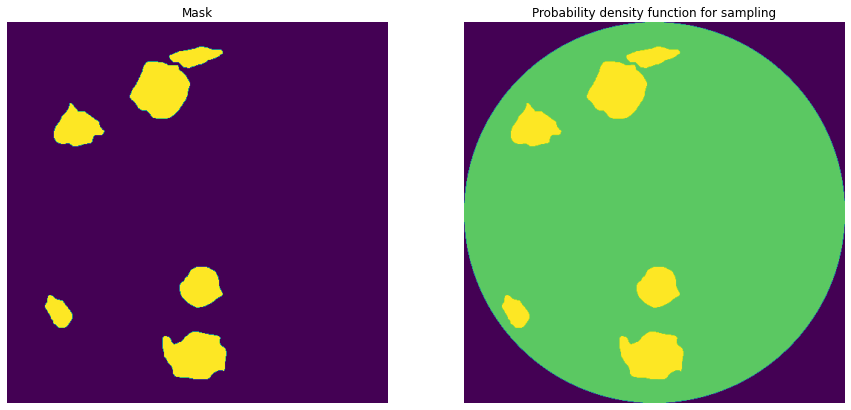

id                                                              31727
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 847544 30 850539 39 853531 55 856526 68 859522...
age                                                              79.0
sex                                                            Female
Name: 255, dtype: object
31727
Saving msk
Resizing PDF
Saving pdf cumsum


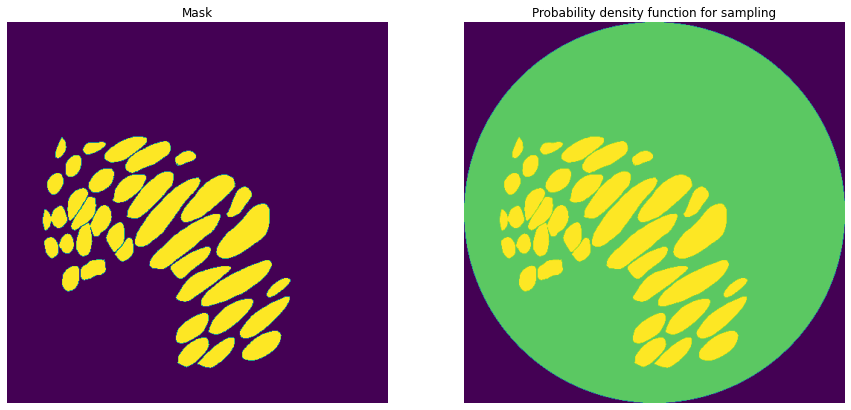

id                                                              31733
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3403713 43 3406712 45 3409712 45 3412703 55 34...
age                                                              21.0
sex                                                            Female
Name: 256, dtype: object
31733
Saving msk
Resizing PDF
Saving pdf cumsum


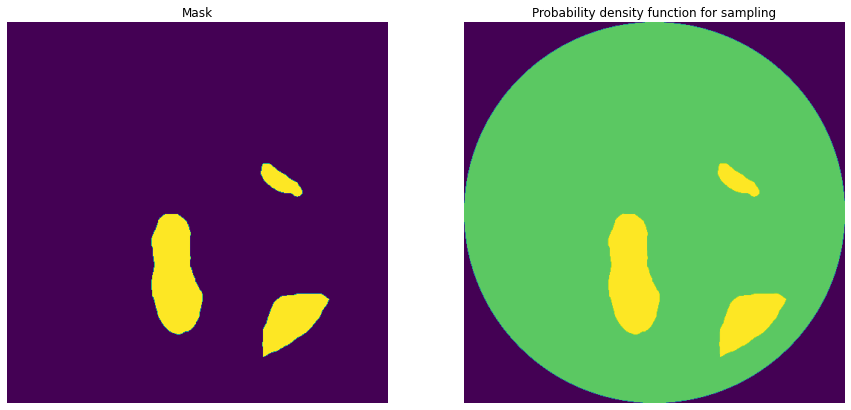

id                                                              31799
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 769465 28 772464 4 772471 25 775464 4 775469 3...
age                                                              83.0
sex                                                              Male
Name: 257, dtype: object
31799
Saving msk
Resizing PDF
Saving pdf cumsum


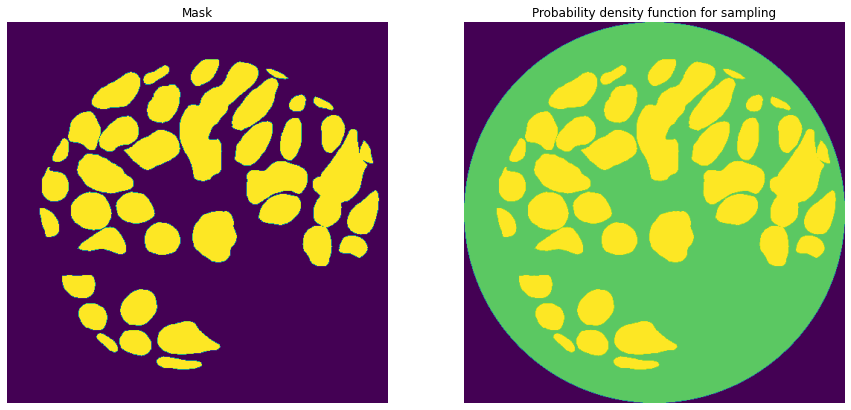

id                                                              31800
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3674181 11 3677180 14 3680179 18 3683177 23 36...
age                                                              67.0
sex                                                            Female
Name: 258, dtype: object
31800
Saving msk
Resizing PDF
Saving pdf cumsum


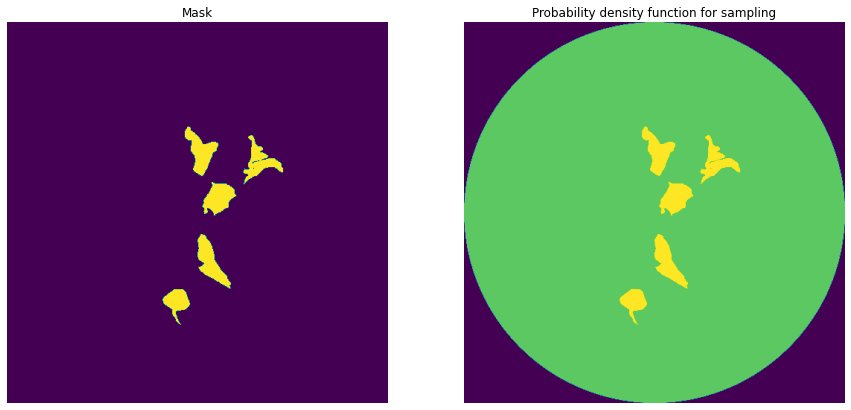

id                                                              31898
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1042571 2 1045567 5 1048564 8 1051560 11 10545...
age                                                              60.0
sex                                                              Male
Name: 259, dtype: object
31898
Saving msk
Resizing PDF
Saving pdf cumsum


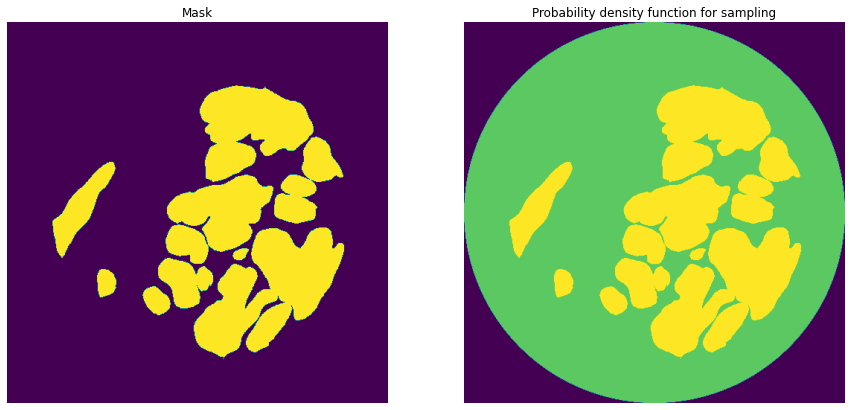

id                                                              31958
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 802564 1 805564 1 808563 2 811563 2 814562 3 8...
age                                                              61.0
sex                                                              Male
Name: 260, dtype: object
31958
Saving msk
Resizing PDF
Saving pdf cumsum


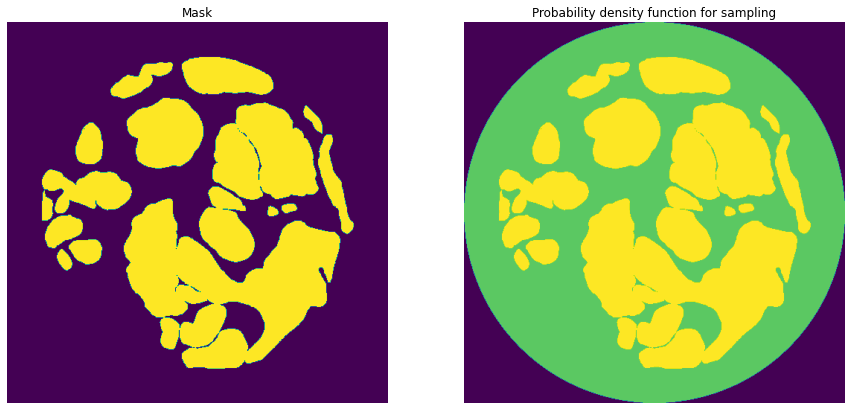

id                                                              32009
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2591035 39 2594031 45 2597027 51 2600023 56 26...
age                                                              55.0
sex                                                              Male
Name: 261, dtype: object
32009
Saving msk
Resizing PDF
Saving pdf cumsum


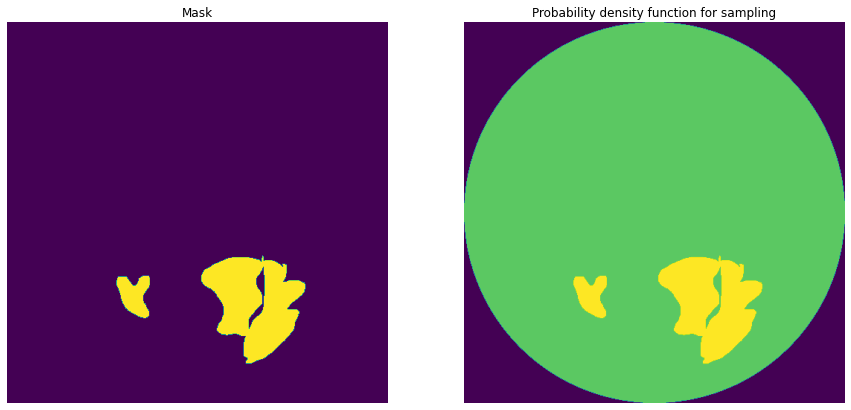

id                                                              32126
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2596896 22 2599895 24 2602882 48 2605881 51 26...
age                                                              55.0
sex                                                              Male
Name: 262, dtype: object
32126
Saving msk
Resizing PDF
Saving pdf cumsum


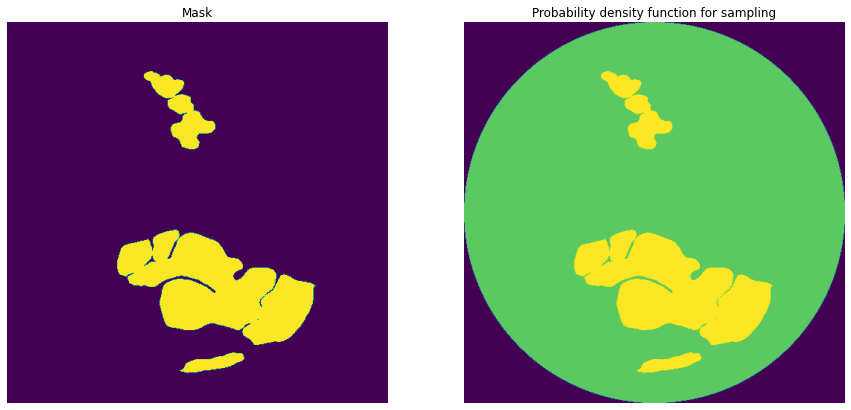

id                                                              32151
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1906387 8 1909385 12 1912384 14 1915378 22 191...
age                                                              65.0
sex                                                              Male
Name: 263, dtype: object
32151
Saving msk
Resizing PDF
Saving pdf cumsum


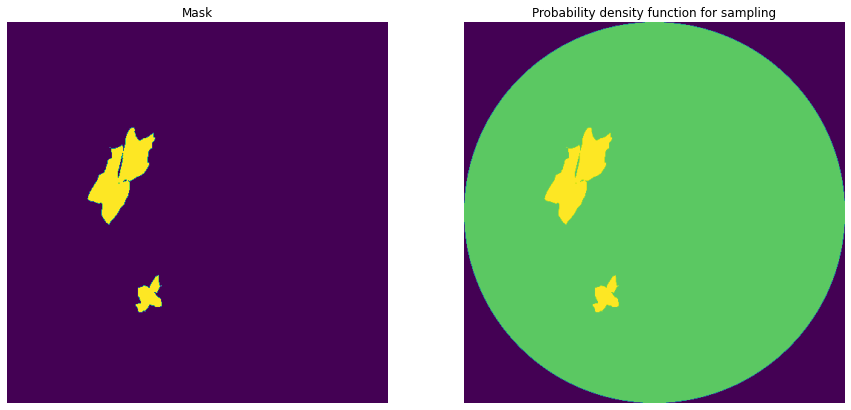

id                                                              32231
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1399958 26 1402957 29 1405956 32 1408947 48 14...
age                                                              72.0
sex                                                              Male
Name: 264, dtype: object
32231
Saving msk
Resizing PDF
Saving pdf cumsum


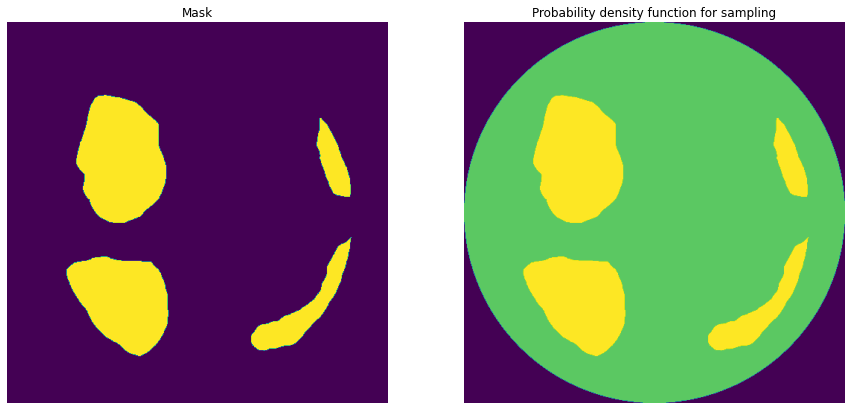

id                                                              32325
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1405200 12 1408197 18 1411188 66 1414184 81 14...
age                                                              56.0
sex                                                            Female
Name: 265, dtype: object
32325
Saving msk
Resizing PDF
Saving pdf cumsum


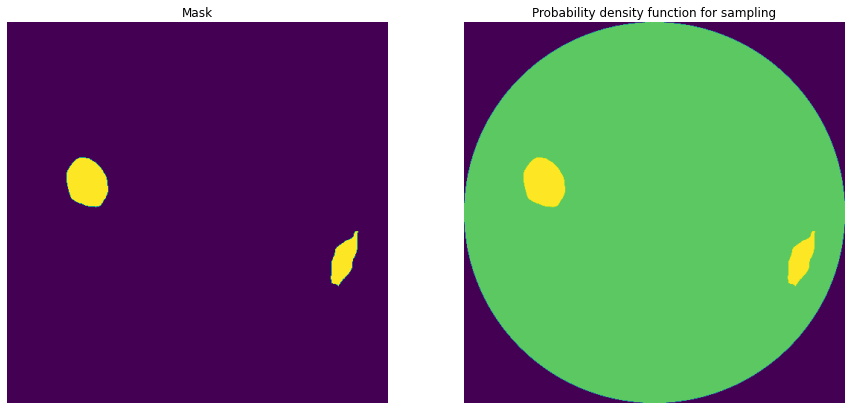

id                                                              32412
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2888331 67 2891325 76 2894320 84 2897303 104 2...
age                                                              48.0
sex                                                              Male
Name: 266, dtype: object
32412
Saving msk
Resizing PDF
Saving pdf cumsum


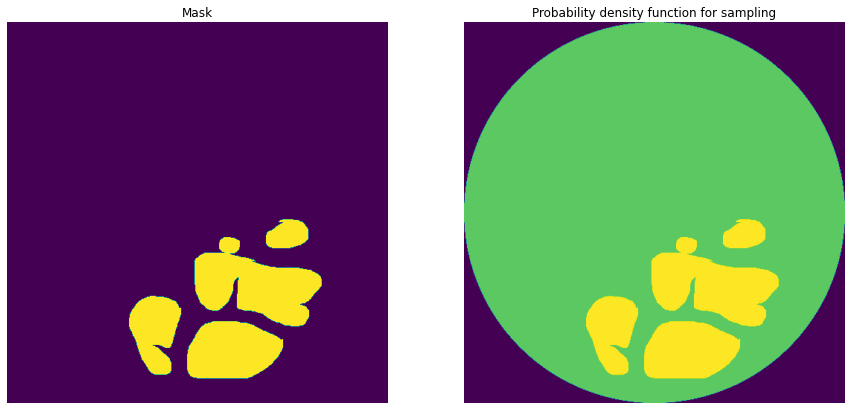

id                                                              32527
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 595536 12 598536 16 601536 19 604526 33 607518...
age                                                              41.0
sex                                                            Female
Name: 267, dtype: object
32527
Saving msk
Resizing PDF
Saving pdf cumsum


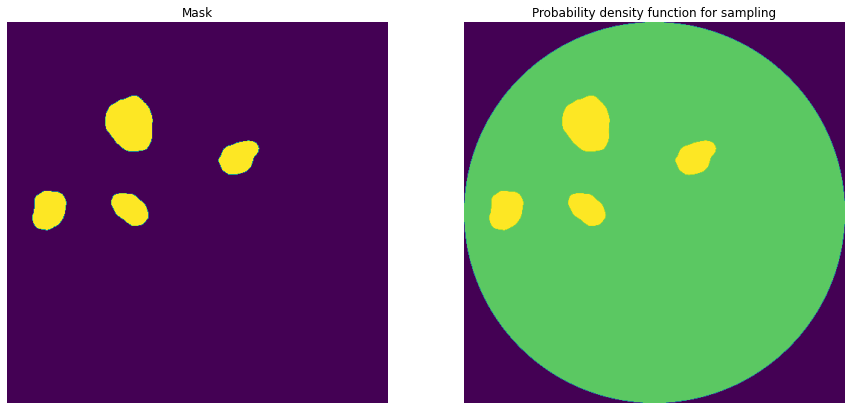

id                                                              32741
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 949960 1 952959 2 955958 9 958957 13 961957 16...
age                                                              57.0
sex                                                              Male
Name: 268, dtype: object
32741
Saving msk
Resizing PDF
Saving pdf cumsum


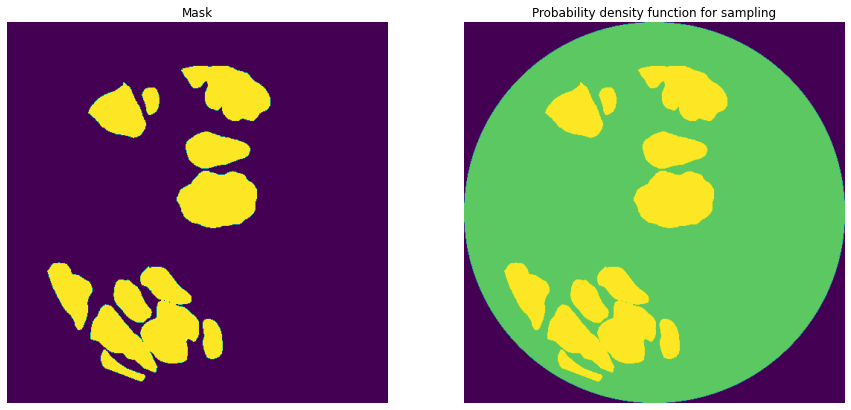

id                                                               3303
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1333955 34 1336948 47 1339944 59 1342940 66 13...
age                                                              65.0
sex                                                            Female
Name: 269, dtype: object
3303
Saving msk
Resizing PDF
Saving pdf cumsum


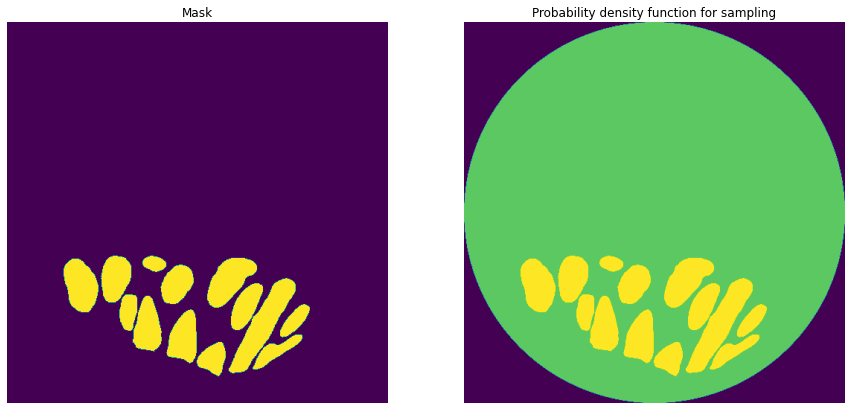

id                                                               3409
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 832291 24 835289 28 838275 51 841274 53 844273...
age                                                              55.0
sex                                                              Male
Name: 270, dtype: object
3409
Saving msk
Resizing PDF
Saving pdf cumsum


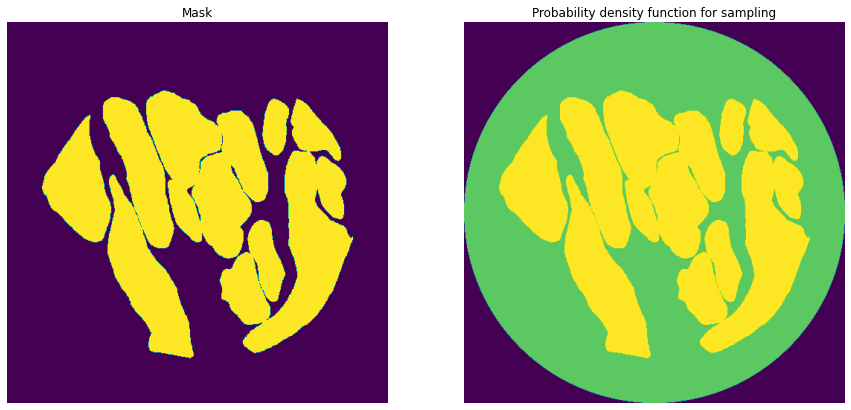

id                                                                351
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 613460 14 616456 22 619452 29 622438 45 625430...
age                                                              65.0
sex                                                            Female
Name: 271, dtype: object
351
Saving msk
Resizing PDF
Saving pdf cumsum


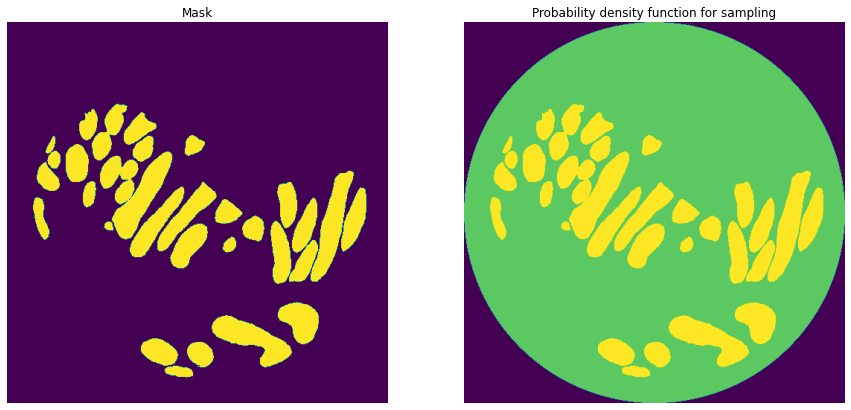

id                                                               3959
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 763329 86 766318 115 769314 146 772310 156 775...
age                                                              57.0
sex                                                              Male
Name: 272, dtype: object
3959
Saving msk
Resizing PDF
Saving pdf cumsum


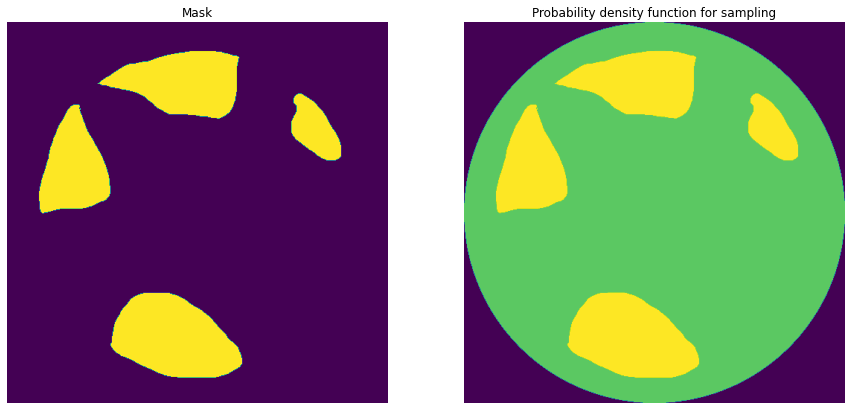

id                                                               4062
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2235478 5 2238475 10 2241472 15 2244470 19 224...
age                                                              65.0
sex                                                            Female
Name: 273, dtype: object
4062
Saving msk
Resizing PDF
Saving pdf cumsum


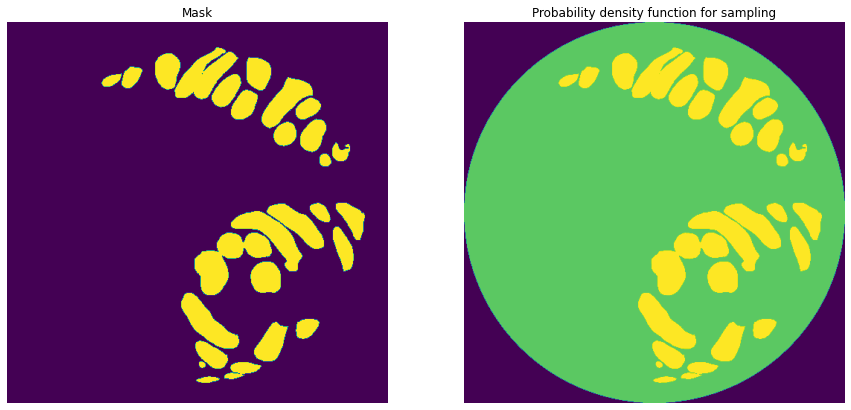

id                                                               4066
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 859216 25 862210 34 865207 39 868204 44 871201...
age                                                              70.0
sex                                                              Male
Name: 274, dtype: object
4066
Saving msk
Resizing PDF
Saving pdf cumsum


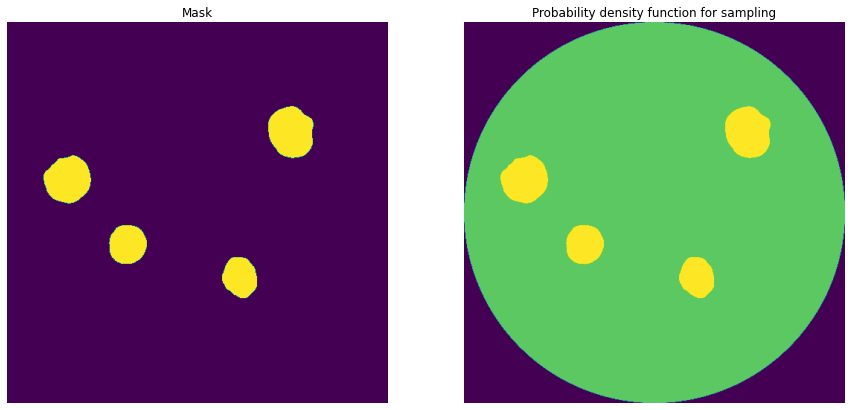

id                                                               4265
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 871860 24 874856 30 877853 35 880853 37 883853...
age                                                              41.0
sex                                                            Female
Name: 275, dtype: object
4265
Saving msk
Resizing PDF
Saving pdf cumsum


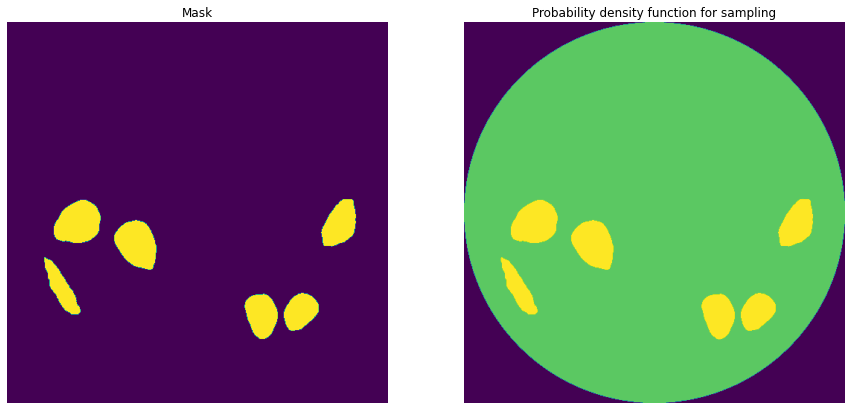

id                                                               4301
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2242972 45 2245552 16 2245970 49 2248546 25 22...
age                                                              65.0
sex                                                              Male
Name: 276, dtype: object
4301
Saving msk
Resizing PDF
Saving pdf cumsum


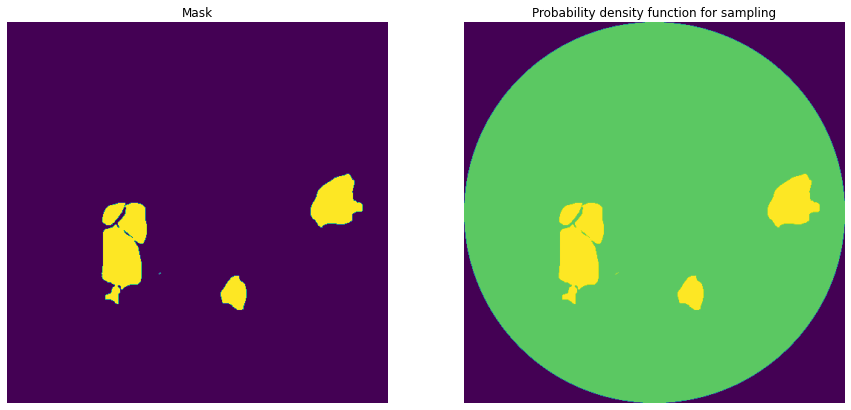

id                                                                435
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 904417 23 907415 25 910406 34 913405 35 916400...
age                                                              61.0
sex                                                              Male
Name: 277, dtype: object
435
Saving msk
Resizing PDF
Saving pdf cumsum


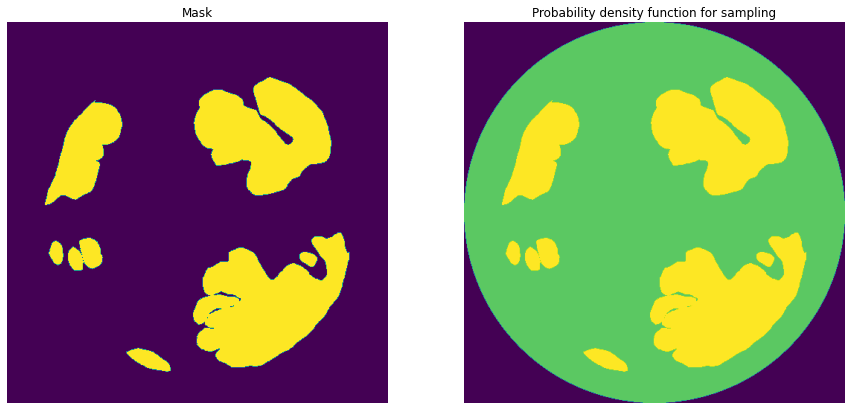

id                                                               4404
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1258442 52 1261441 56 1264426 74 1267425 77 12...
age                                                              72.0
sex                                                              Male
Name: 278, dtype: object
4404
Saving msk
Resizing PDF
Saving pdf cumsum


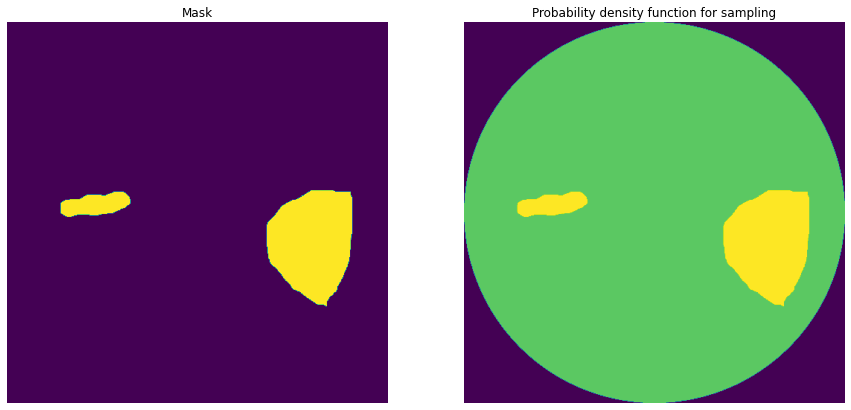

id                                                               4412
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2227814 29 2230812 35 2233808 70 2236802 76 22...
age                                                              65.0
sex                                                              Male
Name: 279, dtype: object
4412
Saving msk
Resizing PDF
Saving pdf cumsum


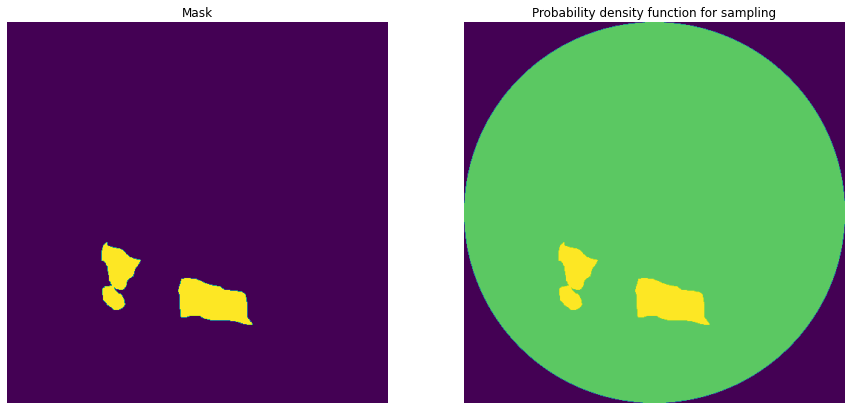

id                                                               4561
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 943284 19 946282 26 949279 35 952272 52 955268...
age                                                              65.0
sex                                                            Female
Name: 280, dtype: object
4561
Saving msk
Resizing PDF
Saving pdf cumsum


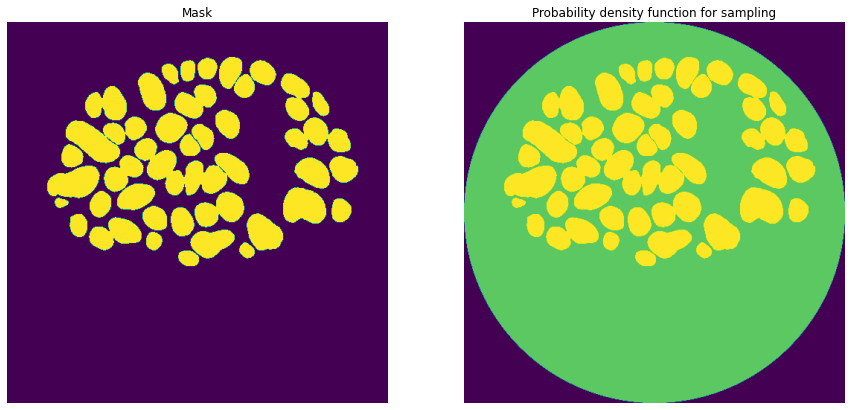

id                                                               4639
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1792985 9 1795983 12 1798966 42 1801960 87 180...
age                                                              55.0
sex                                                              Male
Name: 281, dtype: object
4639
Saving msk
Resizing PDF
Saving pdf cumsum


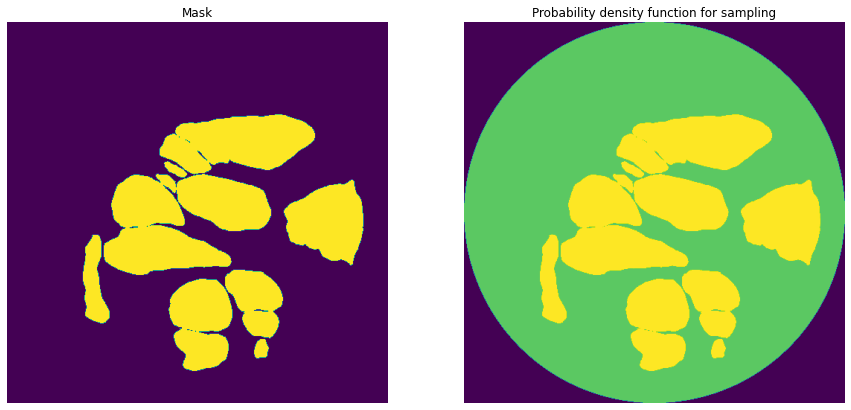

id                                                               4658
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 847491 35 850489 38 853488 40 856473 70 859471...
age                                                              61.0
sex                                                              Male
Name: 282, dtype: object
4658
Saving msk
Resizing PDF
Saving pdf cumsum


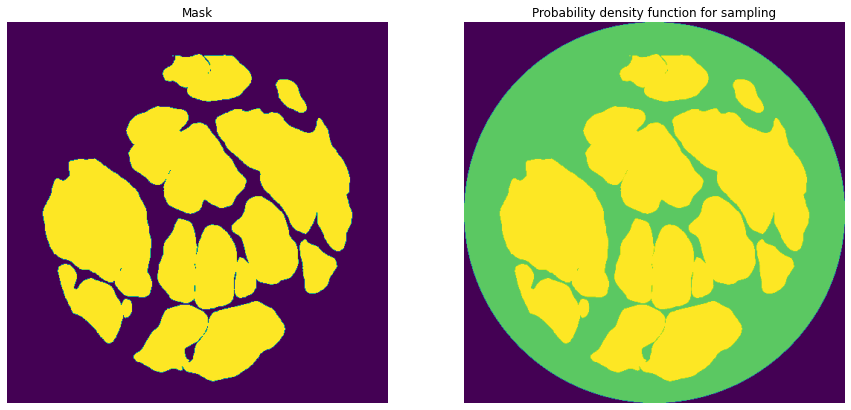

id                                                               4776
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1648361 14 1651359 19 1654357 22 1657351 28 16...
age                                                              49.0
sex                                                            Female
Name: 283, dtype: object
4776
Saving msk
Resizing PDF
Saving pdf cumsum


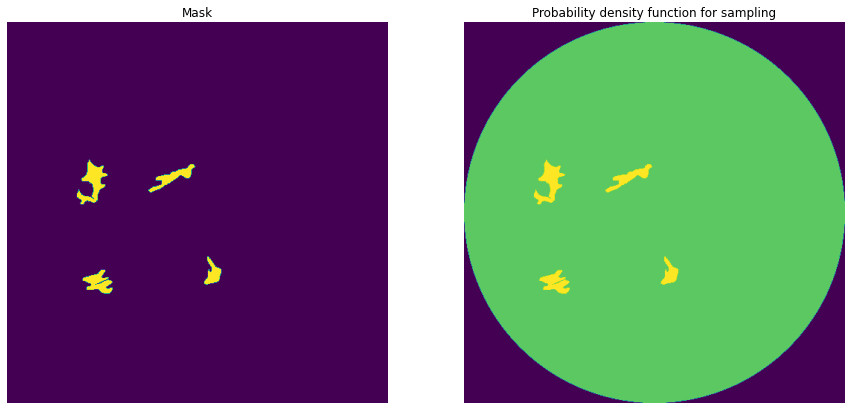

id                                                               4777
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2920158 93 2923155 99 2926151 106 2929146 117 ...
age                                                              61.0
sex                                                              Male
Name: 284, dtype: object
4777
Saving msk
Resizing PDF
Saving pdf cumsum


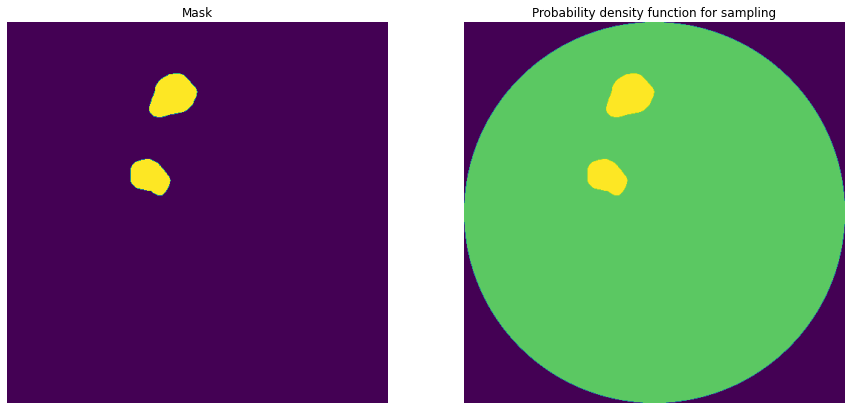

id                                                               4802
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 847442 87 850438 102 853434 116 856417 150 859...
age                                                              76.0
sex                                                              Male
Name: 285, dtype: object
4802
Saving msk
Resizing PDF
Saving pdf cumsum


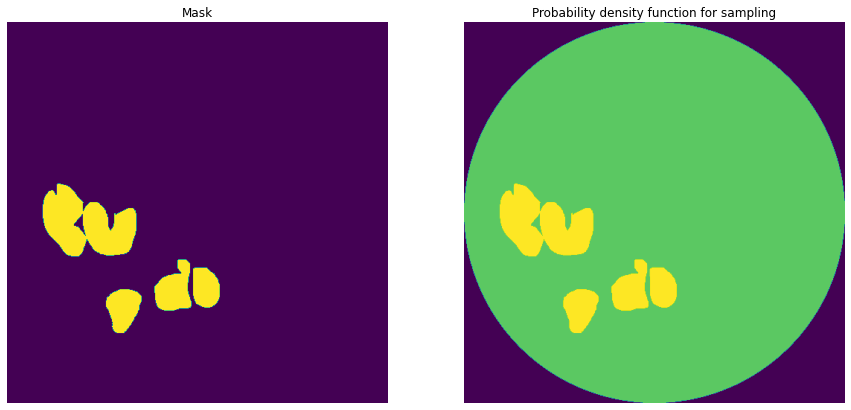

id                                                               4944
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2305360 41 2308352 55 2311322 96 2314311 113 2...
age                                                              37.0
sex                                                              Male
Name: 286, dtype: object
4944
Saving msk
Resizing PDF
Saving pdf cumsum


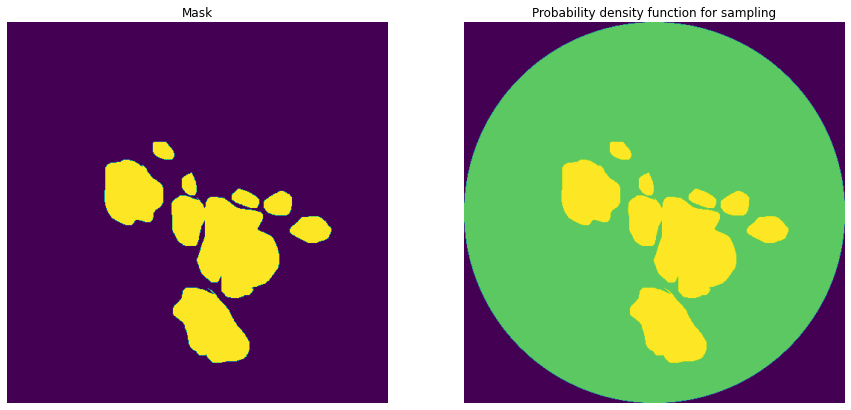

id                                                               5086
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1510934 32 1513930 36 1516928 38 1519926 40 15...
age                                                              65.0
sex                                                              Male
Name: 287, dtype: object
5086
Saving msk
Resizing PDF
Saving pdf cumsum


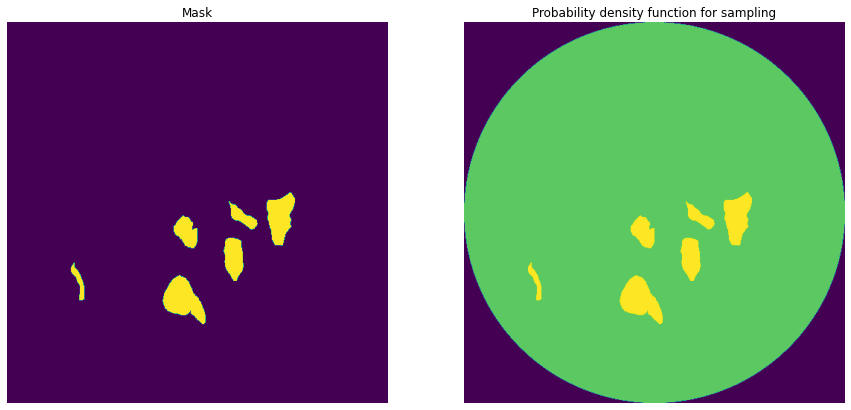

id                                                               5099
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4158877 96 4161875 99 4164870 116 4167869 119 ...
age                                                              28.0
sex                                                              Male
Name: 288, dtype: object
5099
Saving msk
Resizing PDF
Saving pdf cumsum


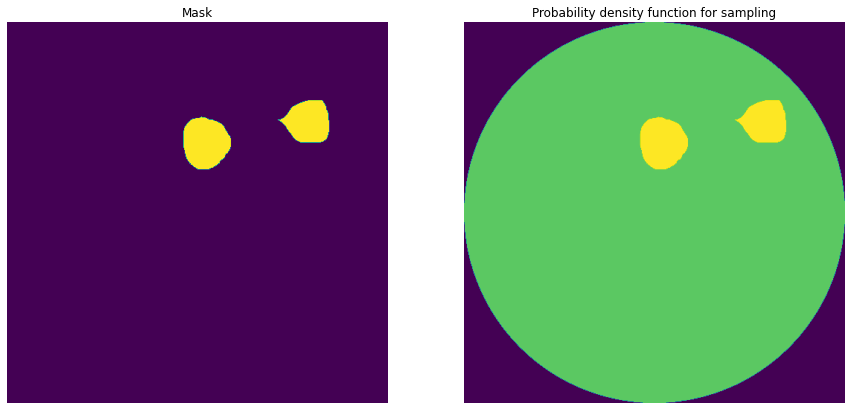

id                                                               5102
organ                                                          kidney
data_source                                                       HPA
img_height                                                       2631
img_width                                                        2631
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3191850 23 3194478 28 3197107 32 3199735 39 32...
age                                                              56.0
sex                                                            Female
Name: 289, dtype: object
5102
Saving msk
Resizing PDF
Saving pdf cumsum


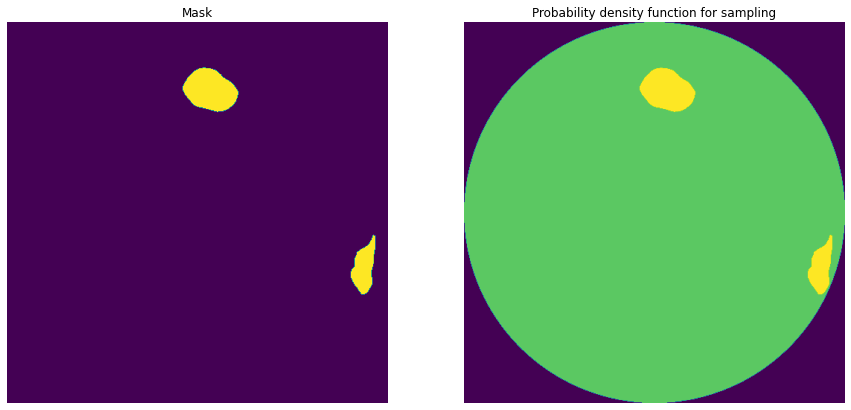

id                                                               5287
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1806590 1 1809589 2 1812588 4 1815587 5 181858...
age                                                              57.0
sex                                                              Male
Name: 290, dtype: object
5287
Saving msk
Resizing PDF
Saving pdf cumsum


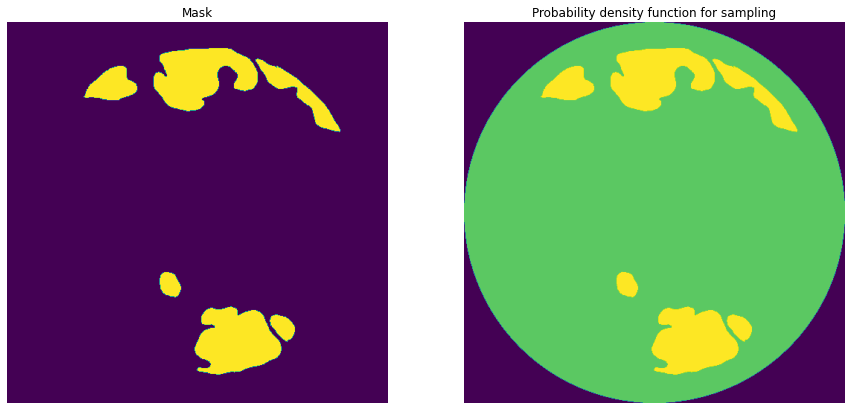

id                                                               5317
organ                                                        prostate
data_source                                                       HPA
img_height                                                       2416
img_width                                                        2416
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2290569 1 2292984 2 2295399 3 2297815 3 230023...
age                                                              48.0
sex                                                              Male
Name: 291, dtype: object
5317
Saving msk
Resizing PDF
Saving pdf cumsum


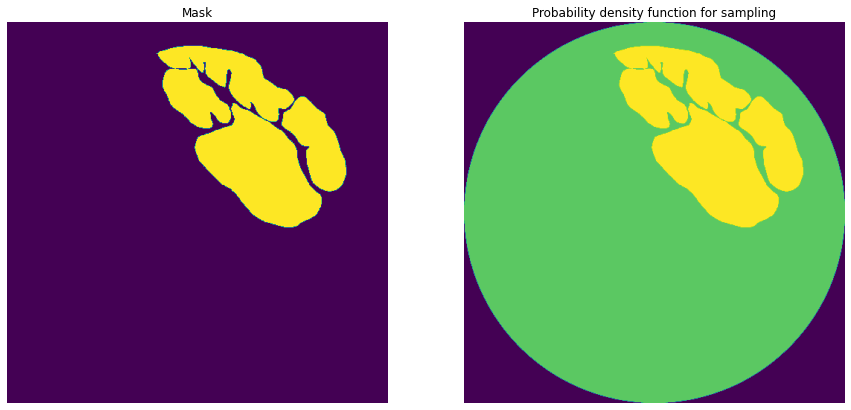

id                                                               5552
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 6155071 13 6158069 18 6161067 13 6161081 6 616...
age                                                              43.0
sex                                                            Female
Name: 292, dtype: object
5552
Saving msk
Resizing PDF
Saving pdf cumsum


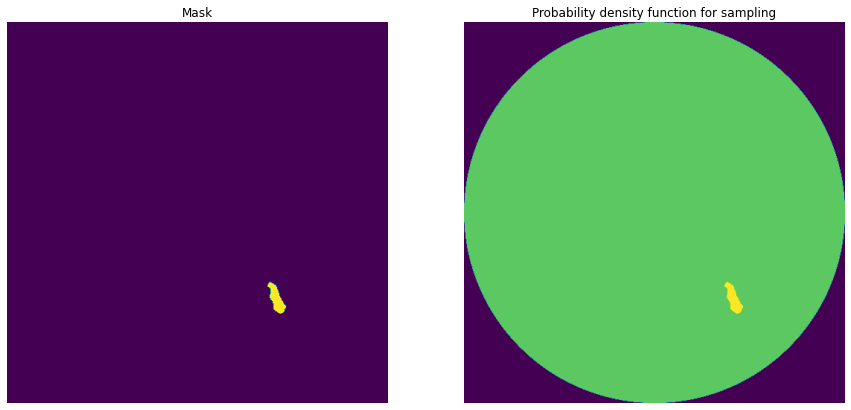

id                                                               5583
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2901494 40 2904493 43 2907493 45 2910491 59 29...
age                                                              50.0
sex                                                            Female
Name: 293, dtype: object
5583
Saving msk
Resizing PDF
Saving pdf cumsum


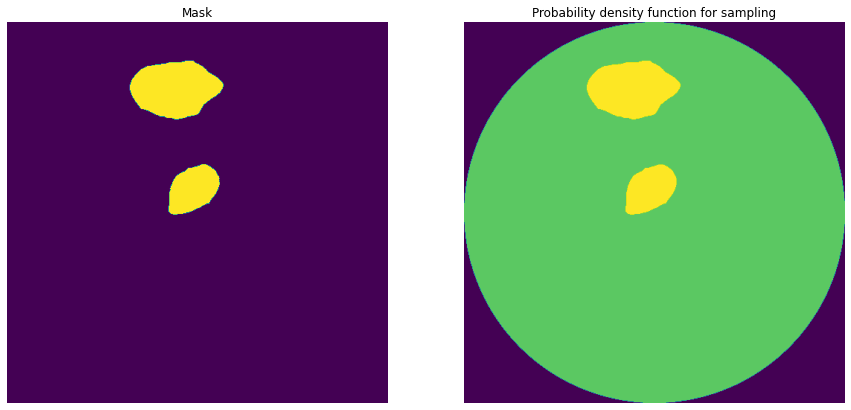

id                                                               5777
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4274535 30 4277533 34 4280531 37 4283529 39 42...
age                                                              43.0
sex                                                            Female
Name: 294, dtype: object
5777
Saving msk
Resizing PDF
Saving pdf cumsum


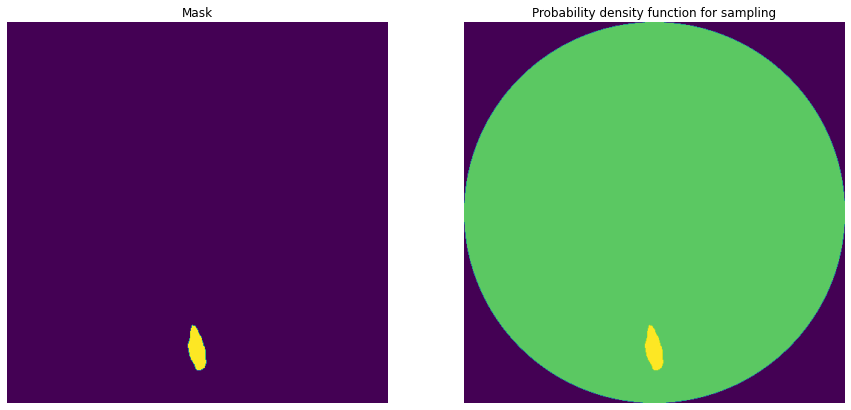

id                                                               5785
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 844710 8 847705 19 850705 21 853665 2 853678 4...
age                                                              60.0
sex                                                              Male
Name: 295, dtype: object
5785
Saving msk
Resizing PDF
Saving pdf cumsum


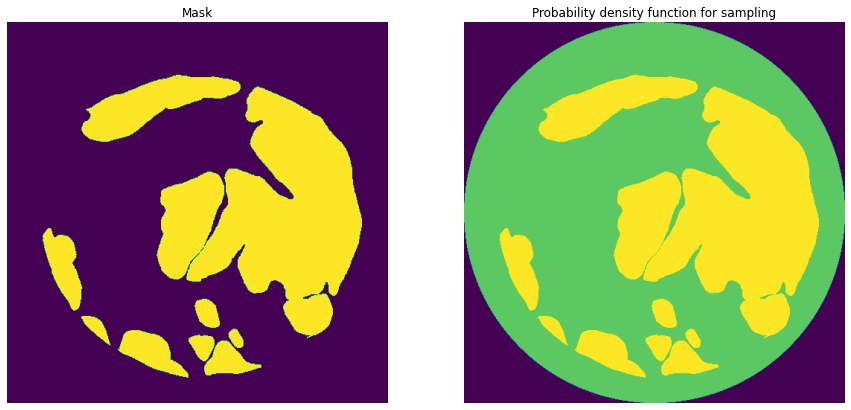

id                                                               5832
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 598311 23 598350 22 598409 16 601247 2 601299 ...
age                                                              47.0
sex                                                              Male
Name: 296, dtype: object
5832
Saving msk
Resizing PDF
Saving pdf cumsum


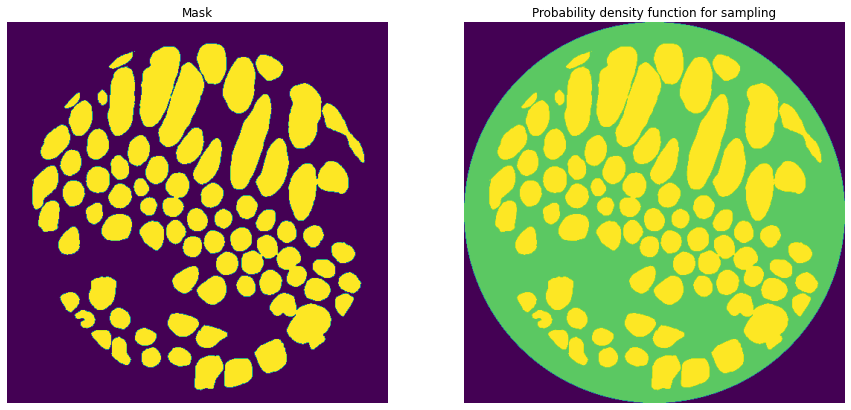

id                                                               5932
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 415769 24 418768 26 421762 38 424760 42 427758...
age                                                              76.0
sex                                                              Male
Name: 297, dtype: object
5932
Saving msk
Resizing PDF
Saving pdf cumsum


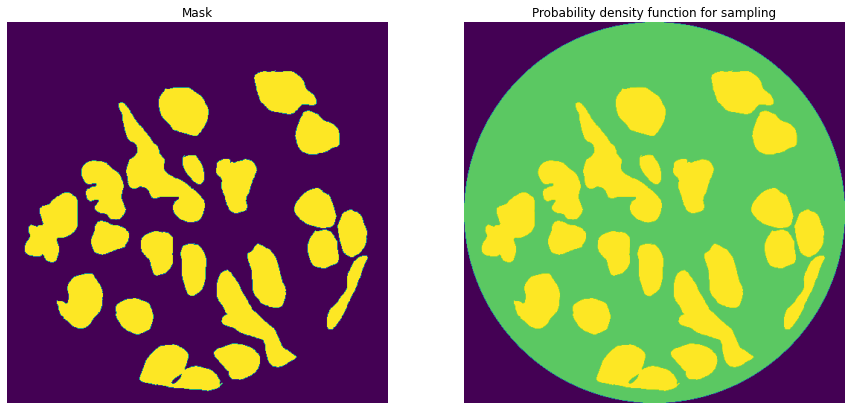

id                                                               5995
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 877568 33 877648 24 880566 36 880647 26 883564...
age                                                              61.0
sex                                                              Male
Name: 298, dtype: object
5995
Saving msk
Resizing PDF
Saving pdf cumsum


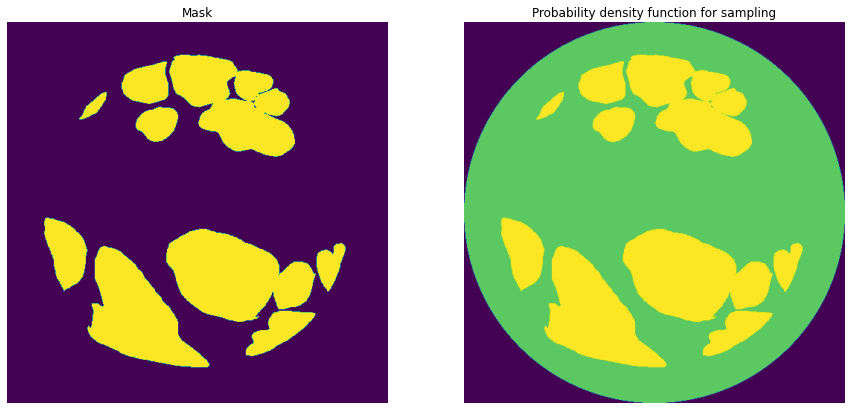

id                                                               6021
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3962938 30 3965936 34 3968934 38 3971932 41 39...
age                                                              41.0
sex                                                            Female
Name: 299, dtype: object
6021
Saving msk
Resizing PDF
Saving pdf cumsum


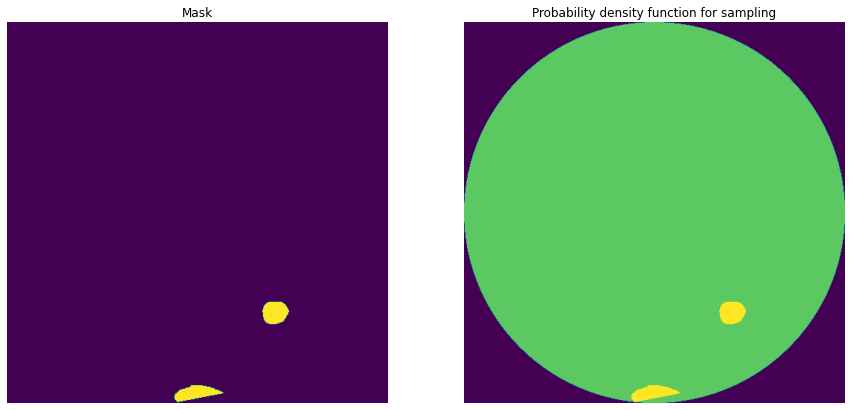

id                                                               6120
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 685544 13 688543 15 691542 17 694362 34 694529...
age                                                              37.0
sex                                                              Male
Name: 300, dtype: object
6120
Saving msk
Resizing PDF
Saving pdf cumsum


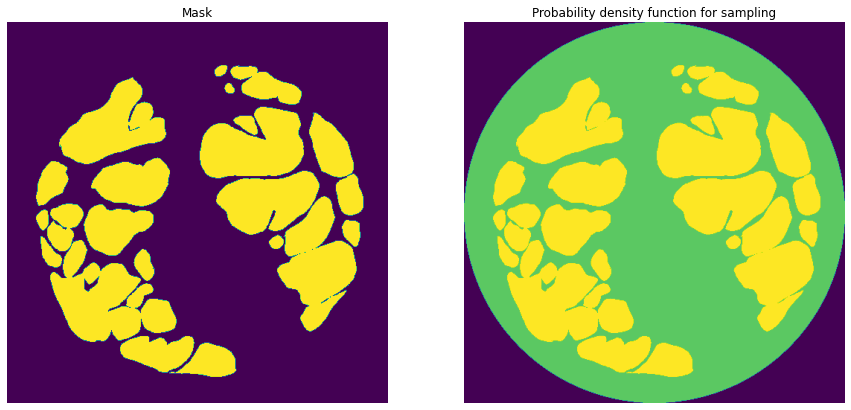

id                                                               6121
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2737773 53 2740768 59 2743759 75 2746758 77 27...
age                                                              84.0
sex                                                            Female
Name: 301, dtype: object
6121
Saving msk
Resizing PDF
Saving pdf cumsum


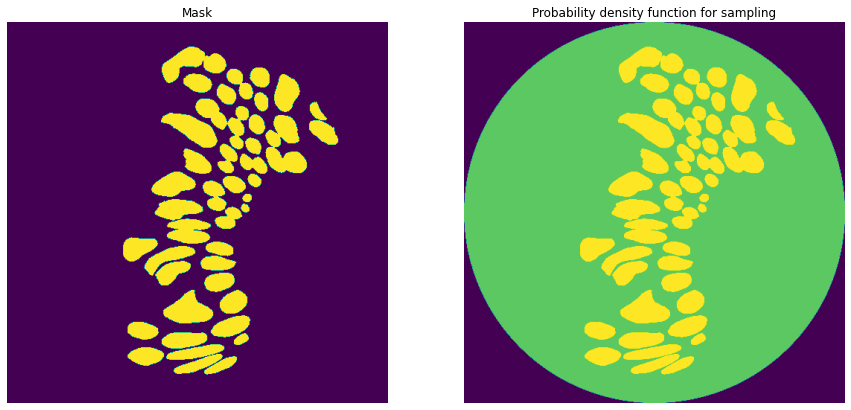

id                                                                 62
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4382055 23 4385050 34 4388048 44 4391045 57 43...
age                                                              59.0
sex                                                              Male
Name: 302, dtype: object
62
Saving msk
Resizing PDF
Saving pdf cumsum


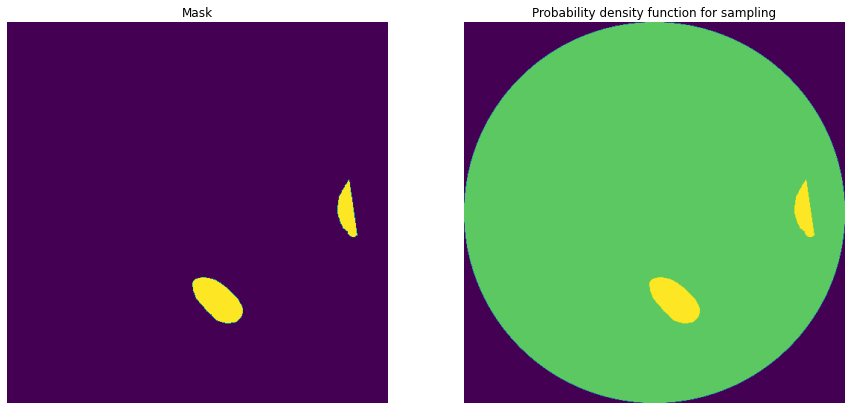

id                                                               6318
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3263665 31 3266665 35 3269664 37 3272663 41 32...
age                                                              61.0
sex                                                              Male
Name: 303, dtype: object
6318
Saving msk
Resizing PDF
Saving pdf cumsum


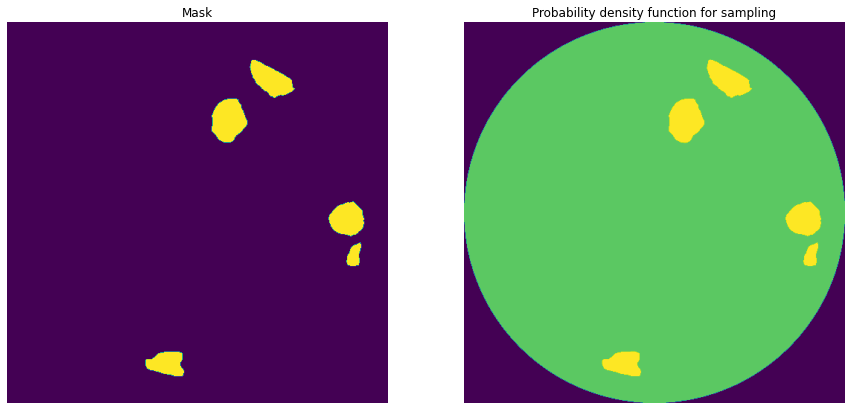

id                                                               6390
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2715716 30 2718715 32 2721715 33 2724714 41 27...
age                                                              55.0
sex                                                              Male
Name: 304, dtype: object
6390
Saving msk
Resizing PDF
Saving pdf cumsum


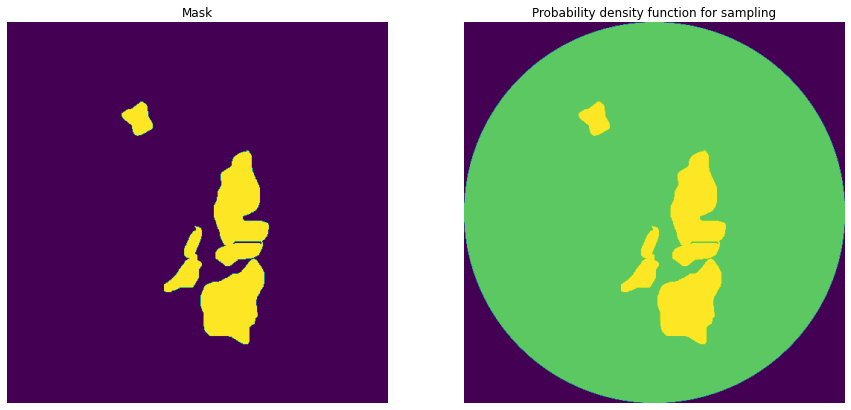

id                                                                660
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4176821 27 4179817 38 4182813 46 4185806 56 41...
age                                                              56.0
sex                                                            Female
Name: 305, dtype: object
660
Saving msk
Resizing PDF
Saving pdf cumsum


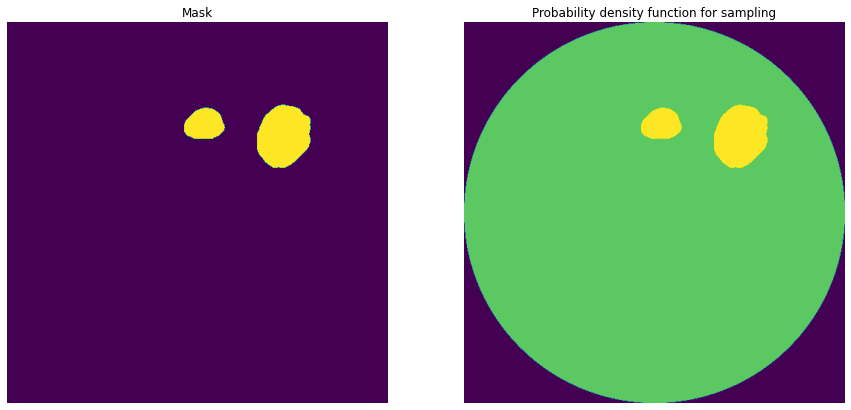

id                                                               6611
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 403486 25 406485 28 409484 33 412482 36 415479...
age                                                              84.0
sex                                                            Female
Name: 306, dtype: object
6611
Saving msk
Resizing PDF
Saving pdf cumsum


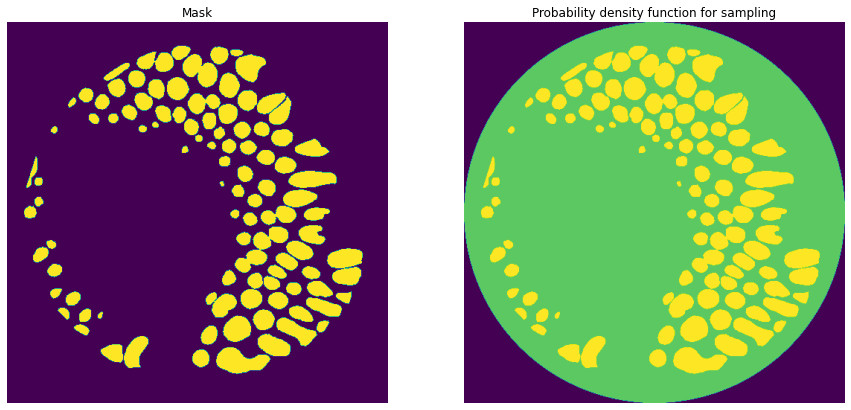

id                                                               6722
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1732919 19 1735914 29 1738913 32 1741911 38 17...
age                                                              57.0
sex                                                              Male
Name: 307, dtype: object
6722
Saving msk
Resizing PDF
Saving pdf cumsum


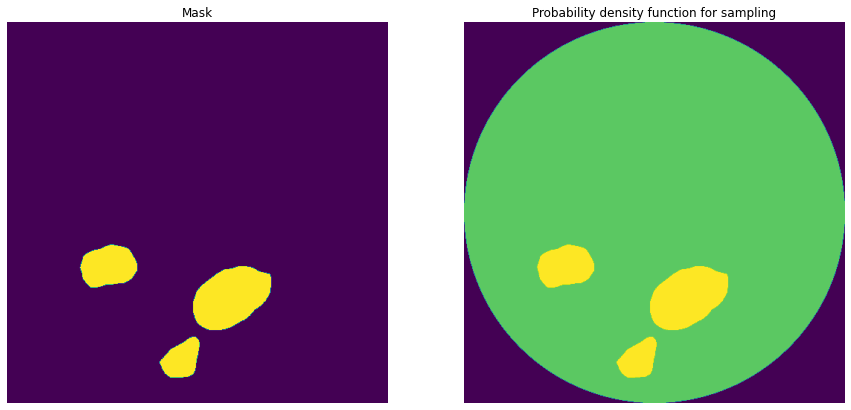

id                                                               6730
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1360948 40 1363947 42 1366946 44 1369938 53 13...
age                                                              57.0
sex                                                              Male
Name: 308, dtype: object
6730
Saving msk
Resizing PDF
Saving pdf cumsum


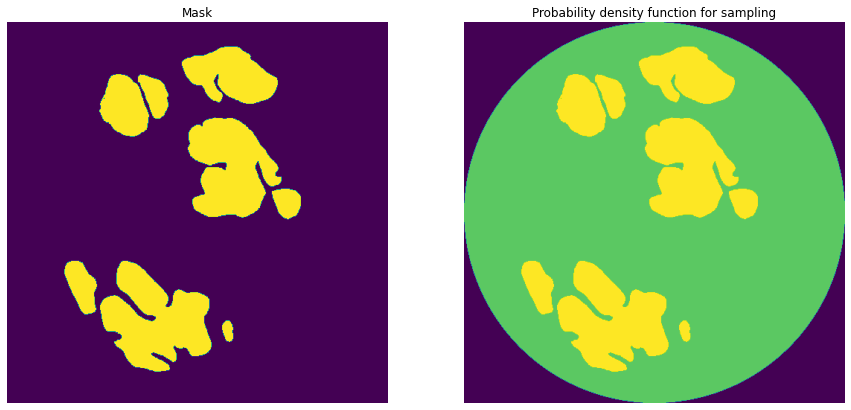

id                                                                676
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1306250 17 1309247 22 1309446 9 1312246 24 131...
age                                                              79.0
sex                                                            Female
Name: 309, dtype: object
676
Saving msk
Resizing PDF
Saving pdf cumsum


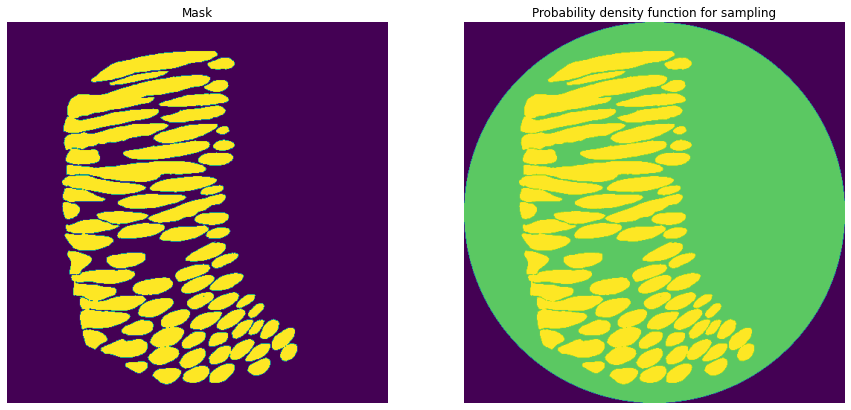

id                                                               6794
organ                                                        prostate
data_source                                                       HPA
img_height                                                       2593
img_width                                                        2593
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 615409 7 618001 10 620585 26 623176 29 625764 ...
age                                                              76.0
sex                                                              Male
Name: 310, dtype: object
6794
Saving msk
Resizing PDF
Saving pdf cumsum


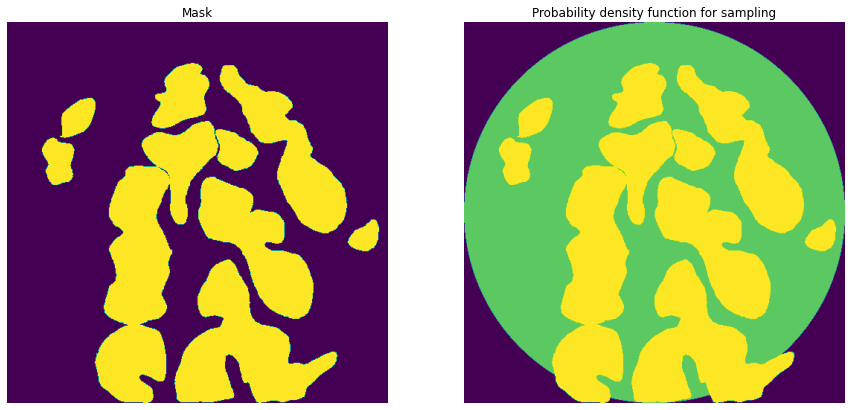

id                                                               6807
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1588425 13 1591421 23 1594418 37 1597415 49 16...
age                                                              59.0
sex                                                              Male
Name: 311, dtype: object
6807
Saving msk
Resizing PDF
Saving pdf cumsum


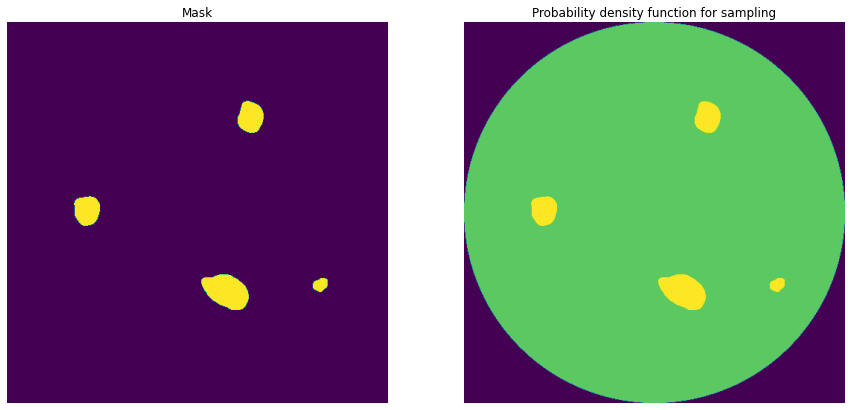

id                                                                686
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3032126 43 3035125 44 3038123 47 3041122 50 30...
age                                                              59.0
sex                                                              Male
Name: 312, dtype: object
686
Saving msk
Resizing PDF
Saving pdf cumsum


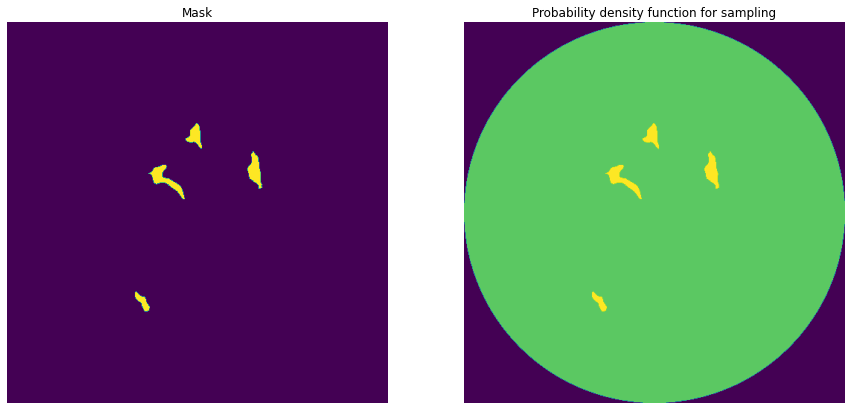

id                                                               7169
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1968686 8 1971684 13 1974650 50 1977648 54 198...
age                                                              82.0
sex                                                              Male
Name: 313, dtype: object
7169
Saving msk
Resizing PDF
Saving pdf cumsum


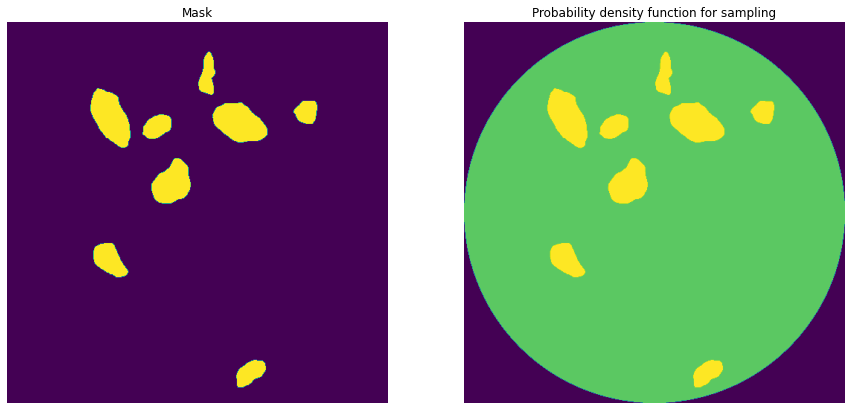

id                                                               7359
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4020786 16 4023785 22 4026784 27 4029782 31 40...
age                                                              43.0
sex                                                            Female
Name: 314, dtype: object
7359
Saving msk
Resizing PDF
Saving pdf cumsum


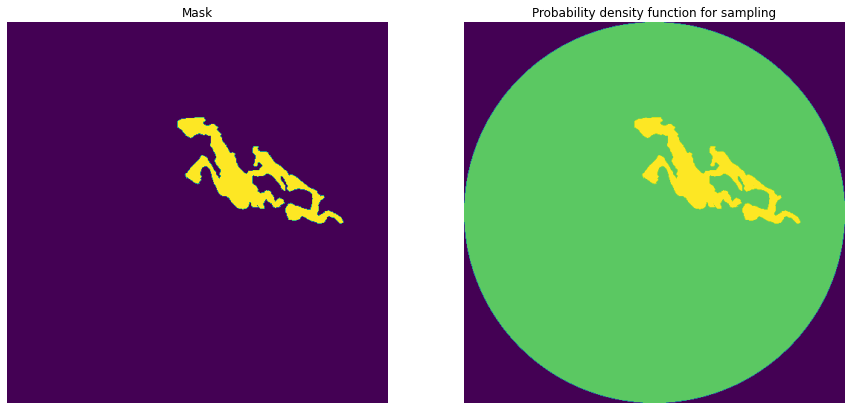

id                                                                737
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2970903 20 2973901 24 2976888 43 2979884 48 29...
age                                                              55.0
sex                                                              Male
Name: 315, dtype: object
737
Saving msk
Resizing PDF
Saving pdf cumsum


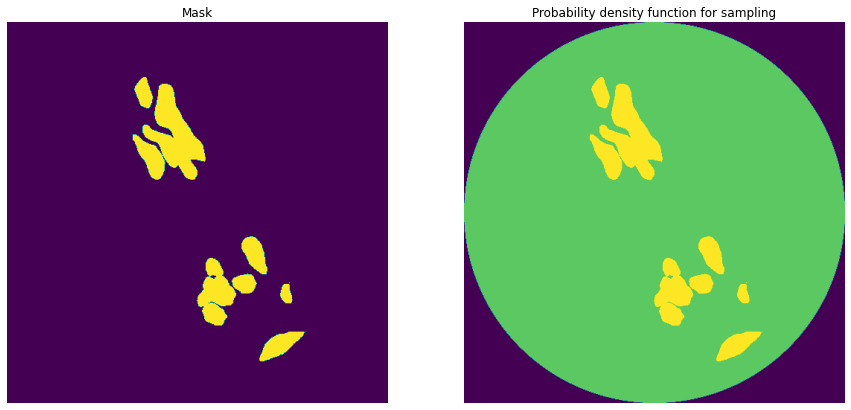

id                                                               7397
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3160782 56 3163780 60 3166779 62 3169777 65 31...
age                                                              60.0
sex                                                              Male
Name: 316, dtype: object
7397
Saving msk
Resizing PDF
Saving pdf cumsum


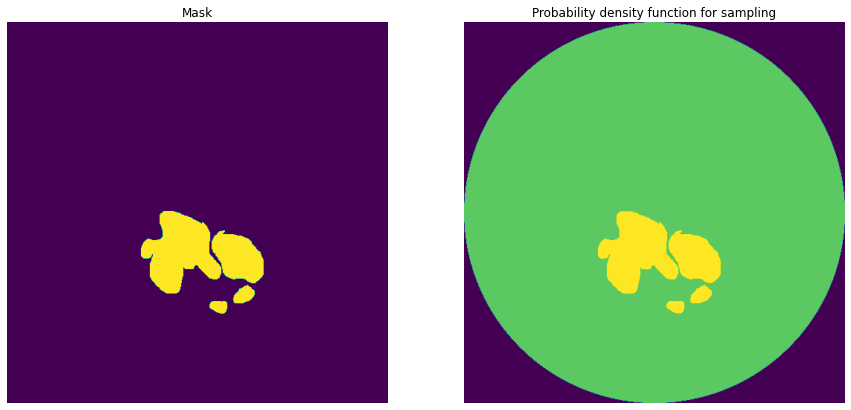

id                                                               7569
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2270333 17 2273328 25 2276318 45 2279314 52 22...
age                                                              68.0
sex                                                            Female
Name: 317, dtype: object
7569
Saving msk
Resizing PDF
Saving pdf cumsum


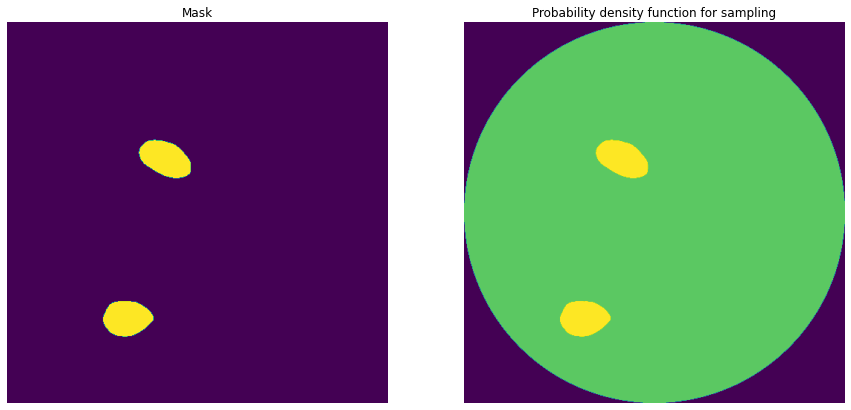

id                                                               7706
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 799394 14 802393 17 805392 19 808391 34 811389...
age                                                              76.0
sex                                                              Male
Name: 318, dtype: object
7706
Saving msk
Resizing PDF
Saving pdf cumsum


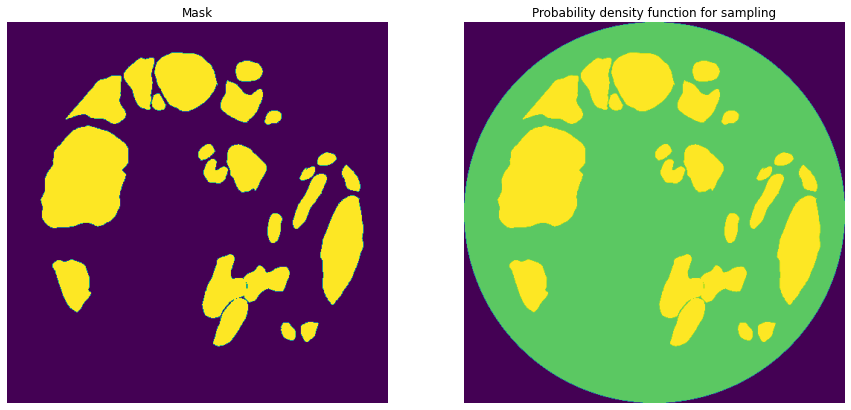

id                                                               7902
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2490568 9 2493561 23 2496559 26 2499558 28 250...
age                                                              37.0
sex                                                              Male
Name: 319, dtype: object
7902
Saving msk
Resizing PDF
Saving pdf cumsum


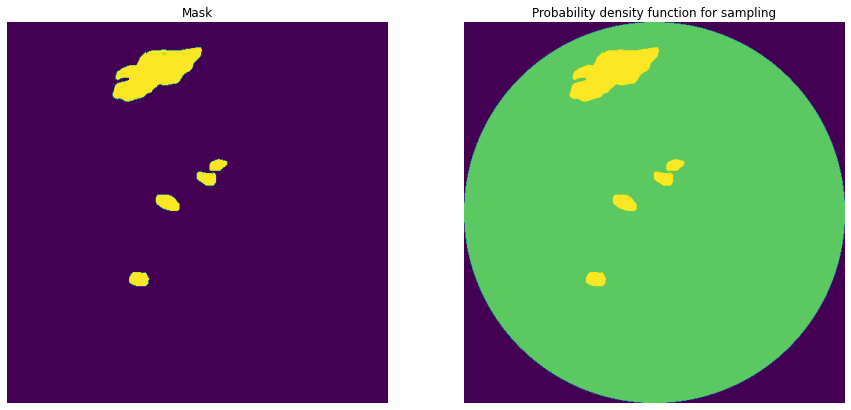

id                                                               7970
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1964081 19 1967076 25 1970075 27 1973073 34 19...
age                                                              73.0
sex                                                              Male
Name: 320, dtype: object
7970
Saving msk
Resizing PDF
Saving pdf cumsum


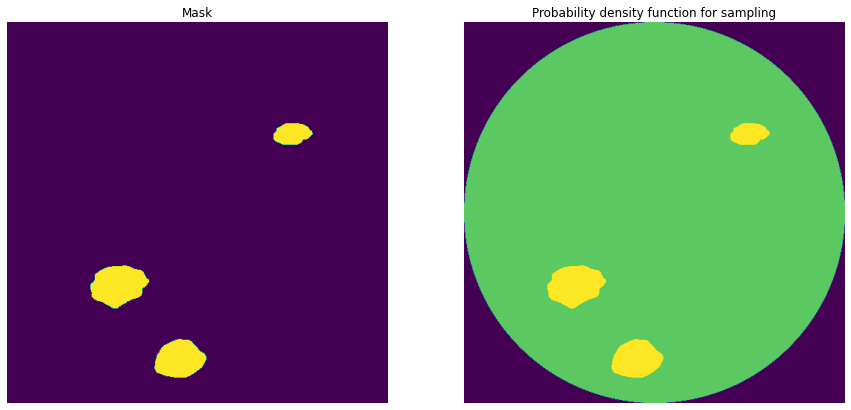

id                                                               8116
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 994719 76 997717 79 1000711 103 1003709 110 10...
age                                                              57.0
sex                                                              Male
Name: 321, dtype: object
8116
Saving msk
Resizing PDF
Saving pdf cumsum


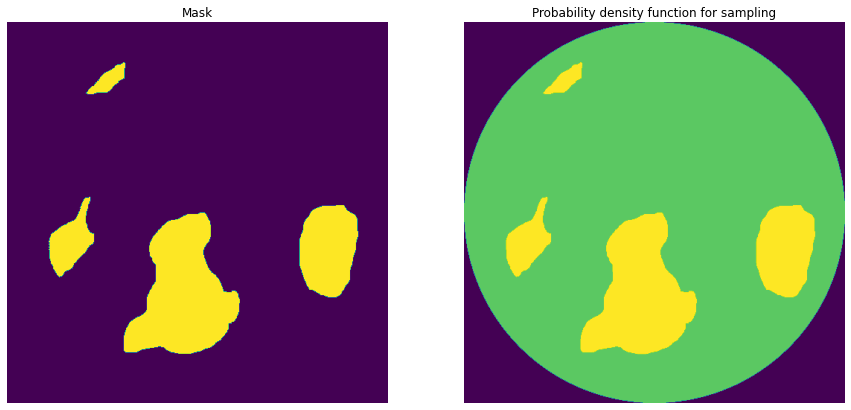

id                                                               8151
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2057037 10 2060034 13 2063031 17 2066027 21 20...
age                                                              21.0
sex                                                              Male
Name: 322, dtype: object
8151
Saving msk
Resizing PDF
Saving pdf cumsum


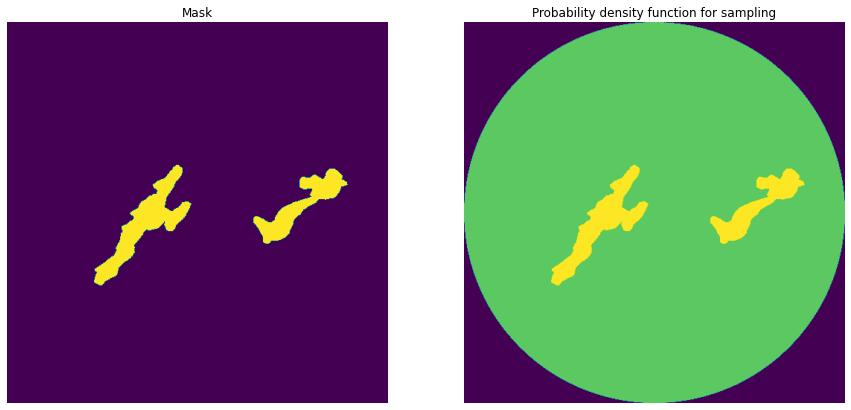

id                                                               8222
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 165901 31 168900 33 171891 44 174890 47 177888...
age                                                              79.0
sex                                                            Female
Name: 323, dtype: object
8222
Saving msk
Resizing PDF
Saving pdf cumsum


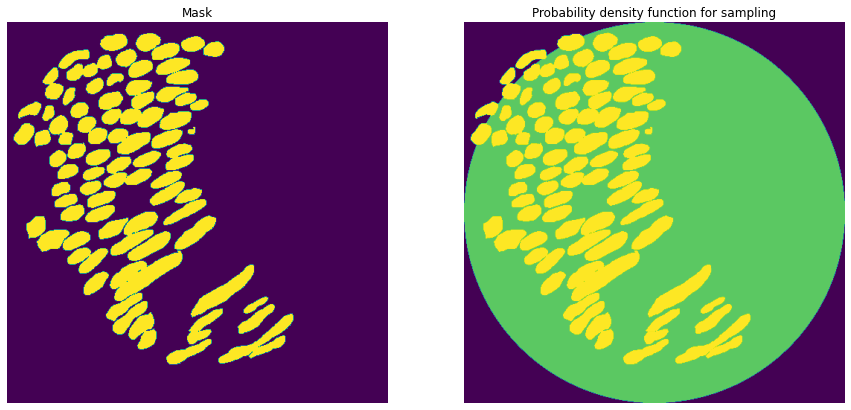

id                                                               8227
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 529710 25 532708 28 535700 40 538699 43 541698...
age                                                              37.0
sex                                                              Male
Name: 324, dtype: object
8227
Saving msk
Resizing PDF
Saving pdf cumsum


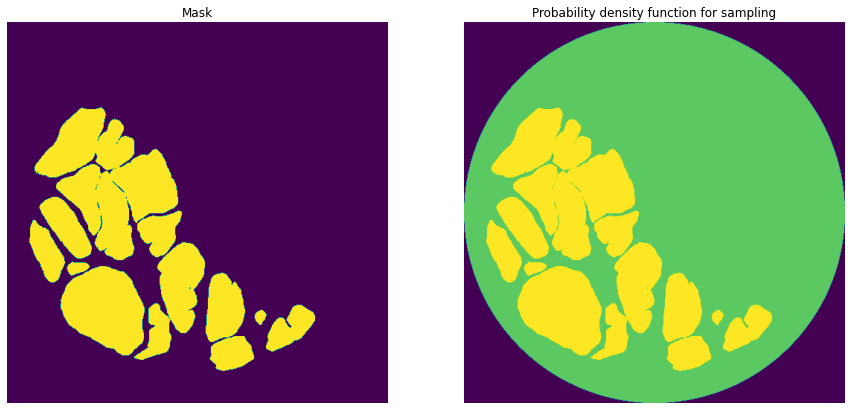

id                                                               8231
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3707337 1 3710337 2 3713336 4 3716336 6 371933...
age                                                              78.0
sex                                                              Male
Name: 325, dtype: object
8231
Saving msk
Resizing PDF
Saving pdf cumsum


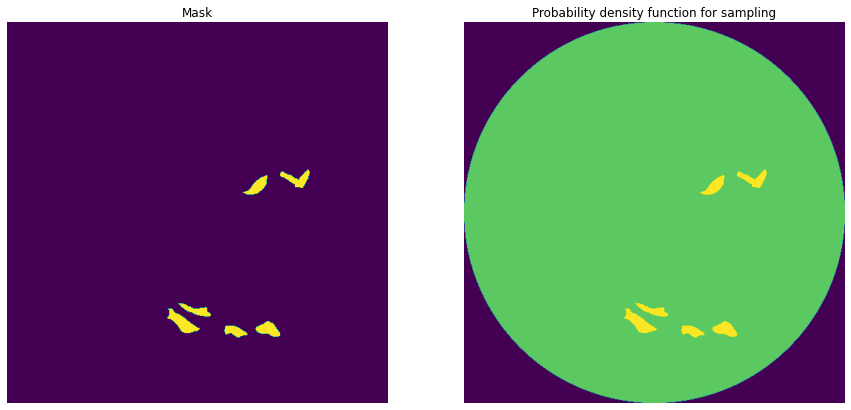

id                                                               8343
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2170394 3 2173394 6 2176394 7 2179395 7 218239...
age                                                              49.0
sex                                                            Female
Name: 326, dtype: object
8343
Saving msk
Resizing PDF
Saving pdf cumsum


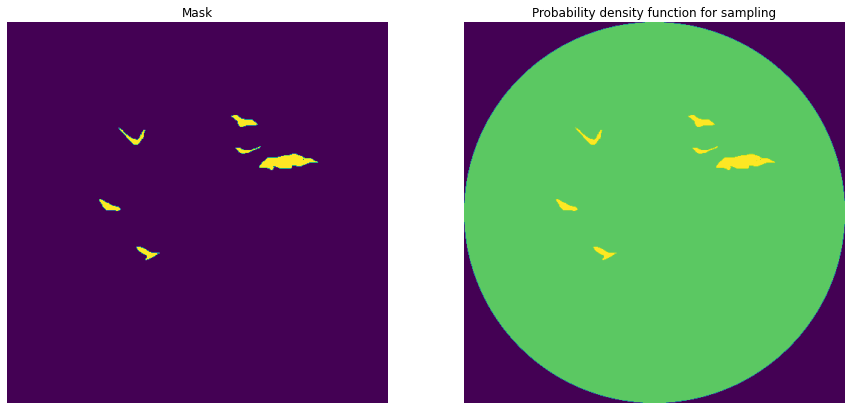

id                                                               8388
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2989254 26 2992254 28 2995251 35 2998246 45 30...
age                                                              57.0
sex                                                              Male
Name: 327, dtype: object
8388
Saving msk
Resizing PDF
Saving pdf cumsum


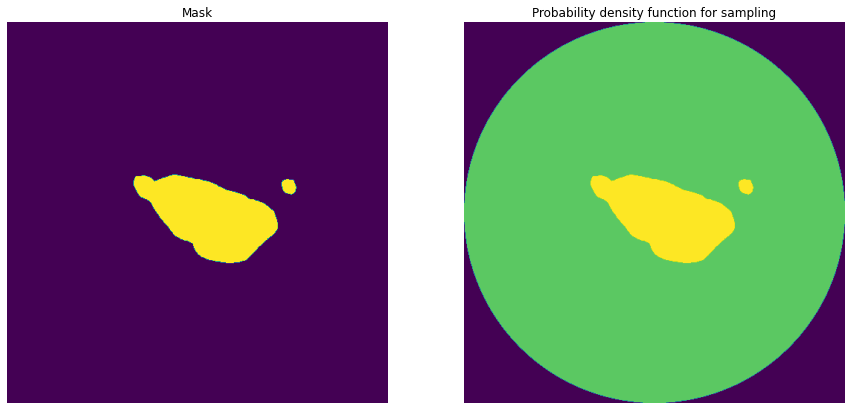

id                                                               8402
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 679462 5 682457 13 685448 25 685504 27 688447 ...
age                                                              83.0
sex                                                              Male
Name: 328, dtype: object
8402
Saving msk
Resizing PDF
Saving pdf cumsum


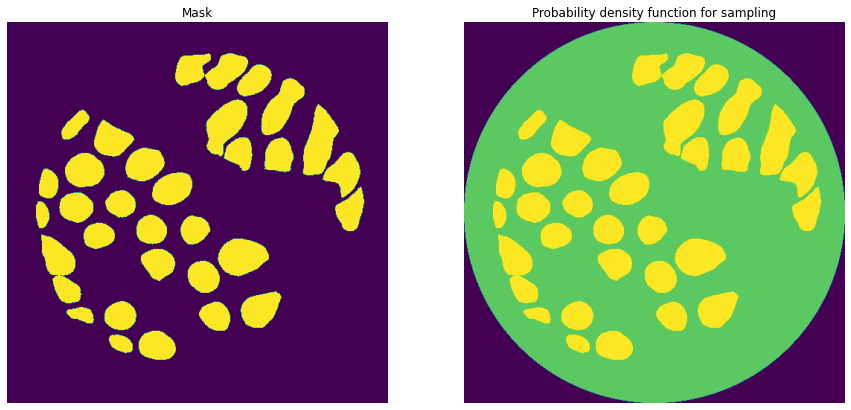

id                                                               8450
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 736706 12 739698 33 742691 52 745689 67 748686...
age                                                              65.0
sex                                                            Female
Name: 329, dtype: object
8450
Saving msk
Resizing PDF
Saving pdf cumsum


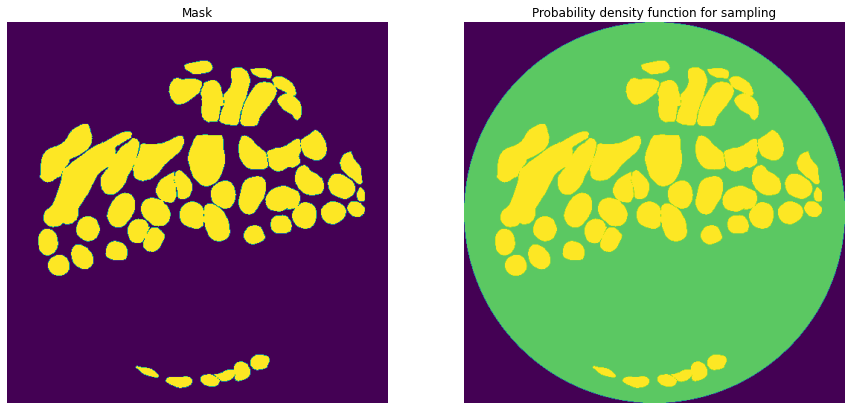

id                                                               8502
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2308023 17 2311014 30 2314004 49 2317000 59 23...
age                                                              56.0
sex                                                            Female
Name: 330, dtype: object
8502
Saving msk
Resizing PDF
Saving pdf cumsum


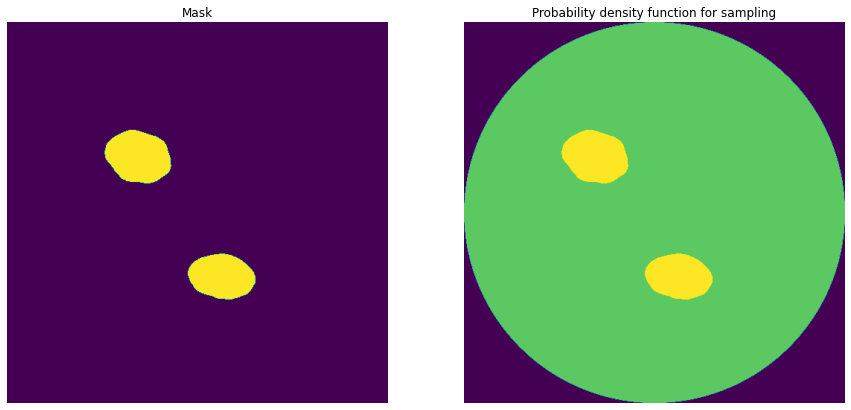

id                                                               8638
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3312310 10 3315310 11 3318301 25 3321299 27 33...
age                                                              48.0
sex                                                              Male
Name: 331, dtype: object
8638
Saving msk
Resizing PDF
Saving pdf cumsum


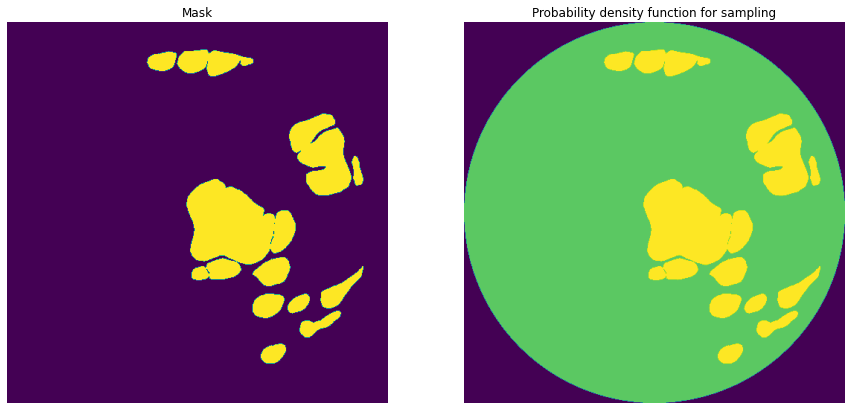

id                                                               8752
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 793679 20 796675 32 799670 74 802662 95 805654...
age                                                              84.0
sex                                                              Male
Name: 332, dtype: object
8752
Saving msk
Resizing PDF
Saving pdf cumsum


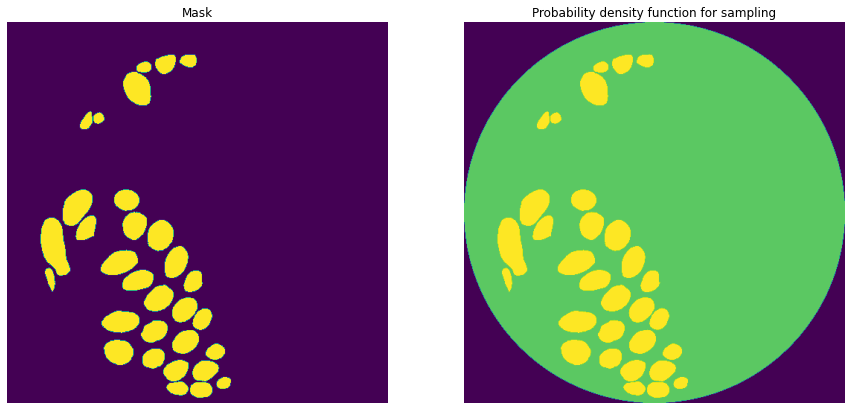

id                                                               8842
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1430055 19 1430115 36 1433053 21 1433114 38 14...
age                                                              61.0
sex                                                              Male
Name: 333, dtype: object
8842
Saving msk
Resizing PDF
Saving pdf cumsum


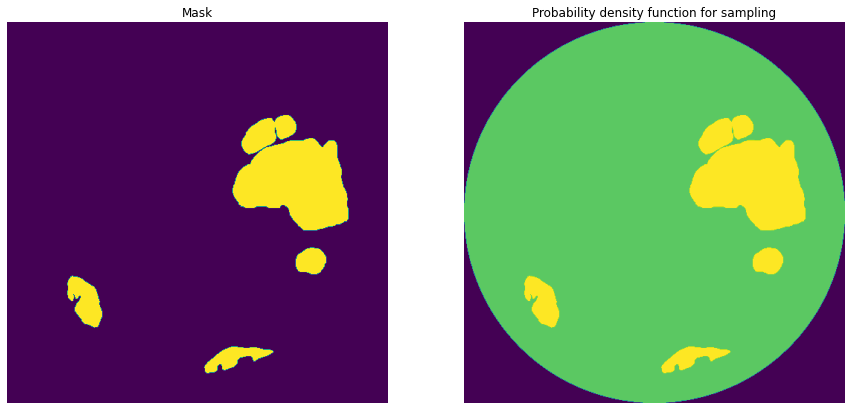

id                                                               8876
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3102247 12 3105246 14 3108246 19 3111245 20 31...
age                                                              57.0
sex                                                              Male
Name: 334, dtype: object
8876
Saving msk
Resizing PDF
Saving pdf cumsum


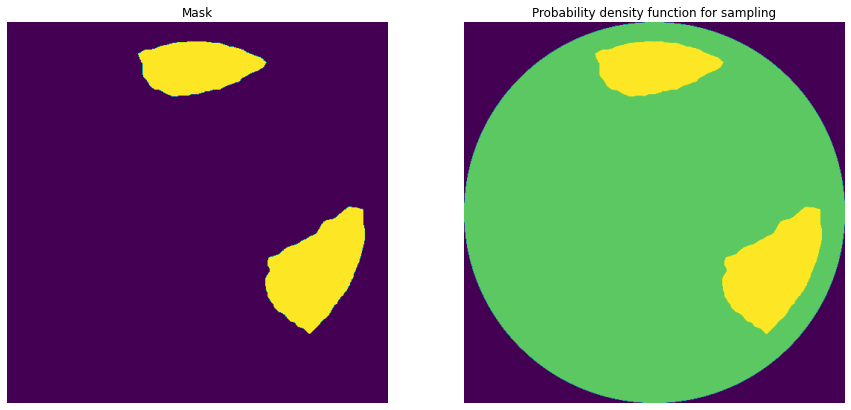

id                                                               8894
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 934450 1 937448 3 940447 3 943445 5 946444 5 9...
age                                                              57.0
sex                                                              Male
Name: 335, dtype: object
8894
Saving msk
Resizing PDF
Saving pdf cumsum


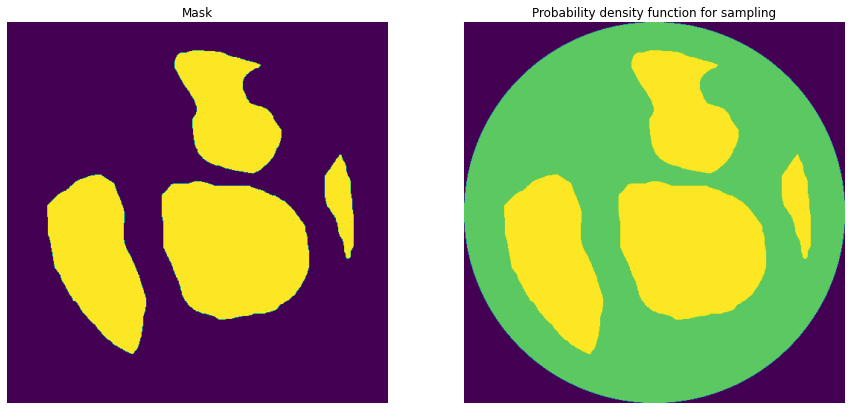

id                                                               9231
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1048080 26 1051079 28 1054078 30 1057071 39 10...
age                                                              55.0
sex                                                              Male
Name: 336, dtype: object
9231
Saving msk
Resizing PDF
Saving pdf cumsum


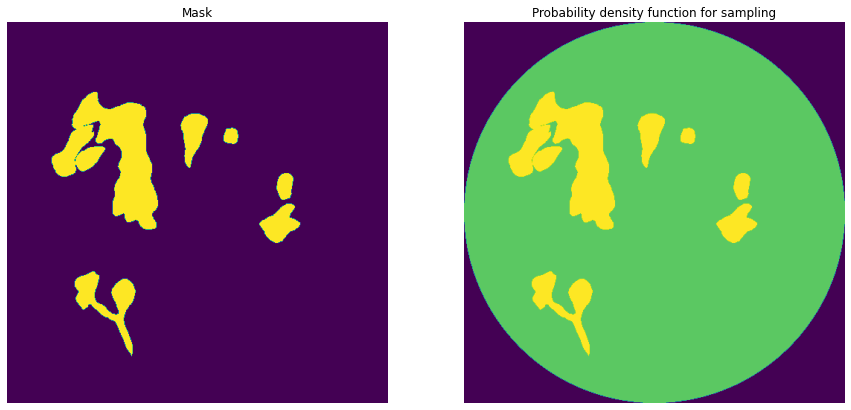

id                                                                928
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1980656 1 1980673 27 1981666 48 1983655 1 1983...
age                                                              55.0
sex                                                              Male
Name: 337, dtype: object
928
Saving msk
Resizing PDF
Saving pdf cumsum


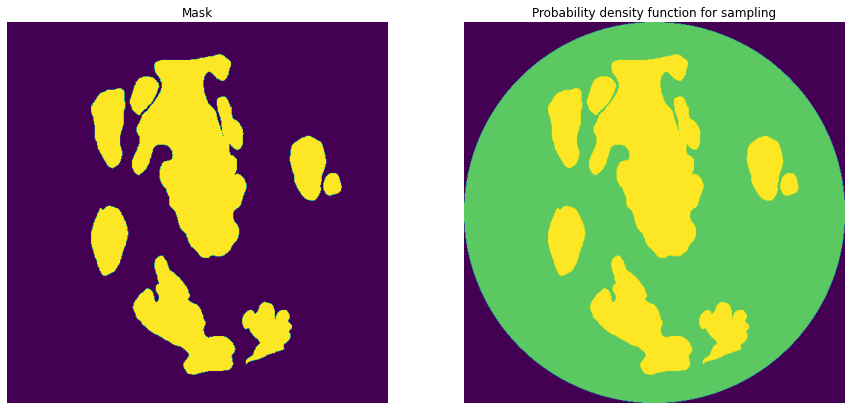

id                                                               9358
organ                                                        prostate
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4173254 1 4176253 2 4179251 3 4182250 4 418524...
age                                                              55.0
sex                                                              Male
Name: 338, dtype: object
9358
Saving msk
Resizing PDF
Saving pdf cumsum


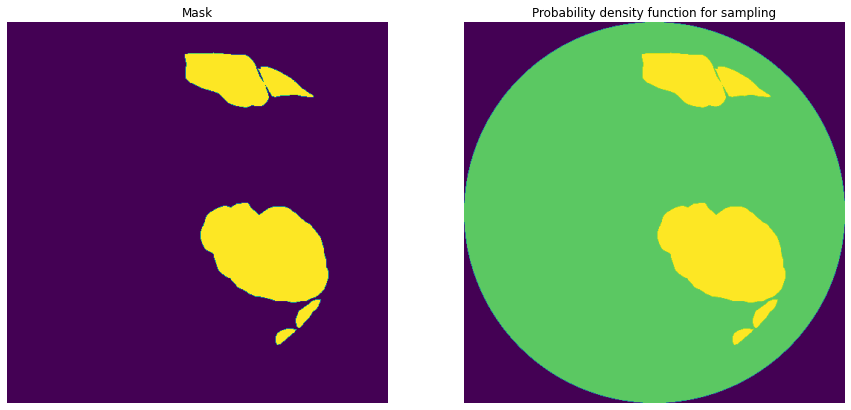

id                                                               9387
organ                                                            lung
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1996630 8 1999626 14 2002624 16 2005622 19 200...
age                                                              49.0
sex                                                            Female
Name: 339, dtype: object
9387
Saving msk
Resizing PDF
Saving pdf cumsum


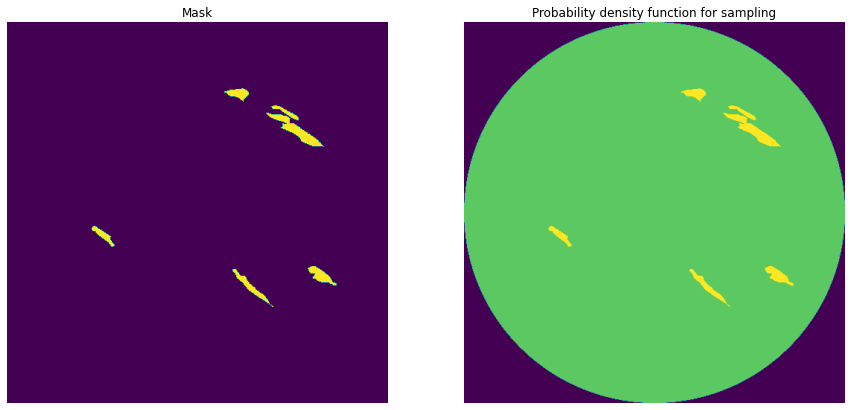

id                                                               9407
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 2184669 23 2187667 27 2190665 31 2193661 37 21...
age                                                              57.0
sex                                                              Male
Name: 340, dtype: object
9407
Saving msk
Resizing PDF
Saving pdf cumsum


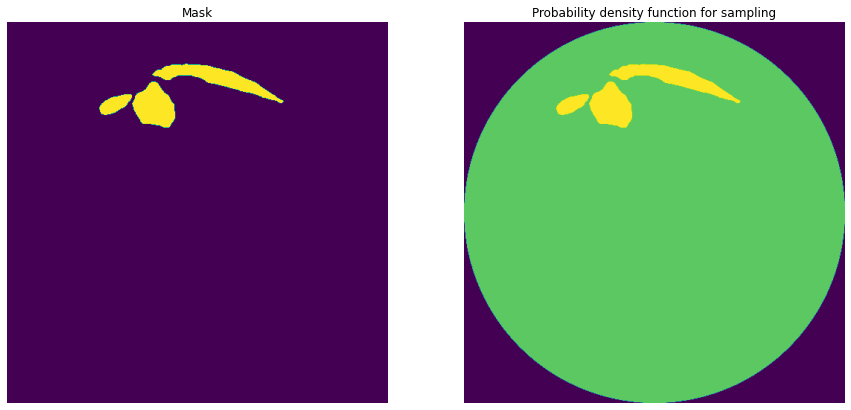

id                                                               9437
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 841572 20 844566 38 847564 45 850563 50 853555...
age                                                              68.0
sex                                                            Female
Name: 341, dtype: object
9437
Saving msk
Resizing PDF
Saving pdf cumsum


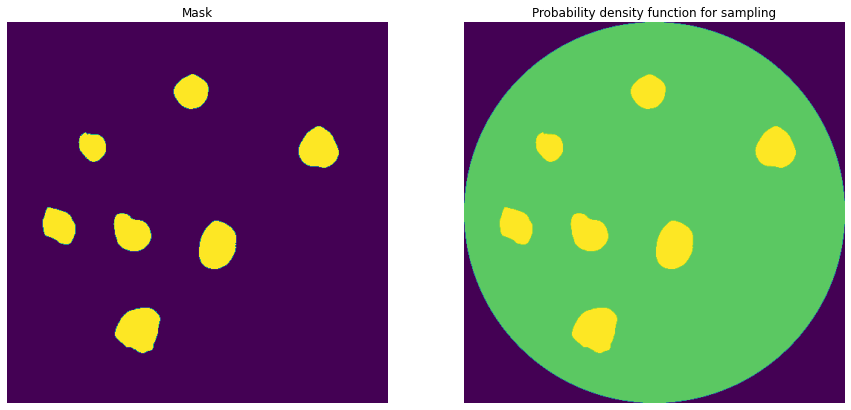

id                                                               9445
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 5515207 20 5518204 29 5521202 35 5524202 36 55...
age                                                              28.0
sex                                                              Male
Name: 342, dtype: object
9445
Saving msk
Resizing PDF
Saving pdf cumsum


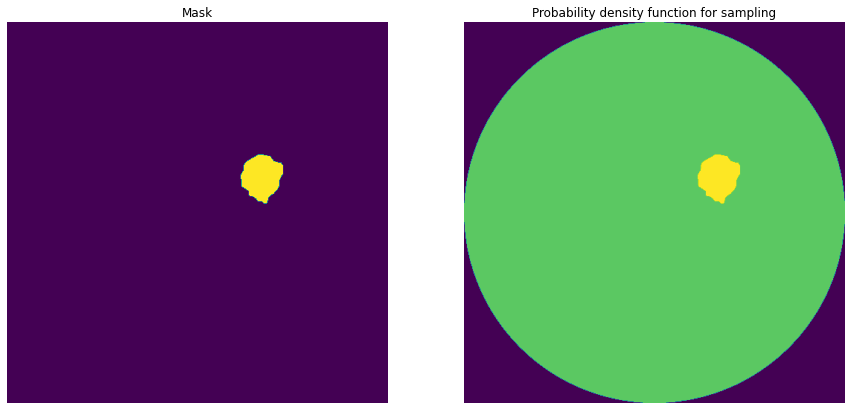

id                                                               9450
organ                                                            lung
data_source                                                       HPA
img_height                                                       2675
img_width                                                        2675
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1779826 5 1782499 8 1785172 11 1787845 14 1790...
age                                                              57.0
sex                                                            Female
Name: 343, dtype: object
9450
Saving msk
Resizing PDF
Saving pdf cumsum


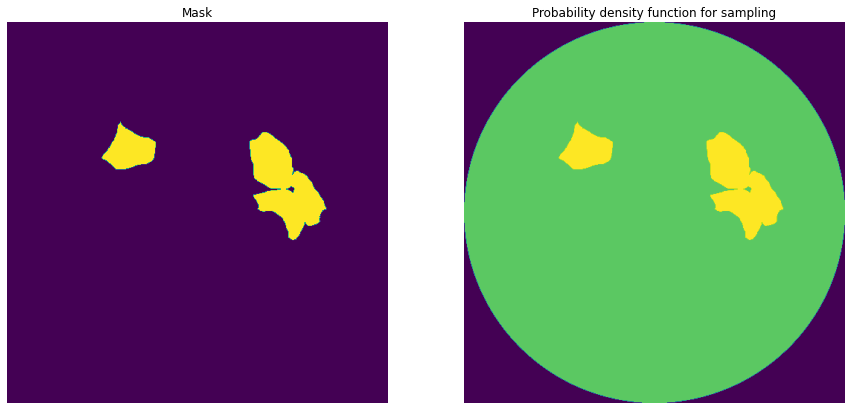

id                                                               9453
organ                                                          spleen
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3270895 59 3273894 62 3276888 69 3279887 71 32...
age                                                              82.0
sex                                                              Male
Name: 344, dtype: object
9453
Saving msk
Resizing PDF
Saving pdf cumsum


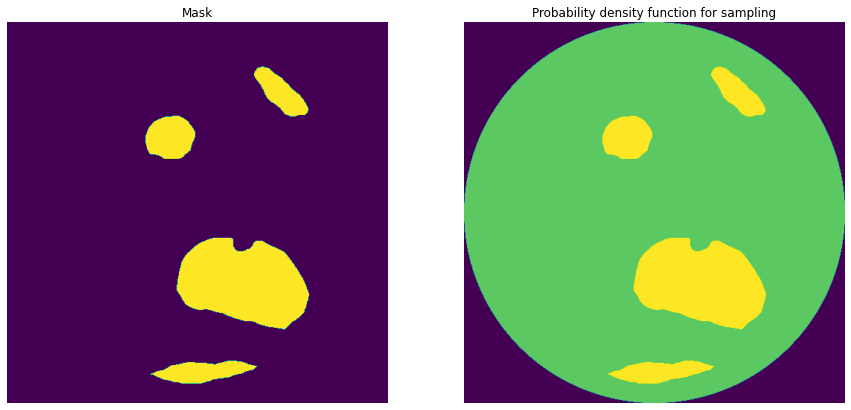

id                                                               9470
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 3969980 35 3970027 28 3972971 88 3975966 97 39...
age                                                              61.0
sex                                                              Male
Name: 345, dtype: object
9470
Saving msk
Resizing PDF
Saving pdf cumsum


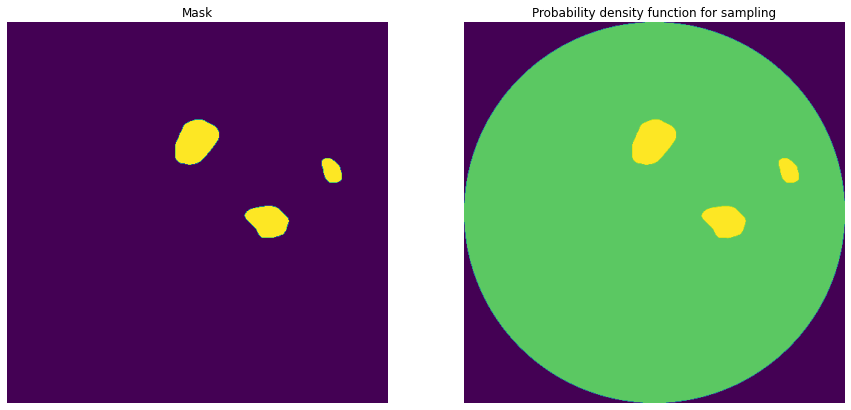

id                                                               9517
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1611763 11 1614753 29 1617750 35 1620746 43 16...
age                                                              61.0
sex                                                              Male
Name: 346, dtype: object
9517
Saving msk
Resizing PDF
Saving pdf cumsum


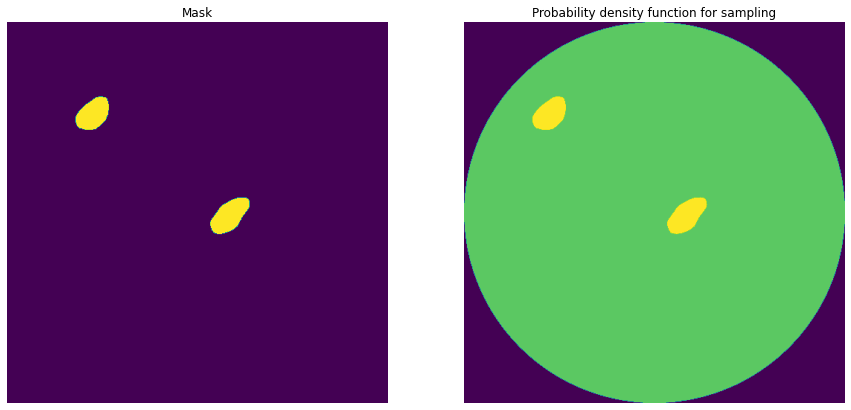

id                                                               9769
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3070
img_width                                                        3070
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 4030400 28 4033466 34 4036526 48 4039594 54 40...
age                                                              28.0
sex                                                              Male
Name: 347, dtype: object
9769
Saving msk
Resizing PDF
Saving pdf cumsum


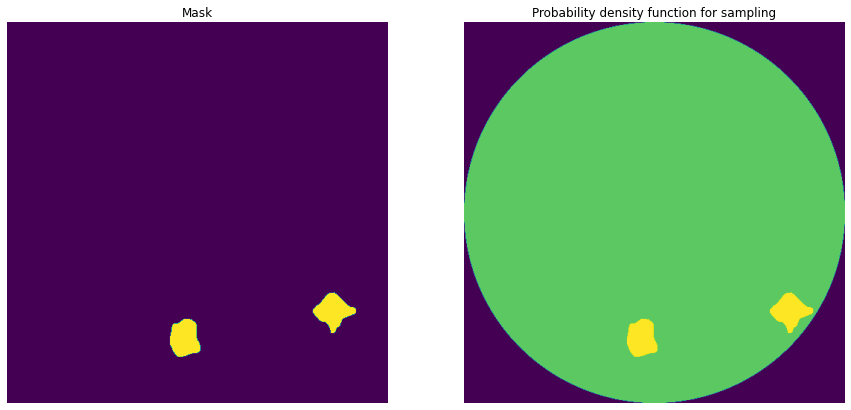

id                                                               9777
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 538473 13 541468 22 544463 30 547461 35 550459...
age                                                              84.0
sex                                                              Male
Name: 348, dtype: object
9777
Saving msk
Resizing PDF
Saving pdf cumsum


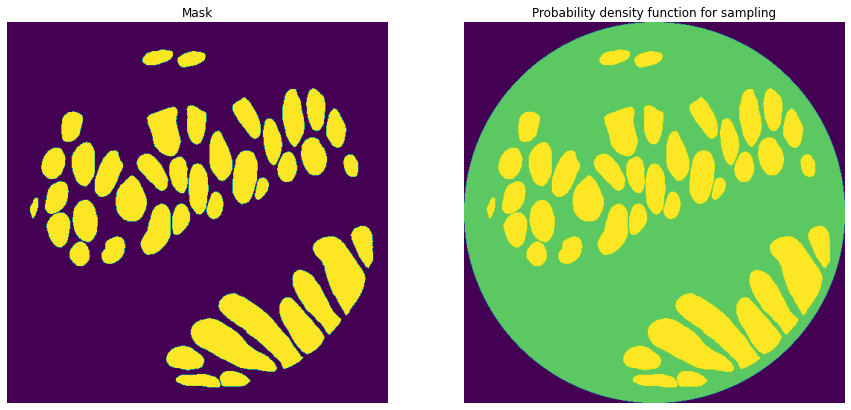

id                                                               9791
organ                                                          kidney
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 334733 33 337729 43 340729 43 343725 51 346723...
age                                                              28.0
sex                                                              Male
Name: 349, dtype: object
9791
Saving msk
Resizing PDF
Saving pdf cumsum


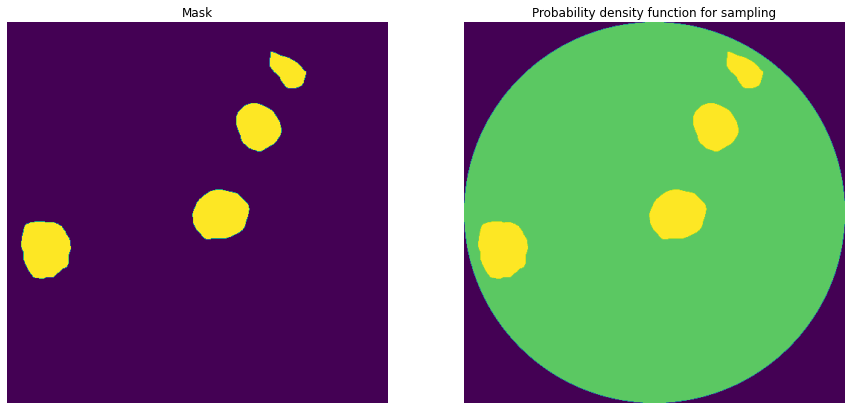

id                                                               9904
organ                                                  largeintestine
data_source                                                       HPA
img_height                                                       3000
img_width                                                        3000
pixel_size                                                        0.4
tissue_thickness                                                    4
rle                 1009165 7 1012149 28 1015140 38 1018127 51 102...
age                                                              84.0
sex                                                              Male
Name: 350, dtype: object
9904
Saving msk
Resizing PDF
Saving pdf cumsum


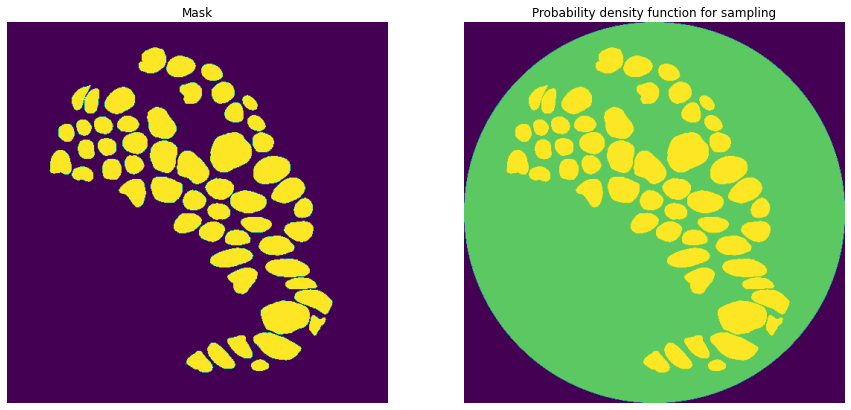

In [17]:
# for _, row in df.iterrows():
    
#     print(row)

#     idx = row.id
#     print(idx)
    

#     with open(path/f'{idx}.json') as f:
#         shapes = json.load(f)
    
#     all_pol = []

#     for shape in shapes:
#         shape = shape['geometry']['coordinates']
#         if len(shape)>1:
#             shape =shape[0]
#         shape_numpy = np.array(shape,dtype=object)
#         shape_numpy = shape_numpy.squeeze()

#         pol = Polygon(shape_numpy)
#         all_pol.append(pol)
#     all_polygons = MultiPolygon(all_pol)
#     if not all_polygons.is_valid:
#         all_polygons = all_polygons.buffer(0)
#     # Sometimes buffer() converts a simple Multipolygon to just a Polygon,
#     # need to keep it a Multi throughout
#     if all_polygons.type == 'Polygon':
#         all_polygons = MultiPolygon([all_polygons])
#     im_size = dic_shape2[idx]
#     msk = polygons_to_mask(all_polygons)
    
    
#     # Plot
#     fig, ax = plt.subplots(ncols=2, figsize=(15,15))
#     resize_w = int((msk.shape[1]/msk.shape[0])*resize)
#     ax[0].imshow(cv2.resize(msk, dsize=(resize_w, resize)))
#     ax[0].set_title('Mask')
#     ax[0].set_axis_off()
    
# #     fig, ax = plt.subplots(figsize=(7,7))
# #     resize_w = int((msk.shape[1]/msk.shape[0])*resize)
# #     ax.imshow(cv2.resize(msk, dsize=(resize_w, resize)))
# #     ax.set_title('Mask')
# #     ax.set_axis_off()
    
# #     anatomy = grp_anatomy[idx][:]
    
#     if scale:
#         new_size = (msk.shape[1] // scale, msk.shape[0] // scale)
#         print('Scaling to', new_size)
#         msk = cv2.resize(msk, new_size)
    
#     anatomy=msk*1.0
#     rr, cc = disk((msk.shape[0]/2, msk.shape[1]/2),msk.shape[0]/2 )
#     anatomy[rr,cc]=0.75
#     anatomy[anatomy==0]=0.01
#     anatomy[msk>0]=1
    
# #         anatomy = cv2.resize(anatomy, new_size)
        
# #     anatomy = anatomy.astype('float16')     
# #     anatomy[anatomy==0] = weight_dict['fbr']
# #     anatomy[anatomy==1] = weight_dict['cortex_value']
# #     anatomy[msk>0] = 1
    
#     print('Saving msk')
#     g_msk[idx] = msk
#     del msk
#     gc.collect()

#     if resize:
#         print('Resizing PDF')
#         if anatomy.shape[0]>resize:
#             resize_w = int((anatomy.shape[1]/anatomy.shape[0])*resize)
#             anatomy = cv2.resize(anatomy[:].astype('float32'), dsize=(resize_w, resize))
            
#     ax[1].imshow(anatomy)
#     ax[1].set_title('Probability density function for sampling')
#     ax[1].set_axis_off() 
            
#     print('Saving pdf cumsum')
#     g_pdf[idx] = np.cumsum(anatomy/np.sum(anatomy)) 

#     plt.show()